# 获取奖学金信息

### 环境准备

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

### 连接数据库

In [ ]:
import sqlite3
conn = sqlite3.connect("../db.sqlite3")
cur = conn.cursor()
table_name = cur.execute("select name from sqlite_master where type='table' order by name").fetchall()
table_name

In [4]:
cur.execute("PRAGMA table_info(account_profile_awardHistory)")
cur.fetchall()

[(0, 'id', 'integer', 1, None, 1),
 (1, 'awardName', 'varchar(25)', 1, None, 0),
 (2, 'AwardID_id', 'integer', 1, None, 0),
 (3, 'AwardYear_id', 'integer', 1, None, 0)]

In [6]:
cur.execute("PRAGMA table_info(account_profile_awardHistory_User)")
cur.fetchall()

[(0, 'id', 'integer', 1, None, 1),
 (1, 'awardhistory_id', 'integer', 1, None, 0),
 (2, 'user_id', 'integer', 1, None, 0)]

### AwardHistory 的CSV

In [7]:
csv_head1 = ["id", "awardName"]
record = conn.execute("select {} from account_profile_awardHistory".format(",".join(csv_head1)))

In [14]:
import csv

def save_csv(record, csv_head, csv_name):
    with open(csv_name, "w", newline="") as f:
        ff = csv.writer(f)
        ff.writerow(csv_head)
        ff.writerows(record)


def read_record(csv_name, csv_head):
    df_record = pd.read_csv(csv_name, header=0, encoding="utf-8")
    mapping = list(map(lambda x:False if x < 1 else True, [i for i in range(0, len(csv_head))]))
#     df_one_hot = pd.factorize(df_record.loc[:, mapping].copy())
    df_fact = df_record.loc[:, mapping].copy()
    df_one_hot = pd.get_dummies(df_record.loc[:, mapping].copy())
    return df_record, df_one_hot, df_fact

In [12]:
save_csv(record, csv_head1, "award_awardName.csv")

In [15]:
df_record, df_record_one_hot, df_record_fact = read_record("award_awardName.csv", csv_head1)
df_record_fact.columns

Index(['awardName'], dtype='object')

In [16]:
for i in df_record_fact.columns:
    df_record_fact[i] = pd.Series(pd.factorize(df_record_fact[i])[0])

In [17]:
df_record_one_hot['id'] = df_record.loc[:, ["id"]]
df_record_one_hot = df_record_one_hot.sort_values("id").reset_index(drop=True)
df_record_one_hot.to_csv("awardname_one_hot.csv")

In [18]:
df_record_fact["id"] = df_record.loc[:, ['id']]
df_record_fact = df_record_fact.sort_values("id").reset_index(drop=True)
df_record_fact.to_csv("awardname_fact.csv")

### AwardUser 的CSV

In [29]:
csv_head2 = ["id", "awardhistory_id", "user_id"]
record = conn.execute("select {} from account_profile_awardHistory_User".format(",".join(csv_head2)))

In [20]:
save_csv(record, csv_head2, "award_user.csv")

In [30]:
user_award = record.fetchall()

In [26]:
df_record_fact

,awardName,id
0,0,1
1,1,2
2,2,3
3,3,4
4,2,5
...,...,...
179,3,180
180,3,181
181,3,182
182,3,183


In [35]:
df_user = pd.DataFrame(user_award, columns=["id", "award_id", "user_id"])

In [38]:
df_user = df_user.drop(["id"], axis=1)

In [40]:
df_record_fact.rename({"id": "award_id"}, axis=1, inplace=True)

In [44]:
df_user = df_user.merge(df_record_fact, how='inner', on='award_id')

In [48]:
df_user.groupby('awardName').count()

,award_id,user_id
awardName,,
0,4,4
1,27,27
2,40,40
3,86,86
4,8,8
5,4,4
6,11,11
7,3,3
8,1,1


In [49]:
import csv

In [110]:
df_user = df_user.sort_values("user_id").reset_index(drop=True)
df_user.to_csv("award_user_base.csv")

### 导出大CSV

In [111]:
df_user = pd.read_csv("award_user_base.csv", header=0, encoding='utf-8').drop(["Unnamed: 0"], axis=1)

In [52]:
df_all_fact_csv_head = ['user_id', 'award_id', 
                        'competition_count', 'competition_competeRange_0', 'competition_awardLevel_0', 'competition_labels_0', 'competition_competeRange_1', 'competition_awardLevel_1', 'competition_labels_1', 'competition_competeRange_2', 'competition_awardLevel_2', 'competition_labels_2',
                        'honortitle_count', 'honortitle_honorRank_0', 'honortitle_honorRank_1', 'honortitle_honorRank_2',
                        'otherachievements_count', 'otherachievements_honorRank_0', 'otherachievements_honorRank_1', 'otherachievements_honorRank_2',
                        'paper_count', 'paper_authOrder_0', 'paper_conferenceChoice_0', 'paper_labels_0', 'paper_authOrder_1', 'paper_conferenceChoice_1', 'paper_labels_1', 'paper_authOrder_2', 'paper_conferenceChoice_2', 'paper_labels_2',
                        'patent_count', 'patent_0', 'patent_1', 'patent_2',
                        'researchaward_count', 'researchaward_competeRange_0', 'researchaward_awardLevel_0', 'researchaward_labels_0', 'researchaward_competeRange_1', 'researchaward_awardLevel_1', 'researchaward_labels_1', 'researchaward_competeRange_2', 'researchaward_awardLevel_2', 'researchaward_labels_2',
                        'researchproject_count', 'researchproject_type_0', 'researchproject_type_1', 'researchproject_type_2'
                       ]

In [99]:
def to_csv_head(csv_name, csv_head, class_num=3):
    df_record = pd.read_csv(csv_name, header=0, encoding='utf-8')
    csv_head_n = df_record.columns[1: -1]
    csv_name_s = csv_name.split("_fact")[0]
    csv_head.append(csv_name_s + "_count")
    for i in range(0, class_num):
        for k in csv_head_n:
            csv_head.append(csv_name_s + "_" + k + "_" + str(i))
    return csv_head

In [227]:
csv_head = ['user_id', 'award_id']
csv_head = to_csv_head("paper_factorize_kmeans.csv", csv_head)
csv_head = to_csv_head("patent_record_fact.csv", csv_head)
csv_head = to_csv_head("research_fact_kmeans.csv", csv_head)
csv_head = to_csv_head("research_project_fact.csv", csv_head)
csv_head = to_csv_head("competition_fact_kmeans.csv", csv_head)
csv_head = to_csv_head("honor_title_fact.csv", csv_head)
csv_head = to_csv_head("other_achievements_fact.csv", csv_head)
csv_head

['user_id',
 'award_id',
 'paper_count',
 'paper_authOrder_0',
 'paper_conferenceChoice_0',
 'paper_labels_0',
 'paper_authOrder_1',
 'paper_conferenceChoice_1',
 'paper_labels_1',
 'paper_authOrder_2',
 'paper_conferenceChoice_2',
 'paper_labels_2',
 'patent_record_count',
 'patent_record_classify_0',
 'patent_record_classify_1',
 'patent_record_classify_2',
 'research_count',
 'research_competeRange_0',
 'research_awardLevel_0',
 'research_labels_0',
 'research_competeRange_1',
 'research_awardLevel_1',
 'research_labels_1',
 'research_competeRange_2',
 'research_awardLevel_2',
 'research_labels_2',
 'research_project_count',
 'research_project_projectType_0',
 'research_project_projectType_1',
 'research_project_projectType_2',
 'competition_count',
 'competition_competeRange_0',
 'competition_awardLevel_0',
 'competition_labels_0',
 'competition_competeRange_1',
 'competition_awardLevel_1',
 'competition_labels_1',
 'competition_competeRange_2',
 'competition_awardLevel_2',
 'compe

### 构建df_all

In [228]:
df_all = pd.DataFrame(columns=csv_head)

In [229]:
df_all['user_id'] = df_user['user_id']
df_all['award_id'] = df_user['awardName']

In [230]:
df_all

,user_id,award_id,paper_count,paper_authOrder_0,paper_conferenceChoice_0,paper_labels_0,paper_authOrder_1,paper_conferenceChoice_1,paper_labels_1,paper_authOrder_2,...,competition_awardLevel_2,competition_labels_2,honor_title_count,honor_title_honorRank_0,honor_title_honorRank_1,honor_title_honorRank_2,other_achievements_count,other_achievements_honorRank_0,other_achievements_honorRank_1,other_achievements_honorRank_2
0,2993,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2995,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2997,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3001,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3005,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179,4357,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
180,4367,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
181,4392,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
182,4398,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [211]:
df_all.to_csv("df_all_fact_to_csv.csv")

### Testing

In [238]:
df_all = pd.read_csv("df_all_fact_to_csv.csv", header=0, encoding='utf-8').drop(["Unnamed: 0"], axis=1)

In [237]:
def filling_df_fact(df_all, df_single_name):
    df_single = pd.read_csv(df_single_name, header=0, encoding='utf-8').drop(["Unnamed: 0"], axis=1)
    count_num = -1
    index = 0
    previous_user_id = -1
    for ix, row in df_single.iterrows():
        
        # 很扯淡,但是确实如此,有的人奖学金数据为空,没有去掉这些人的论文等信息,所以手动处理一下,手动删除那几行就是王道,3889 & 3897, 并且防止长度过长进行修正
        if row['user_id'] == 3897 or row['user_id'] == 3889 or count_num > 2:
            continue
        
        if row['user_id'] == previous_user_id:
            count_num += 1
        else:
            list_name = df_single_name.split("_fact")[0] + "_count" 
            df_all.loc[index, list_name] = count_num + 1
            count_num = 0
        
        while df_all.loc[index, :]['user_id'] != row['user_id']:
            index += 1
#             print("a" + str(df_all.loc[index, :]['user_id']))
        
        def fillin():
            column_names = df_single.columns[: -1]
            for column in column_names:
                column_name = df_single_name.split("_fact")[0] + "_" + column + "_" + str(count_num)
                df_all.loc[index, column_name] = row[column] + 1
        
        fillin()
        previous_user_id = row['user_id']
    return df_all.copy()

In [239]:
df_all = filling_df_fact(df_all, "paper_factorize_sc.csv")
df_all = filling_df_fact(df_all, "patent_record_fact.csv")
df_all = filling_df_fact(df_all, "competition_fact_spectral.csv")
df_all = filling_df_fact(df_all, "honor_title_fact.csv")
df_all = filling_df_fact(df_all, "research_fact_sc.csv")
df_all = filling_df_fact(df_all, "research_project_fact.csv")
df_all = filling_df_fact(df_all, "other_achievements_fact.csv")

### 保存、读取CSV

In [241]:
df_all.to_csv("48_features.csv")

In [2]:
df_all = pd.read_csv("48_features.csv", header=0, encoding="utf-8").drop(["Unnamed: 0"], axis=1)

### 填充缺失值

In [3]:
df_all.fillna(0, inplace=True)

### 将float 转化为int

In [4]:
df_all = df_all.astype("int32")

In [5]:
df_all

,user_id,award_id,paper_count,paper_authOrder_0,paper_conferenceChoice_0,paper_labels_0,paper_authOrder_1,paper_conferenceChoice_1,paper_labels_1,paper_authOrder_2,...,competition_awardLevel_2,competition_labels_2,honor_title_count,honor_title_honorRank_0,honor_title_honorRank_1,honor_title_honorRank_2,other_achievements_count,other_achievements_honorRank_0,other_achievements_honorRank_1,other_achievements_honorRank_2
0,2993,3,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2995,3,1,2,2,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2997,2,0,0,0,0,0,0,0,0,...,0,0,2,5,3,0,0,0,0,0
3,3001,3,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,3,0,0
4,3005,2,2,2,7,5,2,7,5,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179,4357,7,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
180,4367,7,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
181,4392,6,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
182,4398,5,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# 模型调参与训练

##### label个数 >= 10 的dataset

In [36]:
df_all.groupby("award_id")["award_id"].count()

award_id
0     4
1    27
2    40
3    86
4     8
5     4
6    11
7     3
8     1
Name: award_id, dtype: int64

In [7]:
labels_grt_10 = [i[0] for i in list(zip([i for i in range(0, 9)], list(df_all.groupby("award_id")['award_id'].count() > 10))) if i[1]]

In [19]:
df_10 = pd.DataFrame(columns=df_all.columns)

In [20]:
for index, row in df_all.iterrows():
    if row["award_id"] in labels_grt_10:
        df_10 = df_10.append(row, ignore_index=True)

In [21]:
df_10.fillna(0, inplace=True)

In [22]:
df_10 = df_10.astype("int32")

In [23]:
df_10

,user_id,award_id,paper_count,paper_authOrder_0,paper_conferenceChoice_0,paper_labels_0,paper_authOrder_1,paper_conferenceChoice_1,paper_labels_1,paper_authOrder_2,...,competition_awardLevel_2,competition_labels_2,honor_title_count,honor_title_honorRank_0,honor_title_honorRank_1,honor_title_honorRank_2,other_achievements_count,other_achievements_honorRank_0,other_achievements_honorRank_1,other_achievements_honorRank_2
0,2993,3,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2995,3,1,2,2,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2997,2,0,0,0,0,0,0,0,0,...,0,0,2,5,3,0,0,0,0,0
3,3001,3,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,3,0,0
4,3005,2,2,2,7,5,2,7,5,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
159,4330,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
160,4341,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
161,4349,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
162,4392,6,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


##### label个数为2 3(特等与其他)

In [6]:
df_2 = pd.DataFrame(columns=df_all.columns)

In [7]:
for index, row in df_all.iterrows():
    if row["award_id"] in [2, 3]:
        df_2 = df_2.append(row, ignore_index=True)

In [8]:
df_2.fillna(0, inplace=True)
df_2 = df_2.astype("int32")

### 读取数据集

In [9]:
def data_to_read(name):
    return eval(name)

In [10]:
# data = data_to_read("df_10")
df = data_to_read("df_2")

df_labels = df["award_id"]
df_user_id = df["user_id"]

In [11]:
df.drop(columns=["award_id", "user_id"], axis=1, inplace=True)

### XGBoost

In [13]:
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import KFold, StratifiedKFold, train_test_split, cross_val_score
import matplotlib.pyplot as plt
import seaborn as sns
# from xgboost.sklearn import XGBClassifier
import gc
from xgboost import plot_importance
from sklearn.metrics import accuracy_score, auc, roc_auc_score, roc_curve, mean_squared_error, zero_one_loss

##### one-hot

In [14]:
num_round = 1000

data = df.copy()

## category feature one_hot
cate_feature = df.columns
for item in cate_feature:
    data[item] = LabelEncoder().fit_transform(data[item])
    item_dummies = pd.get_dummies(data[item])
    item_dummies.columns = [item + str(i + 1) for i in range(item_dummies.shape[1])]
    data = pd.concat([data, item_dummies], axis=1)
data.drop(cate_feature,axis=1,inplace=True)

##### fact

In [69]:
num_round = 1000

data = df.copy()

##### training_set - test_set

In [15]:
data_y = df_labels.factorize()[0]

In [16]:
train_x, test_x, train_y, test_y = train_test_split(data, data_y, test_size=0.1, random_state=100)

In [20]:
from xgboost.sklearn import XGBClassifier
model = XGBClassifier(n_estimators = 382,
                            max_depth = 0,
                            learning_rate = 0.3,
                            gamma = 1.0,
                            min_child_weight = 1.0,
                            subsample = 0.7,
                            colsample_bytree = 0.7
                     )
model.fit(train_x, train_y)

XGBClassifier(colsample_bytree=0.7, gamma=1.0, learning_rate=0.3, max_depth=0,
              min_child_weight=1.0, n_estimators=382, subsample=0.7)

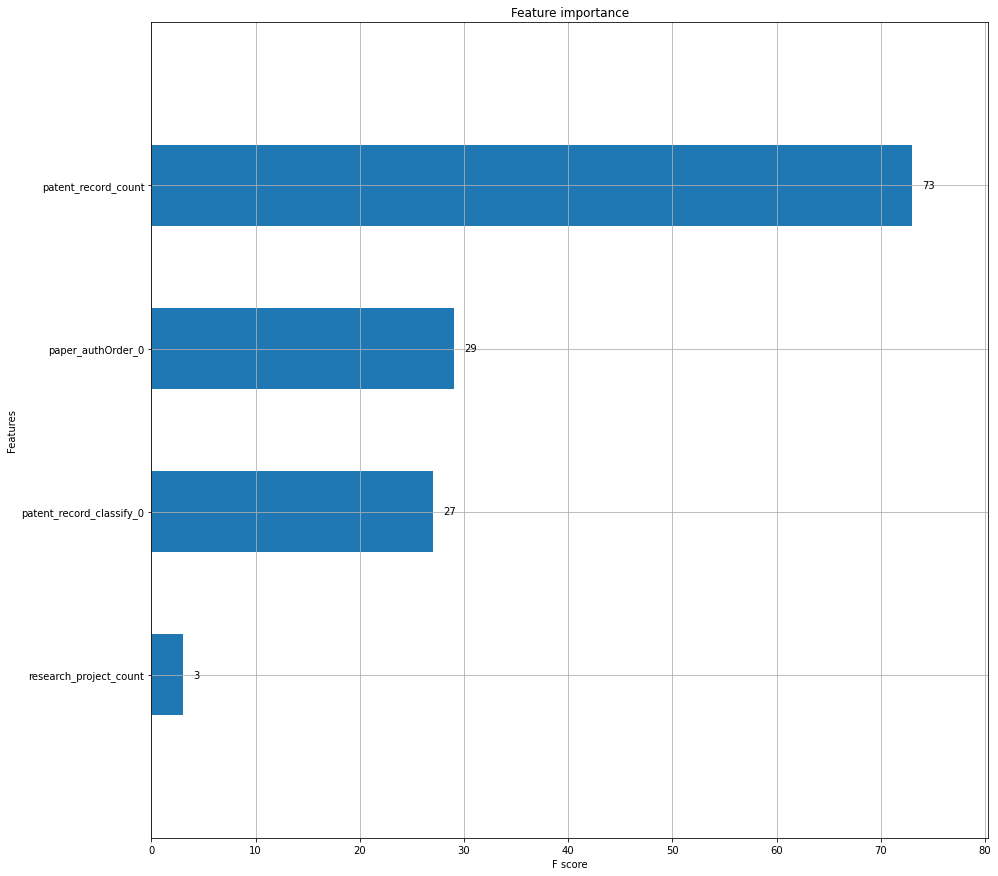

In [73]:
fig,ax = plt.subplots(figsize=(15,15))
plot_importance(model,
                height=0.5,
                ax=ax,
                max_num_features=20)
plt.show()

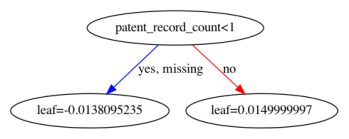

In [88]:
xgb.plot_tree(bst, num_trees=1)

In [75]:
params = {
    'booster': 'gbtree',
    'objective': 'multi:softmax',
    # 'objective': 'multi:softprob',   #Multiclassification probability
    'num_class': 2,
    'eval_metric': 'mlogloss',
    'gamma': 0.1,
    'max_depth': 8,
    'alpha': 0,
    'lambda': 0,
    'subsample': 0.7,
    'colsample_bytree': 0.5,
    'min_child_weight': 3,
    'silent': 0,
    'eta': 0.007,
    'nthread': -1,
    'missing': 1,
    'seed': 2019,
}

xgb_train=xgb.DMatrix(train_x,label=train_y)
xgb_test=xgb.DMatrix(test_x,label=test_y)

watchlist=[(xgb_train,'train'),(xgb_test,'test')]
num_round=60
bst=xgb.train(params, xgb_train, num_round, watchlist)

pred=bst.predict(xgb_test)
print(pred)

error_rate=np.sum(pred!=test_y)/test_y.shape[0]

print('测试集错误率(softmax):{}'.format(error_rate))

accuray=1-error_rate
print('测试集准确率：%.4f' %accuray)

[0]	train-mlogloss:0.687126	test-mlogloss:0.686838
[1]	train-mlogloss:0.682519	test-mlogloss:0.681966
[2]	train-mlogloss:0.678936	test-mlogloss:0.678138
[3]	train-mlogloss:0.675991	test-mlogloss:0.674984
[4]	train-mlogloss:0.673418	test-mlogloss:0.672225
[5]	train-mlogloss:0.670287	test-mlogloss:0.668922
[6]	train-mlogloss:0.666531	test-mlogloss:0.66483
[7]	train-mlogloss:0.663944	test-mlogloss:0.662048
[8]	train-mlogloss:0.66104	test-mlogloss:0.658862
[9]	train-mlogloss:0.659338	test-mlogloss:0.657029
[10]	train-mlogloss:0.656293	test-mlogloss:0.653813
[11]	train-mlogloss:0.653427	test-mlogloss:0.650778
[12]	train-mlogloss:0.651694	test-mlogloss:0.648905
[13]	train-mlogloss:0.649767	test-mlogloss:0.646875
[14]	train-mlogloss:0.647503	test-mlogloss:0.644491
[15]	train-mlogloss:0.645883	test-mlogloss:0.642735
[16]	train-mlogloss:0.64438	test-mlogloss:0.641103
[17]	train-mlogloss:0.642543	test-mlogloss:0.639069
[18]	train-mlogloss:0.640545	test-mlogloss:0.636969
[19]	train-mlogloss:0.638

[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0.]
测试集错误率(softmax):0.2777777777777778
测试集准确率：0.7222


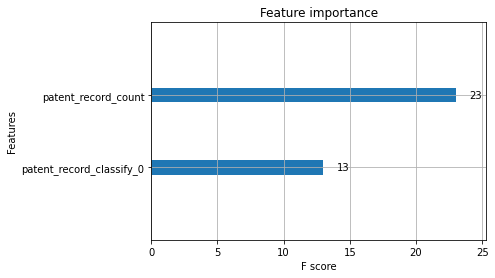

In [76]:
pred = bst.predict(xgb.DMatrix(data, label=data_y))

print(pred)

error_rate=np.sum(pred!=data_y)/data_y.shape[0]

print('测试集错误率(softmax):{}'.format(error_rate))

accuray=1-error_rate
print('测试集准确率：%.4f' %accuray)

xgb.plot_importance(bst, max_num_features=25)

fold 1
[0]	train-mlogloss:0.686384	valid-mlogloss:0.693274
Multiple eval metrics have been passed: 'valid-mlogloss' will be used for early stopping.

Will train until valid-mlogloss hasn't improved in 50 rounds.
[20]	train-mlogloss:0.619548	valid-mlogloss:0.715882
[40]	train-mlogloss:0.594301	valid-mlogloss:0.747806
Stopping. Best iteration:
[0]	train-mlogloss:0.686384	valid-mlogloss:0.693274

fold 2
[0]	train-mlogloss:0.687581	valid-mlogloss:0.681953
Multiple eval metrics have been passed: 'valid-mlogloss' will be used for early stopping.

Will train until valid-mlogloss hasn't improved in 50 rounds.
[20]	train-mlogloss:0.646945	valid-mlogloss:0.59315
[40]	train-mlogloss:0.632403	valid-mlogloss:0.548139
[59]	train-mlogloss:0.627448	valid-mlogloss:0.525528
fold 3
[0]	train-mlogloss:0.688273	valid-mlogloss:0.693224
Multiple eval metrics have been passed: 'valid-mlogloss' will be used for early stopping.

Will train until valid-mlogloss hasn't improved in 50 rounds.
[20]	train-mlogloss:0

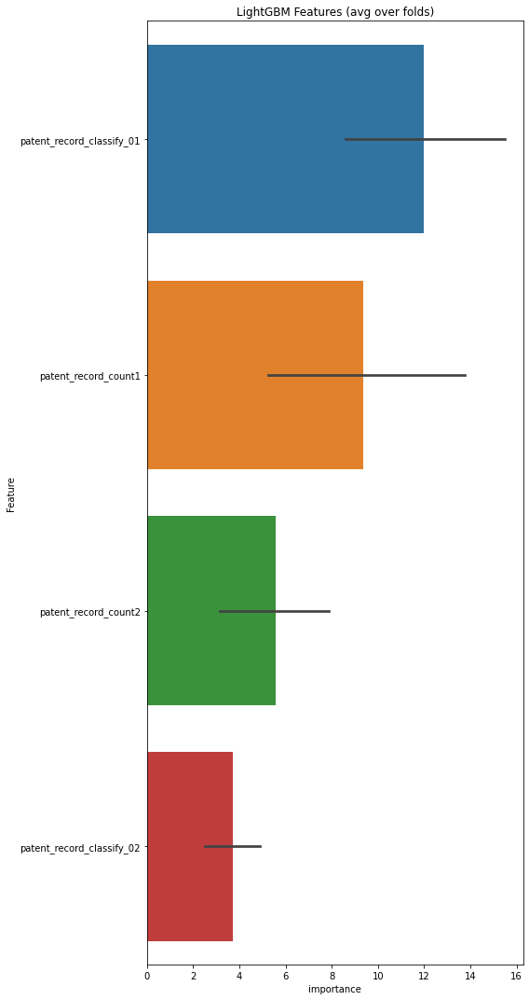

In [54]:
params = {
    'booster': 'gbtree',
    'objective': 'multi:softmax',
    # 'objective': 'multi:softprob',   #Multiclassification probability
    'num_class': 2,
    'eval_metric': 'mlogloss',
    'gamma': 0.1,
    'max_depth': 8,
    'alpha': 0,
    'lambda': 0,
    'subsample': 0.7,
    'colsample_bytree': 0.5,
    'min_child_weight': 3,
    'silent': 0,
    'eta': 0.03,
    'nthread': -1,
    'missing': 1,
    'seed': 2019,
}

folds = KFold(n_splits=10, shuffle=True, random_state=2019)

# forming new empty arrays
prob_oof = np.zeros(train_x.shape[0])
test_pred_prob = np.zeros(test_x.shape[0])


## train and predict
feature_importance_df = pd.DataFrame()
for fold_, (trn_idx, val_idx) in enumerate(folds.split(train_x)):
    print("fold {}".format(fold_ + 1))
    trn_data = xgb.DMatrix(train_x.iloc[trn_idx], label=train_y[trn_idx])
    val_data = xgb.DMatrix(train_x.iloc[val_idx], label=train_y[val_idx])

    watchlist = [(trn_data, 'train'), (val_data, 'valid')]
    clf = xgb.train(params, trn_data, num_round, watchlist, verbose_eval=20, early_stopping_rounds=50)

    prob_oof[val_idx] = clf.predict(xgb.DMatrix(train_x.iloc[val_idx]), ntree_limit=clf.best_ntree_limit)
    fold_importance_df = pd.DataFrame()
    fold_importance_df["Feature"] = clf.get_fscore().keys()
    fold_importance_df["importance"] = clf.get_fscore().values()
    fold_importance_df["fold"] = fold_ + 1
    feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)

    test_pred_prob += clf.predict(xgb.DMatrix(test_x), ntree_limit=clf.best_ntree_limit) / folds.n_splits
result = np.argmax(test_pred_prob, axis=0)


## plot feature importance
cols = (feature_importance_df[["Feature", "importance"]].groupby("Feature").mean().sort_values(by="importance", ascending=False).index)
best_features = feature_importance_df.loc[feature_importance_df.Feature.isin(cols)].sort_values(by='importance',ascending=False)
plt.figure(figsize=(8, 15))
sns.barplot(y="Feature",
            x="importance",
            data=best_features.sort_values(by="importance", ascending=False))
plt.title('LightGBM Features (avg over folds)')
plt.tight_layout()


#### hyperopt自动调参

In [17]:
import hyperopt
from hyperopt import fmin, tpe, hp, partial, STATUS_OK, Trials
import warnings
from xgboost import XGBClassifier

In [19]:
def objective(space):

    warnings.filterwarnings(action='ignore', category=DeprecationWarning)
    classifier = xgb.XGBClassifier(n_estimators = space['n_estimators'],
                            max_depth = int(space['max_depth']),
                            learning_rate = space['learning_rate'],
                            gamma = space['gamma'],
                            min_child_weight = space['min_child_weight'],
                            subsample = space['subsample'],
                            colsample_bytree = space['colsample_bytree'],
                            num_class=2,
                            )
    
    classifier.fit(train_x, train_y)

    # Applying k-Fold Cross Validation
#     from sklearn.model_selection import cross_val_score
#     accuracies = cross_val_score(estimator = classifier, X = train_x, y = train_y, cv = 10)
#     CrossValMean = accuracies.mean()
    score = roc_auc_score(y_valid, predictions)

    print("CrossValMean:", CrossValMean)

    return{'loss':1-CrossValMean, 'status': STATUS_OK }

space = {
    'max_depth' : hp.choice('max_depth', range(5, 30, 1)),
    'learning_rate' : hp.quniform('learning_rate', 0.01, 0.5, 0.01),
    'n_estimators' : hp.choice('n_estimators', range(20, 205, 5)),
    'gamma' : hp.quniform('gamma', 0, 0.50, 0.01),
    'min_child_weight' : hp.quniform('min_child_weight', 1, 10, 1),
    'subsample' : hp.quniform('subsample', 0.1, 1, 0.01),
    'colsample_bytree' : hp.quniform('colsample_bytree', 0.1, 1.0, 0.01)}

trials = Trials()
best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=50,
            trials=trials)

print("Best: ", best)


# Fitting XGBoost to the Training set
from xgboost import XGBClassifier
classifier = XGBClassifier(n_estimators = best['n_estimators'],
                            max_depth = best['max_depth'],
                            learning_rate = best['learning_rate'],
                            gamma = best['gamma'],
                            min_child_weight = best['min_child_weight'],
                            subsample = best['subsample'],
                            colsample_bytree = best['colsample_bytree']
                            )

classifier.fit(train_x, train_y)

# Applying k-Fold Cross Validation
from sklearn.model_selection import cross_val_score
accuracies = cross_val_score(estimator = classifier, X = train_x, y = train_y, cv = 10)
CrossValMean = accuracies.mean()
print("Final CrossValMean: ", CrossValMean)

CrossValSTD = accuracies.std()

# Predicting the Test set results
y_pred = classifier.predict(test_x)
y_pred = pd.DataFrame(y_pred)

CrossValMean:                                         
0.690909090909091                                     
CrossValMean:                                                                    
0.690909090909091                                                                
CrossValMean:                                                                    
0.690909090909091                                                                
CrossValMean:                                                                    
0.690909090909091                                                                
CrossValMean:                                                                    
0.690909090909091                                                                
CrossValMean:                                                                    
0.690909090909091                                                                
CrossValMean:                                                         

In [20]:
y_pred

,0
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,0
9,0


In [22]:
len(test_y)

13

In [23]:
accuracy_score(y_pred, test_y)

0.6923076923076923

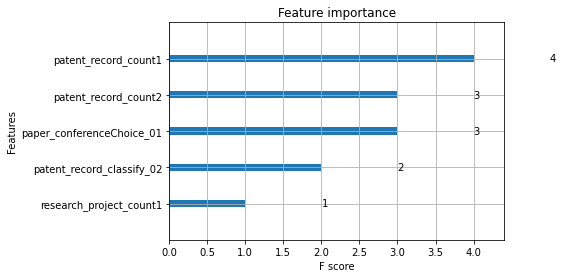

In [24]:
xgb.plot_importance(classifier)

AttributeError: 'AxesSubplot' object has no attribute 'savefig'

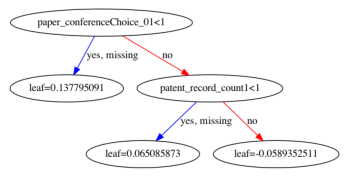

In [42]:
xgb.plot_tree(classifier, num_trees=8)

In [44]:

SEED = 314159265

def score(params):
    print("Training with params: ")
    print(params)
    num_round = int(params['n_estimators'])
    del params['n_estimators']
    dtrain = xgb.DMatrix(train_x, label=train_y)
    dvalid = xgb.DMatrix(test_x, label=test_y)
    watchlist = [(dvalid, 'eval'), (dtrain, 'train')]
    gbm_model = xgb.train(params, dtrain, num_round,
                          evals=watchlist,
                          verbose_eval=True)
    predictions = gbm_model.predict(dvalid,
                                    ntree_limit=gbm_model.best_iteration + 1)
    score = roc_auc_score(test_y, predictions)
    # TODO: Add the importance for the selected features
    print("\tScore {0}\n\n".format(score))
    # The score function should return the loss (1-score)
    # since the optimize function looks for the minimum
    loss = 1 - score
    return {'loss': loss, 'status': STATUS_OK}


def optimize(
             #trials, 
             random_state=SEED):
    """
    This is the optimization function that given a space (space here) of 
    hyperparameters and a scoring function (score here), finds the best hyperparameters.
    """
    # To learn more about XGBoost parameters, head to this page: 
    # https://github.com/dmlc/xgboost/blob/master/doc/parameter.md
    space = {
        'n_estimators': hp.quniform('n_estimators', 100, 1000, 1),
        'eta': hp.quniform('eta', 0.025, 0.5, 0.025),
        # A problem with max_depth casted to float instead of int with
        # the hp.quniform method.
        'max_depth':  hp.choice('max_depth', np.arange(1, 14, dtype=int)),
        'min_child_weight': hp.quniform('min_child_weight', 1, 6, 1),
        'subsample': hp.quniform('subsample', 0.5, 1, 0.05),
        'gamma': hp.quniform('gamma', 0.5, 1, 0.05),
        'colsample_bytree': hp.quniform('colsample_bytree', 0.5, 1, 0.05),
        'eval_metric': 'auc',
        'objective': 'binary:logistic',
        # Increase this number if you have more cores. Otherwise, remove it and it will default 
        # to the maxium number. 
        'nthread': 4,
        'booster': 'gbtree',
        'tree_method': 'exact',
        'silent': 1,
        'seed': random_state
    }
    # Use the fmin function from Hyperopt to find the best hyperparameters
    best = fmin(score, space, algo=tpe.suggest, 
                # trials=trials, 
                max_evals=250)
    return best

In [45]:
best_hyperparams = optimize(
                            #trials
                            )
print("The best hyperparameters are: ", "\n")
print(best_hyperparams)

Training with params:                                  
{'booster': 'gbtree', 'colsample_bytree': 0.9500000000000001, 'eta': 0.47500000000000003, 'eval_metric': 'auc', 'gamma': 0.9500000000000001, 'max_depth': 11, 'min_child_weight': 3.0, 'n_estimators': 778.0, 'nthread': 4, 'objective': 'binary:logistic', 'seed': 314159265, 'silent': 1, 'subsample': 0.8, 'tree_method': 'exact'}
[0]	eval-auc:0.5	train-auc:0.5                         

[1]	eval-auc:0.5	train-auc:0.5                         

[2]	eval-auc:0.5	train-auc:0.5                         

[3]	eval-auc:0.5	train-auc:0.5                         

[4]	eval-auc:0.5	train-auc:0.5                         

[5]	eval-auc:0.5	train-auc:0.5                         

[6]	eval-auc:0.5	train-auc:0.5                         

[7]	eval-auc:0.5	train-auc:0.5                         

[8]	eval-auc:0.5	train-auc:0.5                         

[9]	eval-auc:0.5	train-auc:0.5                         

[10]	eval-auc:0.5	train-auc:0.5                 

[280]	eval-auc:0.5	train-auc:0.5                       

[281]	eval-auc:0.5	train-auc:0.5                       

[282]	eval-auc:0.5	train-auc:0.5                       

[283]	eval-auc:0.5	train-auc:0.5                       

[284]	eval-auc:0.5	train-auc:0.5                       

[285]	eval-auc:0.5	train-auc:0.5                       

[286]	eval-auc:0.5	train-auc:0.5                       

[287]	eval-auc:0.5	train-auc:0.5                       

[288]	eval-auc:0.5	train-auc:0.5                       

[289]	eval-auc:0.5	train-auc:0.5                       

[290]	eval-auc:0.5	train-auc:0.5                       

[291]	eval-auc:0.5	train-auc:0.5                       

[292]	eval-auc:0.5	train-auc:0.5                       

[293]	eval-auc:0.5	train-auc:0.5                       

[294]	eval-auc:0.5	train-auc:0.5                       

[295]	eval-auc:0.5	train-auc:0.5                       

[296]	eval-auc:0.5	train-auc:0.5                       

[297]	eval-auc:0.5	train-auc:0.

[566]	eval-auc:0.5	train-auc:0.5                       

[567]	eval-auc:0.5	train-auc:0.5                       

[568]	eval-auc:0.5	train-auc:0.5                       

[569]	eval-auc:0.5	train-auc:0.5                       

[570]	eval-auc:0.5	train-auc:0.5                       

[571]	eval-auc:0.5	train-auc:0.5                       

[572]	eval-auc:0.5	train-auc:0.5                       

[573]	eval-auc:0.5	train-auc:0.5                       

[574]	eval-auc:0.5	train-auc:0.5                       

[575]	eval-auc:0.5	train-auc:0.5                       

[576]	eval-auc:0.5	train-auc:0.5                       

[577]	eval-auc:0.5	train-auc:0.5                       

[578]	eval-auc:0.5	train-auc:0.5                       

[579]	eval-auc:0.5	train-auc:0.5                       

[580]	eval-auc:0.5	train-auc:0.5                       

[581]	eval-auc:0.5	train-auc:0.5                       

[582]	eval-auc:0.5	train-auc:0.5                       

[583]	eval-auc:0.5	train-auc:0.

[56]	eval-auc:0.5	train-auc:0.5                                   

[57]	eval-auc:0.5	train-auc:0.5                                   

[58]	eval-auc:0.5	train-auc:0.5                                   

[59]	eval-auc:0.5	train-auc:0.5                                   

[60]	eval-auc:0.5	train-auc:0.5                                   

[61]	eval-auc:0.5	train-auc:0.5                                   

[62]	eval-auc:0.5	train-auc:0.5                                   

[63]	eval-auc:0.5	train-auc:0.5                                   

[64]	eval-auc:0.5	train-auc:0.5                                   

[65]	eval-auc:0.5	train-auc:0.5                                   

[66]	eval-auc:0.5	train-auc:0.5                                   

[67]	eval-auc:0.5	train-auc:0.5                                   

[68]	eval-auc:0.5	train-auc:0.5                                   

[69]	eval-auc:0.5	train-auc:0.5                                   

[70]	eval-auc:0.5	train-auc:0.5                 

[296]	eval-auc:0.5	train-auc:0.5                                  

[297]	eval-auc:0.5	train-auc:0.5                                  

[298]	eval-auc:0.5	train-auc:0.5                                  

[299]	eval-auc:0.5	train-auc:0.5                                  

[300]	eval-auc:0.5	train-auc:0.5                                  

[301]	eval-auc:0.5	train-auc:0.5                                  

[302]	eval-auc:0.5	train-auc:0.5                                  

[303]	eval-auc:0.5	train-auc:0.5                                  

[304]	eval-auc:0.5	train-auc:0.5                                  

[305]	eval-auc:0.5	train-auc:0.5                                  

[306]	eval-auc:0.5	train-auc:0.5                                  

[307]	eval-auc:0.5	train-auc:0.5                                  

[308]	eval-auc:0.5	train-auc:0.5                                  

[309]	eval-auc:0.5	train-auc:0.5                                  

[310]	eval-auc:0.5	train-auc:0.5                

[536]	eval-auc:0.5	train-auc:0.5                                  

[537]	eval-auc:0.5	train-auc:0.5                                  

[538]	eval-auc:0.5	train-auc:0.5                                  

[539]	eval-auc:0.5	train-auc:0.5                                  

[540]	eval-auc:0.5	train-auc:0.5                                  

[541]	eval-auc:0.5	train-auc:0.5                                  

[542]	eval-auc:0.5	train-auc:0.5                                  

[543]	eval-auc:0.5	train-auc:0.5                                  

[544]	eval-auc:0.5	train-auc:0.5                                  

[545]	eval-auc:0.5	train-auc:0.5                                  

[546]	eval-auc:0.5	train-auc:0.5                                  

[547]	eval-auc:0.5	train-auc:0.5                                  

[548]	eval-auc:0.5	train-auc:0.5                                  

[549]	eval-auc:0.5	train-auc:0.5                                  

[550]	eval-auc:0.5	train-auc:0.5                

[776]	eval-auc:0.5	train-auc:0.5                                  

[777]	eval-auc:0.5	train-auc:0.5                                  

[778]	eval-auc:0.5	train-auc:0.5                                  

[779]	eval-auc:0.5	train-auc:0.5                                  

[780]	eval-auc:0.5	train-auc:0.5                                  

[781]	eval-auc:0.5	train-auc:0.5                                  

[782]	eval-auc:0.5	train-auc:0.5                                  

[783]	eval-auc:0.5	train-auc:0.5                                  

[784]	eval-auc:0.5	train-auc:0.5                                  

[785]	eval-auc:0.5	train-auc:0.5                                  

[786]	eval-auc:0.5	train-auc:0.5                                  

[787]	eval-auc:0.5	train-auc:0.5                                  

[788]	eval-auc:0.5	train-auc:0.5                                  

[789]	eval-auc:0.5	train-auc:0.5                                  

[790]	eval-auc:0.5	train-auc:0.5                

[129]	eval-auc:0.5	train-auc:0.5                                  

[130]	eval-auc:0.5	train-auc:0.5                                  

[131]	eval-auc:0.5	train-auc:0.5                                  

[132]	eval-auc:0.5	train-auc:0.5                                  

[133]	eval-auc:0.5	train-auc:0.5                                  

[134]	eval-auc:0.5	train-auc:0.5                                  

[135]	eval-auc:0.5	train-auc:0.5                                  

[136]	eval-auc:0.5	train-auc:0.5                                  

[137]	eval-auc:0.5	train-auc:0.5                                  

[138]	eval-auc:0.5	train-auc:0.5                                  

[139]	eval-auc:0.5	train-auc:0.5                                  

[140]	eval-auc:0.5	train-auc:0.5                                  

[141]	eval-auc:0.5	train-auc:0.5                                  

[142]	eval-auc:0.5	train-auc:0.5                                  

[143]	eval-auc:0.5	train-auc:0.5                

[369]	eval-auc:0.5	train-auc:0.5                                  

[370]	eval-auc:0.5	train-auc:0.5                                  

[371]	eval-auc:0.5	train-auc:0.5                                  

[372]	eval-auc:0.5	train-auc:0.5                                  

[373]	eval-auc:0.5	train-auc:0.5                                  

[374]	eval-auc:0.5	train-auc:0.5                                  

[375]	eval-auc:0.5	train-auc:0.5                                  

[376]	eval-auc:0.5	train-auc:0.5                                  

[377]	eval-auc:0.5	train-auc:0.5                                  

[378]	eval-auc:0.5	train-auc:0.5                                  

[379]	eval-auc:0.5	train-auc:0.5                                  

	Score 0.5                                                        


Training with params:                                             
{'booster': 'gbtree', 'colsample_bytree': 0.9500000000000001, 'eta': 0.2, 'eval_metric': 'auc', 'gamma': 0.9, 'max_d

[223]	eval-auc:0.5	train-auc:0.5                                  

[224]	eval-auc:0.5	train-auc:0.5                                  

[225]	eval-auc:0.5	train-auc:0.5                                  

[226]	eval-auc:0.5	train-auc:0.5                                  

[227]	eval-auc:0.5	train-auc:0.5                                  

[228]	eval-auc:0.5	train-auc:0.5                                  

[229]	eval-auc:0.5	train-auc:0.5                                  

[230]	eval-auc:0.5	train-auc:0.5                                  

[231]	eval-auc:0.5	train-auc:0.5                                  

[232]	eval-auc:0.5	train-auc:0.5                                  

[233]	eval-auc:0.5	train-auc:0.5                                  

[234]	eval-auc:0.5	train-auc:0.5                                  

[235]	eval-auc:0.5	train-auc:0.5                                  

[236]	eval-auc:0.5	train-auc:0.5                                  

[237]	eval-auc:0.5	train-auc:0.5                

[463]	eval-auc:0.5	train-auc:0.5                                  

[464]	eval-auc:0.5	train-auc:0.5                                  

[465]	eval-auc:0.5	train-auc:0.5                                  

[466]	eval-auc:0.5	train-auc:0.5                                  

[467]	eval-auc:0.5	train-auc:0.5                                  

[468]	eval-auc:0.5	train-auc:0.5                                  

[469]	eval-auc:0.5	train-auc:0.5                                  

[470]	eval-auc:0.5	train-auc:0.5                                  

[471]	eval-auc:0.5	train-auc:0.5                                  

[472]	eval-auc:0.5	train-auc:0.5                                  

[473]	eval-auc:0.5	train-auc:0.5                                  

[474]	eval-auc:0.5	train-auc:0.5                                  

[475]	eval-auc:0.5	train-auc:0.5                                  

[476]	eval-auc:0.5	train-auc:0.5                                  

[477]	eval-auc:0.5	train-auc:0.5                

[99]	eval-auc:0.5	train-auc:0.5                                   

[100]	eval-auc:0.5	train-auc:0.5                                  

[101]	eval-auc:0.5	train-auc:0.5                                  

[102]	eval-auc:0.5	train-auc:0.5                                  

[103]	eval-auc:0.5	train-auc:0.5                                  

[104]	eval-auc:0.5	train-auc:0.5                                  

[105]	eval-auc:0.5	train-auc:0.5                                  

[106]	eval-auc:0.5	train-auc:0.5                                  

[107]	eval-auc:0.5	train-auc:0.5                                  

[108]	eval-auc:0.5	train-auc:0.5                                  

[109]	eval-auc:0.5	train-auc:0.5                                  

[110]	eval-auc:0.5	train-auc:0.5                                  

[111]	eval-auc:0.5	train-auc:0.5                                  

[112]	eval-auc:0.5	train-auc:0.5                                  

[113]	eval-auc:0.5	train-auc:0.5                

[339]	eval-auc:0.5	train-auc:0.5                                  

[340]	eval-auc:0.5	train-auc:0.5                                  

[341]	eval-auc:0.5	train-auc:0.5                                  

[342]	eval-auc:0.5	train-auc:0.5                                  

[343]	eval-auc:0.5	train-auc:0.5                                  

[344]	eval-auc:0.5	train-auc:0.5                                  

[345]	eval-auc:0.5	train-auc:0.5                                  

[346]	eval-auc:0.5	train-auc:0.5                                  

[347]	eval-auc:0.5	train-auc:0.5                                  

[348]	eval-auc:0.5	train-auc:0.5                                  

[349]	eval-auc:0.5	train-auc:0.5                                  

[350]	eval-auc:0.5	train-auc:0.5                                  

[351]	eval-auc:0.5	train-auc:0.5                                  

[352]	eval-auc:0.5	train-auc:0.5                                  

[353]	eval-auc:0.5	train-auc:0.5                

[579]	eval-auc:0.5	train-auc:0.5                                  

[580]	eval-auc:0.5	train-auc:0.5                                  

[581]	eval-auc:0.5	train-auc:0.5                                  

[582]	eval-auc:0.5	train-auc:0.5                                  

[583]	eval-auc:0.5	train-auc:0.5                                  

[584]	eval-auc:0.5	train-auc:0.5                                  

[585]	eval-auc:0.5	train-auc:0.5                                  

[586]	eval-auc:0.5	train-auc:0.5                                  

[587]	eval-auc:0.5	train-auc:0.5                                  

[588]	eval-auc:0.5	train-auc:0.5                                  

[589]	eval-auc:0.5	train-auc:0.5                                  

[590]	eval-auc:0.5	train-auc:0.5                                  

[591]	eval-auc:0.5	train-auc:0.5                                  

[592]	eval-auc:0.5	train-auc:0.5                                  

[593]	eval-auc:0.5	train-auc:0.5                

[819]	eval-auc:0.5	train-auc:0.5                                  

[820]	eval-auc:0.5	train-auc:0.5                                  

[821]	eval-auc:0.5	train-auc:0.5                                  

[822]	eval-auc:0.5	train-auc:0.5                                  

[823]	eval-auc:0.5	train-auc:0.5                                  

[824]	eval-auc:0.5	train-auc:0.5                                  

[825]	eval-auc:0.5	train-auc:0.5                                  

[826]	eval-auc:0.5	train-auc:0.5                                  

[827]	eval-auc:0.5	train-auc:0.5                                  

[828]	eval-auc:0.5	train-auc:0.5                                  

[829]	eval-auc:0.5	train-auc:0.5                                  

[830]	eval-auc:0.5	train-auc:0.5                                  

	Score 0.5                                                        


Training with params:                                             
{'booster': 'gbtree', 'colsample_bytree': 0.7000

[221]	eval-auc:0.6	train-auc:0.627839                             

[222]	eval-auc:0.6	train-auc:0.627839                             

[223]	eval-auc:0.6	train-auc:0.627839                             

[224]	eval-auc:0.6	train-auc:0.627839                             

[225]	eval-auc:0.6	train-auc:0.627839                             

[226]	eval-auc:0.6	train-auc:0.627839                             

[227]	eval-auc:0.6	train-auc:0.627839                             

[228]	eval-auc:0.6	train-auc:0.627839                             

[229]	eval-auc:0.6	train-auc:0.627839                             

[230]	eval-auc:0.6	train-auc:0.627839                             

[231]	eval-auc:0.6	train-auc:0.627839                             

[232]	eval-auc:0.6	train-auc:0.627839                             

[233]	eval-auc:0.6	train-auc:0.627839                             

[234]	eval-auc:0.6	train-auc:0.627839                             

[235]	eval-auc:0.6	train-auc:0.627839           

[72]	eval-auc:0.5	train-auc:0.5                                   

[73]	eval-auc:0.5	train-auc:0.5                                   

[74]	eval-auc:0.5	train-auc:0.5                                   

[75]	eval-auc:0.5	train-auc:0.5                                   

[76]	eval-auc:0.5	train-auc:0.5                                   

[77]	eval-auc:0.5	train-auc:0.5                                   

[78]	eval-auc:0.5	train-auc:0.5                                   

[79]	eval-auc:0.5	train-auc:0.5                                   

[80]	eval-auc:0.5	train-auc:0.5                                   

[81]	eval-auc:0.5	train-auc:0.5                                   

[82]	eval-auc:0.5	train-auc:0.5                                   

[83]	eval-auc:0.5	train-auc:0.5                                   

[84]	eval-auc:0.5	train-auc:0.5                                   

[85]	eval-auc:0.5	train-auc:0.5                                   

[86]	eval-auc:0.5	train-auc:0.5                 

[48]	eval-auc:0.5	train-auc:0.5                                   

[49]	eval-auc:0.5	train-auc:0.5                                   

[50]	eval-auc:0.5	train-auc:0.5                                   

[51]	eval-auc:0.5	train-auc:0.5                                   

[52]	eval-auc:0.5	train-auc:0.5                                   

[53]	eval-auc:0.5	train-auc:0.5                                   

[54]	eval-auc:0.5	train-auc:0.5                                   

[55]	eval-auc:0.5	train-auc:0.5                                   

[56]	eval-auc:0.5	train-auc:0.5                                   

[57]	eval-auc:0.5	train-auc:0.5                                   

[58]	eval-auc:0.5	train-auc:0.5                                   

[59]	eval-auc:0.5	train-auc:0.5                                   

[60]	eval-auc:0.5	train-auc:0.5                                   

[61]	eval-auc:0.5	train-auc:0.5                                   

[62]	eval-auc:0.5	train-auc:0.5                 

[288]	eval-auc:0.5	train-auc:0.5                                  

[289]	eval-auc:0.5	train-auc:0.5                                  

[290]	eval-auc:0.5	train-auc:0.5                                  

[291]	eval-auc:0.5	train-auc:0.5                                  

[292]	eval-auc:0.5	train-auc:0.5                                  

[293]	eval-auc:0.5	train-auc:0.5                                  

[294]	eval-auc:0.5	train-auc:0.5                                  

[295]	eval-auc:0.5	train-auc:0.5                                  

[296]	eval-auc:0.5	train-auc:0.5                                  

[297]	eval-auc:0.5	train-auc:0.5                                  

[298]	eval-auc:0.5	train-auc:0.5                                  

[299]	eval-auc:0.5	train-auc:0.5                                  

[300]	eval-auc:0.5	train-auc:0.5                                  

[301]	eval-auc:0.5	train-auc:0.5                                  

[302]	eval-auc:0.5	train-auc:0.5                

[209]	eval-auc:0.6	train-auc:0.567582                             

[210]	eval-auc:0.6	train-auc:0.567582                             

[211]	eval-auc:0.6	train-auc:0.567582                             

[212]	eval-auc:0.6	train-auc:0.567582                             

[213]	eval-auc:0.6	train-auc:0.567582                             

[214]	eval-auc:0.6	train-auc:0.567582                             

[215]	eval-auc:0.6	train-auc:0.567582                             

[216]	eval-auc:0.6	train-auc:0.567582                             

[217]	eval-auc:0.6	train-auc:0.567582                             

[218]	eval-auc:0.6	train-auc:0.567582                             

[219]	eval-auc:0.6	train-auc:0.567582                             

[220]	eval-auc:0.6	train-auc:0.567582                             

[221]	eval-auc:0.6	train-auc:0.567582                             

[222]	eval-auc:0.6	train-auc:0.567582                             

[223]	eval-auc:0.6	train-auc:0.567582           

[142]	eval-auc:0.5	train-auc:0.5                                  

[143]	eval-auc:0.5	train-auc:0.5                                  

[144]	eval-auc:0.5	train-auc:0.5                                  

[145]	eval-auc:0.5	train-auc:0.5                                  

[146]	eval-auc:0.5	train-auc:0.5                                  

[147]	eval-auc:0.5	train-auc:0.5                                  

[148]	eval-auc:0.5	train-auc:0.5                                  

[149]	eval-auc:0.5	train-auc:0.5                                  

[150]	eval-auc:0.5	train-auc:0.5                                  

[151]	eval-auc:0.5	train-auc:0.5                                  

[152]	eval-auc:0.5	train-auc:0.5                                  

[153]	eval-auc:0.5	train-auc:0.5                                  

[154]	eval-auc:0.5	train-auc:0.5                                  

[155]	eval-auc:0.5	train-auc:0.5                                  

[156]	eval-auc:0.5	train-auc:0.5                

[83]	eval-auc:0.5	train-auc:0.5                                    

[84]	eval-auc:0.5	train-auc:0.5                                    

[85]	eval-auc:0.5	train-auc:0.5                                    

[86]	eval-auc:0.5	train-auc:0.5                                    

[87]	eval-auc:0.5	train-auc:0.5                                    

[88]	eval-auc:0.5	train-auc:0.5                                    

[89]	eval-auc:0.5	train-auc:0.5                                    

[90]	eval-auc:0.5	train-auc:0.5                                    

[91]	eval-auc:0.5	train-auc:0.5                                    

[92]	eval-auc:0.5	train-auc:0.5                                    

[93]	eval-auc:0.5	train-auc:0.5                                    

[94]	eval-auc:0.5	train-auc:0.5                                    

[95]	eval-auc:0.5	train-auc:0.5                                    

[96]	eval-auc:0.5	train-auc:0.5                                    

[97]	eval-auc:0.5	train-auc:0.5   

[319]	eval-auc:0.5	train-auc:0.5                                   

[320]	eval-auc:0.5	train-auc:0.5                                   

[321]	eval-auc:0.5	train-auc:0.5                                   

[322]	eval-auc:0.5	train-auc:0.5                                   

[323]	eval-auc:0.5	train-auc:0.5                                   

[324]	eval-auc:0.5	train-auc:0.5                                   

[325]	eval-auc:0.5	train-auc:0.5                                   

[326]	eval-auc:0.5	train-auc:0.5                                   

[327]	eval-auc:0.5	train-auc:0.5                                   

[328]	eval-auc:0.5	train-auc:0.5                                   

[329]	eval-auc:0.5	train-auc:0.5                                   

[330]	eval-auc:0.5	train-auc:0.5                                   

[331]	eval-auc:0.5	train-auc:0.5                                   

[332]	eval-auc:0.5	train-auc:0.5                                   

[333]	eval-auc:0.5	train-auc:0.5  

[555]	eval-auc:0.5	train-auc:0.5                                   

[556]	eval-auc:0.5	train-auc:0.5                                   

[557]	eval-auc:0.5	train-auc:0.5                                   

[558]	eval-auc:0.5	train-auc:0.5                                   

[559]	eval-auc:0.5	train-auc:0.5                                   

[560]	eval-auc:0.5	train-auc:0.5                                   

[561]	eval-auc:0.5	train-auc:0.5                                   

[562]	eval-auc:0.5	train-auc:0.5                                   

[563]	eval-auc:0.5	train-auc:0.5                                   

[564]	eval-auc:0.5	train-auc:0.5                                   

[565]	eval-auc:0.5	train-auc:0.5                                   

[566]	eval-auc:0.5	train-auc:0.5                                   

[567]	eval-auc:0.5	train-auc:0.5                                   

[568]	eval-auc:0.5	train-auc:0.5                                   

[569]	eval-auc:0.5	train-auc:0.5  

[70]	eval-auc:0.5	train-auc:0.5                                    

[71]	eval-auc:0.5	train-auc:0.5                                    

[72]	eval-auc:0.5	train-auc:0.5                                    

[73]	eval-auc:0.5	train-auc:0.5                                    

[74]	eval-auc:0.5	train-auc:0.5                                    

[75]	eval-auc:0.5	train-auc:0.5                                    

[76]	eval-auc:0.5	train-auc:0.5                                    

[77]	eval-auc:0.5	train-auc:0.5                                    

[78]	eval-auc:0.5	train-auc:0.5                                    

[79]	eval-auc:0.5	train-auc:0.5                                    

[80]	eval-auc:0.5	train-auc:0.5                                    

[81]	eval-auc:0.5	train-auc:0.5                                    

[82]	eval-auc:0.5	train-auc:0.5                                    

[83]	eval-auc:0.5	train-auc:0.5                                    

[84]	eval-auc:0.5	train-auc:0.5   

[306]	eval-auc:0.5	train-auc:0.5                                   

[307]	eval-auc:0.5	train-auc:0.5                                   

[308]	eval-auc:0.5	train-auc:0.5                                   

[309]	eval-auc:0.5	train-auc:0.5                                   

[310]	eval-auc:0.5	train-auc:0.5                                   

[311]	eval-auc:0.5	train-auc:0.5                                   

[312]	eval-auc:0.5	train-auc:0.5                                   

[313]	eval-auc:0.5	train-auc:0.5                                   

[314]	eval-auc:0.5	train-auc:0.5                                   

[315]	eval-auc:0.5	train-auc:0.5                                   

[316]	eval-auc:0.5	train-auc:0.5                                   

[317]	eval-auc:0.5	train-auc:0.5                                   

[318]	eval-auc:0.5	train-auc:0.5                                   

[319]	eval-auc:0.5	train-auc:0.5                                   

[320]	eval-auc:0.5	train-auc:0.5  

[542]	eval-auc:0.5	train-auc:0.5                                   

[543]	eval-auc:0.5	train-auc:0.5                                   

[544]	eval-auc:0.5	train-auc:0.5                                   

[545]	eval-auc:0.5	train-auc:0.5                                   

[546]	eval-auc:0.5	train-auc:0.5                                   

[547]	eval-auc:0.5	train-auc:0.5                                   

[548]	eval-auc:0.5	train-auc:0.5                                   

[549]	eval-auc:0.5	train-auc:0.5                                   

[550]	eval-auc:0.5	train-auc:0.5                                   

[551]	eval-auc:0.5	train-auc:0.5                                   

[552]	eval-auc:0.5	train-auc:0.5                                   

[553]	eval-auc:0.5	train-auc:0.5                                   

[554]	eval-auc:0.5	train-auc:0.5                                   

[555]	eval-auc:0.5	train-auc:0.5                                   

[556]	eval-auc:0.5	train-auc:0.5  

[778]	eval-auc:0.5	train-auc:0.5                                   

[779]	eval-auc:0.5	train-auc:0.5                                   

	Score 0.5                                                         


Training with params:                                              
{'booster': 'gbtree', 'colsample_bytree': 0.55, 'eta': 0.25, 'eval_metric': 'auc', 'gamma': 0.8500000000000001, 'max_depth': 12, 'min_child_weight': 2.0, 'n_estimators': 744.0, 'nthread': 4, 'objective': 'binary:logistic', 'seed': 314159265, 'silent': 1, 'subsample': 0.7000000000000001, 'tree_method': 'exact'}
[0]	eval-auc:0.5	train-auc:0.5                                     

[1]	eval-auc:0.5	train-auc:0.5                                     

[2]	eval-auc:0.5	train-auc:0.5                                     

[3]	eval-auc:0.5	train-auc:0.5                                     

[4]	eval-auc:0.5	train-auc:0.5                                     

[5]	eval-auc:0.5	train-auc:0.5                                     

[228]	eval-auc:0.5	train-auc:0.5                                   

[229]	eval-auc:0.5	train-auc:0.5                                   

[230]	eval-auc:0.5	train-auc:0.5                                   

[231]	eval-auc:0.5	train-auc:0.5                                   

[232]	eval-auc:0.5	train-auc:0.5                                   

[233]	eval-auc:0.5	train-auc:0.5                                   

[234]	eval-auc:0.5	train-auc:0.5                                   

[235]	eval-auc:0.5	train-auc:0.5                                   

[236]	eval-auc:0.5	train-auc:0.5                                   

[237]	eval-auc:0.5	train-auc:0.5                                   

[238]	eval-auc:0.5	train-auc:0.5                                   

[239]	eval-auc:0.5	train-auc:0.5                                   

[240]	eval-auc:0.5	train-auc:0.5                                   

[241]	eval-auc:0.5	train-auc:0.5                                   

[242]	eval-auc:0.5	train-auc:0.5  

[464]	eval-auc:0.5	train-auc:0.5                                   

[465]	eval-auc:0.5	train-auc:0.5                                   

[466]	eval-auc:0.5	train-auc:0.5                                   

[467]	eval-auc:0.5	train-auc:0.5                                   

[468]	eval-auc:0.5	train-auc:0.5                                   

[469]	eval-auc:0.5	train-auc:0.5                                   

[470]	eval-auc:0.5	train-auc:0.5                                   

[471]	eval-auc:0.5	train-auc:0.5                                   

[472]	eval-auc:0.5	train-auc:0.5                                   

[473]	eval-auc:0.5	train-auc:0.5                                   

[474]	eval-auc:0.5	train-auc:0.5                                   

[475]	eval-auc:0.5	train-auc:0.5                                   

[476]	eval-auc:0.5	train-auc:0.5                                   

[477]	eval-auc:0.5	train-auc:0.5                                   

[478]	eval-auc:0.5	train-auc:0.5  

[700]	eval-auc:0.5	train-auc:0.5                                   

[701]	eval-auc:0.5	train-auc:0.5                                   

[702]	eval-auc:0.5	train-auc:0.5                                   

[703]	eval-auc:0.5	train-auc:0.5                                   

[704]	eval-auc:0.5	train-auc:0.5                                   

[705]	eval-auc:0.5	train-auc:0.5                                   

[706]	eval-auc:0.5	train-auc:0.5                                   

[707]	eval-auc:0.5	train-auc:0.5                                   

[708]	eval-auc:0.5	train-auc:0.5                                   

[709]	eval-auc:0.5	train-auc:0.5                                   

[710]	eval-auc:0.5	train-auc:0.5                                   

[711]	eval-auc:0.5	train-auc:0.5                                   

[712]	eval-auc:0.5	train-auc:0.5                                   

[713]	eval-auc:0.5	train-auc:0.5                                   

[714]	eval-auc:0.5	train-auc:0.5  

[186]	eval-auc:0.5	train-auc:0.5                                   

[187]	eval-auc:0.5	train-auc:0.5                                   

[188]	eval-auc:0.5	train-auc:0.5                                   

[189]	eval-auc:0.5	train-auc:0.5                                   

[190]	eval-auc:0.5	train-auc:0.5                                   

[191]	eval-auc:0.5	train-auc:0.5                                   

[192]	eval-auc:0.5	train-auc:0.5                                   

[193]	eval-auc:0.5	train-auc:0.5                                   

[194]	eval-auc:0.5	train-auc:0.5                                   

[195]	eval-auc:0.5	train-auc:0.5                                   

[196]	eval-auc:0.5	train-auc:0.5                                   

[197]	eval-auc:0.5	train-auc:0.5                                   

[198]	eval-auc:0.5	train-auc:0.5                                   

[199]	eval-auc:0.5	train-auc:0.5                                   

[200]	eval-auc:0.5	train-auc:0.5  

[422]	eval-auc:0.5	train-auc:0.5                                   

[423]	eval-auc:0.5	train-auc:0.5                                   

[424]	eval-auc:0.5	train-auc:0.5                                   

[425]	eval-auc:0.5	train-auc:0.5                                   

[426]	eval-auc:0.5	train-auc:0.5                                   

[427]	eval-auc:0.5	train-auc:0.5                                   

[428]	eval-auc:0.5	train-auc:0.5                                   

[429]	eval-auc:0.5	train-auc:0.5                                   

[430]	eval-auc:0.5	train-auc:0.5                                   

[431]	eval-auc:0.5	train-auc:0.5                                   

[432]	eval-auc:0.5	train-auc:0.5                                   

[433]	eval-auc:0.5	train-auc:0.5                                   

[434]	eval-auc:0.5	train-auc:0.5                                   

[435]	eval-auc:0.5	train-auc:0.5                                   

[436]	eval-auc:0.5	train-auc:0.5  

[658]	eval-auc:0.5	train-auc:0.5                                   

[659]	eval-auc:0.5	train-auc:0.5                                   

[660]	eval-auc:0.5	train-auc:0.5                                   

[661]	eval-auc:0.5	train-auc:0.5                                   

[662]	eval-auc:0.5	train-auc:0.5                                   

[663]	eval-auc:0.5	train-auc:0.5                                   

[664]	eval-auc:0.5	train-auc:0.5                                   

[665]	eval-auc:0.5	train-auc:0.5                                   

[666]	eval-auc:0.5	train-auc:0.5                                   

[667]	eval-auc:0.5	train-auc:0.5                                   

[668]	eval-auc:0.5	train-auc:0.5                                   

[669]	eval-auc:0.5	train-auc:0.5                                   

[670]	eval-auc:0.5	train-auc:0.5                                   

[671]	eval-auc:0.5	train-auc:0.5                                   

[672]	eval-auc:0.5	train-auc:0.5  

[85]	eval-auc:0.5	train-auc:0.5                                    

[86]	eval-auc:0.5	train-auc:0.5                                    

[87]	eval-auc:0.5	train-auc:0.5                                    

[88]	eval-auc:0.5	train-auc:0.5                                    

[89]	eval-auc:0.5	train-auc:0.5                                    

[90]	eval-auc:0.5	train-auc:0.5                                    

[91]	eval-auc:0.5	train-auc:0.5                                    

[92]	eval-auc:0.5	train-auc:0.5                                    

[93]	eval-auc:0.5	train-auc:0.5                                    

[94]	eval-auc:0.5	train-auc:0.5                                    

[95]	eval-auc:0.5	train-auc:0.5                                    

[96]	eval-auc:0.5	train-auc:0.5                                    

[97]	eval-auc:0.5	train-auc:0.5                                    

[98]	eval-auc:0.5	train-auc:0.5                                    

[99]	eval-auc:0.5	train-auc:0.5   

[321]	eval-auc:0.5	train-auc:0.5                                   

[322]	eval-auc:0.5	train-auc:0.5                                   

[323]	eval-auc:0.5	train-auc:0.5                                   

[324]	eval-auc:0.5	train-auc:0.5                                   

[325]	eval-auc:0.5	train-auc:0.5                                   

[326]	eval-auc:0.5	train-auc:0.5                                   

[327]	eval-auc:0.5	train-auc:0.5                                   

[328]	eval-auc:0.5	train-auc:0.5                                   

[329]	eval-auc:0.5	train-auc:0.5                                   

[330]	eval-auc:0.5	train-auc:0.5                                   

[331]	eval-auc:0.5	train-auc:0.5                                   

[332]	eval-auc:0.5	train-auc:0.5                                   

[333]	eval-auc:0.5	train-auc:0.5                                   

[334]	eval-auc:0.5	train-auc:0.5                                   

[335]	eval-auc:0.5	train-auc:0.5  

[557]	eval-auc:0.5	train-auc:0.5                                   

[558]	eval-auc:0.5	train-auc:0.5                                   

[559]	eval-auc:0.5	train-auc:0.5                                   

[560]	eval-auc:0.5	train-auc:0.5                                   

[561]	eval-auc:0.5	train-auc:0.5                                   

[562]	eval-auc:0.5	train-auc:0.5                                   

[563]	eval-auc:0.5	train-auc:0.5                                   

[564]	eval-auc:0.5	train-auc:0.5                                   

[565]	eval-auc:0.5	train-auc:0.5                                   

[566]	eval-auc:0.5	train-auc:0.5                                   

[567]	eval-auc:0.5	train-auc:0.5                                   

[568]	eval-auc:0.5	train-auc:0.5                                   

[569]	eval-auc:0.5	train-auc:0.5                                   

[570]	eval-auc:0.5	train-auc:0.5                                   

[571]	eval-auc:0.5	train-auc:0.5  

[793]	eval-auc:0.5	train-auc:0.5                                   

[794]	eval-auc:0.5	train-auc:0.5                                   

[795]	eval-auc:0.5	train-auc:0.5                                   

[796]	eval-auc:0.5	train-auc:0.5                                   

[797]	eval-auc:0.5	train-auc:0.5                                   

[798]	eval-auc:0.5	train-auc:0.5                                   

[799]	eval-auc:0.5	train-auc:0.5                                   

[800]	eval-auc:0.5	train-auc:0.5                                   

[801]	eval-auc:0.5	train-auc:0.5                                   

[802]	eval-auc:0.5	train-auc:0.5                                   

[803]	eval-auc:0.5	train-auc:0.5                                   

[804]	eval-auc:0.5	train-auc:0.5                                   

[805]	eval-auc:0.5	train-auc:0.5                                   

[806]	eval-auc:0.5	train-auc:0.5                                   

[807]	eval-auc:0.5	train-auc:0.5  

[95]	eval-auc:0.6	train-auc:0.566483                               

[96]	eval-auc:0.6	train-auc:0.566483                               

[97]	eval-auc:0.6	train-auc:0.566483                               

[98]	eval-auc:0.6	train-auc:0.566483                               

[99]	eval-auc:0.6	train-auc:0.566483                               

[100]	eval-auc:0.6	train-auc:0.566483                              

[101]	eval-auc:0.6	train-auc:0.566483                              

[102]	eval-auc:0.6	train-auc:0.566483                              

[103]	eval-auc:0.6	train-auc:0.566483                              

[104]	eval-auc:0.6	train-auc:0.566483                              

[105]	eval-auc:0.6	train-auc:0.566483                              

[106]	eval-auc:0.6	train-auc:0.566483                              

[107]	eval-auc:0.6	train-auc:0.566483                              

[108]	eval-auc:0.6	train-auc:0.566483                              

[109]	eval-auc:0.6	train-auc:0.566

[331]	eval-auc:0.6	train-auc:0.566483                              

[332]	eval-auc:0.6	train-auc:0.566483                              

[333]	eval-auc:0.6	train-auc:0.566483                              

[334]	eval-auc:0.6	train-auc:0.566483                              

[335]	eval-auc:0.6	train-auc:0.566483                              

[336]	eval-auc:0.6	train-auc:0.566483                              

[337]	eval-auc:0.6	train-auc:0.566483                              

[338]	eval-auc:0.6	train-auc:0.566483                              

[339]	eval-auc:0.6	train-auc:0.566483                              

[340]	eval-auc:0.6	train-auc:0.566483                              

[341]	eval-auc:0.6	train-auc:0.566483                              

[342]	eval-auc:0.6	train-auc:0.566483                              

[343]	eval-auc:0.6	train-auc:0.566483                              

[344]	eval-auc:0.6	train-auc:0.566483                              

[345]	eval-auc:0.6	train-auc:0.566

[108]	eval-auc:0.5	train-auc:0.5                                   

[109]	eval-auc:0.5	train-auc:0.5                                   

[110]	eval-auc:0.5	train-auc:0.5                                   

[111]	eval-auc:0.5	train-auc:0.5                                   

[112]	eval-auc:0.5	train-auc:0.5                                   

[113]	eval-auc:0.5	train-auc:0.5                                   

[114]	eval-auc:0.5	train-auc:0.5                                   

[115]	eval-auc:0.5	train-auc:0.5                                   

[116]	eval-auc:0.5	train-auc:0.5                                   

[117]	eval-auc:0.5	train-auc:0.5                                   

[118]	eval-auc:0.5	train-auc:0.5                                   

[119]	eval-auc:0.5	train-auc:0.5                                   

[120]	eval-auc:0.5	train-auc:0.5                                   

[121]	eval-auc:0.5	train-auc:0.5                                   

[122]	eval-auc:0.5	train-auc:0.5  

[344]	eval-auc:0.5	train-auc:0.5                                   

[345]	eval-auc:0.5	train-auc:0.5                                   

[346]	eval-auc:0.5	train-auc:0.5                                   

[347]	eval-auc:0.5	train-auc:0.5                                   

[348]	eval-auc:0.5	train-auc:0.5                                   

[349]	eval-auc:0.5	train-auc:0.5                                   

[350]	eval-auc:0.5	train-auc:0.5                                   

[351]	eval-auc:0.5	train-auc:0.5                                   

[352]	eval-auc:0.5	train-auc:0.5                                   

[353]	eval-auc:0.5	train-auc:0.5                                   

[354]	eval-auc:0.5	train-auc:0.5                                   

[355]	eval-auc:0.5	train-auc:0.5                                   

[356]	eval-auc:0.5	train-auc:0.5                                   

[357]	eval-auc:0.5	train-auc:0.5                                   

[358]	eval-auc:0.5	train-auc:0.5  

[580]	eval-auc:0.5	train-auc:0.5                                   

[581]	eval-auc:0.5	train-auc:0.5                                   

[582]	eval-auc:0.5	train-auc:0.5                                   

[583]	eval-auc:0.5	train-auc:0.5                                   

[584]	eval-auc:0.5	train-auc:0.5                                   

[585]	eval-auc:0.5	train-auc:0.5                                   

[586]	eval-auc:0.5	train-auc:0.5                                   

[587]	eval-auc:0.5	train-auc:0.5                                   

[588]	eval-auc:0.5	train-auc:0.5                                   

[589]	eval-auc:0.5	train-auc:0.5                                   

[590]	eval-auc:0.5	train-auc:0.5                                   

[591]	eval-auc:0.5	train-auc:0.5                                   

[592]	eval-auc:0.5	train-auc:0.5                                   

[593]	eval-auc:0.5	train-auc:0.5                                   

[594]	eval-auc:0.5	train-auc:0.5  

[188]	eval-auc:0.6	train-auc:0.618681                              

[189]	eval-auc:0.6	train-auc:0.618681                              

[190]	eval-auc:0.6	train-auc:0.618681                              

[191]	eval-auc:0.6	train-auc:0.618681                              

[192]	eval-auc:0.6	train-auc:0.618681                              

[193]	eval-auc:0.6	train-auc:0.618681                              

[194]	eval-auc:0.6	train-auc:0.618681                              

[195]	eval-auc:0.6	train-auc:0.618681                              

[196]	eval-auc:0.6	train-auc:0.618681                              

[197]	eval-auc:0.6	train-auc:0.618681                              

[198]	eval-auc:0.6	train-auc:0.618681                              

[199]	eval-auc:0.6	train-auc:0.618681                              

[200]	eval-auc:0.6	train-auc:0.618681                              

[201]	eval-auc:0.6	train-auc:0.618681                              

[202]	eval-auc:0.6	train-auc:0.618

[424]	eval-auc:0.6	train-auc:0.618681                              

[425]	eval-auc:0.6	train-auc:0.618681                              

[426]	eval-auc:0.6	train-auc:0.618681                              

[427]	eval-auc:0.6	train-auc:0.618681                              

[428]	eval-auc:0.6	train-auc:0.618681                              

[429]	eval-auc:0.6	train-auc:0.618681                              

[430]	eval-auc:0.6	train-auc:0.618681                              

[431]	eval-auc:0.6	train-auc:0.618681                              

[432]	eval-auc:0.6	train-auc:0.618681                              

[433]	eval-auc:0.6	train-auc:0.618681                              

[434]	eval-auc:0.6	train-auc:0.618681                              

[435]	eval-auc:0.6	train-auc:0.618681                              

[436]	eval-auc:0.6	train-auc:0.618681                              

[437]	eval-auc:0.6	train-auc:0.618681                              

[438]	eval-auc:0.6	train-auc:0.618

{'booster': 'gbtree', 'colsample_bytree': 0.6000000000000001, 'eta': 0.1, 'eval_metric': 'auc', 'gamma': 0.65, 'max_depth': 5, 'min_child_weight': 5.0, 'n_estimators': 567.0, 'nthread': 4, 'objective': 'binary:logistic', 'seed': 314159265, 'silent': 1, 'subsample': 0.6000000000000001, 'tree_method': 'exact'}
[0]	eval-auc:0.5	train-auc:0.5                                     

[1]	eval-auc:0.5	train-auc:0.5                                     

[2]	eval-auc:0.5	train-auc:0.5                                     

[3]	eval-auc:0.5	train-auc:0.5                                     

[4]	eval-auc:0.5	train-auc:0.5                                     

[5]	eval-auc:0.5	train-auc:0.5                                     

[6]	eval-auc:0.5	train-auc:0.5                                     

[7]	eval-auc:0.5	train-auc:0.5                                     

[8]	eval-auc:0.5	train-auc:0.5                                     

[9]	eval-auc:0.5	train-auc:0.5                                     



[232]	eval-auc:0.5	train-auc:0.5                                   

[233]	eval-auc:0.5	train-auc:0.5                                   

[234]	eval-auc:0.5	train-auc:0.5                                   

[235]	eval-auc:0.5	train-auc:0.5                                   

[236]	eval-auc:0.5	train-auc:0.5                                   

[237]	eval-auc:0.5	train-auc:0.5                                   

[238]	eval-auc:0.5	train-auc:0.5                                   

[239]	eval-auc:0.5	train-auc:0.5                                   

[240]	eval-auc:0.5	train-auc:0.5                                   

[241]	eval-auc:0.5	train-auc:0.5                                   

[242]	eval-auc:0.5	train-auc:0.5                                   

[243]	eval-auc:0.5	train-auc:0.5                                   

[244]	eval-auc:0.5	train-auc:0.5                                   

[245]	eval-auc:0.5	train-auc:0.5                                   

[246]	eval-auc:0.5	train-auc:0.5  

[468]	eval-auc:0.5	train-auc:0.5                                   

[469]	eval-auc:0.5	train-auc:0.5                                   

[470]	eval-auc:0.5	train-auc:0.5                                   

[471]	eval-auc:0.5	train-auc:0.5                                   

[472]	eval-auc:0.5	train-auc:0.5                                   

[473]	eval-auc:0.5	train-auc:0.5                                   

[474]	eval-auc:0.5	train-auc:0.5                                   

[475]	eval-auc:0.5	train-auc:0.5                                   

[476]	eval-auc:0.5	train-auc:0.5                                   

[477]	eval-auc:0.5	train-auc:0.5                                   

[478]	eval-auc:0.5	train-auc:0.5                                   

[479]	eval-auc:0.5	train-auc:0.5                                   

[480]	eval-auc:0.5	train-auc:0.5                                   

[481]	eval-auc:0.5	train-auc:0.5                                   

[482]	eval-auc:0.5	train-auc:0.5  

[131]	eval-auc:0.6	train-auc:0.627839                              

[132]	eval-auc:0.6	train-auc:0.627839                              

[133]	eval-auc:0.6	train-auc:0.627839                              

[134]	eval-auc:0.6	train-auc:0.627839                              

[135]	eval-auc:0.6	train-auc:0.627839                              

[136]	eval-auc:0.6	train-auc:0.627839                              

[137]	eval-auc:0.6	train-auc:0.627839                              

[138]	eval-auc:0.6	train-auc:0.627839                              

[139]	eval-auc:0.6	train-auc:0.627839                              

[140]	eval-auc:0.6	train-auc:0.627839                              

[141]	eval-auc:0.6	train-auc:0.627839                              

[142]	eval-auc:0.6	train-auc:0.627839                              

[143]	eval-auc:0.6	train-auc:0.627839                              

[144]	eval-auc:0.6	train-auc:0.627839                              

[145]	eval-auc:0.6	train-auc:0.627

[367]	eval-auc:0.6	train-auc:0.628571                              

[368]	eval-auc:0.6	train-auc:0.628571                              

[369]	eval-auc:0.6	train-auc:0.628571                              

[370]	eval-auc:0.6	train-auc:0.628571                              

[371]	eval-auc:0.6	train-auc:0.628571                              

[372]	eval-auc:0.6	train-auc:0.628571                              

[373]	eval-auc:0.6	train-auc:0.628571                              

[374]	eval-auc:0.6	train-auc:0.628571                              

[375]	eval-auc:0.6	train-auc:0.628571                              

[376]	eval-auc:0.6	train-auc:0.628571                              

[377]	eval-auc:0.6	train-auc:0.628571                              

[378]	eval-auc:0.6	train-auc:0.628571                              

[379]	eval-auc:0.6	train-auc:0.628571                              

[380]	eval-auc:0.6	train-auc:0.628571                              

[381]	eval-auc:0.6	train-auc:0.628

[603]	eval-auc:0.6	train-auc:0.627839                              

[604]	eval-auc:0.6	train-auc:0.627839                              

[605]	eval-auc:0.6	train-auc:0.627839                              

[606]	eval-auc:0.6	train-auc:0.627839                              

[607]	eval-auc:0.6	train-auc:0.627839                              

[608]	eval-auc:0.6	train-auc:0.627839                              

[609]	eval-auc:0.6	train-auc:0.627839                              

[610]	eval-auc:0.6	train-auc:0.627839                              

[611]	eval-auc:0.6	train-auc:0.627839                              

[612]	eval-auc:0.6	train-auc:0.627839                              

[613]	eval-auc:0.6	train-auc:0.627839                              

[614]	eval-auc:0.6	train-auc:0.627839                              

[615]	eval-auc:0.6	train-auc:0.627839                              

[616]	eval-auc:0.6	train-auc:0.627839                              

[617]	eval-auc:0.6	train-auc:0.627

[839]	eval-auc:0.6	train-auc:0.627839                              

[840]	eval-auc:0.6	train-auc:0.627839                              

[841]	eval-auc:0.6	train-auc:0.627839                              

[842]	eval-auc:0.6	train-auc:0.627839                              

[843]	eval-auc:0.6	train-auc:0.627839                              

[844]	eval-auc:0.6	train-auc:0.627839                              

[845]	eval-auc:0.6	train-auc:0.627839                              

[846]	eval-auc:0.6	train-auc:0.627839                              

[847]	eval-auc:0.6	train-auc:0.627839                              

[848]	eval-auc:0.6	train-auc:0.627839                              

[849]	eval-auc:0.6	train-auc:0.627839                              

[850]	eval-auc:0.6	train-auc:0.627839                              

[851]	eval-auc:0.6	train-auc:0.627839                              

[852]	eval-auc:0.6	train-auc:0.627839                              

[853]	eval-auc:0.6	train-auc:0.627

[79]	eval-auc:0.6	train-auc:0.63663                                

[80]	eval-auc:0.6	train-auc:0.63663                                

[81]	eval-auc:0.6	train-auc:0.63663                                

[82]	eval-auc:0.6	train-auc:0.63663                                

[83]	eval-auc:0.6	train-auc:0.63663                                

[84]	eval-auc:0.6	train-auc:0.63663                                

[85]	eval-auc:0.6	train-auc:0.63663                                

[86]	eval-auc:0.6	train-auc:0.63663                                

[87]	eval-auc:0.6	train-auc:0.63663                                

[88]	eval-auc:0.6	train-auc:0.63663                                

[89]	eval-auc:0.6	train-auc:0.63663                                

[90]	eval-auc:0.6	train-auc:0.63663                                

[91]	eval-auc:0.6	train-auc:0.63663                                

[92]	eval-auc:0.6	train-auc:0.63663                                

[93]	eval-auc:0.6	train-auc:0.6366

[22]	eval-auc:0.6	train-auc:0.566483                               

[23]	eval-auc:0.6	train-auc:0.566483                               

[24]	eval-auc:0.6	train-auc:0.566483                               

[25]	eval-auc:0.6	train-auc:0.566483                               

[26]	eval-auc:0.6	train-auc:0.566483                               

[27]	eval-auc:0.6	train-auc:0.566483                               

[28]	eval-auc:0.6	train-auc:0.566483                               

[29]	eval-auc:0.6	train-auc:0.566483                               

[30]	eval-auc:0.6	train-auc:0.566483                               

[31]	eval-auc:0.6	train-auc:0.566483                               

[32]	eval-auc:0.6	train-auc:0.566483                               

[33]	eval-auc:0.6	train-auc:0.566483                               

[34]	eval-auc:0.6	train-auc:0.566483                               

[35]	eval-auc:0.6	train-auc:0.566483                               

[36]	eval-auc:0.6	train-auc:0.5664

[131]	eval-auc:0.6	train-auc:0.566483                              

[132]	eval-auc:0.6	train-auc:0.566483                              

[133]	eval-auc:0.6	train-auc:0.566483                              

[134]	eval-auc:0.6	train-auc:0.566483                              

[135]	eval-auc:0.6	train-auc:0.566483                              

[136]	eval-auc:0.6	train-auc:0.566483                              

[137]	eval-auc:0.6	train-auc:0.566483                              

[138]	eval-auc:0.6	train-auc:0.566483                              

[139]	eval-auc:0.6	train-auc:0.566483                              

[140]	eval-auc:0.6	train-auc:0.566483                              

[141]	eval-auc:0.6	train-auc:0.566483                              

[142]	eval-auc:0.6	train-auc:0.566483                              

[143]	eval-auc:0.6	train-auc:0.566483                              

[144]	eval-auc:0.6	train-auc:0.566483                              

[145]	eval-auc:0.6	train-auc:0.566

[164]	eval-auc:0.6	train-auc:0.566483                              

[165]	eval-auc:0.6	train-auc:0.566483                              

[166]	eval-auc:0.6	train-auc:0.566483                              

[167]	eval-auc:0.6	train-auc:0.566483                              

[168]	eval-auc:0.6	train-auc:0.566483                              

[169]	eval-auc:0.6	train-auc:0.566483                              

[170]	eval-auc:0.6	train-auc:0.566483                              

[171]	eval-auc:0.6	train-auc:0.566483                              

[172]	eval-auc:0.6	train-auc:0.566483                              

[173]	eval-auc:0.6	train-auc:0.566483                              

[174]	eval-auc:0.6	train-auc:0.566483                              

[175]	eval-auc:0.6	train-auc:0.566483                              

[176]	eval-auc:0.6	train-auc:0.566483                              

[177]	eval-auc:0.6	train-auc:0.566483                              

[178]	eval-auc:0.6	train-auc:0.566

[207]	eval-auc:0.5	train-auc:0.5                                   

[208]	eval-auc:0.5	train-auc:0.5                                   

[209]	eval-auc:0.5	train-auc:0.5                                   

[210]	eval-auc:0.5	train-auc:0.5                                   

[211]	eval-auc:0.5	train-auc:0.5                                   

[212]	eval-auc:0.5	train-auc:0.5                                   

[213]	eval-auc:0.5	train-auc:0.5                                   

[214]	eval-auc:0.5	train-auc:0.5                                   

[215]	eval-auc:0.5	train-auc:0.5                                   

[216]	eval-auc:0.5	train-auc:0.5                                   

[217]	eval-auc:0.5	train-auc:0.5                                   

[218]	eval-auc:0.5	train-auc:0.5                                   

[219]	eval-auc:0.5	train-auc:0.5                                   

[220]	eval-auc:0.5	train-auc:0.5                                   

[221]	eval-auc:0.5	train-auc:0.5  

[443]	eval-auc:0.5	train-auc:0.5                                   

[444]	eval-auc:0.5	train-auc:0.5                                   

[445]	eval-auc:0.5	train-auc:0.5                                   

[446]	eval-auc:0.5	train-auc:0.5                                   

[447]	eval-auc:0.5	train-auc:0.5                                   

[448]	eval-auc:0.5	train-auc:0.5                                   

[449]	eval-auc:0.5	train-auc:0.5                                   

[450]	eval-auc:0.5	train-auc:0.5                                   

[451]	eval-auc:0.5	train-auc:0.5                                   

[452]	eval-auc:0.5	train-auc:0.5                                   

[453]	eval-auc:0.5	train-auc:0.5                                   

[454]	eval-auc:0.5	train-auc:0.5                                   

[455]	eval-auc:0.5	train-auc:0.5                                   

[456]	eval-auc:0.5	train-auc:0.5                                   

[457]	eval-auc:0.5	train-auc:0.5  

[187]	eval-auc:0.6	train-auc:0.566483                              

[188]	eval-auc:0.6	train-auc:0.566483                              

[189]	eval-auc:0.6	train-auc:0.566483                              

[190]	eval-auc:0.6	train-auc:0.566483                              

[191]	eval-auc:0.6	train-auc:0.566483                              

[192]	eval-auc:0.6	train-auc:0.566483                              

[193]	eval-auc:0.6	train-auc:0.566483                              

[194]	eval-auc:0.6	train-auc:0.566483                              

	Score 0.6                                                         


Training with params:                                              
{'booster': 'gbtree', 'colsample_bytree': 0.75, 'eta': 0.125, 'eval_metric': 'auc', 'gamma': 0.5, 'max_depth': 2, 'min_child_weight': 4.0, 'n_estimators': 211.0, 'nthread': 4, 'objective': 'binary:logistic', 'seed': 314159265, 'silent': 1, 'subsample': 0.55, 'tree_method': 'exact'}
[0]	eval-auc:0.5	train-auc:

[5]	eval-auc:0.5	train-auc:0.5                                     

[6]	eval-auc:0.5	train-auc:0.5                                     

[7]	eval-auc:0.5	train-auc:0.5                                     

[8]	eval-auc:0.5	train-auc:0.5                                     

[9]	eval-auc:0.5	train-auc:0.5                                     

[10]	eval-auc:0.5	train-auc:0.5                                    

[11]	eval-auc:0.5	train-auc:0.5                                    

[12]	eval-auc:0.5	train-auc:0.5                                    

[13]	eval-auc:0.5	train-auc:0.5                                    

[14]	eval-auc:0.5	train-auc:0.5                                    

[15]	eval-auc:0.5	train-auc:0.5                                    

[16]	eval-auc:0.5	train-auc:0.5                                    

[17]	eval-auc:0.5	train-auc:0.5                                    

[18]	eval-auc:0.5	train-auc:0.5                                    

[19]	eval-auc:0.5	train-auc:0.5   

[241]	eval-auc:0.5	train-auc:0.5                                   

[242]	eval-auc:0.5	train-auc:0.5                                   

[243]	eval-auc:0.5	train-auc:0.5                                   

[244]	eval-auc:0.5	train-auc:0.5                                   

[245]	eval-auc:0.5	train-auc:0.5                                   

[246]	eval-auc:0.5	train-auc:0.5                                   

[247]	eval-auc:0.5	train-auc:0.5                                   

[248]	eval-auc:0.5	train-auc:0.5                                   

[249]	eval-auc:0.5	train-auc:0.5                                   

[250]	eval-auc:0.5	train-auc:0.5                                   

[251]	eval-auc:0.5	train-auc:0.5                                   

[252]	eval-auc:0.5	train-auc:0.5                                   

[253]	eval-auc:0.5	train-auc:0.5                                   

[254]	eval-auc:0.5	train-auc:0.5                                   

[255]	eval-auc:0.5	train-auc:0.5  

[97]	eval-auc:0.6	train-auc:0.566483                               

[98]	eval-auc:0.6	train-auc:0.566483                               

[99]	eval-auc:0.6	train-auc:0.566483                               

[100]	eval-auc:0.6	train-auc:0.566483                              

[101]	eval-auc:0.6	train-auc:0.566483                              

[102]	eval-auc:0.6	train-auc:0.566483                              

[103]	eval-auc:0.6	train-auc:0.566483                              

[104]	eval-auc:0.6	train-auc:0.566483                              

[105]	eval-auc:0.6	train-auc:0.566483                              

[106]	eval-auc:0.6	train-auc:0.566483                              

[107]	eval-auc:0.6	train-auc:0.566483                              

[108]	eval-auc:0.6	train-auc:0.566483                              

[109]	eval-auc:0.6	train-auc:0.566483                              

[110]	eval-auc:0.6	train-auc:0.566483                              

[111]	eval-auc:0.6	train-auc:0.566

[333]	eval-auc:0.6	train-auc:0.566483                              

[334]	eval-auc:0.6	train-auc:0.566483                              

[335]	eval-auc:0.6	train-auc:0.566483                              

[336]	eval-auc:0.6	train-auc:0.566483                              

[337]	eval-auc:0.6	train-auc:0.566483                              

[338]	eval-auc:0.6	train-auc:0.566483                              

[339]	eval-auc:0.6	train-auc:0.566483                              

[340]	eval-auc:0.6	train-auc:0.566483                              

[341]	eval-auc:0.6	train-auc:0.566483                              

[342]	eval-auc:0.6	train-auc:0.566483                              

[343]	eval-auc:0.6	train-auc:0.566483                              

[344]	eval-auc:0.6	train-auc:0.566483                              

[345]	eval-auc:0.6	train-auc:0.566483                              

[346]	eval-auc:0.6	train-auc:0.566483                              

[347]	eval-auc:0.6	train-auc:0.566

[74]	eval-auc:0.5	train-auc:0.5                                    

[75]	eval-auc:0.5	train-auc:0.5                                    

[76]	eval-auc:0.5	train-auc:0.5                                    

[77]	eval-auc:0.5	train-auc:0.5                                    

[78]	eval-auc:0.5	train-auc:0.5                                    

[79]	eval-auc:0.5	train-auc:0.5                                    

[80]	eval-auc:0.5	train-auc:0.5                                    

[81]	eval-auc:0.5	train-auc:0.5                                    

[82]	eval-auc:0.5	train-auc:0.5                                    

[83]	eval-auc:0.5	train-auc:0.5                                    

[84]	eval-auc:0.5	train-auc:0.5                                    

[85]	eval-auc:0.5	train-auc:0.5                                    

[86]	eval-auc:0.5	train-auc:0.5                                    

[87]	eval-auc:0.5	train-auc:0.5                                    

[88]	eval-auc:0.5	train-auc:0.5   

[310]	eval-auc:0.5	train-auc:0.5                                   

[311]	eval-auc:0.5	train-auc:0.5                                   

[312]	eval-auc:0.5	train-auc:0.5                                   

[313]	eval-auc:0.5	train-auc:0.5                                   

[314]	eval-auc:0.5	train-auc:0.5                                   

[315]	eval-auc:0.5	train-auc:0.5                                   

[316]	eval-auc:0.5	train-auc:0.5                                   

[317]	eval-auc:0.5	train-auc:0.5                                   

[318]	eval-auc:0.5	train-auc:0.5                                   

[319]	eval-auc:0.5	train-auc:0.5                                   

[320]	eval-auc:0.5	train-auc:0.5                                   

[321]	eval-auc:0.5	train-auc:0.5                                   

[322]	eval-auc:0.5	train-auc:0.5                                   

[323]	eval-auc:0.5	train-auc:0.5                                   

[324]	eval-auc:0.5	train-auc:0.5  

[65]	eval-auc:0.6	train-auc:0.619414                               

[66]	eval-auc:0.6	train-auc:0.619414                               

[67]	eval-auc:0.6	train-auc:0.619414                               

[68]	eval-auc:0.6	train-auc:0.619414                               

[69]	eval-auc:0.6	train-auc:0.619414                               

[70]	eval-auc:0.6	train-auc:0.619414                               

[71]	eval-auc:0.6	train-auc:0.619414                               

[72]	eval-auc:0.6	train-auc:0.619414                               

[73]	eval-auc:0.6	train-auc:0.619414                               

[74]	eval-auc:0.6	train-auc:0.619414                               

[75]	eval-auc:0.6	train-auc:0.619414                               

[76]	eval-auc:0.6	train-auc:0.619414                               

[77]	eval-auc:0.6	train-auc:0.619414                               

[78]	eval-auc:0.6	train-auc:0.619414                               

[79]	eval-auc:0.6	train-auc:0.6194

[301]	eval-auc:0.6	train-auc:0.619414                              

[302]	eval-auc:0.6	train-auc:0.619414                              

[303]	eval-auc:0.6	train-auc:0.619414                              

[304]	eval-auc:0.6	train-auc:0.619414                              

[305]	eval-auc:0.6	train-auc:0.619414                              

[306]	eval-auc:0.6	train-auc:0.619414                              

[307]	eval-auc:0.6	train-auc:0.619414                              

[308]	eval-auc:0.6	train-auc:0.619414                              

[309]	eval-auc:0.6	train-auc:0.619414                              

[310]	eval-auc:0.6	train-auc:0.619414                              

[311]	eval-auc:0.6	train-auc:0.619414                              

[312]	eval-auc:0.6	train-auc:0.619414                              

[313]	eval-auc:0.6	train-auc:0.619414                              

[314]	eval-auc:0.6	train-auc:0.619414                              

[315]	eval-auc:0.6	train-auc:0.619

[537]	eval-auc:0.6	train-auc:0.619414                              

[538]	eval-auc:0.6	train-auc:0.619414                              

[539]	eval-auc:0.6	train-auc:0.619414                              

[540]	eval-auc:0.6	train-auc:0.619414                              

[541]	eval-auc:0.6	train-auc:0.619414                              

[542]	eval-auc:0.6	train-auc:0.619414                              

[543]	eval-auc:0.6	train-auc:0.619414                              

[544]	eval-auc:0.6	train-auc:0.619414                              

[545]	eval-auc:0.6	train-auc:0.619414                              

[546]	eval-auc:0.6	train-auc:0.619414                              

[547]	eval-auc:0.6	train-auc:0.619414                              

[548]	eval-auc:0.6	train-auc:0.619414                              

[549]	eval-auc:0.6	train-auc:0.619414                              

[550]	eval-auc:0.6	train-auc:0.619414                              

[551]	eval-auc:0.6	train-auc:0.619

[97]	eval-auc:0.6	train-auc:0.619414                               

[98]	eval-auc:0.6	train-auc:0.619414                               

[99]	eval-auc:0.6	train-auc:0.619414                               

[100]	eval-auc:0.6	train-auc:0.619414                              

[101]	eval-auc:0.6	train-auc:0.619414                              

[102]	eval-auc:0.6	train-auc:0.619414                              

[103]	eval-auc:0.6	train-auc:0.619414                              

[104]	eval-auc:0.6	train-auc:0.619414                              

[105]	eval-auc:0.6	train-auc:0.619414                              

[106]	eval-auc:0.6	train-auc:0.619414                              

[107]	eval-auc:0.6	train-auc:0.619414                              

[108]	eval-auc:0.6	train-auc:0.619414                              

[109]	eval-auc:0.6	train-auc:0.619414                              

[110]	eval-auc:0.6	train-auc:0.619414                              

[111]	eval-auc:0.6	train-auc:0.619

[333]	eval-auc:0.6	train-auc:0.619414                              

[334]	eval-auc:0.6	train-auc:0.619414                              

[335]	eval-auc:0.6	train-auc:0.619414                              

[336]	eval-auc:0.6	train-auc:0.619414                              

[337]	eval-auc:0.6	train-auc:0.619414                              

[338]	eval-auc:0.6	train-auc:0.619414                              

[339]	eval-auc:0.6	train-auc:0.619414                              

[340]	eval-auc:0.6	train-auc:0.619414                              

[341]	eval-auc:0.6	train-auc:0.619414                              

[342]	eval-auc:0.6	train-auc:0.619414                              

[343]	eval-auc:0.6	train-auc:0.619414                              

[344]	eval-auc:0.6	train-auc:0.619414                              

[345]	eval-auc:0.6	train-auc:0.619414                              

[346]	eval-auc:0.6	train-auc:0.619414                              

[347]	eval-auc:0.6	train-auc:0.619

[569]	eval-auc:0.6	train-auc:0.619414                              

[570]	eval-auc:0.6	train-auc:0.619414                              

[571]	eval-auc:0.6	train-auc:0.619414                              

[572]	eval-auc:0.6	train-auc:0.619414                              

[573]	eval-auc:0.6	train-auc:0.619414                              

[574]	eval-auc:0.6	train-auc:0.619414                              

[575]	eval-auc:0.6	train-auc:0.619414                              

[576]	eval-auc:0.6	train-auc:0.619414                              

[577]	eval-auc:0.6	train-auc:0.619414                              

[578]	eval-auc:0.6	train-auc:0.619414                              

[579]	eval-auc:0.6	train-auc:0.619414                              

[580]	eval-auc:0.6	train-auc:0.619414                              

[581]	eval-auc:0.6	train-auc:0.619414                              

[582]	eval-auc:0.6	train-auc:0.619414                              

[583]	eval-auc:0.6	train-auc:0.619

[109]	eval-auc:0.6	train-auc:0.619414                              

[110]	eval-auc:0.6	train-auc:0.619414                              

[111]	eval-auc:0.6	train-auc:0.619414                              

[112]	eval-auc:0.6	train-auc:0.619414                              

[113]	eval-auc:0.6	train-auc:0.619414                              

[114]	eval-auc:0.6	train-auc:0.619414                              

[115]	eval-auc:0.6	train-auc:0.619414                              

[116]	eval-auc:0.6	train-auc:0.619414                              

[117]	eval-auc:0.6	train-auc:0.619414                              

[118]	eval-auc:0.6	train-auc:0.619414                              

[119]	eval-auc:0.6	train-auc:0.619414                              

[120]	eval-auc:0.6	train-auc:0.619414                              

[121]	eval-auc:0.6	train-auc:0.619414                              

[122]	eval-auc:0.6	train-auc:0.619414                              

[123]	eval-auc:0.6	train-auc:0.619

[345]	eval-auc:0.6	train-auc:0.619414                              

[346]	eval-auc:0.6	train-auc:0.619414                              

[347]	eval-auc:0.6	train-auc:0.619414                              

[348]	eval-auc:0.6	train-auc:0.619414                              

[349]	eval-auc:0.6	train-auc:0.619414                              

[350]	eval-auc:0.6	train-auc:0.619414                              

[351]	eval-auc:0.6	train-auc:0.619414                              

[352]	eval-auc:0.6	train-auc:0.619414                              

[353]	eval-auc:0.6	train-auc:0.619414                              

[354]	eval-auc:0.6	train-auc:0.619414                              

[355]	eval-auc:0.6	train-auc:0.619414                              

[356]	eval-auc:0.6	train-auc:0.619414                              

[357]	eval-auc:0.6	train-auc:0.619414                              

[358]	eval-auc:0.6	train-auc:0.619414                              

[359]	eval-auc:0.6	train-auc:0.619

[581]	eval-auc:0.6	train-auc:0.619414                              

[582]	eval-auc:0.6	train-auc:0.619414                              

[583]	eval-auc:0.6	train-auc:0.619414                              

[584]	eval-auc:0.6	train-auc:0.619414                              

[585]	eval-auc:0.6	train-auc:0.619414                              

[586]	eval-auc:0.6	train-auc:0.619414                              

[587]	eval-auc:0.6	train-auc:0.619414                              

[588]	eval-auc:0.6	train-auc:0.619414                              

[589]	eval-auc:0.6	train-auc:0.619414                              

[590]	eval-auc:0.6	train-auc:0.619414                              

[591]	eval-auc:0.6	train-auc:0.619414                              

[592]	eval-auc:0.6	train-auc:0.619414                              

[593]	eval-auc:0.6	train-auc:0.619414                              

[594]	eval-auc:0.6	train-auc:0.619414                              

[595]	eval-auc:0.6	train-auc:0.619

[0]	eval-auc:0.5	train-auc:0.5                                     

[1]	eval-auc:0.6	train-auc:0.572894                                

[2]	eval-auc:0.6	train-auc:0.572894                                

[3]	eval-auc:0.6	train-auc:0.572894                                

[4]	eval-auc:0.6	train-auc:0.62326                                 

[5]	eval-auc:0.6	train-auc:0.62326                                 

[6]	eval-auc:0.6	train-auc:0.62326                                 

[7]	eval-auc:0.6	train-auc:0.62326                                 

[8]	eval-auc:0.6	train-auc:0.62326                                 

[9]	eval-auc:0.6	train-auc:0.62326                                 

[10]	eval-auc:0.6	train-auc:0.62326                                

[11]	eval-auc:0.6	train-auc:0.62326                                

[12]	eval-auc:0.6	train-auc:0.62326                                

[13]	eval-auc:0.6	train-auc:0.62326                                

[14]	eval-auc:0.6	train-auc:0.6232

[236]	eval-auc:0.6	train-auc:0.627839                              

[237]	eval-auc:0.6	train-auc:0.627839                              

[238]	eval-auc:0.6	train-auc:0.627839                              

[239]	eval-auc:0.6	train-auc:0.627839                              

[240]	eval-auc:0.6	train-auc:0.627839                              

[241]	eval-auc:0.6	train-auc:0.627839                              

[242]	eval-auc:0.6	train-auc:0.627839                              

[243]	eval-auc:0.6	train-auc:0.627839                              

[244]	eval-auc:0.6	train-auc:0.627839                              

[245]	eval-auc:0.6	train-auc:0.627839                              

[246]	eval-auc:0.6	train-auc:0.627839                              

[247]	eval-auc:0.6	train-auc:0.627839                              

[248]	eval-auc:0.6	train-auc:0.627839                              

[249]	eval-auc:0.6	train-auc:0.627839                              

[250]	eval-auc:0.6	train-auc:0.627

[472]	eval-auc:0.6	train-auc:0.627839                              

[473]	eval-auc:0.6	train-auc:0.627839                              

[474]	eval-auc:0.6	train-auc:0.627839                              

[475]	eval-auc:0.6	train-auc:0.627839                              

[476]	eval-auc:0.6	train-auc:0.627839                              

[477]	eval-auc:0.6	train-auc:0.627839                              

[478]	eval-auc:0.6	train-auc:0.627839                              

[479]	eval-auc:0.6	train-auc:0.627839                              

[480]	eval-auc:0.6	train-auc:0.627839                              

[481]	eval-auc:0.6	train-auc:0.627839                              

[482]	eval-auc:0.6	train-auc:0.627839                              

[483]	eval-auc:0.6	train-auc:0.627839                              

[484]	eval-auc:0.6	train-auc:0.627839                              

[485]	eval-auc:0.6	train-auc:0.627839                              

[486]	eval-auc:0.6	train-auc:0.627

[33]	eval-auc:0.5	train-auc:0.5                                    

[34]	eval-auc:0.5	train-auc:0.5                                    

[35]	eval-auc:0.5	train-auc:0.5                                    

[36]	eval-auc:0.5	train-auc:0.5                                    

[37]	eval-auc:0.5	train-auc:0.5                                    

[38]	eval-auc:0.5	train-auc:0.5                                    

[39]	eval-auc:0.5	train-auc:0.5                                    

[40]	eval-auc:0.5	train-auc:0.5                                    

[41]	eval-auc:0.5	train-auc:0.5                                    

[42]	eval-auc:0.5	train-auc:0.5                                    

[43]	eval-auc:0.5	train-auc:0.5                                    

[44]	eval-auc:0.5	train-auc:0.5                                    

[45]	eval-auc:0.5	train-auc:0.5                                    

[46]	eval-auc:0.5	train-auc:0.5                                    

[47]	eval-auc:0.5	train-auc:0.5   

[269]	eval-auc:0.5	train-auc:0.5                                   

[270]	eval-auc:0.5	train-auc:0.5                                   

[271]	eval-auc:0.5	train-auc:0.5                                   

[272]	eval-auc:0.5	train-auc:0.5                                   

[273]	eval-auc:0.5	train-auc:0.5                                   

[274]	eval-auc:0.5	train-auc:0.5                                   

[275]	eval-auc:0.5	train-auc:0.5                                   

[276]	eval-auc:0.5	train-auc:0.5                                   

[277]	eval-auc:0.5	train-auc:0.5                                   

[278]	eval-auc:0.5	train-auc:0.5                                   

[279]	eval-auc:0.5	train-auc:0.5                                   

[280]	eval-auc:0.5	train-auc:0.5                                   

[281]	eval-auc:0.5	train-auc:0.5                                   

[282]	eval-auc:0.5	train-auc:0.5                                   

[283]	eval-auc:0.5	train-auc:0.5  

[505]	eval-auc:0.5	train-auc:0.5                                   

[506]	eval-auc:0.5	train-auc:0.5                                   

[507]	eval-auc:0.5	train-auc:0.5                                   

[508]	eval-auc:0.5	train-auc:0.5                                   

[509]	eval-auc:0.5	train-auc:0.5                                   

[510]	eval-auc:0.5	train-auc:0.5                                   

[511]	eval-auc:0.5	train-auc:0.5                                   

[512]	eval-auc:0.5	train-auc:0.5                                   

[513]	eval-auc:0.5	train-auc:0.5                                   

[514]	eval-auc:0.5	train-auc:0.5                                   

[515]	eval-auc:0.5	train-auc:0.5                                   

[516]	eval-auc:0.5	train-auc:0.5                                   

[517]	eval-auc:0.5	train-auc:0.5                                   

[518]	eval-auc:0.5	train-auc:0.5                                   

[519]	eval-auc:0.5	train-auc:0.5  

[741]	eval-auc:0.5	train-auc:0.5                                   

[742]	eval-auc:0.5	train-auc:0.5                                   

[743]	eval-auc:0.5	train-auc:0.5                                   

[744]	eval-auc:0.5	train-auc:0.5                                   

[745]	eval-auc:0.5	train-auc:0.5                                   

[746]	eval-auc:0.5	train-auc:0.5                                   

[747]	eval-auc:0.5	train-auc:0.5                                   

[748]	eval-auc:0.5	train-auc:0.5                                   

[749]	eval-auc:0.5	train-auc:0.5                                   

[750]	eval-auc:0.5	train-auc:0.5                                   

[751]	eval-auc:0.5	train-auc:0.5                                   

[752]	eval-auc:0.5	train-auc:0.5                                   

[753]	eval-auc:0.5	train-auc:0.5                                   

[754]	eval-auc:0.5	train-auc:0.5                                   

[755]	eval-auc:0.5	train-auc:0.5  

	Score 0.5                                                         


Training with params:                                              
{'booster': 'gbtree', 'colsample_bytree': 0.9, 'eta': 0.30000000000000004, 'eval_metric': 'auc', 'gamma': 0.7000000000000001, 'max_depth': 7, 'min_child_weight': 4.0, 'n_estimators': 860.0, 'nthread': 4, 'objective': 'binary:logistic', 'seed': 314159265, 'silent': 1, 'subsample': 0.65, 'tree_method': 'exact'}
[0]	eval-auc:0.5	train-auc:0.5                                     

[1]	eval-auc:0.5	train-auc:0.5                                     

[2]	eval-auc:0.5	train-auc:0.5                                     

[3]	eval-auc:0.5	train-auc:0.5                                     

[4]	eval-auc:0.5	train-auc:0.5                                     

[5]	eval-auc:0.5	train-auc:0.5                                     

[6]	eval-auc:0.5	train-auc:0.5                                     

[7]	eval-auc:0.5	train-auc:0.5                                     


[230]	eval-auc:0.5	train-auc:0.5                                   

[231]	eval-auc:0.5	train-auc:0.5                                   

[232]	eval-auc:0.5	train-auc:0.5                                   

[233]	eval-auc:0.5	train-auc:0.5                                   

[234]	eval-auc:0.5	train-auc:0.5                                   

[235]	eval-auc:0.5	train-auc:0.5                                   

[236]	eval-auc:0.5	train-auc:0.5                                   

[237]	eval-auc:0.5	train-auc:0.5                                   

[238]	eval-auc:0.5	train-auc:0.5                                   

[239]	eval-auc:0.5	train-auc:0.5                                   

[240]	eval-auc:0.5	train-auc:0.5                                   

[241]	eval-auc:0.5	train-auc:0.5                                   

[242]	eval-auc:0.5	train-auc:0.5                                   

[243]	eval-auc:0.5	train-auc:0.5                                   

[244]	eval-auc:0.5	train-auc:0.5  

[466]	eval-auc:0.5	train-auc:0.5                                   

[467]	eval-auc:0.5	train-auc:0.5                                   

[468]	eval-auc:0.5	train-auc:0.5                                   

[469]	eval-auc:0.5	train-auc:0.5                                   

[470]	eval-auc:0.5	train-auc:0.5                                   

[471]	eval-auc:0.5	train-auc:0.5                                   

[472]	eval-auc:0.5	train-auc:0.5                                   

[473]	eval-auc:0.5	train-auc:0.5                                   

[474]	eval-auc:0.5	train-auc:0.5                                   

[475]	eval-auc:0.5	train-auc:0.5                                   

[476]	eval-auc:0.5	train-auc:0.5                                   

[477]	eval-auc:0.5	train-auc:0.5                                   

[478]	eval-auc:0.5	train-auc:0.5                                   

[479]	eval-auc:0.5	train-auc:0.5                                   

[480]	eval-auc:0.5	train-auc:0.5  

[702]	eval-auc:0.5	train-auc:0.5                                   

[703]	eval-auc:0.5	train-auc:0.5                                   

[704]	eval-auc:0.5	train-auc:0.5                                   

[705]	eval-auc:0.5	train-auc:0.5                                   

[706]	eval-auc:0.5	train-auc:0.5                                   

[707]	eval-auc:0.5	train-auc:0.5                                   

[708]	eval-auc:0.5	train-auc:0.5                                   

[709]	eval-auc:0.5	train-auc:0.5                                   

[710]	eval-auc:0.5	train-auc:0.5                                   

[711]	eval-auc:0.5	train-auc:0.5                                   

[712]	eval-auc:0.5	train-auc:0.5                                   

[713]	eval-auc:0.5	train-auc:0.5                                   

[714]	eval-auc:0.5	train-auc:0.5                                   

[715]	eval-auc:0.5	train-auc:0.5                                   

[716]	eval-auc:0.5	train-auc:0.5  

[72]	eval-auc:0.5	train-auc:0.5                                    

[73]	eval-auc:0.5	train-auc:0.5                                    

[74]	eval-auc:0.5	train-auc:0.5                                    

[75]	eval-auc:0.5	train-auc:0.5                                    

[76]	eval-auc:0.5	train-auc:0.5                                    

[77]	eval-auc:0.5	train-auc:0.5                                    

[78]	eval-auc:0.5	train-auc:0.5                                    

[79]	eval-auc:0.5	train-auc:0.5                                    

[80]	eval-auc:0.5	train-auc:0.5                                    

[81]	eval-auc:0.5	train-auc:0.5                                    

[82]	eval-auc:0.5	train-auc:0.5                                    

[83]	eval-auc:0.5	train-auc:0.5                                    

[84]	eval-auc:0.5	train-auc:0.5                                    

[85]	eval-auc:0.5	train-auc:0.5                                    

[86]	eval-auc:0.5	train-auc:0.5   

[308]	eval-auc:0.5	train-auc:0.5                                   

[309]	eval-auc:0.5	train-auc:0.5                                   

[310]	eval-auc:0.5	train-auc:0.5                                   

[311]	eval-auc:0.5	train-auc:0.5                                   

[312]	eval-auc:0.5	train-auc:0.5                                   

[313]	eval-auc:0.5	train-auc:0.5                                   

[314]	eval-auc:0.5	train-auc:0.5                                   

[315]	eval-auc:0.5	train-auc:0.5                                   

[316]	eval-auc:0.5	train-auc:0.5                                   

[317]	eval-auc:0.5	train-auc:0.5                                   

[318]	eval-auc:0.5	train-auc:0.5                                   

[319]	eval-auc:0.5	train-auc:0.5                                   

[320]	eval-auc:0.5	train-auc:0.5                                   

[321]	eval-auc:0.5	train-auc:0.5                                   

[322]	eval-auc:0.5	train-auc:0.5  

[127]	eval-auc:0.5	train-auc:0.5                                   

[128]	eval-auc:0.5	train-auc:0.5                                   

[129]	eval-auc:0.5	train-auc:0.5                                   

[130]	eval-auc:0.5	train-auc:0.5                                   

[131]	eval-auc:0.5	train-auc:0.5                                   

[132]	eval-auc:0.5	train-auc:0.5                                   

[133]	eval-auc:0.5	train-auc:0.5                                   

[134]	eval-auc:0.5	train-auc:0.5                                   

[135]	eval-auc:0.5	train-auc:0.5                                   

[136]	eval-auc:0.5	train-auc:0.5                                   

[137]	eval-auc:0.5	train-auc:0.5                                   

[138]	eval-auc:0.5	train-auc:0.5                                   

[139]	eval-auc:0.5	train-auc:0.5                                   

[140]	eval-auc:0.5	train-auc:0.5                                   

[141]	eval-auc:0.5	train-auc:0.5  

[363]	eval-auc:0.5	train-auc:0.5                                   

[364]	eval-auc:0.5	train-auc:0.5                                   

[365]	eval-auc:0.5	train-auc:0.5                                   

[366]	eval-auc:0.5	train-auc:0.5                                   

[367]	eval-auc:0.5	train-auc:0.5                                   

[368]	eval-auc:0.5	train-auc:0.5                                   

[369]	eval-auc:0.5	train-auc:0.5                                   

[370]	eval-auc:0.5	train-auc:0.5                                   

[371]	eval-auc:0.5	train-auc:0.5                                   

[372]	eval-auc:0.5	train-auc:0.5                                   

[373]	eval-auc:0.5	train-auc:0.5                                   

[374]	eval-auc:0.5	train-auc:0.5                                   

[375]	eval-auc:0.5	train-auc:0.5                                   

[376]	eval-auc:0.5	train-auc:0.5                                   

[377]	eval-auc:0.5	train-auc:0.5  

[599]	eval-auc:0.5	train-auc:0.5                                   

[600]	eval-auc:0.5	train-auc:0.5                                   

[601]	eval-auc:0.5	train-auc:0.5                                   

[602]	eval-auc:0.5	train-auc:0.5                                   

[603]	eval-auc:0.5	train-auc:0.5                                   

[604]	eval-auc:0.5	train-auc:0.5                                   

[605]	eval-auc:0.5	train-auc:0.5                                   

[606]	eval-auc:0.5	train-auc:0.5                                   

[607]	eval-auc:0.5	train-auc:0.5                                   

[608]	eval-auc:0.5	train-auc:0.5                                   

[609]	eval-auc:0.5	train-auc:0.5                                   

[610]	eval-auc:0.5	train-auc:0.5                                   

[611]	eval-auc:0.5	train-auc:0.5                                   

[612]	eval-auc:0.5	train-auc:0.5                                   

[613]	eval-auc:0.5	train-auc:0.5  

[835]	eval-auc:0.5	train-auc:0.5                                   

[836]	eval-auc:0.5	train-auc:0.5                                   

[837]	eval-auc:0.5	train-auc:0.5                                   

[838]	eval-auc:0.5	train-auc:0.5                                   

[839]	eval-auc:0.5	train-auc:0.5                                   

[840]	eval-auc:0.5	train-auc:0.5                                   

[841]	eval-auc:0.5	train-auc:0.5                                   

[842]	eval-auc:0.5	train-auc:0.5                                   

[843]	eval-auc:0.5	train-auc:0.5                                   

[844]	eval-auc:0.5	train-auc:0.5                                   

[845]	eval-auc:0.5	train-auc:0.5                                   

[846]	eval-auc:0.5	train-auc:0.5                                   

[847]	eval-auc:0.5	train-auc:0.5                                   

[848]	eval-auc:0.5	train-auc:0.5                                   

[849]	eval-auc:0.5	train-auc:0.5  

[84]	eval-auc:0.6	train-auc:0.627839                               

[85]	eval-auc:0.6	train-auc:0.627839                               

[86]	eval-auc:0.6	train-auc:0.627839                               

[87]	eval-auc:0.6	train-auc:0.627839                               

[88]	eval-auc:0.6	train-auc:0.627839                               

[89]	eval-auc:0.6	train-auc:0.627839                               

[90]	eval-auc:0.6	train-auc:0.627839                               

[91]	eval-auc:0.6	train-auc:0.627839                               

[92]	eval-auc:0.6	train-auc:0.627839                               

[93]	eval-auc:0.6	train-auc:0.627839                               

[94]	eval-auc:0.6	train-auc:0.627839                               

[95]	eval-auc:0.6	train-auc:0.627839                               

[96]	eval-auc:0.6	train-auc:0.627839                               

[97]	eval-auc:0.6	train-auc:0.627839                               

[98]	eval-auc:0.6	train-auc:0.6278

[320]	eval-auc:0.6	train-auc:0.627839                              

[321]	eval-auc:0.6	train-auc:0.627839                              

[322]	eval-auc:0.6	train-auc:0.627839                              

[323]	eval-auc:0.6	train-auc:0.627839                              

[324]	eval-auc:0.6	train-auc:0.627839                              

[325]	eval-auc:0.6	train-auc:0.627839                              

[326]	eval-auc:0.6	train-auc:0.627839                              

[327]	eval-auc:0.6	train-auc:0.627839                              

[328]	eval-auc:0.6	train-auc:0.627839                              

[329]	eval-auc:0.6	train-auc:0.627839                              

[330]	eval-auc:0.6	train-auc:0.627839                              

[331]	eval-auc:0.6	train-auc:0.627839                              

[332]	eval-auc:0.6	train-auc:0.627839                              

[333]	eval-auc:0.6	train-auc:0.627839                              

[334]	eval-auc:0.6	train-auc:0.627

[556]	eval-auc:0.6	train-auc:0.627839                              

[557]	eval-auc:0.6	train-auc:0.627839                              

[558]	eval-auc:0.6	train-auc:0.627839                              

[559]	eval-auc:0.6	train-auc:0.627839                              

[560]	eval-auc:0.6	train-auc:0.627839                              

[561]	eval-auc:0.6	train-auc:0.627839                              

[562]	eval-auc:0.6	train-auc:0.627839                              

[563]	eval-auc:0.6	train-auc:0.627839                              

[564]	eval-auc:0.6	train-auc:0.627839                              

[565]	eval-auc:0.6	train-auc:0.627839                              

[566]	eval-auc:0.6	train-auc:0.627839                              

[567]	eval-auc:0.6	train-auc:0.627839                              

[568]	eval-auc:0.6	train-auc:0.627839                              

[569]	eval-auc:0.6	train-auc:0.627839                              

[570]	eval-auc:0.6	train-auc:0.627

[792]	eval-auc:0.6	train-auc:0.627839                              

[793]	eval-auc:0.6	train-auc:0.627839                              

[794]	eval-auc:0.6	train-auc:0.627839                              

[795]	eval-auc:0.6	train-auc:0.627839                              

[796]	eval-auc:0.6	train-auc:0.627839                              

[797]	eval-auc:0.6	train-auc:0.627839                              

[798]	eval-auc:0.6	train-auc:0.627839                              

[799]	eval-auc:0.6	train-auc:0.627839                              

[800]	eval-auc:0.6	train-auc:0.627839                              

[801]	eval-auc:0.6	train-auc:0.627839                              

[802]	eval-auc:0.6	train-auc:0.627839                              

[803]	eval-auc:0.6	train-auc:0.627839                              

[804]	eval-auc:0.6	train-auc:0.627839                              

[805]	eval-auc:0.6	train-auc:0.627839                              

[806]	eval-auc:0.6	train-auc:0.627

[104]	eval-auc:0.6	train-auc:0.62326                               

[105]	eval-auc:0.6	train-auc:0.62326                               

[106]	eval-auc:0.6	train-auc:0.62326                               

[107]	eval-auc:0.6	train-auc:0.62326                               

[108]	eval-auc:0.6	train-auc:0.62326                               

[109]	eval-auc:0.6	train-auc:0.62326                               

[110]	eval-auc:0.6	train-auc:0.62326                               

[111]	eval-auc:0.6	train-auc:0.62326                               

[112]	eval-auc:0.6	train-auc:0.62326                               

[113]	eval-auc:0.6	train-auc:0.62326                               

[114]	eval-auc:0.6	train-auc:0.62326                               

[115]	eval-auc:0.6	train-auc:0.62326                               

[116]	eval-auc:0.6	train-auc:0.62326                               

[117]	eval-auc:0.6	train-auc:0.62326                               

[118]	eval-auc:0.6	train-auc:0.623

[340]	eval-auc:0.6	train-auc:0.627839                              

[341]	eval-auc:0.6	train-auc:0.627839                              

[342]	eval-auc:0.6	train-auc:0.627839                              

[343]	eval-auc:0.6	train-auc:0.627839                              

[344]	eval-auc:0.6	train-auc:0.627839                              

[345]	eval-auc:0.6	train-auc:0.627839                              

[346]	eval-auc:0.6	train-auc:0.627839                              

[347]	eval-auc:0.6	train-auc:0.627839                              

[348]	eval-auc:0.6	train-auc:0.627839                              

[349]	eval-auc:0.6	train-auc:0.627839                              

[350]	eval-auc:0.6	train-auc:0.627839                              

[351]	eval-auc:0.6	train-auc:0.627839                              

[352]	eval-auc:0.6	train-auc:0.627839                              

[353]	eval-auc:0.6	train-auc:0.627839                              

[354]	eval-auc:0.6	train-auc:0.627

[37]	eval-auc:0.6	train-auc:0.62326                                

[38]	eval-auc:0.6	train-auc:0.62326                                

[39]	eval-auc:0.6	train-auc:0.62326                                

[40]	eval-auc:0.6	train-auc:0.62326                                

[41]	eval-auc:0.6	train-auc:0.62326                                

[42]	eval-auc:0.6	train-auc:0.62326                                

[43]	eval-auc:0.6	train-auc:0.62326                                

[44]	eval-auc:0.6	train-auc:0.62326                                

[45]	eval-auc:0.6	train-auc:0.62326                                

[46]	eval-auc:0.6	train-auc:0.62326                                

[47]	eval-auc:0.6	train-auc:0.62326                                

[48]	eval-auc:0.6	train-auc:0.62326                                

[49]	eval-auc:0.6	train-auc:0.62326                                

[50]	eval-auc:0.6	train-auc:0.62326                                

[51]	eval-auc:0.6	train-auc:0.6232

[273]	eval-auc:0.6	train-auc:0.627839                              

[274]	eval-auc:0.6	train-auc:0.627839                              

[275]	eval-auc:0.6	train-auc:0.627839                              

[276]	eval-auc:0.6	train-auc:0.627839                              

[277]	eval-auc:0.6	train-auc:0.627839                              

[278]	eval-auc:0.6	train-auc:0.627839                              

[279]	eval-auc:0.6	train-auc:0.627839                              

[280]	eval-auc:0.6	train-auc:0.627839                              

[281]	eval-auc:0.6	train-auc:0.627839                              

[282]	eval-auc:0.6	train-auc:0.627839                              

[283]	eval-auc:0.6	train-auc:0.627839                              

[284]	eval-auc:0.6	train-auc:0.627839                              

[285]	eval-auc:0.6	train-auc:0.627839                              

[286]	eval-auc:0.6	train-auc:0.627839                              

[287]	eval-auc:0.6	train-auc:0.627

[509]	eval-auc:0.6	train-auc:0.627839                              

[510]	eval-auc:0.6	train-auc:0.627839                              

[511]	eval-auc:0.6	train-auc:0.627839                              

[512]	eval-auc:0.6	train-auc:0.627839                              

[513]	eval-auc:0.6	train-auc:0.627839                              

[514]	eval-auc:0.6	train-auc:0.627839                              

[515]	eval-auc:0.6	train-auc:0.627839                              

[516]	eval-auc:0.6	train-auc:0.627839                              

[517]	eval-auc:0.6	train-auc:0.627839                              

[518]	eval-auc:0.6	train-auc:0.627839                              

[519]	eval-auc:0.6	train-auc:0.627839                              

[520]	eval-auc:0.6	train-auc:0.627839                              

[521]	eval-auc:0.6	train-auc:0.627839                              

[522]	eval-auc:0.6	train-auc:0.627839                              

[523]	eval-auc:0.6	train-auc:0.627

Training with params:                                              
{'booster': 'gbtree', 'colsample_bytree': 0.8500000000000001, 'eta': 0.30000000000000004, 'eval_metric': 'auc', 'gamma': 0.65, 'max_depth': 3, 'min_child_weight': 2.0, 'n_estimators': 342.0, 'nthread': 4, 'objective': 'binary:logistic', 'seed': 314159265, 'silent': 1, 'subsample': 0.65, 'tree_method': 'exact'}
[0]	eval-auc:0.5	train-auc:0.5                                     

[1]	eval-auc:0.5	train-auc:0.5                                     

[2]	eval-auc:0.5	train-auc:0.5                                     

[3]	eval-auc:0.5	train-auc:0.5                                     

[4]	eval-auc:0.5	train-auc:0.5                                     

[5]	eval-auc:0.5	train-auc:0.5                                     

[6]	eval-auc:0.5	train-auc:0.5                                     

[7]	eval-auc:0.5	train-auc:0.5                                     

[8]	eval-auc:0.5	train-auc:0.5                                     


[231]	eval-auc:0.5	train-auc:0.5                                   

[232]	eval-auc:0.5	train-auc:0.5                                   

[233]	eval-auc:0.5	train-auc:0.5                                   

[234]	eval-auc:0.5	train-auc:0.5                                   

[235]	eval-auc:0.5	train-auc:0.5                                   

[236]	eval-auc:0.5	train-auc:0.5                                   

[237]	eval-auc:0.5	train-auc:0.5                                   

[238]	eval-auc:0.5	train-auc:0.5                                   

[239]	eval-auc:0.5	train-auc:0.5                                   

[240]	eval-auc:0.5	train-auc:0.5                                   

[241]	eval-auc:0.5	train-auc:0.5                                   

[242]	eval-auc:0.5	train-auc:0.5                                   

[243]	eval-auc:0.5	train-auc:0.5                                   

[244]	eval-auc:0.5	train-auc:0.5                                   

[245]	eval-auc:0.5	train-auc:0.5  

[119]	eval-auc:0.5	train-auc:0.5                                   

[120]	eval-auc:0.5	train-auc:0.5                                   

[121]	eval-auc:0.5	train-auc:0.5                                   

[122]	eval-auc:0.5	train-auc:0.5                                   

[123]	eval-auc:0.5	train-auc:0.5                                   

[124]	eval-auc:0.5	train-auc:0.5                                   

[125]	eval-auc:0.5	train-auc:0.5                                   

[126]	eval-auc:0.5	train-auc:0.5                                   

[127]	eval-auc:0.5	train-auc:0.5                                   

[128]	eval-auc:0.5	train-auc:0.5                                   

[129]	eval-auc:0.5	train-auc:0.5                                   

[130]	eval-auc:0.5	train-auc:0.5                                   

[131]	eval-auc:0.5	train-auc:0.5                                   

[132]	eval-auc:0.5	train-auc:0.5                                   

[133]	eval-auc:0.5	train-auc:0.5  

[84]	eval-auc:0.6	train-auc:0.566483                               

[85]	eval-auc:0.6	train-auc:0.566483                               

[86]	eval-auc:0.6	train-auc:0.566483                               

[87]	eval-auc:0.6	train-auc:0.566483                               

[88]	eval-auc:0.6	train-auc:0.566483                               

[89]	eval-auc:0.6	train-auc:0.566483                               

[90]	eval-auc:0.6	train-auc:0.566483                               

[91]	eval-auc:0.6	train-auc:0.566483                               

[92]	eval-auc:0.6	train-auc:0.566483                               

[93]	eval-auc:0.6	train-auc:0.566483                               

[94]	eval-auc:0.6	train-auc:0.566483                               

[95]	eval-auc:0.6	train-auc:0.566483                               

[96]	eval-auc:0.6	train-auc:0.566483                               

[97]	eval-auc:0.6	train-auc:0.566483                               

[98]	eval-auc:0.6	train-auc:0.5664

[173]	eval-auc:0.6	train-auc:0.566483                              

[174]	eval-auc:0.6	train-auc:0.566483                              

[175]	eval-auc:0.6	train-auc:0.566483                              

[176]	eval-auc:0.6	train-auc:0.566483                              

[177]	eval-auc:0.6	train-auc:0.566483                              

[178]	eval-auc:0.6	train-auc:0.566483                              

[179]	eval-auc:0.6	train-auc:0.566483                              

[180]	eval-auc:0.6	train-auc:0.566483                              

[181]	eval-auc:0.6	train-auc:0.566483                              

[182]	eval-auc:0.6	train-auc:0.566483                              

[183]	eval-auc:0.6	train-auc:0.566483                              

[184]	eval-auc:0.6	train-auc:0.566483                              

[185]	eval-auc:0.6	train-auc:0.566483                              

[186]	eval-auc:0.6	train-auc:0.566483                              

[187]	eval-auc:0.6	train-auc:0.566

[165]	eval-auc:0.5	train-auc:0.5                                   

[166]	eval-auc:0.5	train-auc:0.5                                   

[167]	eval-auc:0.5	train-auc:0.5                                   

[168]	eval-auc:0.5	train-auc:0.5                                   

[169]	eval-auc:0.5	train-auc:0.5                                   

[170]	eval-auc:0.5	train-auc:0.5                                   

[171]	eval-auc:0.5	train-auc:0.5                                   

[172]	eval-auc:0.5	train-auc:0.5                                   

[173]	eval-auc:0.5	train-auc:0.5                                   

[174]	eval-auc:0.5	train-auc:0.5                                   

[175]	eval-auc:0.5	train-auc:0.5                                   

[176]	eval-auc:0.5	train-auc:0.5                                   

[177]	eval-auc:0.5	train-auc:0.5                                   

[178]	eval-auc:0.5	train-auc:0.5                                   

[179]	eval-auc:0.5	train-auc:0.5  

[73]	eval-auc:0.5	train-auc:0.5                                    

[74]	eval-auc:0.5	train-auc:0.5                                    

[75]	eval-auc:0.5	train-auc:0.5                                    

[76]	eval-auc:0.5	train-auc:0.5                                    

[77]	eval-auc:0.5	train-auc:0.5                                    

[78]	eval-auc:0.5	train-auc:0.5                                    

[79]	eval-auc:0.5	train-auc:0.5                                    

[80]	eval-auc:0.5	train-auc:0.5                                    

[81]	eval-auc:0.5	train-auc:0.5                                    

[82]	eval-auc:0.5	train-auc:0.5                                    

[83]	eval-auc:0.5	train-auc:0.5                                    

[84]	eval-auc:0.5	train-auc:0.5                                    

[85]	eval-auc:0.5	train-auc:0.5                                    

[86]	eval-auc:0.5	train-auc:0.5                                    

[87]	eval-auc:0.5	train-auc:0.5   

[153]	eval-auc:0.6	train-auc:0.566483                              

[154]	eval-auc:0.6	train-auc:0.566483                              

[155]	eval-auc:0.6	train-auc:0.566483                              

[156]	eval-auc:0.6	train-auc:0.566483                              

[157]	eval-auc:0.6	train-auc:0.566483                              

[158]	eval-auc:0.6	train-auc:0.566483                              

[159]	eval-auc:0.6	train-auc:0.566483                              

[160]	eval-auc:0.6	train-auc:0.566483                              

[161]	eval-auc:0.6	train-auc:0.566483                              

[162]	eval-auc:0.6	train-auc:0.566483                              

[163]	eval-auc:0.6	train-auc:0.566483                              

[164]	eval-auc:0.6	train-auc:0.566483                              

[165]	eval-auc:0.6	train-auc:0.566483                              

[166]	eval-auc:0.6	train-auc:0.566483                              

[167]	eval-auc:0.6	train-auc:0.566

[389]	eval-auc:0.6	train-auc:0.566483                              

[390]	eval-auc:0.6	train-auc:0.566483                              

[391]	eval-auc:0.6	train-auc:0.566483                              

[392]	eval-auc:0.6	train-auc:0.566483                              

[393]	eval-auc:0.6	train-auc:0.566483                              

[394]	eval-auc:0.6	train-auc:0.566483                              

[395]	eval-auc:0.6	train-auc:0.566483                              

[396]	eval-auc:0.6	train-auc:0.566483                              

[397]	eval-auc:0.6	train-auc:0.566483                              

[398]	eval-auc:0.6	train-auc:0.566483                              

[399]	eval-auc:0.6	train-auc:0.566483                              

[400]	eval-auc:0.6	train-auc:0.566483                              

[401]	eval-auc:0.6	train-auc:0.566483                              

[402]	eval-auc:0.6	train-auc:0.566483                              

[403]	eval-auc:0.6	train-auc:0.566

[200]	eval-auc:0.6	train-auc:0.618681                              

[201]	eval-auc:0.6	train-auc:0.618681                              

[202]	eval-auc:0.6	train-auc:0.618681                              

[203]	eval-auc:0.6	train-auc:0.618681                              

[204]	eval-auc:0.6	train-auc:0.618681                              

[205]	eval-auc:0.6	train-auc:0.618681                              

[206]	eval-auc:0.6	train-auc:0.618681                              

[207]	eval-auc:0.6	train-auc:0.618681                              

[208]	eval-auc:0.6	train-auc:0.618681                              

[209]	eval-auc:0.6	train-auc:0.618681                              

[210]	eval-auc:0.6	train-auc:0.618681                              

[211]	eval-auc:0.6	train-auc:0.618681                              

[212]	eval-auc:0.6	train-auc:0.618681                              

[213]	eval-auc:0.6	train-auc:0.618681                              

[214]	eval-auc:0.6	train-auc:0.618

[3]	eval-auc:0.6	train-auc:0.572894                                

[4]	eval-auc:0.6	train-auc:0.62326                                 

[5]	eval-auc:0.6	train-auc:0.62326                                 

[6]	eval-auc:0.6	train-auc:0.62326                                 

[7]	eval-auc:0.6	train-auc:0.62326                                 

[8]	eval-auc:0.6	train-auc:0.62326                                 

[9]	eval-auc:0.6	train-auc:0.62326                                 

[10]	eval-auc:0.6	train-auc:0.62326                                

[11]	eval-auc:0.6	train-auc:0.62326                                

[12]	eval-auc:0.6	train-auc:0.62326                                

[13]	eval-auc:0.6	train-auc:0.62326                                

[14]	eval-auc:0.6	train-auc:0.62326                                

[15]	eval-auc:0.6	train-auc:0.62326                                

[16]	eval-auc:0.6	train-auc:0.62326                                

[17]	eval-auc:0.6	train-auc:0.6232

[239]	eval-auc:0.6	train-auc:0.627839                              

[240]	eval-auc:0.6	train-auc:0.627839                              

[241]	eval-auc:0.6	train-auc:0.627839                              

[242]	eval-auc:0.6	train-auc:0.627839                              

[243]	eval-auc:0.6	train-auc:0.627839                              

[244]	eval-auc:0.6	train-auc:0.627839                              

[245]	eval-auc:0.6	train-auc:0.627839                              

[246]	eval-auc:0.6	train-auc:0.627839                              

[247]	eval-auc:0.6	train-auc:0.627839                              

[248]	eval-auc:0.6	train-auc:0.627839                              

[249]	eval-auc:0.6	train-auc:0.627839                              

[250]	eval-auc:0.6	train-auc:0.627839                              

[251]	eval-auc:0.6	train-auc:0.627839                              

[252]	eval-auc:0.6	train-auc:0.627839                              

[253]	eval-auc:0.6	train-auc:0.627

[475]	eval-auc:0.6	train-auc:0.627839                              

[476]	eval-auc:0.6	train-auc:0.627839                              

[477]	eval-auc:0.6	train-auc:0.627839                              

[478]	eval-auc:0.6	train-auc:0.627839                              

[479]	eval-auc:0.6	train-auc:0.627839                              

[480]	eval-auc:0.6	train-auc:0.627839                              

[481]	eval-auc:0.6	train-auc:0.627839                              

[482]	eval-auc:0.6	train-auc:0.627839                              

[483]	eval-auc:0.6	train-auc:0.627839                              

[484]	eval-auc:0.6	train-auc:0.627839                              

[485]	eval-auc:0.6	train-auc:0.627839                              

[486]	eval-auc:0.6	train-auc:0.627839                              

[487]	eval-auc:0.6	train-auc:0.627839                              

[488]	eval-auc:0.6	train-auc:0.627839                              

[489]	eval-auc:0.6	train-auc:0.627

[151]	eval-auc:0.6	train-auc:0.566483                              

[152]	eval-auc:0.6	train-auc:0.566483                              

[153]	eval-auc:0.6	train-auc:0.566483                              

[154]	eval-auc:0.6	train-auc:0.566483                              

[155]	eval-auc:0.6	train-auc:0.566483                              

[156]	eval-auc:0.6	train-auc:0.566483                              

[157]	eval-auc:0.6	train-auc:0.566483                              

[158]	eval-auc:0.6	train-auc:0.566483                              

[159]	eval-auc:0.6	train-auc:0.566483                              

[160]	eval-auc:0.6	train-auc:0.566483                              

[161]	eval-auc:0.6	train-auc:0.566483                              

[162]	eval-auc:0.6	train-auc:0.566483                              

[163]	eval-auc:0.6	train-auc:0.566483                              

[164]	eval-auc:0.6	train-auc:0.566483                              

[165]	eval-auc:0.6	train-auc:0.566

[387]	eval-auc:0.6	train-auc:0.566483                              

[388]	eval-auc:0.6	train-auc:0.566483                              

[389]	eval-auc:0.6	train-auc:0.566483                              

[390]	eval-auc:0.6	train-auc:0.566483                              

[391]	eval-auc:0.6	train-auc:0.566483                              

[392]	eval-auc:0.6	train-auc:0.566483                              

[393]	eval-auc:0.6	train-auc:0.566483                              

[394]	eval-auc:0.6	train-auc:0.566483                              

[395]	eval-auc:0.6	train-auc:0.566483                              

[396]	eval-auc:0.6	train-auc:0.566483                              

[397]	eval-auc:0.6	train-auc:0.566483                              

[398]	eval-auc:0.6	train-auc:0.566483                              

[399]	eval-auc:0.6	train-auc:0.566483                              

[400]	eval-auc:0.6	train-auc:0.566483                              

[401]	eval-auc:0.6	train-auc:0.566

[2]	eval-auc:0.5	train-auc:0.5                                     

[3]	eval-auc:0.5	train-auc:0.5                                     

[4]	eval-auc:0.5	train-auc:0.5                                     

[5]	eval-auc:0.5	train-auc:0.5                                     

[6]	eval-auc:0.5	train-auc:0.5                                     

[7]	eval-auc:0.5	train-auc:0.5                                     

[8]	eval-auc:0.5	train-auc:0.5                                     

[9]	eval-auc:0.5	train-auc:0.5                                     

[10]	eval-auc:0.5	train-auc:0.5                                    

[11]	eval-auc:0.5	train-auc:0.5                                    

[12]	eval-auc:0.5	train-auc:0.5                                    

[13]	eval-auc:0.5	train-auc:0.5                                    

[14]	eval-auc:0.5	train-auc:0.5                                    

[15]	eval-auc:0.5	train-auc:0.5                                    

[16]	eval-auc:0.5	train-auc:0.5   

[238]	eval-auc:0.5	train-auc:0.5                                   

[239]	eval-auc:0.5	train-auc:0.5                                   

[240]	eval-auc:0.5	train-auc:0.5                                   

[241]	eval-auc:0.5	train-auc:0.5                                   

[242]	eval-auc:0.5	train-auc:0.5                                   

[243]	eval-auc:0.5	train-auc:0.5                                   

[244]	eval-auc:0.5	train-auc:0.5                                   

[245]	eval-auc:0.5	train-auc:0.5                                   

[246]	eval-auc:0.5	train-auc:0.5                                   

[247]	eval-auc:0.5	train-auc:0.5                                   

[248]	eval-auc:0.5	train-auc:0.5                                   

[249]	eval-auc:0.5	train-auc:0.5                                   

[250]	eval-auc:0.5	train-auc:0.5                                   

[251]	eval-auc:0.5	train-auc:0.5                                   

[252]	eval-auc:0.5	train-auc:0.5  

[474]	eval-auc:0.5	train-auc:0.5                                   

[475]	eval-auc:0.5	train-auc:0.5                                   

[476]	eval-auc:0.5	train-auc:0.5                                   

[477]	eval-auc:0.5	train-auc:0.5                                   

[478]	eval-auc:0.5	train-auc:0.5                                   

[479]	eval-auc:0.5	train-auc:0.5                                   

[480]	eval-auc:0.5	train-auc:0.5                                   

[481]	eval-auc:0.5	train-auc:0.5                                   

[482]	eval-auc:0.5	train-auc:0.5                                   

[483]	eval-auc:0.5	train-auc:0.5                                   

[484]	eval-auc:0.5	train-auc:0.5                                   

[485]	eval-auc:0.5	train-auc:0.5                                   

[486]	eval-auc:0.5	train-auc:0.5                                   

[487]	eval-auc:0.5	train-auc:0.5                                   

[488]	eval-auc:0.5	train-auc:0.5  

[710]	eval-auc:0.5	train-auc:0.5                                   

[711]	eval-auc:0.5	train-auc:0.5                                   

[712]	eval-auc:0.5	train-auc:0.5                                   

[713]	eval-auc:0.5	train-auc:0.5                                   

[714]	eval-auc:0.5	train-auc:0.5                                   

[715]	eval-auc:0.5	train-auc:0.5                                   

[716]	eval-auc:0.5	train-auc:0.5                                   

[717]	eval-auc:0.5	train-auc:0.5                                   

[718]	eval-auc:0.5	train-auc:0.5                                   

[719]	eval-auc:0.5	train-auc:0.5                                   

[720]	eval-auc:0.5	train-auc:0.5                                   

[721]	eval-auc:0.5	train-auc:0.5                                   

[722]	eval-auc:0.5	train-auc:0.5                                   

[723]	eval-auc:0.5	train-auc:0.5                                   

[724]	eval-auc:0.5	train-auc:0.5  

[113]	eval-auc:0.6	train-auc:0.618681                              

[114]	eval-auc:0.6	train-auc:0.618681                              

[115]	eval-auc:0.6	train-auc:0.618681                              

[116]	eval-auc:0.6	train-auc:0.618681                              

[117]	eval-auc:0.6	train-auc:0.618681                              

[118]	eval-auc:0.6	train-auc:0.618681                              

[119]	eval-auc:0.6	train-auc:0.618681                              

[120]	eval-auc:0.6	train-auc:0.618681                              

[121]	eval-auc:0.6	train-auc:0.618681                              

[122]	eval-auc:0.6	train-auc:0.618681                              

[123]	eval-auc:0.6	train-auc:0.618681                              

[124]	eval-auc:0.6	train-auc:0.618681                              

[125]	eval-auc:0.6	train-auc:0.618681                              

[126]	eval-auc:0.6	train-auc:0.618681                              

[127]	eval-auc:0.6	train-auc:0.618

[349]	eval-auc:0.6	train-auc:0.627839                              

[350]	eval-auc:0.6	train-auc:0.627839                              

[351]	eval-auc:0.6	train-auc:0.627839                              

[352]	eval-auc:0.6	train-auc:0.627839                              

[353]	eval-auc:0.6	train-auc:0.627839                              

[354]	eval-auc:0.6	train-auc:0.627839                              

[355]	eval-auc:0.6	train-auc:0.627839                              

[356]	eval-auc:0.6	train-auc:0.627839                              

[357]	eval-auc:0.6	train-auc:0.627839                              

[358]	eval-auc:0.6	train-auc:0.627839                              

[359]	eval-auc:0.6	train-auc:0.627839                              

[360]	eval-auc:0.6	train-auc:0.627839                              

[361]	eval-auc:0.6	train-auc:0.627839                              

[362]	eval-auc:0.6	train-auc:0.627839                              

[363]	eval-auc:0.6	train-auc:0.627

[585]	eval-auc:0.6	train-auc:0.627839                              

[586]	eval-auc:0.6	train-auc:0.627839                              

[587]	eval-auc:0.6	train-auc:0.627839                              

[588]	eval-auc:0.6	train-auc:0.627839                              

[589]	eval-auc:0.6	train-auc:0.627839                              

[590]	eval-auc:0.6	train-auc:0.627839                              

[591]	eval-auc:0.6	train-auc:0.627839                              

[592]	eval-auc:0.6	train-auc:0.627839                              

[593]	eval-auc:0.6	train-auc:0.627839                              

[594]	eval-auc:0.6	train-auc:0.627839                              

[595]	eval-auc:0.6	train-auc:0.627839                              

[596]	eval-auc:0.6	train-auc:0.627839                              

[597]	eval-auc:0.6	train-auc:0.627839                              

[598]	eval-auc:0.6	train-auc:0.627839                              

[599]	eval-auc:0.6	train-auc:0.627

[73]	eval-auc:0.5	train-auc:0.5                                    

[74]	eval-auc:0.5	train-auc:0.5                                    

[75]	eval-auc:0.5	train-auc:0.5                                    

[76]	eval-auc:0.5	train-auc:0.5                                    

[77]	eval-auc:0.5	train-auc:0.5                                    

[78]	eval-auc:0.5	train-auc:0.5                                    

[79]	eval-auc:0.5	train-auc:0.5                                    

[80]	eval-auc:0.5	train-auc:0.5                                    

[81]	eval-auc:0.5	train-auc:0.5                                    

[82]	eval-auc:0.5	train-auc:0.5                                    

[83]	eval-auc:0.5	train-auc:0.5                                    

[84]	eval-auc:0.5	train-auc:0.5                                    

[85]	eval-auc:0.5	train-auc:0.5                                    

[86]	eval-auc:0.5	train-auc:0.5                                    

[87]	eval-auc:0.5	train-auc:0.5   

[309]	eval-auc:0.5	train-auc:0.5                                   

[310]	eval-auc:0.5	train-auc:0.5                                   

[311]	eval-auc:0.5	train-auc:0.5                                   

[312]	eval-auc:0.5	train-auc:0.5                                   

[313]	eval-auc:0.5	train-auc:0.5                                   

[314]	eval-auc:0.5	train-auc:0.5                                   

[315]	eval-auc:0.5	train-auc:0.5                                   

[316]	eval-auc:0.5	train-auc:0.5                                   

[317]	eval-auc:0.5	train-auc:0.5                                   

[318]	eval-auc:0.5	train-auc:0.5                                   

[319]	eval-auc:0.5	train-auc:0.5                                   

[320]	eval-auc:0.5	train-auc:0.5                                   

[321]	eval-auc:0.5	train-auc:0.5                                   

[322]	eval-auc:0.5	train-auc:0.5                                   

[323]	eval-auc:0.5	train-auc:0.5  

[178]	eval-auc:0.5	train-auc:0.5                                   

[179]	eval-auc:0.5	train-auc:0.5                                   

[180]	eval-auc:0.5	train-auc:0.5                                   

[181]	eval-auc:0.5	train-auc:0.5                                   

[182]	eval-auc:0.5	train-auc:0.5                                   

[183]	eval-auc:0.5	train-auc:0.5                                   

[184]	eval-auc:0.5	train-auc:0.5                                   

[185]	eval-auc:0.5	train-auc:0.5                                   

[186]	eval-auc:0.5	train-auc:0.5                                   

[187]	eval-auc:0.5	train-auc:0.5                                   

[188]	eval-auc:0.5	train-auc:0.5                                   

[189]	eval-auc:0.5	train-auc:0.5                                   

[190]	eval-auc:0.5	train-auc:0.5                                   

[191]	eval-auc:0.5	train-auc:0.5                                   

[192]	eval-auc:0.5	train-auc:0.5  

[414]	eval-auc:0.5	train-auc:0.5                                   

[415]	eval-auc:0.5	train-auc:0.5                                   

[416]	eval-auc:0.5	train-auc:0.5                                   

[417]	eval-auc:0.5	train-auc:0.5                                   

[418]	eval-auc:0.5	train-auc:0.5                                   

[419]	eval-auc:0.5	train-auc:0.5                                   

[420]	eval-auc:0.5	train-auc:0.5                                   

[421]	eval-auc:0.5	train-auc:0.5                                   

[422]	eval-auc:0.5	train-auc:0.5                                   

[423]	eval-auc:0.5	train-auc:0.5                                   

[424]	eval-auc:0.5	train-auc:0.5                                   

[425]	eval-auc:0.5	train-auc:0.5                                   

[426]	eval-auc:0.5	train-auc:0.5                                   

[427]	eval-auc:0.5	train-auc:0.5                                   

[428]	eval-auc:0.5	train-auc:0.5  

[650]	eval-auc:0.5	train-auc:0.5                                   

[651]	eval-auc:0.5	train-auc:0.5                                   

[652]	eval-auc:0.5	train-auc:0.5                                   

[653]	eval-auc:0.5	train-auc:0.5                                   

[654]	eval-auc:0.5	train-auc:0.5                                   

[655]	eval-auc:0.5	train-auc:0.5                                   

[656]	eval-auc:0.5	train-auc:0.5                                   

[657]	eval-auc:0.5	train-auc:0.5                                   

[658]	eval-auc:0.5	train-auc:0.5                                   

[659]	eval-auc:0.5	train-auc:0.5                                   

[660]	eval-auc:0.5	train-auc:0.5                                   

[661]	eval-auc:0.5	train-auc:0.5                                   

[662]	eval-auc:0.5	train-auc:0.5                                   

[663]	eval-auc:0.5	train-auc:0.5                                   

[664]	eval-auc:0.5	train-auc:0.5  

[886]	eval-auc:0.5	train-auc:0.5                                   

[887]	eval-auc:0.5	train-auc:0.5                                   

[888]	eval-auc:0.5	train-auc:0.5                                   

[889]	eval-auc:0.5	train-auc:0.5                                   

[890]	eval-auc:0.5	train-auc:0.5                                   

[891]	eval-auc:0.5	train-auc:0.5                                   

[892]	eval-auc:0.5	train-auc:0.5                                   

[893]	eval-auc:0.5	train-auc:0.5                                   

[894]	eval-auc:0.5	train-auc:0.5                                   

[895]	eval-auc:0.5	train-auc:0.5                                   

[896]	eval-auc:0.5	train-auc:0.5                                   

[897]	eval-auc:0.5	train-auc:0.5                                   

[898]	eval-auc:0.5	train-auc:0.5                                   

[899]	eval-auc:0.5	train-auc:0.5                                   

[900]	eval-auc:0.5	train-auc:0.5  

[158]	eval-auc:0.6	train-auc:0.627839                              

[159]	eval-auc:0.6	train-auc:0.627839                              

[160]	eval-auc:0.6	train-auc:0.627839                              

[161]	eval-auc:0.6	train-auc:0.627839                              

[162]	eval-auc:0.6	train-auc:0.627839                              

[163]	eval-auc:0.6	train-auc:0.627839                              

[164]	eval-auc:0.6	train-auc:0.627839                              

[165]	eval-auc:0.6	train-auc:0.627839                              

[166]	eval-auc:0.6	train-auc:0.627839                              

[167]	eval-auc:0.6	train-auc:0.627839                              

[168]	eval-auc:0.6	train-auc:0.627839                              

[169]	eval-auc:0.6	train-auc:0.627839                              

[170]	eval-auc:0.6	train-auc:0.627839                              

[171]	eval-auc:0.6	train-auc:0.627839                              

[172]	eval-auc:0.6	train-auc:0.627

[394]	eval-auc:0.6	train-auc:0.627839                              

[395]	eval-auc:0.6	train-auc:0.627839                              

[396]	eval-auc:0.6	train-auc:0.627839                              

[397]	eval-auc:0.6	train-auc:0.627839                              

[398]	eval-auc:0.6	train-auc:0.627839                              

[399]	eval-auc:0.6	train-auc:0.627839                              

[400]	eval-auc:0.6	train-auc:0.627839                              

[401]	eval-auc:0.6	train-auc:0.627839                              

[402]	eval-auc:0.6	train-auc:0.627839                              

[403]	eval-auc:0.6	train-auc:0.627839                              

[404]	eval-auc:0.6	train-auc:0.627839                              

[405]	eval-auc:0.6	train-auc:0.627839                              

[406]	eval-auc:0.6	train-auc:0.627839                              

[407]	eval-auc:0.6	train-auc:0.627839                              

[408]	eval-auc:0.6	train-auc:0.627

[89]	eval-auc:0.6	train-auc:0.62326                                

[90]	eval-auc:0.6	train-auc:0.62326                                

[91]	eval-auc:0.6	train-auc:0.62326                                

[92]	eval-auc:0.6	train-auc:0.62326                                

[93]	eval-auc:0.6	train-auc:0.62326                                

[94]	eval-auc:0.6	train-auc:0.62326                                

[95]	eval-auc:0.6	train-auc:0.62326                                

[96]	eval-auc:0.6	train-auc:0.62326                                

[97]	eval-auc:0.6	train-auc:0.62326                                

[98]	eval-auc:0.6	train-auc:0.62326                                

[99]	eval-auc:0.6	train-auc:0.62326                                

[100]	eval-auc:0.6	train-auc:0.62326                               

[101]	eval-auc:0.6	train-auc:0.62326                               

[102]	eval-auc:0.6	train-auc:0.62326                               

[103]	eval-auc:0.6	train-auc:0.623

[325]	eval-auc:0.6	train-auc:0.627839                              

[326]	eval-auc:0.6	train-auc:0.627839                              

[327]	eval-auc:0.6	train-auc:0.627839                              

[328]	eval-auc:0.6	train-auc:0.627839                              

[329]	eval-auc:0.6	train-auc:0.627839                              

[330]	eval-auc:0.6	train-auc:0.627839                              

[331]	eval-auc:0.6	train-auc:0.627839                              

[332]	eval-auc:0.6	train-auc:0.627839                              

[333]	eval-auc:0.6	train-auc:0.627839                              

[334]	eval-auc:0.6	train-auc:0.627839                              

[335]	eval-auc:0.6	train-auc:0.627839                              

[336]	eval-auc:0.6	train-auc:0.627839                              

[337]	eval-auc:0.6	train-auc:0.627839                              

[338]	eval-auc:0.6	train-auc:0.627839                              

[339]	eval-auc:0.6	train-auc:0.627

[561]	eval-auc:0.6	train-auc:0.627839                              

[562]	eval-auc:0.6	train-auc:0.627839                              

[563]	eval-auc:0.6	train-auc:0.627839                              

[564]	eval-auc:0.6	train-auc:0.627839                              

[565]	eval-auc:0.6	train-auc:0.627839                              

[566]	eval-auc:0.6	train-auc:0.627839                              

[567]	eval-auc:0.6	train-auc:0.627839                              

[568]	eval-auc:0.6	train-auc:0.627839                              

[569]	eval-auc:0.6	train-auc:0.627839                              

[570]	eval-auc:0.6	train-auc:0.627839                              

[571]	eval-auc:0.6	train-auc:0.627839                              

[572]	eval-auc:0.6	train-auc:0.627839                              

[573]	eval-auc:0.6	train-auc:0.627839                              

[574]	eval-auc:0.6	train-auc:0.627839                              

[575]	eval-auc:0.6	train-auc:0.627

[37]	eval-auc:0.5	train-auc:0.5                                    

[38]	eval-auc:0.5	train-auc:0.5                                    

[39]	eval-auc:0.5	train-auc:0.5                                    

[40]	eval-auc:0.5	train-auc:0.5                                    

[41]	eval-auc:0.5	train-auc:0.5                                    

[42]	eval-auc:0.5	train-auc:0.5                                    

[43]	eval-auc:0.5	train-auc:0.5                                    

[44]	eval-auc:0.5	train-auc:0.5                                    

[45]	eval-auc:0.5	train-auc:0.5                                    

[46]	eval-auc:0.5	train-auc:0.5                                    

[47]	eval-auc:0.5	train-auc:0.5                                    

[48]	eval-auc:0.5	train-auc:0.5                                    

[49]	eval-auc:0.5	train-auc:0.5                                    

[50]	eval-auc:0.5	train-auc:0.5                                    

[51]	eval-auc:0.5	train-auc:0.5   

[273]	eval-auc:0.5	train-auc:0.5                                   

[274]	eval-auc:0.5	train-auc:0.5                                   

[275]	eval-auc:0.5	train-auc:0.5                                   

[276]	eval-auc:0.5	train-auc:0.5                                   

[277]	eval-auc:0.5	train-auc:0.5                                   

[278]	eval-auc:0.5	train-auc:0.5                                   

[279]	eval-auc:0.5	train-auc:0.5                                   

[280]	eval-auc:0.5	train-auc:0.5                                   

[281]	eval-auc:0.5	train-auc:0.5                                   

[282]	eval-auc:0.5	train-auc:0.5                                   

[283]	eval-auc:0.5	train-auc:0.5                                   

[284]	eval-auc:0.5	train-auc:0.5                                   

[285]	eval-auc:0.5	train-auc:0.5                                   

[286]	eval-auc:0.5	train-auc:0.5                                   

[287]	eval-auc:0.5	train-auc:0.5  

[509]	eval-auc:0.5	train-auc:0.5                                   

[510]	eval-auc:0.5	train-auc:0.5                                   

[511]	eval-auc:0.5	train-auc:0.5                                   

[512]	eval-auc:0.5	train-auc:0.5                                   

[513]	eval-auc:0.5	train-auc:0.5                                   

[514]	eval-auc:0.5	train-auc:0.5                                   

[515]	eval-auc:0.5	train-auc:0.5                                   

[516]	eval-auc:0.5	train-auc:0.5                                   

[517]	eval-auc:0.5	train-auc:0.5                                   

[518]	eval-auc:0.5	train-auc:0.5                                   

[519]	eval-auc:0.5	train-auc:0.5                                   

[520]	eval-auc:0.5	train-auc:0.5                                   

[521]	eval-auc:0.5	train-auc:0.5                                   

[522]	eval-auc:0.5	train-auc:0.5                                   

[523]	eval-auc:0.5	train-auc:0.5  

[149]	eval-auc:0.6	train-auc:0.566483                              

[150]	eval-auc:0.6	train-auc:0.566483                              

[151]	eval-auc:0.6	train-auc:0.566483                              

[152]	eval-auc:0.6	train-auc:0.566483                              

[153]	eval-auc:0.6	train-auc:0.566483                              

[154]	eval-auc:0.6	train-auc:0.566483                              

[155]	eval-auc:0.6	train-auc:0.566483                              

[156]	eval-auc:0.6	train-auc:0.566483                              

[157]	eval-auc:0.6	train-auc:0.566483                              

[158]	eval-auc:0.6	train-auc:0.566483                              

[159]	eval-auc:0.6	train-auc:0.566483                              

[160]	eval-auc:0.6	train-auc:0.566483                              

[161]	eval-auc:0.6	train-auc:0.566483                              

[162]	eval-auc:0.6	train-auc:0.566483                              

[163]	eval-auc:0.6	train-auc:0.566

[385]	eval-auc:0.6	train-auc:0.566483                              

[386]	eval-auc:0.6	train-auc:0.566483                              

[387]	eval-auc:0.6	train-auc:0.566483                              

[388]	eval-auc:0.6	train-auc:0.566483                              

[389]	eval-auc:0.6	train-auc:0.566483                              

[390]	eval-auc:0.6	train-auc:0.566483                              

[391]	eval-auc:0.6	train-auc:0.566483                              

[392]	eval-auc:0.6	train-auc:0.566483                              

[393]	eval-auc:0.6	train-auc:0.566483                              

[394]	eval-auc:0.6	train-auc:0.566483                              

[395]	eval-auc:0.6	train-auc:0.566483                              

[396]	eval-auc:0.6	train-auc:0.566483                              

[397]	eval-auc:0.6	train-auc:0.566483                              

[398]	eval-auc:0.6	train-auc:0.566483                              

[399]	eval-auc:0.6	train-auc:0.566

[114]	eval-auc:0.6	train-auc:0.566483                              

[115]	eval-auc:0.6	train-auc:0.566483                              

[116]	eval-auc:0.6	train-auc:0.566483                              

[117]	eval-auc:0.6	train-auc:0.566483                              

[118]	eval-auc:0.6	train-auc:0.566483                              

[119]	eval-auc:0.6	train-auc:0.566483                              

[120]	eval-auc:0.6	train-auc:0.566483                              

[121]	eval-auc:0.6	train-auc:0.566483                              

[122]	eval-auc:0.6	train-auc:0.566483                              

[123]	eval-auc:0.6	train-auc:0.566483                              

[124]	eval-auc:0.6	train-auc:0.566483                              

[125]	eval-auc:0.6	train-auc:0.566483                              

[126]	eval-auc:0.6	train-auc:0.566483                              

[127]	eval-auc:0.6	train-auc:0.566483                              

[128]	eval-auc:0.6	train-auc:0.566

[350]	eval-auc:0.6	train-auc:0.566483                              

[351]	eval-auc:0.6	train-auc:0.566483                              

[352]	eval-auc:0.6	train-auc:0.566483                              

[353]	eval-auc:0.6	train-auc:0.566483                              

[354]	eval-auc:0.6	train-auc:0.566483                              

[355]	eval-auc:0.6	train-auc:0.566483                              

[356]	eval-auc:0.6	train-auc:0.566483                              

[357]	eval-auc:0.6	train-auc:0.566483                              

[358]	eval-auc:0.6	train-auc:0.566483                              

[359]	eval-auc:0.6	train-auc:0.566483                              

[360]	eval-auc:0.6	train-auc:0.566483                              

[361]	eval-auc:0.6	train-auc:0.566483                              

[362]	eval-auc:0.6	train-auc:0.566483                              

[363]	eval-auc:0.6	train-auc:0.566483                              

[364]	eval-auc:0.6	train-auc:0.566

[147]	eval-auc:0.6	train-auc:0.566483                              

[148]	eval-auc:0.6	train-auc:0.566483                              

[149]	eval-auc:0.6	train-auc:0.566483                              

[150]	eval-auc:0.6	train-auc:0.566483                              

[151]	eval-auc:0.6	train-auc:0.566483                              

[152]	eval-auc:0.6	train-auc:0.566483                              

[153]	eval-auc:0.6	train-auc:0.566483                              

[154]	eval-auc:0.6	train-auc:0.566483                              

[155]	eval-auc:0.6	train-auc:0.566483                              

[156]	eval-auc:0.6	train-auc:0.566483                              

[157]	eval-auc:0.6	train-auc:0.566483                              

[158]	eval-auc:0.6	train-auc:0.566483                              

[159]	eval-auc:0.6	train-auc:0.566483                              

[160]	eval-auc:0.6	train-auc:0.566483                              

[161]	eval-auc:0.6	train-auc:0.566

[383]	eval-auc:0.6	train-auc:0.566483                              

[384]	eval-auc:0.6	train-auc:0.566483                              

[385]	eval-auc:0.6	train-auc:0.566483                              

[386]	eval-auc:0.6	train-auc:0.566483                              

[387]	eval-auc:0.6	train-auc:0.566483                              

[388]	eval-auc:0.6	train-auc:0.566483                              

[389]	eval-auc:0.6	train-auc:0.566483                              

[390]	eval-auc:0.6	train-auc:0.566483                              

[391]	eval-auc:0.6	train-auc:0.566483                              

[392]	eval-auc:0.6	train-auc:0.566483                              

[393]	eval-auc:0.6	train-auc:0.566483                              

[394]	eval-auc:0.6	train-auc:0.566483                              

[395]	eval-auc:0.6	train-auc:0.566483                              

[396]	eval-auc:0.6	train-auc:0.566483                              

[397]	eval-auc:0.6	train-auc:0.566

[167]	eval-auc:0.5	train-auc:0.5                                   

[168]	eval-auc:0.5	train-auc:0.5                                   

[169]	eval-auc:0.5	train-auc:0.5                                   

[170]	eval-auc:0.5	train-auc:0.5                                   

[171]	eval-auc:0.5	train-auc:0.5                                   

[172]	eval-auc:0.5	train-auc:0.5                                   

[173]	eval-auc:0.5	train-auc:0.5                                   

[174]	eval-auc:0.5	train-auc:0.5                                   

[175]	eval-auc:0.5	train-auc:0.5                                   

[176]	eval-auc:0.5	train-auc:0.5                                   

[177]	eval-auc:0.5	train-auc:0.5                                   

[178]	eval-auc:0.5	train-auc:0.5                                   

[179]	eval-auc:0.5	train-auc:0.5                                   

[180]	eval-auc:0.5	train-auc:0.5                                   

[181]	eval-auc:0.5	train-auc:0.5  

[0]	eval-auc:0.6	train-auc:0.572894                                

[1]	eval-auc:0.6	train-auc:0.572894                                

[2]	eval-auc:0.6	train-auc:0.62326                                 

[3]	eval-auc:0.6	train-auc:0.62326                                 

[4]	eval-auc:0.6	train-auc:0.62326                                 

[5]	eval-auc:0.6	train-auc:0.62326                                 

[6]	eval-auc:0.6	train-auc:0.62326                                 

[7]	eval-auc:0.6	train-auc:0.62326                                 

[8]	eval-auc:0.6	train-auc:0.62326                                 

[9]	eval-auc:0.6	train-auc:0.62326                                 

[10]	eval-auc:0.6	train-auc:0.62326                                

[11]	eval-auc:0.6	train-auc:0.62326                                

[12]	eval-auc:0.6	train-auc:0.62326                                

[13]	eval-auc:0.6	train-auc:0.62326                                

[14]	eval-auc:0.6	train-auc:0.6232

[236]	eval-auc:0.6	train-auc:0.62326                               

[237]	eval-auc:0.6	train-auc:0.62326                               

[238]	eval-auc:0.6	train-auc:0.62326                               

[239]	eval-auc:0.6	train-auc:0.62326                               

[240]	eval-auc:0.6	train-auc:0.62326                               

[241]	eval-auc:0.6	train-auc:0.62326                               

[242]	eval-auc:0.6	train-auc:0.62326                               

[243]	eval-auc:0.6	train-auc:0.62326                               

[244]	eval-auc:0.6	train-auc:0.62326                               

[245]	eval-auc:0.6	train-auc:0.62326                               

[246]	eval-auc:0.6	train-auc:0.62326                               

[247]	eval-auc:0.6	train-auc:0.62326                               

[248]	eval-auc:0.6	train-auc:0.62326                               

[249]	eval-auc:0.6	train-auc:0.62326                               

[250]	eval-auc:0.6	train-auc:0.623

[472]	eval-auc:0.6	train-auc:0.62326                               

[473]	eval-auc:0.6	train-auc:0.62326                               

[474]	eval-auc:0.6	train-auc:0.62326                               

[475]	eval-auc:0.6	train-auc:0.62326                               

[476]	eval-auc:0.6	train-auc:0.62326                               

[477]	eval-auc:0.6	train-auc:0.62326                               

[478]	eval-auc:0.6	train-auc:0.62326                               

[479]	eval-auc:0.6	train-auc:0.62326                               

[480]	eval-auc:0.6	train-auc:0.62326                               

[481]	eval-auc:0.6	train-auc:0.62326                               

[482]	eval-auc:0.6	train-auc:0.62326                               

[483]	eval-auc:0.6	train-auc:0.62326                               

[484]	eval-auc:0.6	train-auc:0.62326                               

[485]	eval-auc:0.6	train-auc:0.62326                               

[486]	eval-auc:0.6	train-auc:0.623

[180]	eval-auc:0.6	train-auc:0.566483                              

[181]	eval-auc:0.6	train-auc:0.566483                              

[182]	eval-auc:0.6	train-auc:0.566483                              

[183]	eval-auc:0.6	train-auc:0.566483                              

[184]	eval-auc:0.6	train-auc:0.566483                              

[185]	eval-auc:0.6	train-auc:0.566483                              

[186]	eval-auc:0.6	train-auc:0.566483                              

[187]	eval-auc:0.6	train-auc:0.566483                              

[188]	eval-auc:0.6	train-auc:0.566483                              

[189]	eval-auc:0.6	train-auc:0.566483                              

[190]	eval-auc:0.6	train-auc:0.566483                              

[191]	eval-auc:0.6	train-auc:0.566483                              

[192]	eval-auc:0.6	train-auc:0.566483                              

[193]	eval-auc:0.6	train-auc:0.566483                              

[194]	eval-auc:0.6	train-auc:0.566

[416]	eval-auc:0.6	train-auc:0.566483                              

[417]	eval-auc:0.6	train-auc:0.566483                              

[418]	eval-auc:0.6	train-auc:0.566483                              

[419]	eval-auc:0.6	train-auc:0.566483                              

[420]	eval-auc:0.6	train-auc:0.566483                              

[421]	eval-auc:0.6	train-auc:0.566483                              

[422]	eval-auc:0.6	train-auc:0.566483                              

[423]	eval-auc:0.6	train-auc:0.566483                              

[424]	eval-auc:0.6	train-auc:0.566483                              

[425]	eval-auc:0.6	train-auc:0.566483                              

[426]	eval-auc:0.6	train-auc:0.566483                              

[427]	eval-auc:0.6	train-auc:0.566483                              

[428]	eval-auc:0.6	train-auc:0.566483                              

[429]	eval-auc:0.6	train-auc:0.566483                              

[430]	eval-auc:0.6	train-auc:0.566

[652]	eval-auc:0.6	train-auc:0.566483                              

[653]	eval-auc:0.6	train-auc:0.566483                              

[654]	eval-auc:0.6	train-auc:0.566483                              

[655]	eval-auc:0.6	train-auc:0.566483                              

[656]	eval-auc:0.6	train-auc:0.566483                              

[657]	eval-auc:0.6	train-auc:0.566483                              

[658]	eval-auc:0.6	train-auc:0.566483                              

[659]	eval-auc:0.6	train-auc:0.566483                              

[660]	eval-auc:0.6	train-auc:0.566483                              

[661]	eval-auc:0.6	train-auc:0.566483                              

[662]	eval-auc:0.6	train-auc:0.566483                              

[663]	eval-auc:0.6	train-auc:0.566483                              

[664]	eval-auc:0.6	train-auc:0.566483                              

[665]	eval-auc:0.6	train-auc:0.566483                              

[666]	eval-auc:0.6	train-auc:0.566

[178]	eval-auc:0.6	train-auc:0.566483                              

[179]	eval-auc:0.6	train-auc:0.566483                              

[180]	eval-auc:0.6	train-auc:0.566483                              

[181]	eval-auc:0.6	train-auc:0.566483                              

[182]	eval-auc:0.6	train-auc:0.566483                              

[183]	eval-auc:0.6	train-auc:0.566483                              

[184]	eval-auc:0.6	train-auc:0.566483                              

[185]	eval-auc:0.6	train-auc:0.566483                              

[186]	eval-auc:0.6	train-auc:0.566483                              

[187]	eval-auc:0.6	train-auc:0.566483                              

[188]	eval-auc:0.6	train-auc:0.566483                              

[189]	eval-auc:0.6	train-auc:0.566483                              

[190]	eval-auc:0.6	train-auc:0.566483                              

[191]	eval-auc:0.6	train-auc:0.566483                              

[192]	eval-auc:0.6	train-auc:0.566

[414]	eval-auc:0.6	train-auc:0.566483                              

[415]	eval-auc:0.6	train-auc:0.566483                              

[416]	eval-auc:0.6	train-auc:0.566483                              

[417]	eval-auc:0.6	train-auc:0.566483                              

[418]	eval-auc:0.6	train-auc:0.566483                              

[419]	eval-auc:0.6	train-auc:0.566483                              

[420]	eval-auc:0.6	train-auc:0.566483                              

[421]	eval-auc:0.6	train-auc:0.566483                              

[422]	eval-auc:0.6	train-auc:0.566483                              

[423]	eval-auc:0.6	train-auc:0.566483                              

[424]	eval-auc:0.6	train-auc:0.566483                              

[425]	eval-auc:0.6	train-auc:0.566483                              

[426]	eval-auc:0.6	train-auc:0.566483                              

[427]	eval-auc:0.6	train-auc:0.566483                              

[428]	eval-auc:0.6	train-auc:0.566

[650]	eval-auc:0.6	train-auc:0.566483                              

[651]	eval-auc:0.6	train-auc:0.566483                              

[652]	eval-auc:0.6	train-auc:0.566483                              

[653]	eval-auc:0.6	train-auc:0.566483                              

[654]	eval-auc:0.6	train-auc:0.566483                              

[655]	eval-auc:0.6	train-auc:0.566483                              

[656]	eval-auc:0.6	train-auc:0.566483                              

[657]	eval-auc:0.6	train-auc:0.566483                              

[658]	eval-auc:0.6	train-auc:0.566483                              

[659]	eval-auc:0.6	train-auc:0.566483                              

[660]	eval-auc:0.6	train-auc:0.566483                              

[661]	eval-auc:0.6	train-auc:0.566483                              

[662]	eval-auc:0.6	train-auc:0.566483                              

[663]	eval-auc:0.6	train-auc:0.566483                              

[664]	eval-auc:0.6	train-auc:0.566

[99]	eval-auc:0.6	train-auc:0.619414                               

[100]	eval-auc:0.6	train-auc:0.619414                              

[101]	eval-auc:0.6	train-auc:0.619414                              

[102]	eval-auc:0.6	train-auc:0.619414                              

[103]	eval-auc:0.6	train-auc:0.619414                              

[104]	eval-auc:0.6	train-auc:0.619414                              

[105]	eval-auc:0.6	train-auc:0.619414                              

[106]	eval-auc:0.6	train-auc:0.619414                              

[107]	eval-auc:0.6	train-auc:0.619414                              

[108]	eval-auc:0.6	train-auc:0.619414                              

[109]	eval-auc:0.6	train-auc:0.619414                              

[110]	eval-auc:0.6	train-auc:0.619414                              

[111]	eval-auc:0.6	train-auc:0.619414                              

[112]	eval-auc:0.6	train-auc:0.619414                              

[113]	eval-auc:0.6	train-auc:0.619

[335]	eval-auc:0.6	train-auc:0.619414                              

[336]	eval-auc:0.6	train-auc:0.619414                              

[337]	eval-auc:0.6	train-auc:0.619414                              

[338]	eval-auc:0.6	train-auc:0.619414                              

[339]	eval-auc:0.6	train-auc:0.619414                              

[340]	eval-auc:0.6	train-auc:0.619414                              

[341]	eval-auc:0.6	train-auc:0.619414                              

[342]	eval-auc:0.6	train-auc:0.619414                              

[343]	eval-auc:0.6	train-auc:0.619414                              

[344]	eval-auc:0.6	train-auc:0.619414                              

[345]	eval-auc:0.6	train-auc:0.619414                              

[346]	eval-auc:0.6	train-auc:0.619414                              

[347]	eval-auc:0.6	train-auc:0.619414                              

[348]	eval-auc:0.6	train-auc:0.619414                              

[349]	eval-auc:0.6	train-auc:0.619

[571]	eval-auc:0.6	train-auc:0.619414                              

[572]	eval-auc:0.6	train-auc:0.619414                              

[573]	eval-auc:0.6	train-auc:0.619414                              

[574]	eval-auc:0.6	train-auc:0.619414                              

[575]	eval-auc:0.6	train-auc:0.619414                              

[576]	eval-auc:0.6	train-auc:0.619414                              

[577]	eval-auc:0.6	train-auc:0.619414                              

[578]	eval-auc:0.6	train-auc:0.619414                              

[579]	eval-auc:0.6	train-auc:0.619414                              

[580]	eval-auc:0.6	train-auc:0.619414                              

[581]	eval-auc:0.6	train-auc:0.619414                              

[582]	eval-auc:0.6	train-auc:0.619414                              

[583]	eval-auc:0.6	train-auc:0.619414                              

[584]	eval-auc:0.6	train-auc:0.619414                              

[585]	eval-auc:0.6	train-auc:0.619

[162]	eval-auc:0.6	train-auc:0.618681                              

[163]	eval-auc:0.6	train-auc:0.618681                              

[164]	eval-auc:0.6	train-auc:0.618681                              

[165]	eval-auc:0.6	train-auc:0.618681                              

[166]	eval-auc:0.6	train-auc:0.618681                              

[167]	eval-auc:0.6	train-auc:0.618681                              

[168]	eval-auc:0.6	train-auc:0.618681                              

[169]	eval-auc:0.6	train-auc:0.618681                              

[170]	eval-auc:0.6	train-auc:0.618681                              

[171]	eval-auc:0.6	train-auc:0.618681                              

[172]	eval-auc:0.6	train-auc:0.618681                              

[173]	eval-auc:0.6	train-auc:0.618681                              

[174]	eval-auc:0.6	train-auc:0.618681                              

[175]	eval-auc:0.6	train-auc:0.618681                              

[176]	eval-auc:0.6	train-auc:0.618

[398]	eval-auc:0.6	train-auc:0.618681                              

[399]	eval-auc:0.6	train-auc:0.618681                              

[400]	eval-auc:0.6	train-auc:0.618681                              

[401]	eval-auc:0.6	train-auc:0.618681                              

[402]	eval-auc:0.6	train-auc:0.618681                              

[403]	eval-auc:0.6	train-auc:0.618681                              

[404]	eval-auc:0.6	train-auc:0.618681                              

[405]	eval-auc:0.6	train-auc:0.618681                              

[406]	eval-auc:0.6	train-auc:0.618681                              

[407]	eval-auc:0.6	train-auc:0.618681                              

[408]	eval-auc:0.6	train-auc:0.618681                              

[409]	eval-auc:0.6	train-auc:0.618681                              

[410]	eval-auc:0.6	train-auc:0.618681                              

[411]	eval-auc:0.6	train-auc:0.618681                              

[412]	eval-auc:0.6	train-auc:0.618

[48]	eval-auc:0.6	train-auc:0.619414                               

[49]	eval-auc:0.6	train-auc:0.619414                               

[50]	eval-auc:0.6	train-auc:0.619414                               

[51]	eval-auc:0.6	train-auc:0.619414                               

[52]	eval-auc:0.6	train-auc:0.619414                               

[53]	eval-auc:0.6	train-auc:0.619414                               

[54]	eval-auc:0.6	train-auc:0.619414                               

[55]	eval-auc:0.6	train-auc:0.619414                               

[56]	eval-auc:0.6	train-auc:0.619414                               

[57]	eval-auc:0.6	train-auc:0.619414                               

[58]	eval-auc:0.6	train-auc:0.619414                               

[59]	eval-auc:0.6	train-auc:0.619414                               

[60]	eval-auc:0.6	train-auc:0.619414                               

[61]	eval-auc:0.6	train-auc:0.619414                               

[62]	eval-auc:0.6	train-auc:0.6194

[284]	eval-auc:0.6	train-auc:0.619414                              

[285]	eval-auc:0.6	train-auc:0.619414                              

[286]	eval-auc:0.6	train-auc:0.619414                              

[287]	eval-auc:0.6	train-auc:0.619414                              

[288]	eval-auc:0.6	train-auc:0.619414                              

[289]	eval-auc:0.6	train-auc:0.619414                              

[290]	eval-auc:0.6	train-auc:0.619414                              

[291]	eval-auc:0.6	train-auc:0.619414                              

[292]	eval-auc:0.6	train-auc:0.619414                              

[293]	eval-auc:0.6	train-auc:0.619414                              

[294]	eval-auc:0.6	train-auc:0.619414                              

[295]	eval-auc:0.6	train-auc:0.619414                              

[296]	eval-auc:0.6	train-auc:0.619414                              

[297]	eval-auc:0.6	train-auc:0.619414                              

[298]	eval-auc:0.6	train-auc:0.619

[520]	eval-auc:0.6	train-auc:0.619414                              

[521]	eval-auc:0.6	train-auc:0.619414                              

[522]	eval-auc:0.6	train-auc:0.619414                              

[523]	eval-auc:0.6	train-auc:0.619414                              

[524]	eval-auc:0.6	train-auc:0.619414                              

[525]	eval-auc:0.6	train-auc:0.619414                              

[526]	eval-auc:0.6	train-auc:0.619414                              

[527]	eval-auc:0.6	train-auc:0.619414                              

[528]	eval-auc:0.6	train-auc:0.619414                              

[529]	eval-auc:0.6	train-auc:0.619414                              

[530]	eval-auc:0.6	train-auc:0.619414                              

[531]	eval-auc:0.6	train-auc:0.619414                              

[532]	eval-auc:0.6	train-auc:0.619414                              

[533]	eval-auc:0.6	train-auc:0.619414                              

[534]	eval-auc:0.6	train-auc:0.619

[54]	eval-auc:0.6	train-auc:0.618681                               

[55]	eval-auc:0.6	train-auc:0.618681                               

[56]	eval-auc:0.6	train-auc:0.618681                               

[57]	eval-auc:0.6	train-auc:0.618681                               

[58]	eval-auc:0.6	train-auc:0.618681                               

[59]	eval-auc:0.6	train-auc:0.618681                               

[60]	eval-auc:0.6	train-auc:0.618681                               

[61]	eval-auc:0.6	train-auc:0.618681                               

[62]	eval-auc:0.6	train-auc:0.618681                               

[63]	eval-auc:0.6	train-auc:0.618681                               

[64]	eval-auc:0.6	train-auc:0.618681                               

[65]	eval-auc:0.6	train-auc:0.618681                               

[66]	eval-auc:0.6	train-auc:0.618681                               

[67]	eval-auc:0.6	train-auc:0.618681                               

[68]	eval-auc:0.6	train-auc:0.6186

[290]	eval-auc:0.6	train-auc:0.618681                              

[291]	eval-auc:0.6	train-auc:0.618681                              

[292]	eval-auc:0.6	train-auc:0.618681                              

[293]	eval-auc:0.6	train-auc:0.618681                              

[294]	eval-auc:0.6	train-auc:0.618681                              

[295]	eval-auc:0.6	train-auc:0.618681                              

[296]	eval-auc:0.6	train-auc:0.618681                              

[297]	eval-auc:0.6	train-auc:0.618681                              

[298]	eval-auc:0.6	train-auc:0.618681                              

[299]	eval-auc:0.6	train-auc:0.618681                              

[300]	eval-auc:0.6	train-auc:0.618681                              

[301]	eval-auc:0.6	train-auc:0.618681                              

[302]	eval-auc:0.6	train-auc:0.618681                              

[303]	eval-auc:0.6	train-auc:0.618681                              

[304]	eval-auc:0.6	train-auc:0.618

[526]	eval-auc:0.6	train-auc:0.618681                              

[527]	eval-auc:0.6	train-auc:0.618681                              

[528]	eval-auc:0.6	train-auc:0.618681                              

[529]	eval-auc:0.6	train-auc:0.618681                              

[530]	eval-auc:0.6	train-auc:0.618681                              

[531]	eval-auc:0.6	train-auc:0.618681                              

[532]	eval-auc:0.6	train-auc:0.618681                              

[533]	eval-auc:0.6	train-auc:0.618681                              

[534]	eval-auc:0.6	train-auc:0.618681                              

[535]	eval-auc:0.6	train-auc:0.618681                              

[536]	eval-auc:0.6	train-auc:0.618681                              

[537]	eval-auc:0.6	train-auc:0.618681                              

[538]	eval-auc:0.6	train-auc:0.618681                              

[539]	eval-auc:0.6	train-auc:0.618681                              

[540]	eval-auc:0.6	train-auc:0.618

[86]	eval-auc:0.6	train-auc:0.618681                               

[87]	eval-auc:0.6	train-auc:0.618681                               

[88]	eval-auc:0.6	train-auc:0.618681                               

[89]	eval-auc:0.6	train-auc:0.618681                               

[90]	eval-auc:0.6	train-auc:0.618681                               

[91]	eval-auc:0.6	train-auc:0.618681                               

[92]	eval-auc:0.6	train-auc:0.618681                               

[93]	eval-auc:0.6	train-auc:0.618681                               

[94]	eval-auc:0.6	train-auc:0.618681                               

[95]	eval-auc:0.6	train-auc:0.618681                               

[96]	eval-auc:0.6	train-auc:0.618681                               

[97]	eval-auc:0.6	train-auc:0.618681                               

[98]	eval-auc:0.6	train-auc:0.618681                               

[99]	eval-auc:0.6	train-auc:0.618681                               

[100]	eval-auc:0.6	train-auc:0.618

[322]	eval-auc:0.6	train-auc:0.618681                              

[323]	eval-auc:0.6	train-auc:0.618681                              

[324]	eval-auc:0.6	train-auc:0.618681                              

[325]	eval-auc:0.6	train-auc:0.618681                              

[326]	eval-auc:0.6	train-auc:0.618681                              

[327]	eval-auc:0.6	train-auc:0.618681                              

[328]	eval-auc:0.6	train-auc:0.618681                              

[329]	eval-auc:0.6	train-auc:0.618681                              

[330]	eval-auc:0.6	train-auc:0.618681                              

[331]	eval-auc:0.6	train-auc:0.618681                              

[332]	eval-auc:0.6	train-auc:0.618681                              

[333]	eval-auc:0.6	train-auc:0.618681                              

[334]	eval-auc:0.6	train-auc:0.618681                              

[335]	eval-auc:0.6	train-auc:0.618681                              

[336]	eval-auc:0.6	train-auc:0.618

[558]	eval-auc:0.6	train-auc:0.618681                              

[559]	eval-auc:0.6	train-auc:0.618681                              

[560]	eval-auc:0.6	train-auc:0.618681                              

[561]	eval-auc:0.6	train-auc:0.618681                              

[562]	eval-auc:0.6	train-auc:0.618681                              

[563]	eval-auc:0.6	train-auc:0.618681                              

[564]	eval-auc:0.6	train-auc:0.618681                              

[565]	eval-auc:0.6	train-auc:0.618681                              

[566]	eval-auc:0.6	train-auc:0.618681                              

[567]	eval-auc:0.6	train-auc:0.618681                              

[568]	eval-auc:0.6	train-auc:0.618681                              

[569]	eval-auc:0.6	train-auc:0.618681                              

[570]	eval-auc:0.6	train-auc:0.618681                              

[571]	eval-auc:0.6	train-auc:0.618681                              

[572]	eval-auc:0.6	train-auc:0.618

[794]	eval-auc:0.6	train-auc:0.618681                              

[795]	eval-auc:0.6	train-auc:0.618681                              

[796]	eval-auc:0.6	train-auc:0.618681                              

[797]	eval-auc:0.6	train-auc:0.618681                              

[798]	eval-auc:0.6	train-auc:0.618681                              

[799]	eval-auc:0.6	train-auc:0.618681                              

[800]	eval-auc:0.6	train-auc:0.618681                              

[801]	eval-auc:0.6	train-auc:0.618681                              

[802]	eval-auc:0.6	train-auc:0.618681                              

[803]	eval-auc:0.6	train-auc:0.618681                              

[804]	eval-auc:0.6	train-auc:0.618681                              

[805]	eval-auc:0.6	train-auc:0.618681                              

[806]	eval-auc:0.6	train-auc:0.618681                              

[807]	eval-auc:0.6	train-auc:0.618681                              

[808]	eval-auc:0.6	train-auc:0.618

[66]	eval-auc:0.5	train-auc:0.5                                    

[67]	eval-auc:0.5	train-auc:0.5                                    

[68]	eval-auc:0.5	train-auc:0.5                                    

[69]	eval-auc:0.5	train-auc:0.5                                    

[70]	eval-auc:0.5	train-auc:0.5                                    

[71]	eval-auc:0.5	train-auc:0.5                                    

[72]	eval-auc:0.5	train-auc:0.5                                    

[73]	eval-auc:0.5	train-auc:0.5                                    

[74]	eval-auc:0.5	train-auc:0.5                                    

[75]	eval-auc:0.5	train-auc:0.5                                    

[76]	eval-auc:0.5	train-auc:0.5                                    

[77]	eval-auc:0.5	train-auc:0.5                                    

[78]	eval-auc:0.5	train-auc:0.5                                    

[79]	eval-auc:0.5	train-auc:0.5                                    

[80]	eval-auc:0.5	train-auc:0.5   

[94]	eval-auc:0.5	train-auc:0.5                                    

[95]	eval-auc:0.5	train-auc:0.5                                    

[96]	eval-auc:0.5	train-auc:0.5                                    

[97]	eval-auc:0.5	train-auc:0.5                                    

[98]	eval-auc:0.5	train-auc:0.5                                    

[99]	eval-auc:0.5	train-auc:0.5                                    

[100]	eval-auc:0.5	train-auc:0.5                                   

	Score 0.5                                                         


Training with params:                                              
{'booster': 'gbtree', 'colsample_bytree': 0.75, 'eta': 0.07500000000000001, 'eval_metric': 'auc', 'gamma': 0.55, 'max_depth': 10, 'min_child_weight': 2.0, 'n_estimators': 226.0, 'nthread': 4, 'objective': 'binary:logistic', 'seed': 314159265, 'silent': 1, 'subsample': 0.65, 'tree_method': 'exact'}
[0]	eval-auc:0.5	train-auc:0.5                                     

[1]	eval-au

[223]	eval-auc:0.6	train-auc:0.566483                              

[224]	eval-auc:0.6	train-auc:0.566483                              

[225]	eval-auc:0.6	train-auc:0.566483                              

	Score 0.6                                                         


Training with params:                                              
{'booster': 'gbtree', 'colsample_bytree': 0.8, 'eta': 0.225, 'eval_metric': 'auc', 'gamma': 0.65, 'max_depth': 7, 'min_child_weight': 2.0, 'n_estimators': 236.0, 'nthread': 4, 'objective': 'binary:logistic', 'seed': 314159265, 'silent': 1, 'subsample': 0.65, 'tree_method': 'exact'}
[0]	eval-auc:0.5	train-auc:0.5                                     

[1]	eval-auc:0.5	train-auc:0.5                                     

[2]	eval-auc:0.5	train-auc:0.5                                     

[3]	eval-auc:0.5	train-auc:0.5                                     

[4]	eval-auc:0.5	train-auc:0.5                                     

[5]	eval-auc:0.5	train-auc:

[227]	eval-auc:0.6	train-auc:0.566483                              

[228]	eval-auc:0.6	train-auc:0.566483                              

[229]	eval-auc:0.6	train-auc:0.566483                              

[230]	eval-auc:0.6	train-auc:0.566483                              

[231]	eval-auc:0.6	train-auc:0.566483                              

[232]	eval-auc:0.6	train-auc:0.566483                              

[233]	eval-auc:0.6	train-auc:0.566483                              

[234]	eval-auc:0.6	train-auc:0.566483                              

[235]	eval-auc:0.6	train-auc:0.566483                              

	Score 0.6                                                         


Training with params:                                              
{'booster': 'gbtree', 'colsample_bytree': 0.8, 'eta': 0.225, 'eval_metric': 'auc', 'gamma': 0.65, 'max_depth': 13, 'min_child_weight': 2.0, 'n_estimators': 402.0, 'nthread': 4, 'objective': 'binary:logistic', 'seed': 314159265, 'silent': 1, 

[221]	eval-auc:0.6	train-auc:0.566483                              

[222]	eval-auc:0.6	train-auc:0.566483                              

[223]	eval-auc:0.6	train-auc:0.566483                              

[224]	eval-auc:0.6	train-auc:0.566483                              

[225]	eval-auc:0.6	train-auc:0.566483                              

[226]	eval-auc:0.6	train-auc:0.566483                              

[227]	eval-auc:0.6	train-auc:0.566483                              

[228]	eval-auc:0.6	train-auc:0.566483                              

[229]	eval-auc:0.6	train-auc:0.566483                              

[230]	eval-auc:0.6	train-auc:0.566483                              

[231]	eval-auc:0.6	train-auc:0.566483                              

[232]	eval-auc:0.6	train-auc:0.566483                              

[233]	eval-auc:0.6	train-auc:0.566483                              

[234]	eval-auc:0.6	train-auc:0.566483                              

[235]	eval-auc:0.6	train-auc:0.566

[49]	eval-auc:0.5	train-auc:0.5                                    

[50]	eval-auc:0.5	train-auc:0.5                                    

[51]	eval-auc:0.5	train-auc:0.5                                    

[52]	eval-auc:0.5	train-auc:0.5                                    

[53]	eval-auc:0.5	train-auc:0.5                                    

[54]	eval-auc:0.5	train-auc:0.5                                    

[55]	eval-auc:0.5	train-auc:0.5                                    

[56]	eval-auc:0.5	train-auc:0.5                                    

[57]	eval-auc:0.5	train-auc:0.5                                    

[58]	eval-auc:0.5	train-auc:0.5                                    

[59]	eval-auc:0.5	train-auc:0.5                                    

[60]	eval-auc:0.5	train-auc:0.5                                    

[61]	eval-auc:0.5	train-auc:0.5                                    

[62]	eval-auc:0.5	train-auc:0.5                                    

[63]	eval-auc:0.5	train-auc:0.5   

[285]	eval-auc:0.5	train-auc:0.5                                   

[286]	eval-auc:0.5	train-auc:0.5                                   

[287]	eval-auc:0.5	train-auc:0.5                                   

[288]	eval-auc:0.5	train-auc:0.5                                   

[289]	eval-auc:0.5	train-auc:0.5                                   

[290]	eval-auc:0.5	train-auc:0.5                                   

[291]	eval-auc:0.5	train-auc:0.5                                   

[292]	eval-auc:0.5	train-auc:0.5                                   

[293]	eval-auc:0.5	train-auc:0.5                                   

[294]	eval-auc:0.5	train-auc:0.5                                   

[295]	eval-auc:0.5	train-auc:0.5                                   

[296]	eval-auc:0.5	train-auc:0.5                                   

[297]	eval-auc:0.5	train-auc:0.5                                   

[298]	eval-auc:0.5	train-auc:0.5                                   

[299]	eval-auc:0.5	train-auc:0.5  

[93]	eval-auc:0.5	train-auc:0.5                                    

[94]	eval-auc:0.5	train-auc:0.5                                    

[95]	eval-auc:0.5	train-auc:0.5                                    

[96]	eval-auc:0.5	train-auc:0.5                                    

[97]	eval-auc:0.5	train-auc:0.5                                    

[98]	eval-auc:0.5	train-auc:0.5                                    

[99]	eval-auc:0.5	train-auc:0.5                                    

[100]	eval-auc:0.5	train-auc:0.5                                   

[101]	eval-auc:0.5	train-auc:0.5                                   

[102]	eval-auc:0.5	train-auc:0.5                                   

[103]	eval-auc:0.5	train-auc:0.5                                   

[104]	eval-auc:0.5	train-auc:0.5                                   

[105]	eval-auc:0.5	train-auc:0.5                                   

[106]	eval-auc:0.5	train-auc:0.5                                   

[107]	eval-auc:0.5	train-auc:0.5  

[138]	eval-auc:0.5	train-auc:0.5                                   

[139]	eval-auc:0.5	train-auc:0.5                                   

[140]	eval-auc:0.5	train-auc:0.5                                   

[141]	eval-auc:0.5	train-auc:0.5                                   

[142]	eval-auc:0.5	train-auc:0.5                                   

[143]	eval-auc:0.5	train-auc:0.5                                   

[144]	eval-auc:0.5	train-auc:0.5                                   

[145]	eval-auc:0.5	train-auc:0.5                                   

[146]	eval-auc:0.5	train-auc:0.5                                   

[147]	eval-auc:0.5	train-auc:0.5                                   

[148]	eval-auc:0.5	train-auc:0.5                                   

[149]	eval-auc:0.5	train-auc:0.5                                   

[150]	eval-auc:0.5	train-auc:0.5                                   

[151]	eval-auc:0.5	train-auc:0.5                                   

[152]	eval-auc:0.5	train-auc:0.5  

[54]	eval-auc:0.6	train-auc:0.62326                                

[55]	eval-auc:0.6	train-auc:0.62326                                

[56]	eval-auc:0.6	train-auc:0.62326                                

[57]	eval-auc:0.6	train-auc:0.62326                                

[58]	eval-auc:0.6	train-auc:0.62326                                

[59]	eval-auc:0.6	train-auc:0.62326                                

[60]	eval-auc:0.6	train-auc:0.62326                                

[61]	eval-auc:0.6	train-auc:0.62326                                

[62]	eval-auc:0.6	train-auc:0.62326                                

[63]	eval-auc:0.6	train-auc:0.62326                                

[64]	eval-auc:0.6	train-auc:0.62326                                

[65]	eval-auc:0.6	train-auc:0.62326                                

[66]	eval-auc:0.6	train-auc:0.62326                                

[67]	eval-auc:0.6	train-auc:0.62326                                

[68]	eval-auc:0.6	train-auc:0.6232

[290]	eval-auc:0.6	train-auc:0.628571                              

[291]	eval-auc:0.6	train-auc:0.628571                              

[292]	eval-auc:0.6	train-auc:0.628571                              

[293]	eval-auc:0.6	train-auc:0.628571                              

[294]	eval-auc:0.6	train-auc:0.628571                              

[295]	eval-auc:0.6	train-auc:0.628571                              

[296]	eval-auc:0.6	train-auc:0.628571                              

[297]	eval-auc:0.6	train-auc:0.628571                              

[298]	eval-auc:0.6	train-auc:0.628571                              

[299]	eval-auc:0.6	train-auc:0.628571                              

[300]	eval-auc:0.6	train-auc:0.628571                              

[301]	eval-auc:0.6	train-auc:0.628571                              

[302]	eval-auc:0.6	train-auc:0.628571                              

[303]	eval-auc:0.6	train-auc:0.628571                              

[304]	eval-auc:0.6	train-auc:0.628

[526]	eval-auc:0.6	train-auc:0.627839                              

[527]	eval-auc:0.6	train-auc:0.627839                              

[528]	eval-auc:0.6	train-auc:0.627839                              

[529]	eval-auc:0.6	train-auc:0.627839                              

[530]	eval-auc:0.6	train-auc:0.627839                              

[531]	eval-auc:0.6	train-auc:0.627839                              

[532]	eval-auc:0.6	train-auc:0.627839                              

[533]	eval-auc:0.6	train-auc:0.627839                              

[534]	eval-auc:0.6	train-auc:0.627839                              

[535]	eval-auc:0.6	train-auc:0.627839                              

[536]	eval-auc:0.6	train-auc:0.627839                              

[537]	eval-auc:0.6	train-auc:0.627839                              

[538]	eval-auc:0.6	train-auc:0.627839                              

[539]	eval-auc:0.6	train-auc:0.627839                              

[540]	eval-auc:0.6	train-auc:0.627

[762]	eval-auc:0.6	train-auc:0.627839                              

[763]	eval-auc:0.6	train-auc:0.627839                              

[764]	eval-auc:0.6	train-auc:0.627839                              

[765]	eval-auc:0.6	train-auc:0.627839                              

[766]	eval-auc:0.6	train-auc:0.627839                              

[767]	eval-auc:0.6	train-auc:0.627839                              

[768]	eval-auc:0.6	train-auc:0.627839                              

[769]	eval-auc:0.6	train-auc:0.627839                              

[770]	eval-auc:0.6	train-auc:0.627839                              

[771]	eval-auc:0.6	train-auc:0.627839                              

[772]	eval-auc:0.6	train-auc:0.627839                              

[773]	eval-auc:0.6	train-auc:0.627839                              

[774]	eval-auc:0.6	train-auc:0.627839                              

[775]	eval-auc:0.6	train-auc:0.627839                              

[776]	eval-auc:0.6	train-auc:0.627

[84]	eval-auc:0.6	train-auc:0.62326                                

[85]	eval-auc:0.6	train-auc:0.62326                                

[86]	eval-auc:0.6	train-auc:0.62326                                

[87]	eval-auc:0.6	train-auc:0.62326                                

[88]	eval-auc:0.6	train-auc:0.62326                                

[89]	eval-auc:0.6	train-auc:0.62326                                

[90]	eval-auc:0.6	train-auc:0.62326                                

[91]	eval-auc:0.6	train-auc:0.62326                                

[92]	eval-auc:0.6	train-auc:0.62326                                

[93]	eval-auc:0.6	train-auc:0.62326                                

[94]	eval-auc:0.6	train-auc:0.62326                                

[95]	eval-auc:0.6	train-auc:0.62326                                

[96]	eval-auc:0.6	train-auc:0.62326                                

[97]	eval-auc:0.6	train-auc:0.62326                                

[98]	eval-auc:0.6	train-auc:0.6232

[320]	eval-auc:0.6	train-auc:0.627839                              

[321]	eval-auc:0.6	train-auc:0.627839                              

[322]	eval-auc:0.6	train-auc:0.627839                              

[323]	eval-auc:0.6	train-auc:0.627839                              

[324]	eval-auc:0.6	train-auc:0.627839                              

[325]	eval-auc:0.6	train-auc:0.627839                              

[326]	eval-auc:0.6	train-auc:0.627839                              

[327]	eval-auc:0.6	train-auc:0.627839                              

[328]	eval-auc:0.6	train-auc:0.627839                              

[329]	eval-auc:0.6	train-auc:0.627839                              

[330]	eval-auc:0.6	train-auc:0.627839                              

[331]	eval-auc:0.6	train-auc:0.627839                              

[332]	eval-auc:0.6	train-auc:0.627839                              

[333]	eval-auc:0.6	train-auc:0.627839                              

[334]	eval-auc:0.6	train-auc:0.627

[556]	eval-auc:0.6	train-auc:0.627839                              

[557]	eval-auc:0.6	train-auc:0.627839                              

[558]	eval-auc:0.6	train-auc:0.627839                              

[559]	eval-auc:0.6	train-auc:0.627839                              

[560]	eval-auc:0.6	train-auc:0.627839                              

[561]	eval-auc:0.6	train-auc:0.627839                              

[562]	eval-auc:0.6	train-auc:0.627839                              

[563]	eval-auc:0.6	train-auc:0.627839                              

[564]	eval-auc:0.6	train-auc:0.627839                              

[565]	eval-auc:0.6	train-auc:0.627839                              

[566]	eval-auc:0.6	train-auc:0.627839                              

[567]	eval-auc:0.6	train-auc:0.627839                              

[568]	eval-auc:0.6	train-auc:0.627839                              

[569]	eval-auc:0.6	train-auc:0.627839                              

[570]	eval-auc:0.6	train-auc:0.627

[170]	eval-auc:0.6	train-auc:0.62326                               

[171]	eval-auc:0.6	train-auc:0.62326                               

[172]	eval-auc:0.6	train-auc:0.62326                               

[173]	eval-auc:0.6	train-auc:0.62326                               

[174]	eval-auc:0.6	train-auc:0.62326                               

[175]	eval-auc:0.6	train-auc:0.62326                               

[176]	eval-auc:0.6	train-auc:0.62326                               

[177]	eval-auc:0.6	train-auc:0.62326                               

[178]	eval-auc:0.6	train-auc:0.62326                               

[179]	eval-auc:0.6	train-auc:0.62326                               

[180]	eval-auc:0.6	train-auc:0.62326                               

[181]	eval-auc:0.6	train-auc:0.62326                               

[182]	eval-auc:0.6	train-auc:0.62326                               

[183]	eval-auc:0.6	train-auc:0.62326                               

[184]	eval-auc:0.6	train-auc:0.623

[406]	eval-auc:0.6	train-auc:0.62326                               

[407]	eval-auc:0.6	train-auc:0.62326                               

[408]	eval-auc:0.6	train-auc:0.62326                               

[409]	eval-auc:0.6	train-auc:0.62326                               

[410]	eval-auc:0.6	train-auc:0.62326                               

[411]	eval-auc:0.6	train-auc:0.62326                               

[412]	eval-auc:0.6	train-auc:0.62326                               

[413]	eval-auc:0.6	train-auc:0.62326                               

[414]	eval-auc:0.6	train-auc:0.62326                               

[415]	eval-auc:0.6	train-auc:0.62326                               

[416]	eval-auc:0.6	train-auc:0.62326                               

[417]	eval-auc:0.6	train-auc:0.62326                               

[418]	eval-auc:0.6	train-auc:0.62326                               

[419]	eval-auc:0.6	train-auc:0.62326                               

[420]	eval-auc:0.6	train-auc:0.623

[642]	eval-auc:0.6	train-auc:0.62326                               

[643]	eval-auc:0.6	train-auc:0.62326                               

[644]	eval-auc:0.6	train-auc:0.62326                               

[645]	eval-auc:0.6	train-auc:0.62326                               

[646]	eval-auc:0.6	train-auc:0.62326                               

[647]	eval-auc:0.6	train-auc:0.62326                               

[648]	eval-auc:0.6	train-auc:0.62326                               

[649]	eval-auc:0.6	train-auc:0.62326                               

[650]	eval-auc:0.6	train-auc:0.62326                               

[651]	eval-auc:0.6	train-auc:0.62326                               

[652]	eval-auc:0.6	train-auc:0.62326                               

[653]	eval-auc:0.6	train-auc:0.62326                               

[654]	eval-auc:0.6	train-auc:0.62326                               

[655]	eval-auc:0.6	train-auc:0.62326                               

[656]	eval-auc:0.6	train-auc:0.623

[21]	eval-auc:0.6	train-auc:0.62326                                

[22]	eval-auc:0.6	train-auc:0.62326                                

[23]	eval-auc:0.6	train-auc:0.62326                                

[24]	eval-auc:0.6	train-auc:0.62326                                

[25]	eval-auc:0.6	train-auc:0.62326                                

[26]	eval-auc:0.6	train-auc:0.62326                                

[27]	eval-auc:0.6	train-auc:0.62326                                

[28]	eval-auc:0.6	train-auc:0.62326                                

[29]	eval-auc:0.6	train-auc:0.62326                                

[30]	eval-auc:0.6	train-auc:0.62326                                

[31]	eval-auc:0.6	train-auc:0.62326                                

[32]	eval-auc:0.6	train-auc:0.62326                                

[33]	eval-auc:0.6	train-auc:0.62326                                

[34]	eval-auc:0.6	train-auc:0.62326                                

[35]	eval-auc:0.6	train-auc:0.6232

[257]	eval-auc:0.6	train-auc:0.627839                              

[258]	eval-auc:0.6	train-auc:0.627839                              

[259]	eval-auc:0.6	train-auc:0.627839                              

[260]	eval-auc:0.6	train-auc:0.627839                              

[261]	eval-auc:0.6	train-auc:0.627839                              

[262]	eval-auc:0.6	train-auc:0.627839                              

[263]	eval-auc:0.6	train-auc:0.627839                              

[264]	eval-auc:0.6	train-auc:0.627839                              

[265]	eval-auc:0.6	train-auc:0.627839                              

[266]	eval-auc:0.6	train-auc:0.627839                              

[267]	eval-auc:0.6	train-auc:0.627839                              

[268]	eval-auc:0.6	train-auc:0.627839                              

[269]	eval-auc:0.6	train-auc:0.627839                              

[270]	eval-auc:0.6	train-auc:0.627839                              

[271]	eval-auc:0.6	train-auc:0.627

[493]	eval-auc:0.6	train-auc:0.627839                              

[494]	eval-auc:0.6	train-auc:0.627839                              

[495]	eval-auc:0.6	train-auc:0.627839                              

[496]	eval-auc:0.6	train-auc:0.627839                              

[497]	eval-auc:0.6	train-auc:0.627839                              

[498]	eval-auc:0.6	train-auc:0.627839                              

[499]	eval-auc:0.6	train-auc:0.627839                              

[500]	eval-auc:0.6	train-auc:0.627839                              

[501]	eval-auc:0.6	train-auc:0.627839                              

[502]	eval-auc:0.6	train-auc:0.627839                              

[503]	eval-auc:0.6	train-auc:0.627839                              

[504]	eval-auc:0.6	train-auc:0.627839                              

[505]	eval-auc:0.6	train-auc:0.627839                              

[506]	eval-auc:0.6	train-auc:0.627839                              

[507]	eval-auc:0.6	train-auc:0.627

[729]	eval-auc:0.6	train-auc:0.627839                              

[730]	eval-auc:0.6	train-auc:0.627839                              

[731]	eval-auc:0.6	train-auc:0.627839                              

[732]	eval-auc:0.6	train-auc:0.627839                              

[733]	eval-auc:0.6	train-auc:0.627839                              

[734]	eval-auc:0.6	train-auc:0.627839                              

[735]	eval-auc:0.6	train-auc:0.627839                              

[736]	eval-auc:0.6	train-auc:0.627839                              

[737]	eval-auc:0.6	train-auc:0.627839                              

[738]	eval-auc:0.6	train-auc:0.627839                              

[739]	eval-auc:0.6	train-auc:0.627839                              

[740]	eval-auc:0.6	train-auc:0.627839                              

[741]	eval-auc:0.6	train-auc:0.627839                              

[742]	eval-auc:0.6	train-auc:0.627839                              

[743]	eval-auc:0.6	train-auc:0.627

[45]	eval-auc:0.6	train-auc:0.62326                                

[46]	eval-auc:0.6	train-auc:0.62326                                

[47]	eval-auc:0.6	train-auc:0.62326                                

[48]	eval-auc:0.6	train-auc:0.62326                                

[49]	eval-auc:0.6	train-auc:0.62326                                

[50]	eval-auc:0.6	train-auc:0.62326                                

[51]	eval-auc:0.6	train-auc:0.62326                                

[52]	eval-auc:0.6	train-auc:0.62326                                

[53]	eval-auc:0.6	train-auc:0.62326                                

[54]	eval-auc:0.6	train-auc:0.62326                                

[55]	eval-auc:0.6	train-auc:0.62326                                

[56]	eval-auc:0.6	train-auc:0.62326                                

[57]	eval-auc:0.6	train-auc:0.627839                               

[58]	eval-auc:0.6	train-auc:0.627839                               

[59]	eval-auc:0.6	train-auc:0.6278

[281]	eval-auc:0.6	train-auc:0.627839                              

[282]	eval-auc:0.6	train-auc:0.627839                              

[283]	eval-auc:0.6	train-auc:0.627839                              

[284]	eval-auc:0.6	train-auc:0.627839                              

[285]	eval-auc:0.6	train-auc:0.627839                              

[286]	eval-auc:0.6	train-auc:0.627839                              

[287]	eval-auc:0.6	train-auc:0.627839                              

[288]	eval-auc:0.6	train-auc:0.627839                              

[289]	eval-auc:0.6	train-auc:0.627839                              

[290]	eval-auc:0.6	train-auc:0.627839                              

[291]	eval-auc:0.6	train-auc:0.627839                              

[292]	eval-auc:0.6	train-auc:0.627839                              

[293]	eval-auc:0.6	train-auc:0.627839                              

[294]	eval-auc:0.6	train-auc:0.627839                              

[295]	eval-auc:0.6	train-auc:0.627

[517]	eval-auc:0.6	train-auc:0.627839                              

[518]	eval-auc:0.6	train-auc:0.627839                              

[519]	eval-auc:0.6	train-auc:0.627839                              

[520]	eval-auc:0.6	train-auc:0.627839                              

[521]	eval-auc:0.6	train-auc:0.627839                              

[522]	eval-auc:0.6	train-auc:0.627839                              

[523]	eval-auc:0.6	train-auc:0.627839                              

[524]	eval-auc:0.6	train-auc:0.627839                              

[525]	eval-auc:0.6	train-auc:0.627839                              

[526]	eval-auc:0.6	train-auc:0.627839                              

[527]	eval-auc:0.6	train-auc:0.627839                              

[528]	eval-auc:0.6	train-auc:0.627839                              

[529]	eval-auc:0.6	train-auc:0.627839                              

[530]	eval-auc:0.6	train-auc:0.627839                              

[531]	eval-auc:0.6	train-auc:0.627

[753]	eval-auc:0.6	train-auc:0.627839                              

[754]	eval-auc:0.6	train-auc:0.627839                              

[755]	eval-auc:0.6	train-auc:0.627839                              

[756]	eval-auc:0.6	train-auc:0.627839                              

[757]	eval-auc:0.6	train-auc:0.627839                              

[758]	eval-auc:0.6	train-auc:0.627839                              

[759]	eval-auc:0.6	train-auc:0.627839                              

[760]	eval-auc:0.6	train-auc:0.627839                              

[761]	eval-auc:0.6	train-auc:0.627839                              

[762]	eval-auc:0.6	train-auc:0.627839                              

[763]	eval-auc:0.6	train-auc:0.627839                              

[764]	eval-auc:0.6	train-auc:0.627839                              

[765]	eval-auc:0.6	train-auc:0.627839                              

[766]	eval-auc:0.6	train-auc:0.627839                              

[767]	eval-auc:0.6	train-auc:0.627

[989]	eval-auc:0.6	train-auc:0.627839                              

[990]	eval-auc:0.6	train-auc:0.627839                              

[991]	eval-auc:0.6	train-auc:0.627839                              

[992]	eval-auc:0.6	train-auc:0.627839                              

[993]	eval-auc:0.6	train-auc:0.627839                              

[994]	eval-auc:0.6	train-auc:0.627839                              

[995]	eval-auc:0.6	train-auc:0.627839                              

[996]	eval-auc:0.6	train-auc:0.627839                              

[997]	eval-auc:0.6	train-auc:0.627839                              

[998]	eval-auc:0.6	train-auc:0.627839                              

	Score 0.6                                                         


Training with params:                                              
{'booster': 'gbtree', 'colsample_bytree': 1.0, 'eta': 0.375, 'eval_metric': 'auc', 'gamma': 0.75, 'max_depth': 11, 'min_child_weight': 1.0, 'n_estimators': 475.0, 'nthread'

[220]	eval-auc:0.6	train-auc:0.627839                              

[221]	eval-auc:0.6	train-auc:0.627839                              

[222]	eval-auc:0.6	train-auc:0.627839                              

[223]	eval-auc:0.6	train-auc:0.627839                              

[224]	eval-auc:0.6	train-auc:0.627839                              

[225]	eval-auc:0.6	train-auc:0.627839                              

[226]	eval-auc:0.6	train-auc:0.627839                              

[227]	eval-auc:0.6	train-auc:0.627839                              

[228]	eval-auc:0.6	train-auc:0.627839                              

[229]	eval-auc:0.6	train-auc:0.627839                              

[230]	eval-auc:0.6	train-auc:0.627839                              

[231]	eval-auc:0.6	train-auc:0.627839                              

[232]	eval-auc:0.6	train-auc:0.627839                              

[233]	eval-auc:0.6	train-auc:0.627839                              

[234]	eval-auc:0.6	train-auc:0.627

[456]	eval-auc:0.6	train-auc:0.627839                              

[457]	eval-auc:0.6	train-auc:0.627839                              

[458]	eval-auc:0.6	train-auc:0.627839                              

[459]	eval-auc:0.6	train-auc:0.627839                              

[460]	eval-auc:0.6	train-auc:0.627839                              

[461]	eval-auc:0.6	train-auc:0.627839                              

[462]	eval-auc:0.6	train-auc:0.627839                              

[463]	eval-auc:0.6	train-auc:0.627839                              

[464]	eval-auc:0.6	train-auc:0.627839                              

[465]	eval-auc:0.6	train-auc:0.627839                              

[466]	eval-auc:0.6	train-auc:0.627839                              

[467]	eval-auc:0.6	train-auc:0.627839                              

[468]	eval-auc:0.6	train-auc:0.627839                              

[469]	eval-auc:0.6	train-auc:0.627839                              

[470]	eval-auc:0.6	train-auc:0.627

[211]	eval-auc:0.6	train-auc:0.566483                              

[212]	eval-auc:0.6	train-auc:0.566483                              

[213]	eval-auc:0.6	train-auc:0.566483                              

[214]	eval-auc:0.6	train-auc:0.566483                              

[215]	eval-auc:0.6	train-auc:0.566483                              

[216]	eval-auc:0.6	train-auc:0.566483                              

[217]	eval-auc:0.6	train-auc:0.566483                              

[218]	eval-auc:0.6	train-auc:0.566483                              

[219]	eval-auc:0.6	train-auc:0.566483                              

[220]	eval-auc:0.6	train-auc:0.566483                              

[221]	eval-auc:0.6	train-auc:0.566483                              

[222]	eval-auc:0.6	train-auc:0.566483                              

[223]	eval-auc:0.6	train-auc:0.566483                              

[224]	eval-auc:0.6	train-auc:0.566483                              

[225]	eval-auc:0.6	train-auc:0.566

[447]	eval-auc:0.6	train-auc:0.566483                              

[448]	eval-auc:0.6	train-auc:0.566483                              

[449]	eval-auc:0.6	train-auc:0.566483                              

[450]	eval-auc:0.6	train-auc:0.566483                              

[451]	eval-auc:0.6	train-auc:0.566483                              

[452]	eval-auc:0.6	train-auc:0.566483                              

[453]	eval-auc:0.6	train-auc:0.566483                              

[454]	eval-auc:0.6	train-auc:0.566483                              

[455]	eval-auc:0.6	train-auc:0.566483                              

[456]	eval-auc:0.6	train-auc:0.566483                              

[457]	eval-auc:0.6	train-auc:0.566483                              

[458]	eval-auc:0.6	train-auc:0.566483                              

[459]	eval-auc:0.6	train-auc:0.566483                              

[460]	eval-auc:0.6	train-auc:0.566483                              

[461]	eval-auc:0.6	train-auc:0.566

[95]	eval-auc:0.6	train-auc:0.566483                               

[96]	eval-auc:0.6	train-auc:0.566483                               

[97]	eval-auc:0.6	train-auc:0.566483                               

[98]	eval-auc:0.6	train-auc:0.566483                               

[99]	eval-auc:0.6	train-auc:0.566483                               

[100]	eval-auc:0.6	train-auc:0.566483                              

[101]	eval-auc:0.6	train-auc:0.566483                              

[102]	eval-auc:0.6	train-auc:0.566483                              

[103]	eval-auc:0.6	train-auc:0.566483                              

[104]	eval-auc:0.6	train-auc:0.566483                              

[105]	eval-auc:0.6	train-auc:0.566483                              

[106]	eval-auc:0.6	train-auc:0.566483                              

[107]	eval-auc:0.6	train-auc:0.566483                              

[108]	eval-auc:0.6	train-auc:0.566483                              

[109]	eval-auc:0.6	train-auc:0.566

[331]	eval-auc:0.6	train-auc:0.566483                              

[332]	eval-auc:0.6	train-auc:0.566483                              

[333]	eval-auc:0.6	train-auc:0.566483                              

[334]	eval-auc:0.6	train-auc:0.566483                              

[335]	eval-auc:0.6	train-auc:0.566483                              

[336]	eval-auc:0.6	train-auc:0.566483                              

[337]	eval-auc:0.6	train-auc:0.566483                              

[338]	eval-auc:0.6	train-auc:0.566483                              

[339]	eval-auc:0.6	train-auc:0.566483                              

[340]	eval-auc:0.6	train-auc:0.566483                              

[341]	eval-auc:0.6	train-auc:0.566483                              

[342]	eval-auc:0.6	train-auc:0.566483                              

[343]	eval-auc:0.6	train-auc:0.566483                              

[344]	eval-auc:0.6	train-auc:0.566483                              

[345]	eval-auc:0.6	train-auc:0.566

[567]	eval-auc:0.6	train-auc:0.566483                              

[568]	eval-auc:0.6	train-auc:0.566483                              

[569]	eval-auc:0.6	train-auc:0.566483                              

[570]	eval-auc:0.6	train-auc:0.566483                              

[571]	eval-auc:0.6	train-auc:0.566483                              

[572]	eval-auc:0.6	train-auc:0.566483                              

[573]	eval-auc:0.6	train-auc:0.566483                              

[574]	eval-auc:0.6	train-auc:0.566483                              

[575]	eval-auc:0.6	train-auc:0.566483                              

[576]	eval-auc:0.6	train-auc:0.566483                              

[577]	eval-auc:0.6	train-auc:0.566483                              

[578]	eval-auc:0.6	train-auc:0.566483                              

[579]	eval-auc:0.6	train-auc:0.566483                              

[580]	eval-auc:0.6	train-auc:0.566483                              

[581]	eval-auc:0.6	train-auc:0.566

[79]	eval-auc:0.6	train-auc:0.566483                               

[80]	eval-auc:0.6	train-auc:0.566483                               

[81]	eval-auc:0.6	train-auc:0.566483                               

[82]	eval-auc:0.6	train-auc:0.566483                               

[83]	eval-auc:0.6	train-auc:0.566483                               

[84]	eval-auc:0.6	train-auc:0.566483                               

[85]	eval-auc:0.6	train-auc:0.566483                               

[86]	eval-auc:0.6	train-auc:0.566483                               

[87]	eval-auc:0.6	train-auc:0.566483                               

[88]	eval-auc:0.6	train-auc:0.566483                               

[89]	eval-auc:0.6	train-auc:0.566483                               

[90]	eval-auc:0.6	train-auc:0.566483                               

[91]	eval-auc:0.6	train-auc:0.566483                               

[92]	eval-auc:0.6	train-auc:0.566483                               

[93]	eval-auc:0.6	train-auc:0.5664

[315]	eval-auc:0.6	train-auc:0.566483                              

[316]	eval-auc:0.6	train-auc:0.566483                              

[317]	eval-auc:0.6	train-auc:0.566483                              

[318]	eval-auc:0.6	train-auc:0.566483                              

[319]	eval-auc:0.6	train-auc:0.566483                              

[320]	eval-auc:0.6	train-auc:0.566483                              

[321]	eval-auc:0.6	train-auc:0.566483                              

[322]	eval-auc:0.6	train-auc:0.566483                              

[323]	eval-auc:0.6	train-auc:0.566483                              

[324]	eval-auc:0.6	train-auc:0.566483                              

[325]	eval-auc:0.6	train-auc:0.566483                              

[326]	eval-auc:0.6	train-auc:0.566483                              

[327]	eval-auc:0.6	train-auc:0.566483                              

[328]	eval-auc:0.6	train-auc:0.566483                              

[329]	eval-auc:0.6	train-auc:0.566

[551]	eval-auc:0.6	train-auc:0.566483                              

[552]	eval-auc:0.6	train-auc:0.566483                              

[553]	eval-auc:0.6	train-auc:0.566483                              

[554]	eval-auc:0.6	train-auc:0.566483                              

[555]	eval-auc:0.6	train-auc:0.566483                              

[556]	eval-auc:0.6	train-auc:0.566483                              

[557]	eval-auc:0.6	train-auc:0.566483                              

[558]	eval-auc:0.6	train-auc:0.566483                              

[559]	eval-auc:0.6	train-auc:0.566483                              

[560]	eval-auc:0.6	train-auc:0.566483                              

[561]	eval-auc:0.6	train-auc:0.566483                              

[562]	eval-auc:0.6	train-auc:0.566483                              

[563]	eval-auc:0.6	train-auc:0.566483                              

[564]	eval-auc:0.6	train-auc:0.566483                              

[565]	eval-auc:0.6	train-auc:0.566

[66]	eval-auc:0.5	train-auc:0.5                                    

[67]	eval-auc:0.5	train-auc:0.5                                    

[68]	eval-auc:0.5	train-auc:0.5                                    

[69]	eval-auc:0.5	train-auc:0.5                                    

[70]	eval-auc:0.5	train-auc:0.5                                    

[71]	eval-auc:0.5	train-auc:0.5                                    

[72]	eval-auc:0.5	train-auc:0.5                                    

[73]	eval-auc:0.5	train-auc:0.5                                    

[74]	eval-auc:0.5	train-auc:0.5                                    

[75]	eval-auc:0.5	train-auc:0.5                                    

[76]	eval-auc:0.5	train-auc:0.5                                    

[77]	eval-auc:0.5	train-auc:0.5                                    

[78]	eval-auc:0.5	train-auc:0.5                                    

[79]	eval-auc:0.5	train-auc:0.5                                    

[80]	eval-auc:0.5	train-auc:0.5   

[302]	eval-auc:0.5	train-auc:0.5                                   

[303]	eval-auc:0.5	train-auc:0.5                                   

[304]	eval-auc:0.5	train-auc:0.5                                   

[305]	eval-auc:0.5	train-auc:0.5                                   

[306]	eval-auc:0.5	train-auc:0.5                                   

[307]	eval-auc:0.5	train-auc:0.5                                   

[308]	eval-auc:0.5	train-auc:0.5                                   

[309]	eval-auc:0.5	train-auc:0.5                                   

[310]	eval-auc:0.5	train-auc:0.5                                   

[311]	eval-auc:0.5	train-auc:0.5                                   

[312]	eval-auc:0.5	train-auc:0.5                                   

[313]	eval-auc:0.5	train-auc:0.5                                   

[314]	eval-auc:0.5	train-auc:0.5                                   

[315]	eval-auc:0.5	train-auc:0.5                                   

[316]	eval-auc:0.5	train-auc:0.5  

[17]	eval-auc:0.6	train-auc:0.618681                               

[18]	eval-auc:0.6	train-auc:0.618681                               

[19]	eval-auc:0.6	train-auc:0.618681                               

[20]	eval-auc:0.6	train-auc:0.618681                               

[21]	eval-auc:0.6	train-auc:0.618681                               

[22]	eval-auc:0.6	train-auc:0.618681                               

[23]	eval-auc:0.6	train-auc:0.618681                               

[24]	eval-auc:0.6	train-auc:0.618681                               

[25]	eval-auc:0.6	train-auc:0.618681                               

[26]	eval-auc:0.6	train-auc:0.618681                               

[27]	eval-auc:0.6	train-auc:0.618681                               

[28]	eval-auc:0.6	train-auc:0.618681                               

[29]	eval-auc:0.6	train-auc:0.618681                               

[30]	eval-auc:0.6	train-auc:0.618681                               

[31]	eval-auc:0.6	train-auc:0.6186

[253]	eval-auc:0.6	train-auc:0.618681                              

[254]	eval-auc:0.6	train-auc:0.618681                              

[255]	eval-auc:0.6	train-auc:0.618681                              

[256]	eval-auc:0.6	train-auc:0.618681                              

[257]	eval-auc:0.6	train-auc:0.618681                              

[258]	eval-auc:0.6	train-auc:0.618681                              

[259]	eval-auc:0.6	train-auc:0.618681                              

[260]	eval-auc:0.6	train-auc:0.618681                              

[261]	eval-auc:0.6	train-auc:0.618681                              

[262]	eval-auc:0.6	train-auc:0.618681                              

[263]	eval-auc:0.6	train-auc:0.618681                              

[264]	eval-auc:0.6	train-auc:0.618681                              

[265]	eval-auc:0.6	train-auc:0.618681                              

[266]	eval-auc:0.6	train-auc:0.618681                              

[267]	eval-auc:0.6	train-auc:0.618

[489]	eval-auc:0.6	train-auc:0.618681                              

[490]	eval-auc:0.6	train-auc:0.618681                              

[491]	eval-auc:0.6	train-auc:0.618681                              

[492]	eval-auc:0.6	train-auc:0.618681                              

[493]	eval-auc:0.6	train-auc:0.618681                              

[494]	eval-auc:0.6	train-auc:0.618681                              

[495]	eval-auc:0.6	train-auc:0.618681                              

[496]	eval-auc:0.6	train-auc:0.618681                              

[497]	eval-auc:0.6	train-auc:0.618681                              

[498]	eval-auc:0.6	train-auc:0.618681                              

[499]	eval-auc:0.6	train-auc:0.618681                              

[500]	eval-auc:0.6	train-auc:0.618681                              

[501]	eval-auc:0.6	train-auc:0.618681                              

[502]	eval-auc:0.6	train-auc:0.618681                              

[503]	eval-auc:0.6	train-auc:0.618

[725]	eval-auc:0.6	train-auc:0.618681                              

[726]	eval-auc:0.6	train-auc:0.618681                              

[727]	eval-auc:0.6	train-auc:0.618681                              

[728]	eval-auc:0.6	train-auc:0.618681                              

[729]	eval-auc:0.6	train-auc:0.618681                              

[730]	eval-auc:0.6	train-auc:0.618681                              

[731]	eval-auc:0.6	train-auc:0.618681                              

[732]	eval-auc:0.6	train-auc:0.618681                              

[733]	eval-auc:0.6	train-auc:0.618681                              

[734]	eval-auc:0.6	train-auc:0.618681                              

[735]	eval-auc:0.6	train-auc:0.618681                              

[736]	eval-auc:0.6	train-auc:0.618681                              

[737]	eval-auc:0.6	train-auc:0.618681                              

[738]	eval-auc:0.6	train-auc:0.618681                              

[739]	eval-auc:0.6	train-auc:0.618

[156]	eval-auc:0.5	train-auc:0.5                                   

[157]	eval-auc:0.5	train-auc:0.5                                   

[158]	eval-auc:0.5	train-auc:0.5                                   

[159]	eval-auc:0.5	train-auc:0.5                                   

[160]	eval-auc:0.5	train-auc:0.5                                   

[161]	eval-auc:0.5	train-auc:0.5                                   

[162]	eval-auc:0.5	train-auc:0.5                                   

[163]	eval-auc:0.5	train-auc:0.5                                   

[164]	eval-auc:0.5	train-auc:0.5                                   

[165]	eval-auc:0.5	train-auc:0.5                                   

[166]	eval-auc:0.5	train-auc:0.5                                   

[167]	eval-auc:0.5	train-auc:0.5                                   

[168]	eval-auc:0.5	train-auc:0.5                                   

[169]	eval-auc:0.5	train-auc:0.5                                   

[170]	eval-auc:0.5	train-auc:0.5  

[392]	eval-auc:0.5	train-auc:0.5                                   

[393]	eval-auc:0.5	train-auc:0.5                                   

[394]	eval-auc:0.5	train-auc:0.5                                   

[395]	eval-auc:0.5	train-auc:0.5                                   

[396]	eval-auc:0.5	train-auc:0.5                                   

[397]	eval-auc:0.5	train-auc:0.5                                   

[398]	eval-auc:0.5	train-auc:0.5                                   

[399]	eval-auc:0.5	train-auc:0.5                                   

[400]	eval-auc:0.5	train-auc:0.5                                   

[401]	eval-auc:0.5	train-auc:0.5                                   

[402]	eval-auc:0.5	train-auc:0.5                                   

[403]	eval-auc:0.5	train-auc:0.5                                   

[404]	eval-auc:0.5	train-auc:0.5                                   

[405]	eval-auc:0.5	train-auc:0.5                                   

[406]	eval-auc:0.5	train-auc:0.5  

[628]	eval-auc:0.5	train-auc:0.5                                   

[629]	eval-auc:0.5	train-auc:0.5                                   

[630]	eval-auc:0.5	train-auc:0.5                                   

[631]	eval-auc:0.5	train-auc:0.5                                   

[632]	eval-auc:0.5	train-auc:0.5                                   

[633]	eval-auc:0.5	train-auc:0.5                                   

[634]	eval-auc:0.5	train-auc:0.5                                   

[635]	eval-auc:0.5	train-auc:0.5                                   

[636]	eval-auc:0.5	train-auc:0.5                                   

[637]	eval-auc:0.5	train-auc:0.5                                   

[638]	eval-auc:0.5	train-auc:0.5                                   

[639]	eval-auc:0.5	train-auc:0.5                                   

[640]	eval-auc:0.5	train-auc:0.5                                   

[641]	eval-auc:0.5	train-auc:0.5                                   

[642]	eval-auc:0.5	train-auc:0.5  

[211]	eval-auc:0.6	train-auc:0.619414                              

[212]	eval-auc:0.6	train-auc:0.619414                              

[213]	eval-auc:0.6	train-auc:0.619414                              

[214]	eval-auc:0.6	train-auc:0.619414                              

[215]	eval-auc:0.6	train-auc:0.619414                              

[216]	eval-auc:0.6	train-auc:0.619414                              

[217]	eval-auc:0.6	train-auc:0.619414                              

[218]	eval-auc:0.6	train-auc:0.619414                              

[219]	eval-auc:0.6	train-auc:0.619414                              

[220]	eval-auc:0.6	train-auc:0.619414                              

[221]	eval-auc:0.6	train-auc:0.619414                              

[222]	eval-auc:0.6	train-auc:0.619414                              

[223]	eval-auc:0.6	train-auc:0.619414                              

[224]	eval-auc:0.6	train-auc:0.619414                              

[225]	eval-auc:0.6	train-auc:0.619

[447]	eval-auc:0.6	train-auc:0.619414                              

[448]	eval-auc:0.6	train-auc:0.619414                              

[449]	eval-auc:0.6	train-auc:0.619414                              

[450]	eval-auc:0.6	train-auc:0.619414                              

[451]	eval-auc:0.6	train-auc:0.619414                              

[452]	eval-auc:0.6	train-auc:0.619414                              

[453]	eval-auc:0.6	train-auc:0.619414                              

[454]	eval-auc:0.6	train-auc:0.619414                              

[455]	eval-auc:0.6	train-auc:0.619414                              

[456]	eval-auc:0.6	train-auc:0.619414                              

[457]	eval-auc:0.6	train-auc:0.619414                              

[458]	eval-auc:0.6	train-auc:0.619414                              

[459]	eval-auc:0.6	train-auc:0.619414                              

[460]	eval-auc:0.6	train-auc:0.619414                              

[461]	eval-auc:0.6	train-auc:0.619

[683]	eval-auc:0.6	train-auc:0.619414                              

[684]	eval-auc:0.6	train-auc:0.619414                              

[685]	eval-auc:0.6	train-auc:0.619414                              

[686]	eval-auc:0.6	train-auc:0.619414                              

[687]	eval-auc:0.6	train-auc:0.619414                              

[688]	eval-auc:0.6	train-auc:0.619414                              

[689]	eval-auc:0.6	train-auc:0.619414                              

[690]	eval-auc:0.6	train-auc:0.619414                              

[691]	eval-auc:0.6	train-auc:0.619414                              

[692]	eval-auc:0.6	train-auc:0.619414                              

[693]	eval-auc:0.6	train-auc:0.619414                              

[694]	eval-auc:0.6	train-auc:0.619414                              

[695]	eval-auc:0.6	train-auc:0.619414                              

[696]	eval-auc:0.6	train-auc:0.619414                              

[697]	eval-auc:0.6	train-auc:0.619

[40]	eval-auc:0.5	train-auc:0.5                                    

[41]	eval-auc:0.5	train-auc:0.5                                    

[42]	eval-auc:0.5	train-auc:0.5                                    

[43]	eval-auc:0.5	train-auc:0.5                                    

[44]	eval-auc:0.5	train-auc:0.5                                    

[45]	eval-auc:0.5	train-auc:0.5                                    

[46]	eval-auc:0.5	train-auc:0.5                                    

[47]	eval-auc:0.5	train-auc:0.5                                    

[48]	eval-auc:0.5	train-auc:0.5                                    

[49]	eval-auc:0.5	train-auc:0.5                                    

[50]	eval-auc:0.5	train-auc:0.5                                    

[51]	eval-auc:0.5	train-auc:0.5                                    

[52]	eval-auc:0.5	train-auc:0.5                                    

[53]	eval-auc:0.5	train-auc:0.5                                    

[54]	eval-auc:0.5	train-auc:0.5   

[276]	eval-auc:0.5	train-auc:0.5                                   

[277]	eval-auc:0.5	train-auc:0.5                                   

[278]	eval-auc:0.5	train-auc:0.5                                   

[279]	eval-auc:0.5	train-auc:0.5                                   

[280]	eval-auc:0.5	train-auc:0.5                                   

[281]	eval-auc:0.5	train-auc:0.5                                   

[282]	eval-auc:0.5	train-auc:0.5                                   

[283]	eval-auc:0.5	train-auc:0.5                                   

[284]	eval-auc:0.5	train-auc:0.5                                   

[285]	eval-auc:0.5	train-auc:0.5                                   

[286]	eval-auc:0.5	train-auc:0.5                                   

[287]	eval-auc:0.5	train-auc:0.5                                   

[288]	eval-auc:0.5	train-auc:0.5                                   

[289]	eval-auc:0.5	train-auc:0.5                                   

[290]	eval-auc:0.5	train-auc:0.5  

[512]	eval-auc:0.5	train-auc:0.5                                   

[513]	eval-auc:0.5	train-auc:0.5                                   

[514]	eval-auc:0.5	train-auc:0.5                                   

[515]	eval-auc:0.5	train-auc:0.5                                   

[516]	eval-auc:0.5	train-auc:0.5                                   

[517]	eval-auc:0.5	train-auc:0.5                                   

[518]	eval-auc:0.5	train-auc:0.5                                   

[519]	eval-auc:0.5	train-auc:0.5                                   

[520]	eval-auc:0.5	train-auc:0.5                                   

[521]	eval-auc:0.5	train-auc:0.5                                   

[522]	eval-auc:0.5	train-auc:0.5                                   

[523]	eval-auc:0.5	train-auc:0.5                                   

[524]	eval-auc:0.5	train-auc:0.5                                   

[525]	eval-auc:0.5	train-auc:0.5                                   

[526]	eval-auc:0.5	train-auc:0.5  

[748]	eval-auc:0.5	train-auc:0.5                                   

[749]	eval-auc:0.5	train-auc:0.5                                   

[750]	eval-auc:0.5	train-auc:0.5                                   

[751]	eval-auc:0.5	train-auc:0.5                                   

[752]	eval-auc:0.5	train-auc:0.5                                   

[753]	eval-auc:0.5	train-auc:0.5                                   

[754]	eval-auc:0.5	train-auc:0.5                                   

[755]	eval-auc:0.5	train-auc:0.5                                   

[756]	eval-auc:0.5	train-auc:0.5                                   

[757]	eval-auc:0.5	train-auc:0.5                                   

[758]	eval-auc:0.5	train-auc:0.5                                   

[759]	eval-auc:0.5	train-auc:0.5                                   

[760]	eval-auc:0.5	train-auc:0.5                                   

[761]	eval-auc:0.5	train-auc:0.5                                   

[762]	eval-auc:0.5	train-auc:0.5  

[80]	eval-auc:0.6	train-auc:0.623993                               

[81]	eval-auc:0.6	train-auc:0.623993                               

[82]	eval-auc:0.6	train-auc:0.623993                               

[83]	eval-auc:0.6	train-auc:0.623993                               

[84]	eval-auc:0.6	train-auc:0.623993                               

[85]	eval-auc:0.6	train-auc:0.623993                               

[86]	eval-auc:0.6	train-auc:0.623993                               

[87]	eval-auc:0.6	train-auc:0.623993                               

[88]	eval-auc:0.6	train-auc:0.623993                               

[89]	eval-auc:0.6	train-auc:0.623993                               

[90]	eval-auc:0.6	train-auc:0.623993                               

[91]	eval-auc:0.6	train-auc:0.623993                               

[92]	eval-auc:0.6	train-auc:0.623993                               

[93]	eval-auc:0.6	train-auc:0.623993                               

[94]	eval-auc:0.6	train-auc:0.6239

[316]	eval-auc:0.6	train-auc:0.627839                              

[317]	eval-auc:0.6	train-auc:0.627839                              

[318]	eval-auc:0.6	train-auc:0.627839                              

[319]	eval-auc:0.6	train-auc:0.627839                              

[320]	eval-auc:0.6	train-auc:0.627839                              

[321]	eval-auc:0.6	train-auc:0.627839                              

[322]	eval-auc:0.6	train-auc:0.627839                              

[323]	eval-auc:0.6	train-auc:0.627839                              

[324]	eval-auc:0.6	train-auc:0.627839                              

[325]	eval-auc:0.6	train-auc:0.627839                              

[326]	eval-auc:0.6	train-auc:0.627839                              

[327]	eval-auc:0.6	train-auc:0.627839                              

[328]	eval-auc:0.6	train-auc:0.627839                              

[329]	eval-auc:0.6	train-auc:0.627839                              

[330]	eval-auc:0.6	train-auc:0.627

[552]	eval-auc:0.6	train-auc:0.627839                              

[553]	eval-auc:0.6	train-auc:0.627839                              

[554]	eval-auc:0.6	train-auc:0.627839                              

[555]	eval-auc:0.6	train-auc:0.627839                              

[556]	eval-auc:0.6	train-auc:0.627839                              

[557]	eval-auc:0.6	train-auc:0.627839                              

[558]	eval-auc:0.6	train-auc:0.627839                              

[559]	eval-auc:0.6	train-auc:0.627839                              

[560]	eval-auc:0.6	train-auc:0.627839                              

[561]	eval-auc:0.6	train-auc:0.627839                              

[562]	eval-auc:0.6	train-auc:0.627839                              

[563]	eval-auc:0.6	train-auc:0.627839                              

[564]	eval-auc:0.6	train-auc:0.627839                              

[565]	eval-auc:0.6	train-auc:0.627839                              

[566]	eval-auc:0.6	train-auc:0.627

[110]	eval-auc:0.5	train-auc:0.5                                   

[111]	eval-auc:0.5	train-auc:0.5                                   

[112]	eval-auc:0.5	train-auc:0.5                                   

[113]	eval-auc:0.5	train-auc:0.5                                   

[114]	eval-auc:0.5	train-auc:0.5                                   

[115]	eval-auc:0.5	train-auc:0.5                                   

[116]	eval-auc:0.5	train-auc:0.5                                   

[117]	eval-auc:0.5	train-auc:0.5                                   

[118]	eval-auc:0.5	train-auc:0.5                                   

[119]	eval-auc:0.5	train-auc:0.5                                   

[120]	eval-auc:0.5	train-auc:0.5                                   

[121]	eval-auc:0.5	train-auc:0.5                                   

[122]	eval-auc:0.5	train-auc:0.5                                   

[123]	eval-auc:0.5	train-auc:0.5                                   

[124]	eval-auc:0.5	train-auc:0.5  

[346]	eval-auc:0.5	train-auc:0.5                                   

[347]	eval-auc:0.5	train-auc:0.5                                   

[348]	eval-auc:0.5	train-auc:0.5                                   

[349]	eval-auc:0.5	train-auc:0.5                                   

[350]	eval-auc:0.5	train-auc:0.5                                   

[351]	eval-auc:0.5	train-auc:0.5                                   

[352]	eval-auc:0.5	train-auc:0.5                                   

[353]	eval-auc:0.5	train-auc:0.5                                   

[354]	eval-auc:0.5	train-auc:0.5                                   

[355]	eval-auc:0.5	train-auc:0.5                                   

[356]	eval-auc:0.5	train-auc:0.5                                   

[357]	eval-auc:0.5	train-auc:0.5                                   

[358]	eval-auc:0.5	train-auc:0.5                                   

[359]	eval-auc:0.5	train-auc:0.5                                   

[360]	eval-auc:0.5	train-auc:0.5  

[26]	eval-auc:0.6	train-auc:0.619414                               

[27]	eval-auc:0.6	train-auc:0.619414                               

[28]	eval-auc:0.6	train-auc:0.619414                               

[29]	eval-auc:0.6	train-auc:0.619414                               

[30]	eval-auc:0.6	train-auc:0.619414                               

[31]	eval-auc:0.6	train-auc:0.619414                               

[32]	eval-auc:0.6	train-auc:0.619414                               

[33]	eval-auc:0.6	train-auc:0.619414                               

[34]	eval-auc:0.6	train-auc:0.619414                               

[35]	eval-auc:0.6	train-auc:0.619414                               

[36]	eval-auc:0.6	train-auc:0.619414                               

[37]	eval-auc:0.6	train-auc:0.619414                               

[38]	eval-auc:0.6	train-auc:0.619414                               

[39]	eval-auc:0.6	train-auc:0.619414                               

[40]	eval-auc:0.6	train-auc:0.6194

[262]	eval-auc:0.6	train-auc:0.619414                              

[263]	eval-auc:0.6	train-auc:0.619414                              

[264]	eval-auc:0.6	train-auc:0.619414                              

[265]	eval-auc:0.6	train-auc:0.619414                              

[266]	eval-auc:0.6	train-auc:0.619414                              

[267]	eval-auc:0.6	train-auc:0.619414                              

[268]	eval-auc:0.6	train-auc:0.619414                              

[269]	eval-auc:0.6	train-auc:0.619414                              

[270]	eval-auc:0.6	train-auc:0.619414                              

[271]	eval-auc:0.6	train-auc:0.619414                              

[272]	eval-auc:0.6	train-auc:0.619414                              

[273]	eval-auc:0.6	train-auc:0.619414                              

[274]	eval-auc:0.6	train-auc:0.619414                              

[275]	eval-auc:0.6	train-auc:0.619414                              

[276]	eval-auc:0.6	train-auc:0.619

[498]	eval-auc:0.6	train-auc:0.619414                              

[499]	eval-auc:0.6	train-auc:0.619414                              

[500]	eval-auc:0.6	train-auc:0.619414                              

[501]	eval-auc:0.6	train-auc:0.619414                              

[502]	eval-auc:0.6	train-auc:0.619414                              

[503]	eval-auc:0.6	train-auc:0.619414                              

[504]	eval-auc:0.6	train-auc:0.619414                              

[505]	eval-auc:0.6	train-auc:0.619414                              

[506]	eval-auc:0.6	train-auc:0.619414                              

[507]	eval-auc:0.6	train-auc:0.619414                              

[508]	eval-auc:0.6	train-auc:0.619414                              

[509]	eval-auc:0.6	train-auc:0.619414                              

[510]	eval-auc:0.6	train-auc:0.619414                              

[511]	eval-auc:0.6	train-auc:0.619414                              

[512]	eval-auc:0.6	train-auc:0.619

[734]	eval-auc:0.6	train-auc:0.619414                              

[735]	eval-auc:0.6	train-auc:0.619414                              

[736]	eval-auc:0.6	train-auc:0.619414                              

[737]	eval-auc:0.6	train-auc:0.619414                              

[738]	eval-auc:0.6	train-auc:0.619414                              

[739]	eval-auc:0.6	train-auc:0.619414                              

[740]	eval-auc:0.6	train-auc:0.619414                              

[741]	eval-auc:0.6	train-auc:0.619414                              

[742]	eval-auc:0.6	train-auc:0.619414                              

[743]	eval-auc:0.6	train-auc:0.619414                              

[744]	eval-auc:0.6	train-auc:0.619414                              

[745]	eval-auc:0.6	train-auc:0.619414                              

[746]	eval-auc:0.6	train-auc:0.619414                              

[747]	eval-auc:0.6	train-auc:0.619414                              

[748]	eval-auc:0.6	train-auc:0.619

[163]	eval-auc:0.6	train-auc:0.566483                              

[164]	eval-auc:0.6	train-auc:0.566483                              

[165]	eval-auc:0.6	train-auc:0.566483                              

[166]	eval-auc:0.6	train-auc:0.566483                              

[167]	eval-auc:0.6	train-auc:0.566483                              

[168]	eval-auc:0.6	train-auc:0.566483                              

[169]	eval-auc:0.6	train-auc:0.566483                              

[170]	eval-auc:0.6	train-auc:0.566483                              

[171]	eval-auc:0.6	train-auc:0.566483                              

[172]	eval-auc:0.6	train-auc:0.566483                              

[173]	eval-auc:0.6	train-auc:0.566483                              

[174]	eval-auc:0.6	train-auc:0.566483                              

[175]	eval-auc:0.6	train-auc:0.566483                              

[176]	eval-auc:0.6	train-auc:0.566483                              

[177]	eval-auc:0.6	train-auc:0.566

[399]	eval-auc:0.6	train-auc:0.566483                              

[400]	eval-auc:0.6	train-auc:0.566483                              

[401]	eval-auc:0.6	train-auc:0.566483                              

[402]	eval-auc:0.6	train-auc:0.566483                              

[403]	eval-auc:0.6	train-auc:0.566483                              

[404]	eval-auc:0.6	train-auc:0.566483                              

[405]	eval-auc:0.6	train-auc:0.566483                              

[406]	eval-auc:0.6	train-auc:0.566483                              

[407]	eval-auc:0.6	train-auc:0.566483                              

[408]	eval-auc:0.6	train-auc:0.566483                              

[409]	eval-auc:0.6	train-auc:0.566483                              

[410]	eval-auc:0.6	train-auc:0.566483                              

[411]	eval-auc:0.6	train-auc:0.566483                              

[412]	eval-auc:0.6	train-auc:0.566483                              

[413]	eval-auc:0.6	train-auc:0.566

[635]	eval-auc:0.6	train-auc:0.566483                              

[636]	eval-auc:0.6	train-auc:0.566483                              

[637]	eval-auc:0.6	train-auc:0.566483                              

[638]	eval-auc:0.6	train-auc:0.566483                              

[639]	eval-auc:0.6	train-auc:0.566483                              

[640]	eval-auc:0.6	train-auc:0.566483                              

[641]	eval-auc:0.6	train-auc:0.566483                              

[642]	eval-auc:0.6	train-auc:0.566483                              

[643]	eval-auc:0.6	train-auc:0.566483                              

[644]	eval-auc:0.6	train-auc:0.566483                              

[645]	eval-auc:0.6	train-auc:0.566483                              

[646]	eval-auc:0.6	train-auc:0.566483                              

[647]	eval-auc:0.6	train-auc:0.566483                              

[648]	eval-auc:0.6	train-auc:0.566483                              

[649]	eval-auc:0.6	train-auc:0.566

[90]	eval-auc:0.5	train-auc:0.5                                     

[91]	eval-auc:0.5	train-auc:0.5                                     

[92]	eval-auc:0.5	train-auc:0.5                                     

[93]	eval-auc:0.5	train-auc:0.5                                     

[94]	eval-auc:0.5	train-auc:0.5                                     

[95]	eval-auc:0.5	train-auc:0.5                                     

[96]	eval-auc:0.5	train-auc:0.5                                     

[97]	eval-auc:0.5	train-auc:0.5                                     

[98]	eval-auc:0.5	train-auc:0.5                                     

[99]	eval-auc:0.5	train-auc:0.5                                     

[100]	eval-auc:0.5	train-auc:0.5                                    

[101]	eval-auc:0.5	train-auc:0.5                                    

[102]	eval-auc:0.5	train-auc:0.5                                    

[103]	eval-auc:0.5	train-auc:0.5                                    

[104]	eval-auc:0.5	t

[324]	eval-auc:0.5	train-auc:0.5                                    

[325]	eval-auc:0.5	train-auc:0.5                                    

[326]	eval-auc:0.5	train-auc:0.5                                    

[327]	eval-auc:0.5	train-auc:0.5                                    

[328]	eval-auc:0.5	train-auc:0.5                                    

[329]	eval-auc:0.5	train-auc:0.5                                    

[330]	eval-auc:0.5	train-auc:0.5                                    

[331]	eval-auc:0.5	train-auc:0.5                                    

[332]	eval-auc:0.5	train-auc:0.5                                    

[333]	eval-auc:0.5	train-auc:0.5                                    

[334]	eval-auc:0.5	train-auc:0.5                                    

[335]	eval-auc:0.5	train-auc:0.5                                    

[336]	eval-auc:0.5	train-auc:0.5                                    

[337]	eval-auc:0.5	train-auc:0.5                                    

[338]	eval-auc:0.5	t

[558]	eval-auc:0.5	train-auc:0.5                                    

[559]	eval-auc:0.5	train-auc:0.5                                    

[560]	eval-auc:0.5	train-auc:0.5                                    

[561]	eval-auc:0.5	train-auc:0.5                                    

[562]	eval-auc:0.5	train-auc:0.5                                    

[563]	eval-auc:0.5	train-auc:0.5                                    

[564]	eval-auc:0.5	train-auc:0.5                                    

[565]	eval-auc:0.5	train-auc:0.5                                    

[566]	eval-auc:0.5	train-auc:0.5                                    

[567]	eval-auc:0.5	train-auc:0.5                                    

[568]	eval-auc:0.5	train-auc:0.5                                    

[569]	eval-auc:0.5	train-auc:0.5                                    

[570]	eval-auc:0.5	train-auc:0.5                                    

[571]	eval-auc:0.5	train-auc:0.5                                    

[572]	eval-auc:0.5	t

[20]	eval-auc:0.6	train-auc:0.62326                                 

[21]	eval-auc:0.6	train-auc:0.62326                                 

[22]	eval-auc:0.6	train-auc:0.62326                                 

[23]	eval-auc:0.6	train-auc:0.62326                                 

[24]	eval-auc:0.6	train-auc:0.62326                                 

[25]	eval-auc:0.6	train-auc:0.62326                                 

[26]	eval-auc:0.6	train-auc:0.62326                                 

[27]	eval-auc:0.6	train-auc:0.62326                                 

[28]	eval-auc:0.6	train-auc:0.62326                                 

[29]	eval-auc:0.6	train-auc:0.62326                                 

[30]	eval-auc:0.6	train-auc:0.62326                                 

[31]	eval-auc:0.6	train-auc:0.62326                                 

[32]	eval-auc:0.6	train-auc:0.62326                                 

[33]	eval-auc:0.6	train-auc:0.62326                                 

[34]	eval-auc:0.6	tr

[254]	eval-auc:0.6	train-auc:0.627839                               

[255]	eval-auc:0.6	train-auc:0.627839                               

[256]	eval-auc:0.6	train-auc:0.627839                               

[257]	eval-auc:0.6	train-auc:0.627839                               

[258]	eval-auc:0.6	train-auc:0.627839                               

[259]	eval-auc:0.6	train-auc:0.627839                               

[260]	eval-auc:0.6	train-auc:0.627839                               

[261]	eval-auc:0.6	train-auc:0.627839                               

[262]	eval-auc:0.6	train-auc:0.627839                               

[263]	eval-auc:0.6	train-auc:0.627839                               

[264]	eval-auc:0.6	train-auc:0.627839                               

[265]	eval-auc:0.6	train-auc:0.627839                               

[266]	eval-auc:0.6	train-auc:0.627839                               

[267]	eval-auc:0.6	train-auc:0.627839                               

[268]	eval-auc:0.6	t

[488]	eval-auc:0.6	train-auc:0.627839                               

[489]	eval-auc:0.6	train-auc:0.627839                               

[490]	eval-auc:0.6	train-auc:0.627839                               

[491]	eval-auc:0.6	train-auc:0.627839                               

[492]	eval-auc:0.6	train-auc:0.627839                               

[493]	eval-auc:0.6	train-auc:0.627839                               

[494]	eval-auc:0.6	train-auc:0.627839                               

[495]	eval-auc:0.6	train-auc:0.627839                               

[496]	eval-auc:0.6	train-auc:0.627839                               

[497]	eval-auc:0.6	train-auc:0.627839                               

[498]	eval-auc:0.6	train-auc:0.627839                               

[499]	eval-auc:0.6	train-auc:0.627839                               

[500]	eval-auc:0.6	train-auc:0.627839                               

[501]	eval-auc:0.6	train-auc:0.627839                               

[502]	eval-auc:0.6	t

[722]	eval-auc:0.6	train-auc:0.627839                               

[723]	eval-auc:0.6	train-auc:0.627839                               

[724]	eval-auc:0.6	train-auc:0.627839                               

[725]	eval-auc:0.6	train-auc:0.627839                               

	Score 0.6                                                          


Training with params:                                               
{'booster': 'gbtree', 'colsample_bytree': 0.6000000000000001, 'eta': 0.325, 'eval_metric': 'auc', 'gamma': 0.65, 'max_depth': 7, 'min_child_weight': 1.0, 'n_estimators': 629.0, 'nthread': 4, 'objective': 'binary:logistic', 'seed': 314159265, 'silent': 1, 'subsample': 0.9500000000000001, 'tree_method': 'exact'}
[0]	eval-auc:0.6	train-auc:0.618315                                 

[1]	eval-auc:0.6	train-auc:0.618681                                 

[2]	eval-auc:0.6	train-auc:0.618681                                 

[3]	eval-auc:0.6	train-auc:0.618681                       

[223]	eval-auc:0.6	train-auc:0.618681                               

[224]	eval-auc:0.6	train-auc:0.618681                               

[225]	eval-auc:0.6	train-auc:0.618681                               

[226]	eval-auc:0.6	train-auc:0.618681                               

[227]	eval-auc:0.6	train-auc:0.618681                               

[228]	eval-auc:0.6	train-auc:0.618681                               

[229]	eval-auc:0.6	train-auc:0.618681                               

[230]	eval-auc:0.6	train-auc:0.618681                               

[231]	eval-auc:0.6	train-auc:0.618681                               

[232]	eval-auc:0.6	train-auc:0.618681                               

[233]	eval-auc:0.6	train-auc:0.618681                               

[234]	eval-auc:0.6	train-auc:0.618681                               

[235]	eval-auc:0.6	train-auc:0.618681                               

[236]	eval-auc:0.6	train-auc:0.618681                               

[237]	eval-auc:0.6	t

[457]	eval-auc:0.6	train-auc:0.618681                               

[458]	eval-auc:0.6	train-auc:0.618681                               

[459]	eval-auc:0.6	train-auc:0.618681                               

[460]	eval-auc:0.6	train-auc:0.618681                               

[461]	eval-auc:0.6	train-auc:0.618681                               

[462]	eval-auc:0.6	train-auc:0.618681                               

[463]	eval-auc:0.6	train-auc:0.618681                               

[464]	eval-auc:0.6	train-auc:0.618681                               

[465]	eval-auc:0.6	train-auc:0.618681                               

[466]	eval-auc:0.6	train-auc:0.618681                               

[467]	eval-auc:0.6	train-auc:0.618681                               

[468]	eval-auc:0.6	train-auc:0.618681                               

[469]	eval-auc:0.6	train-auc:0.618681                               

[470]	eval-auc:0.6	train-auc:0.618681                               

[471]	eval-auc:0.6	t

[55]	eval-auc:0.5	train-auc:0.5                                     

[56]	eval-auc:0.5	train-auc:0.5                                     

[57]	eval-auc:0.5	train-auc:0.5                                     

[58]	eval-auc:0.5	train-auc:0.5                                     

[59]	eval-auc:0.5	train-auc:0.5                                     

[60]	eval-auc:0.5	train-auc:0.5                                     

[61]	eval-auc:0.5	train-auc:0.5                                     

[62]	eval-auc:0.5	train-auc:0.5                                     

[63]	eval-auc:0.5	train-auc:0.5                                     

[64]	eval-auc:0.5	train-auc:0.5                                     

[65]	eval-auc:0.5	train-auc:0.5                                     

[66]	eval-auc:0.5	train-auc:0.5                                     

[67]	eval-auc:0.5	train-auc:0.5                                     

[68]	eval-auc:0.5	train-auc:0.5                                     

[69]	eval-auc:0.5	tr

[289]	eval-auc:0.5	train-auc:0.5                                    

[290]	eval-auc:0.5	train-auc:0.5                                    

[291]	eval-auc:0.5	train-auc:0.5                                    

[292]	eval-auc:0.5	train-auc:0.5                                    

[293]	eval-auc:0.5	train-auc:0.5                                    

[294]	eval-auc:0.5	train-auc:0.5                                    

[295]	eval-auc:0.5	train-auc:0.5                                    

[296]	eval-auc:0.5	train-auc:0.5                                    

[297]	eval-auc:0.5	train-auc:0.5                                    

[298]	eval-auc:0.5	train-auc:0.5                                    

[299]	eval-auc:0.5	train-auc:0.5                                    

[300]	eval-auc:0.5	train-auc:0.5                                    

[301]	eval-auc:0.5	train-auc:0.5                                    

[302]	eval-auc:0.5	train-auc:0.5                                    

[303]	eval-auc:0.5	t

[523]	eval-auc:0.5	train-auc:0.5                                    

[524]	eval-auc:0.5	train-auc:0.5                                    

[525]	eval-auc:0.5	train-auc:0.5                                    

[526]	eval-auc:0.5	train-auc:0.5                                    

[527]	eval-auc:0.5	train-auc:0.5                                    

[528]	eval-auc:0.5	train-auc:0.5                                    

[529]	eval-auc:0.5	train-auc:0.5                                    

[530]	eval-auc:0.5	train-auc:0.5                                    

[531]	eval-auc:0.5	train-auc:0.5                                    

[532]	eval-auc:0.5	train-auc:0.5                                    

[533]	eval-auc:0.5	train-auc:0.5                                    

[534]	eval-auc:0.5	train-auc:0.5                                    

[535]	eval-auc:0.5	train-auc:0.5                                    

[536]	eval-auc:0.5	train-auc:0.5                                    

[537]	eval-auc:0.5	t

[118]	eval-auc:0.6	train-auc:0.62326                                

[119]	eval-auc:0.6	train-auc:0.62326                                

[120]	eval-auc:0.6	train-auc:0.62326                                

[121]	eval-auc:0.6	train-auc:0.62326                                

[122]	eval-auc:0.6	train-auc:0.62326                                

[123]	eval-auc:0.6	train-auc:0.62326                                

[124]	eval-auc:0.6	train-auc:0.62326                                

[125]	eval-auc:0.6	train-auc:0.62326                                

[126]	eval-auc:0.6	train-auc:0.62326                                

[127]	eval-auc:0.6	train-auc:0.62326                                

[128]	eval-auc:0.6	train-auc:0.62326                                

[129]	eval-auc:0.6	train-auc:0.62326                                

[130]	eval-auc:0.6	train-auc:0.62326                                

[131]	eval-auc:0.6	train-auc:0.62326                                

[132]	eval-auc:0.6	t

[352]	eval-auc:0.6	train-auc:0.627839                               

[353]	eval-auc:0.6	train-auc:0.627839                               

[354]	eval-auc:0.6	train-auc:0.627839                               

[355]	eval-auc:0.6	train-auc:0.627839                               

[356]	eval-auc:0.6	train-auc:0.627839                               

[357]	eval-auc:0.6	train-auc:0.627839                               

[358]	eval-auc:0.6	train-auc:0.627839                               

[359]	eval-auc:0.6	train-auc:0.627839                               

[360]	eval-auc:0.6	train-auc:0.627839                               

[361]	eval-auc:0.6	train-auc:0.627839                               

[362]	eval-auc:0.6	train-auc:0.627839                               

[363]	eval-auc:0.6	train-auc:0.627839                               

[364]	eval-auc:0.6	train-auc:0.627839                               

[365]	eval-auc:0.6	train-auc:0.627839                               

[366]	eval-auc:0.6	t

[16]	eval-auc:0.6	train-auc:0.566483                                

[17]	eval-auc:0.6	train-auc:0.566483                                

[18]	eval-auc:0.6	train-auc:0.566483                                

[19]	eval-auc:0.6	train-auc:0.566483                                

[20]	eval-auc:0.6	train-auc:0.566483                                

[21]	eval-auc:0.6	train-auc:0.566483                                

[22]	eval-auc:0.6	train-auc:0.566483                                

[23]	eval-auc:0.6	train-auc:0.566483                                

[24]	eval-auc:0.6	train-auc:0.566483                                

[25]	eval-auc:0.6	train-auc:0.566483                                

[26]	eval-auc:0.6	train-auc:0.566483                                

[27]	eval-auc:0.6	train-auc:0.566483                                

[28]	eval-auc:0.6	train-auc:0.566483                                

[29]	eval-auc:0.6	train-auc:0.566483                                

[30]	eval-auc:0.6	tr

[250]	eval-auc:0.6	train-auc:0.566483                               

[251]	eval-auc:0.6	train-auc:0.566483                               

[252]	eval-auc:0.6	train-auc:0.566483                               

[253]	eval-auc:0.6	train-auc:0.566483                               

[254]	eval-auc:0.6	train-auc:0.566483                               

[255]	eval-auc:0.6	train-auc:0.566483                               

[256]	eval-auc:0.6	train-auc:0.566483                               

[257]	eval-auc:0.6	train-auc:0.566483                               

[258]	eval-auc:0.6	train-auc:0.566483                               

[259]	eval-auc:0.6	train-auc:0.566483                               

[260]	eval-auc:0.6	train-auc:0.566483                               

[261]	eval-auc:0.6	train-auc:0.566483                               

[262]	eval-auc:0.6	train-auc:0.566483                               

[263]	eval-auc:0.6	train-auc:0.566483                               

[264]	eval-auc:0.6	t

[484]	eval-auc:0.6	train-auc:0.566483                               

[485]	eval-auc:0.6	train-auc:0.566483                               

[486]	eval-auc:0.6	train-auc:0.566483                               

[487]	eval-auc:0.6	train-auc:0.566483                               

[488]	eval-auc:0.6	train-auc:0.566483                               

[489]	eval-auc:0.6	train-auc:0.566483                               

[490]	eval-auc:0.6	train-auc:0.566483                               

[491]	eval-auc:0.6	train-auc:0.566483                               

[492]	eval-auc:0.6	train-auc:0.566483                               

[493]	eval-auc:0.6	train-auc:0.566483                               

[494]	eval-auc:0.6	train-auc:0.566483                               

[495]	eval-auc:0.6	train-auc:0.566483                               

[496]	eval-auc:0.6	train-auc:0.566483                               

[497]	eval-auc:0.6	train-auc:0.566483                               

[498]	eval-auc:0.6	t

[23]	eval-auc:0.6	train-auc:0.619414                                

[24]	eval-auc:0.6	train-auc:0.619414                                

[25]	eval-auc:0.6	train-auc:0.619414                                

[26]	eval-auc:0.6	train-auc:0.619414                                

[27]	eval-auc:0.6	train-auc:0.619414                                

[28]	eval-auc:0.6	train-auc:0.619414                                

[29]	eval-auc:0.6	train-auc:0.619414                                

[30]	eval-auc:0.6	train-auc:0.619414                                

[31]	eval-auc:0.6	train-auc:0.619414                                

[32]	eval-auc:0.6	train-auc:0.619414                                

[33]	eval-auc:0.6	train-auc:0.618681                                

[34]	eval-auc:0.6	train-auc:0.618681                                

[35]	eval-auc:0.6	train-auc:0.618681                                

[36]	eval-auc:0.6	train-auc:0.618681                                

[37]	eval-auc:0.6	tr

[257]	eval-auc:0.6	train-auc:0.618681                               

[258]	eval-auc:0.6	train-auc:0.618681                               

[259]	eval-auc:0.6	train-auc:0.618681                               

[260]	eval-auc:0.6	train-auc:0.618681                               

[261]	eval-auc:0.6	train-auc:0.618681                               

[262]	eval-auc:0.6	train-auc:0.618681                               

[263]	eval-auc:0.6	train-auc:0.618681                               

[264]	eval-auc:0.6	train-auc:0.618681                               

[265]	eval-auc:0.6	train-auc:0.618681                               

[266]	eval-auc:0.6	train-auc:0.618681                               

[267]	eval-auc:0.6	train-auc:0.618681                               

[268]	eval-auc:0.6	train-auc:0.618681                               

[269]	eval-auc:0.6	train-auc:0.618681                               

[270]	eval-auc:0.6	train-auc:0.618681                               

[271]	eval-auc:0.6	t

[93]	eval-auc:0.6	train-auc:0.566483                                

[94]	eval-auc:0.6	train-auc:0.566483                                

[95]	eval-auc:0.6	train-auc:0.566483                                

[96]	eval-auc:0.6	train-auc:0.566483                                

[97]	eval-auc:0.6	train-auc:0.566483                                

[98]	eval-auc:0.6	train-auc:0.566483                                

[99]	eval-auc:0.6	train-auc:0.566483                                

[100]	eval-auc:0.6	train-auc:0.566483                               

[101]	eval-auc:0.6	train-auc:0.566483                               

[102]	eval-auc:0.6	train-auc:0.566483                               

[103]	eval-auc:0.6	train-auc:0.566483                               

[104]	eval-auc:0.6	train-auc:0.566483                               

[105]	eval-auc:0.6	train-auc:0.566483                               

[106]	eval-auc:0.6	train-auc:0.566483                               

[107]	eval-auc:0.6	t

[327]	eval-auc:0.6	train-auc:0.566483                               

[328]	eval-auc:0.6	train-auc:0.566483                               

[329]	eval-auc:0.6	train-auc:0.566483                               

[330]	eval-auc:0.6	train-auc:0.566483                               

[331]	eval-auc:0.6	train-auc:0.566483                               

[332]	eval-auc:0.6	train-auc:0.566483                               

[333]	eval-auc:0.6	train-auc:0.566483                               

[334]	eval-auc:0.6	train-auc:0.566483                               

[335]	eval-auc:0.6	train-auc:0.566483                               

[336]	eval-auc:0.6	train-auc:0.566483                               

[337]	eval-auc:0.6	train-auc:0.566483                               

[338]	eval-auc:0.6	train-auc:0.566483                               

[339]	eval-auc:0.6	train-auc:0.566483                               

[340]	eval-auc:0.6	train-auc:0.566483                               

[341]	eval-auc:0.6	t

[97]	eval-auc:0.6	train-auc:0.566483                                

[98]	eval-auc:0.6	train-auc:0.566483                                

[99]	eval-auc:0.6	train-auc:0.566483                                

[100]	eval-auc:0.6	train-auc:0.566483                               

[101]	eval-auc:0.6	train-auc:0.566483                               

[102]	eval-auc:0.6	train-auc:0.566483                               

[103]	eval-auc:0.6	train-auc:0.566483                               

[104]	eval-auc:0.6	train-auc:0.566483                               

[105]	eval-auc:0.6	train-auc:0.566483                               

[106]	eval-auc:0.6	train-auc:0.566483                               

[107]	eval-auc:0.6	train-auc:0.566483                               

[108]	eval-auc:0.6	train-auc:0.566483                               

[109]	eval-auc:0.6	train-auc:0.566483                               

[110]	eval-auc:0.6	train-auc:0.566483                               

[111]	eval-auc:0.6	t

[331]	eval-auc:0.6	train-auc:0.566483                               

[332]	eval-auc:0.6	train-auc:0.566483                               

[333]	eval-auc:0.6	train-auc:0.566483                               

[334]	eval-auc:0.6	train-auc:0.566483                               

[335]	eval-auc:0.6	train-auc:0.566483                               

[336]	eval-auc:0.6	train-auc:0.566483                               

[337]	eval-auc:0.6	train-auc:0.566483                               

[338]	eval-auc:0.6	train-auc:0.566483                               

[339]	eval-auc:0.6	train-auc:0.566483                               

[340]	eval-auc:0.6	train-auc:0.566483                               

[341]	eval-auc:0.6	train-auc:0.566483                               

[342]	eval-auc:0.6	train-auc:0.566483                               

[343]	eval-auc:0.6	train-auc:0.566483                               

[344]	eval-auc:0.6	train-auc:0.566483                               

[345]	eval-auc:0.6	t

[565]	eval-auc:0.6	train-auc:0.566483                               

[566]	eval-auc:0.6	train-auc:0.566483                               

[567]	eval-auc:0.6	train-auc:0.566483                               

[568]	eval-auc:0.6	train-auc:0.566483                               

[569]	eval-auc:0.6	train-auc:0.566483                               

[570]	eval-auc:0.6	train-auc:0.566483                               

[571]	eval-auc:0.6	train-auc:0.566483                               

[572]	eval-auc:0.6	train-auc:0.566483                               

[573]	eval-auc:0.6	train-auc:0.566483                               

[574]	eval-auc:0.6	train-auc:0.566483                               

[575]	eval-auc:0.6	train-auc:0.566483                               

[576]	eval-auc:0.6	train-auc:0.566483                               

[577]	eval-auc:0.6	train-auc:0.566483                               

[578]	eval-auc:0.6	train-auc:0.566483                               

[579]	eval-auc:0.6	t

[187]	eval-auc:0.5	train-auc:0.5                                    

[188]	eval-auc:0.5	train-auc:0.5                                    

[189]	eval-auc:0.5	train-auc:0.5                                    

[190]	eval-auc:0.5	train-auc:0.5                                    

[191]	eval-auc:0.5	train-auc:0.5                                    

[192]	eval-auc:0.5	train-auc:0.5                                    

[193]	eval-auc:0.5	train-auc:0.5                                    

[194]	eval-auc:0.5	train-auc:0.5                                    

[195]	eval-auc:0.5	train-auc:0.5                                    

[196]	eval-auc:0.5	train-auc:0.5                                    

[197]	eval-auc:0.5	train-auc:0.5                                    

[198]	eval-auc:0.5	train-auc:0.5                                    

[199]	eval-auc:0.5	train-auc:0.5                                    

[200]	eval-auc:0.5	train-auc:0.5                                    

[201]	eval-auc:0.5	t

[421]	eval-auc:0.5	train-auc:0.5                                    

[422]	eval-auc:0.5	train-auc:0.5                                    

[423]	eval-auc:0.5	train-auc:0.5                                    

[424]	eval-auc:0.5	train-auc:0.5                                    

[425]	eval-auc:0.5	train-auc:0.5                                    

[426]	eval-auc:0.5	train-auc:0.5                                    

[427]	eval-auc:0.5	train-auc:0.5                                    

[428]	eval-auc:0.5	train-auc:0.5                                    

[429]	eval-auc:0.5	train-auc:0.5                                    

[430]	eval-auc:0.5	train-auc:0.5                                    

[431]	eval-auc:0.5	train-auc:0.5                                    

[432]	eval-auc:0.5	train-auc:0.5                                    

[433]	eval-auc:0.5	train-auc:0.5                                    

[434]	eval-auc:0.5	train-auc:0.5                                    

[435]	eval-auc:0.5	t

[44]	eval-auc:0.5	train-auc:0.5                                     

[45]	eval-auc:0.5	train-auc:0.5                                     

[46]	eval-auc:0.5	train-auc:0.5                                     

[47]	eval-auc:0.5	train-auc:0.5                                     

[48]	eval-auc:0.5	train-auc:0.5                                     

[49]	eval-auc:0.5	train-auc:0.5                                     

[50]	eval-auc:0.5	train-auc:0.5                                     

[51]	eval-auc:0.5	train-auc:0.5                                     

[52]	eval-auc:0.5	train-auc:0.5                                     

[53]	eval-auc:0.5	train-auc:0.5                                     

[54]	eval-auc:0.5	train-auc:0.5                                     

[55]	eval-auc:0.5	train-auc:0.5                                     

[56]	eval-auc:0.5	train-auc:0.5                                     

[57]	eval-auc:0.5	train-auc:0.5                                     

[58]	eval-auc:0.5	tr

[278]	eval-auc:0.5	train-auc:0.5                                    

[279]	eval-auc:0.5	train-auc:0.5                                    

[280]	eval-auc:0.5	train-auc:0.5                                    

[281]	eval-auc:0.5	train-auc:0.5                                    

[282]	eval-auc:0.5	train-auc:0.5                                    

[283]	eval-auc:0.5	train-auc:0.5                                    

[284]	eval-auc:0.5	train-auc:0.5                                    

[285]	eval-auc:0.5	train-auc:0.5                                    

[286]	eval-auc:0.5	train-auc:0.5                                    

[287]	eval-auc:0.5	train-auc:0.5                                    

[288]	eval-auc:0.5	train-auc:0.5                                    

[289]	eval-auc:0.5	train-auc:0.5                                    

[290]	eval-auc:0.5	train-auc:0.5                                    

[291]	eval-auc:0.5	train-auc:0.5                                    

[292]	eval-auc:0.5	t

[49]	eval-auc:0.5	train-auc:0.5                                     

[50]	eval-auc:0.5	train-auc:0.5                                     

[51]	eval-auc:0.5	train-auc:0.5                                     

[52]	eval-auc:0.5	train-auc:0.5                                     

[53]	eval-auc:0.5	train-auc:0.5                                     

[54]	eval-auc:0.5	train-auc:0.5                                     

[55]	eval-auc:0.5	train-auc:0.5                                     

[56]	eval-auc:0.5	train-auc:0.5                                     

[57]	eval-auc:0.5	train-auc:0.5                                     

[58]	eval-auc:0.5	train-auc:0.5                                     

[59]	eval-auc:0.5	train-auc:0.5                                     

[60]	eval-auc:0.5	train-auc:0.5                                     

[61]	eval-auc:0.5	train-auc:0.5                                     

[62]	eval-auc:0.5	train-auc:0.5                                     

[63]	eval-auc:0.5	tr

[283]	eval-auc:0.5	train-auc:0.5                                    

[284]	eval-auc:0.5	train-auc:0.5                                    

[285]	eval-auc:0.5	train-auc:0.5                                    

[286]	eval-auc:0.5	train-auc:0.5                                    

[287]	eval-auc:0.5	train-auc:0.5                                    

[288]	eval-auc:0.5	train-auc:0.5                                    

[289]	eval-auc:0.5	train-auc:0.5                                    

[290]	eval-auc:0.5	train-auc:0.5                                    

[291]	eval-auc:0.5	train-auc:0.5                                    

[292]	eval-auc:0.5	train-auc:0.5                                    

[293]	eval-auc:0.5	train-auc:0.5                                    

[294]	eval-auc:0.5	train-auc:0.5                                    

[295]	eval-auc:0.5	train-auc:0.5                                    

[296]	eval-auc:0.5	train-auc:0.5                                    

[297]	eval-auc:0.5	t

[517]	eval-auc:0.5	train-auc:0.5                                    

[518]	eval-auc:0.5	train-auc:0.5                                    

[519]	eval-auc:0.5	train-auc:0.5                                    

[520]	eval-auc:0.5	train-auc:0.5                                    

[521]	eval-auc:0.5	train-auc:0.5                                    

[522]	eval-auc:0.5	train-auc:0.5                                    

[523]	eval-auc:0.5	train-auc:0.5                                    

[524]	eval-auc:0.5	train-auc:0.5                                    

[525]	eval-auc:0.5	train-auc:0.5                                    

[526]	eval-auc:0.5	train-auc:0.5                                    

[527]	eval-auc:0.5	train-auc:0.5                                    

[528]	eval-auc:0.5	train-auc:0.5                                    

[529]	eval-auc:0.5	train-auc:0.5                                    

[530]	eval-auc:0.5	train-auc:0.5                                    

[531]	eval-auc:0.5	t

[751]	eval-auc:0.5	train-auc:0.5                                    

[752]	eval-auc:0.5	train-auc:0.5                                    

[753]	eval-auc:0.5	train-auc:0.5                                    

[754]	eval-auc:0.5	train-auc:0.5                                    

[755]	eval-auc:0.5	train-auc:0.5                                    

[756]	eval-auc:0.5	train-auc:0.5                                    

[757]	eval-auc:0.5	train-auc:0.5                                    

[758]	eval-auc:0.5	train-auc:0.5                                    

[759]	eval-auc:0.5	train-auc:0.5                                    

[760]	eval-auc:0.5	train-auc:0.5                                    

[761]	eval-auc:0.5	train-auc:0.5                                    

[762]	eval-auc:0.5	train-auc:0.5                                    

[763]	eval-auc:0.5	train-auc:0.5                                    

[764]	eval-auc:0.5	train-auc:0.5                                    

[765]	eval-auc:0.5	t

[14]	eval-auc:0.6	train-auc:0.62326                                 

[15]	eval-auc:0.6	train-auc:0.62326                                 

[16]	eval-auc:0.6	train-auc:0.62326                                 

[17]	eval-auc:0.6	train-auc:0.62326                                 

[18]	eval-auc:0.6	train-auc:0.62326                                 

[19]	eval-auc:0.6	train-auc:0.62326                                 

[20]	eval-auc:0.6	train-auc:0.62326                                 

[21]	eval-auc:0.6	train-auc:0.62326                                 

[22]	eval-auc:0.6	train-auc:0.62326                                 

[23]	eval-auc:0.6	train-auc:0.62326                                 

[24]	eval-auc:0.6	train-auc:0.62326                                 

[25]	eval-auc:0.6	train-auc:0.62326                                 

[26]	eval-auc:0.6	train-auc:0.62326                                 

[27]	eval-auc:0.6	train-auc:0.62326                                 

[28]	eval-auc:0.6	tr

[248]	eval-auc:0.6	train-auc:0.627839                               

[249]	eval-auc:0.6	train-auc:0.627839                               

[250]	eval-auc:0.6	train-auc:0.627839                               

[251]	eval-auc:0.6	train-auc:0.627839                               

[252]	eval-auc:0.6	train-auc:0.627839                               

[253]	eval-auc:0.6	train-auc:0.627839                               

[254]	eval-auc:0.6	train-auc:0.627839                               

[255]	eval-auc:0.6	train-auc:0.627839                               

[256]	eval-auc:0.6	train-auc:0.627839                               

[257]	eval-auc:0.6	train-auc:0.627839                               

[258]	eval-auc:0.6	train-auc:0.627839                               

[259]	eval-auc:0.6	train-auc:0.627839                               

[260]	eval-auc:0.6	train-auc:0.627839                               

[261]	eval-auc:0.6	train-auc:0.627839                               

[262]	eval-auc:0.6	t

[482]	eval-auc:0.6	train-auc:0.627839                               

[483]	eval-auc:0.6	train-auc:0.627839                               

[484]	eval-auc:0.6	train-auc:0.627839                               

[485]	eval-auc:0.6	train-auc:0.627839                               

[486]	eval-auc:0.6	train-auc:0.627839                               

[487]	eval-auc:0.6	train-auc:0.627839                               

[488]	eval-auc:0.6	train-auc:0.627839                               

[489]	eval-auc:0.6	train-auc:0.627839                               

[490]	eval-auc:0.6	train-auc:0.627839                               

[491]	eval-auc:0.6	train-auc:0.627839                               

[492]	eval-auc:0.6	train-auc:0.627839                               

[493]	eval-auc:0.6	train-auc:0.627839                               

[494]	eval-auc:0.6	train-auc:0.627839                               

[495]	eval-auc:0.6	train-auc:0.627839                               

[496]	eval-auc:0.6	t

[716]	eval-auc:0.6	train-auc:0.627839                               

[717]	eval-auc:0.6	train-auc:0.627839                               

[718]	eval-auc:0.6	train-auc:0.627839                               

[719]	eval-auc:0.6	train-auc:0.627839                               

[720]	eval-auc:0.6	train-auc:0.627839                               

[721]	eval-auc:0.6	train-auc:0.627839                               

[722]	eval-auc:0.6	train-auc:0.627839                               

[723]	eval-auc:0.6	train-auc:0.627839                               

[724]	eval-auc:0.6	train-auc:0.627839                               

[725]	eval-auc:0.6	train-auc:0.627839                               

[726]	eval-auc:0.6	train-auc:0.627839                               

[727]	eval-auc:0.6	train-auc:0.627839                               

[728]	eval-auc:0.6	train-auc:0.627839                               

[729]	eval-auc:0.6	train-auc:0.627839                               

[730]	eval-auc:0.6	t

[200]	eval-auc:0.6	train-auc:0.627839                               

[201]	eval-auc:0.6	train-auc:0.627839                               

[202]	eval-auc:0.6	train-auc:0.627839                               

[203]	eval-auc:0.6	train-auc:0.627839                               

[204]	eval-auc:0.6	train-auc:0.627839                               

[205]	eval-auc:0.6	train-auc:0.627839                               

[206]	eval-auc:0.6	train-auc:0.627839                               

[207]	eval-auc:0.6	train-auc:0.627839                               

[208]	eval-auc:0.6	train-auc:0.627839                               

[209]	eval-auc:0.6	train-auc:0.627839                               

[210]	eval-auc:0.6	train-auc:0.627839                               

[211]	eval-auc:0.6	train-auc:0.627839                               

[212]	eval-auc:0.6	train-auc:0.627839                               

[213]	eval-auc:0.6	train-auc:0.627839                               

[214]	eval-auc:0.6	t

[434]	eval-auc:0.6	train-auc:0.627839                               

[435]	eval-auc:0.6	train-auc:0.627839                               

[436]	eval-auc:0.6	train-auc:0.627839                               

[437]	eval-auc:0.6	train-auc:0.627839                               

[438]	eval-auc:0.6	train-auc:0.627839                               

[439]	eval-auc:0.6	train-auc:0.627839                               

[440]	eval-auc:0.6	train-auc:0.627839                               

[441]	eval-auc:0.6	train-auc:0.627839                               

[442]	eval-auc:0.6	train-auc:0.627839                               

[443]	eval-auc:0.6	train-auc:0.627839                               

[444]	eval-auc:0.6	train-auc:0.627839                               

[445]	eval-auc:0.6	train-auc:0.627839                               

[446]	eval-auc:0.6	train-auc:0.627839                               

[447]	eval-auc:0.6	train-auc:0.627839                               

[448]	eval-auc:0.6	t

[668]	eval-auc:0.6	train-auc:0.627839                               

[669]	eval-auc:0.6	train-auc:0.627839                               

[670]	eval-auc:0.6	train-auc:0.627839                               

[671]	eval-auc:0.6	train-auc:0.627839                               

[672]	eval-auc:0.6	train-auc:0.627839                               

[673]	eval-auc:0.6	train-auc:0.627839                               

[674]	eval-auc:0.6	train-auc:0.627839                               

[675]	eval-auc:0.6	train-auc:0.627839                               

[676]	eval-auc:0.6	train-auc:0.627839                               

[677]	eval-auc:0.6	train-auc:0.627839                               

[678]	eval-auc:0.6	train-auc:0.627839                               

[679]	eval-auc:0.6	train-auc:0.627839                               

[680]	eval-auc:0.6	train-auc:0.627839                               

[681]	eval-auc:0.6	train-auc:0.627839                               

[682]	eval-auc:0.6	t

[42]	eval-auc:0.5	train-auc:0.5                                     

[43]	eval-auc:0.5	train-auc:0.5                                     

[44]	eval-auc:0.5	train-auc:0.5                                     

[45]	eval-auc:0.5	train-auc:0.5                                     

[46]	eval-auc:0.5	train-auc:0.5                                     

[47]	eval-auc:0.5	train-auc:0.5                                     

[48]	eval-auc:0.5	train-auc:0.5                                     

[49]	eval-auc:0.5	train-auc:0.5                                     

[50]	eval-auc:0.5	train-auc:0.5                                     

[51]	eval-auc:0.5	train-auc:0.5                                     

[52]	eval-auc:0.5	train-auc:0.5                                     

[53]	eval-auc:0.5	train-auc:0.5                                     

[54]	eval-auc:0.5	train-auc:0.5                                     

[55]	eval-auc:0.5	train-auc:0.5                                     

[56]	eval-auc:0.5	tr

[276]	eval-auc:0.5	train-auc:0.5                                    

[277]	eval-auc:0.5	train-auc:0.5                                    

[278]	eval-auc:0.5	train-auc:0.5                                    

[279]	eval-auc:0.5	train-auc:0.5                                    

[280]	eval-auc:0.5	train-auc:0.5                                    

[281]	eval-auc:0.5	train-auc:0.5                                    

[282]	eval-auc:0.5	train-auc:0.5                                    

[283]	eval-auc:0.5	train-auc:0.5                                    

[284]	eval-auc:0.5	train-auc:0.5                                    

[285]	eval-auc:0.5	train-auc:0.5                                    

[286]	eval-auc:0.5	train-auc:0.5                                    

[287]	eval-auc:0.5	train-auc:0.5                                    

[288]	eval-auc:0.5	train-auc:0.5                                    

[289]	eval-auc:0.5	train-auc:0.5                                    

[290]	eval-auc:0.5	t

[510]	eval-auc:0.5	train-auc:0.5                                    

[511]	eval-auc:0.5	train-auc:0.5                                    

[512]	eval-auc:0.5	train-auc:0.5                                    

[513]	eval-auc:0.5	train-auc:0.5                                    

[514]	eval-auc:0.5	train-auc:0.5                                    

[515]	eval-auc:0.5	train-auc:0.5                                    

[516]	eval-auc:0.5	train-auc:0.5                                    

[517]	eval-auc:0.5	train-auc:0.5                                    

[518]	eval-auc:0.5	train-auc:0.5                                    

[519]	eval-auc:0.5	train-auc:0.5                                    

[520]	eval-auc:0.5	train-auc:0.5                                    

[521]	eval-auc:0.5	train-auc:0.5                                    

[522]	eval-auc:0.5	train-auc:0.5                                    

[523]	eval-auc:0.5	train-auc:0.5                                    

[524]	eval-auc:0.5	t

[744]	eval-auc:0.5	train-auc:0.5                                    

[745]	eval-auc:0.5	train-auc:0.5                                    

[746]	eval-auc:0.5	train-auc:0.5                                    

[747]	eval-auc:0.5	train-auc:0.5                                    

[748]	eval-auc:0.5	train-auc:0.5                                    

[749]	eval-auc:0.5	train-auc:0.5                                    

[750]	eval-auc:0.5	train-auc:0.5                                    

[751]	eval-auc:0.5	train-auc:0.5                                    

[752]	eval-auc:0.5	train-auc:0.5                                    

[753]	eval-auc:0.5	train-auc:0.5                                    

[754]	eval-auc:0.5	train-auc:0.5                                    

[755]	eval-auc:0.5	train-auc:0.5                                    

[756]	eval-auc:0.5	train-auc:0.5                                    

[757]	eval-auc:0.5	train-auc:0.5                                    

[758]	eval-auc:0.5	t

[123]	eval-auc:0.5	train-auc:0.5                                    

[124]	eval-auc:0.5	train-auc:0.5                                    

[125]	eval-auc:0.5	train-auc:0.5                                    

[126]	eval-auc:0.5	train-auc:0.5                                    

[127]	eval-auc:0.5	train-auc:0.5                                    

[128]	eval-auc:0.5	train-auc:0.5                                    

[129]	eval-auc:0.5	train-auc:0.5                                    

[130]	eval-auc:0.5	train-auc:0.5                                    

[131]	eval-auc:0.5	train-auc:0.5                                    

[132]	eval-auc:0.5	train-auc:0.5                                    

[133]	eval-auc:0.5	train-auc:0.5                                    

[134]	eval-auc:0.5	train-auc:0.5                                    

[135]	eval-auc:0.5	train-auc:0.5                                    

[136]	eval-auc:0.5	train-auc:0.5                                    

[137]	eval-auc:0.5	t

[357]	eval-auc:0.5	train-auc:0.5                                    

[358]	eval-auc:0.5	train-auc:0.5                                    

[359]	eval-auc:0.5	train-auc:0.5                                    

[360]	eval-auc:0.5	train-auc:0.5                                    

[361]	eval-auc:0.5	train-auc:0.5                                    

[362]	eval-auc:0.5	train-auc:0.5                                    

[363]	eval-auc:0.5	train-auc:0.5                                    

[364]	eval-auc:0.5	train-auc:0.5                                    

[365]	eval-auc:0.5	train-auc:0.5                                    

[366]	eval-auc:0.5	train-auc:0.5                                    

[367]	eval-auc:0.5	train-auc:0.5                                    

[368]	eval-auc:0.5	train-auc:0.5                                    

[369]	eval-auc:0.5	train-auc:0.5                                    

[370]	eval-auc:0.5	train-auc:0.5                                    

[371]	eval-auc:0.5	t

[591]	eval-auc:0.5	train-auc:0.5                                    

[592]	eval-auc:0.5	train-auc:0.5                                    

[593]	eval-auc:0.5	train-auc:0.5                                    

[594]	eval-auc:0.5	train-auc:0.5                                    

[595]	eval-auc:0.5	train-auc:0.5                                    

[596]	eval-auc:0.5	train-auc:0.5                                    

[597]	eval-auc:0.5	train-auc:0.5                                    

[598]	eval-auc:0.5	train-auc:0.5                                    

[599]	eval-auc:0.5	train-auc:0.5                                    

[600]	eval-auc:0.5	train-auc:0.5                                    

[601]	eval-auc:0.5	train-auc:0.5                                    

[602]	eval-auc:0.5	train-auc:0.5                                    

[603]	eval-auc:0.5	train-auc:0.5                                    

[604]	eval-auc:0.5	train-auc:0.5                                    

[605]	eval-auc:0.5	t

[825]	eval-auc:0.5	train-auc:0.5                                    

[826]	eval-auc:0.5	train-auc:0.5                                    

[827]	eval-auc:0.5	train-auc:0.5                                    

[828]	eval-auc:0.5	train-auc:0.5                                    

[829]	eval-auc:0.5	train-auc:0.5                                    

[830]	eval-auc:0.5	train-auc:0.5                                    

[831]	eval-auc:0.5	train-auc:0.5                                    

[832]	eval-auc:0.5	train-auc:0.5                                    

[833]	eval-auc:0.5	train-auc:0.5                                    

[834]	eval-auc:0.5	train-auc:0.5                                    

[835]	eval-auc:0.5	train-auc:0.5                                    

[836]	eval-auc:0.5	train-auc:0.5                                    

[837]	eval-auc:0.5	train-auc:0.5                                    

[838]	eval-auc:0.5	train-auc:0.5                                    

[839]	eval-auc:0.5	t

[111]	eval-auc:0.6	train-auc:0.618681                               

[112]	eval-auc:0.6	train-auc:0.618681                               

[113]	eval-auc:0.6	train-auc:0.618681                               

[114]	eval-auc:0.6	train-auc:0.618681                               

[115]	eval-auc:0.6	train-auc:0.618681                               

[116]	eval-auc:0.6	train-auc:0.618681                               

[117]	eval-auc:0.6	train-auc:0.618681                               

[118]	eval-auc:0.6	train-auc:0.618681                               

[119]	eval-auc:0.6	train-auc:0.618681                               

[120]	eval-auc:0.6	train-auc:0.618681                               

[121]	eval-auc:0.6	train-auc:0.618681                               

[122]	eval-auc:0.6	train-auc:0.618681                               

[123]	eval-auc:0.6	train-auc:0.618681                               

[124]	eval-auc:0.6	train-auc:0.618681                               

[125]	eval-auc:0.6	t

[345]	eval-auc:0.6	train-auc:0.627839                               

[346]	eval-auc:0.6	train-auc:0.627839                               

[347]	eval-auc:0.6	train-auc:0.627839                               

[348]	eval-auc:0.6	train-auc:0.627839                               

[349]	eval-auc:0.6	train-auc:0.627839                               

[350]	eval-auc:0.6	train-auc:0.627839                               

[351]	eval-auc:0.6	train-auc:0.627839                               

[352]	eval-auc:0.6	train-auc:0.627839                               

[353]	eval-auc:0.6	train-auc:0.627839                               

[354]	eval-auc:0.6	train-auc:0.627839                               

[355]	eval-auc:0.6	train-auc:0.627839                               

[356]	eval-auc:0.6	train-auc:0.627839                               

[357]	eval-auc:0.6	train-auc:0.627839                               

[358]	eval-auc:0.6	train-auc:0.627839                               

[359]	eval-auc:0.6	t

[579]	eval-auc:0.6	train-auc:0.618681                               

[580]	eval-auc:0.6	train-auc:0.618681                               

[581]	eval-auc:0.6	train-auc:0.618681                               

[582]	eval-auc:0.6	train-auc:0.618681                               

[583]	eval-auc:0.6	train-auc:0.618681                               

[584]	eval-auc:0.6	train-auc:0.618681                               

[585]	eval-auc:0.6	train-auc:0.618681                               

[586]	eval-auc:0.6	train-auc:0.618681                               

[587]	eval-auc:0.6	train-auc:0.618681                               

[588]	eval-auc:0.6	train-auc:0.618681                               

[589]	eval-auc:0.6	train-auc:0.618681                               

[590]	eval-auc:0.6	train-auc:0.618681                               

[591]	eval-auc:0.6	train-auc:0.618681                               

[592]	eval-auc:0.6	train-auc:0.618681                               

[593]	eval-auc:0.6	t

[813]	eval-auc:0.6	train-auc:0.627839                               

[814]	eval-auc:0.6	train-auc:0.627839                               

[815]	eval-auc:0.6	train-auc:0.627839                               

[816]	eval-auc:0.6	train-auc:0.627839                               

[817]	eval-auc:0.6	train-auc:0.627839                               

[818]	eval-auc:0.6	train-auc:0.627839                               

[819]	eval-auc:0.6	train-auc:0.627839                               

[820]	eval-auc:0.6	train-auc:0.627839                               

[821]	eval-auc:0.6	train-auc:0.627839                               

[822]	eval-auc:0.6	train-auc:0.627839                               

[823]	eval-auc:0.6	train-auc:0.627839                               

[824]	eval-auc:0.6	train-auc:0.627839                               

[825]	eval-auc:0.6	train-auc:0.627839                               

[826]	eval-auc:0.6	train-auc:0.627839                               

[827]	eval-auc:0.6	t

[41]	eval-auc:0.5	train-auc:0.5                                     

[42]	eval-auc:0.5	train-auc:0.5                                     

[43]	eval-auc:0.5	train-auc:0.5                                     

[44]	eval-auc:0.5	train-auc:0.5                                     

[45]	eval-auc:0.5	train-auc:0.5                                     

[46]	eval-auc:0.5	train-auc:0.5                                     

[47]	eval-auc:0.5	train-auc:0.5                                     

[48]	eval-auc:0.5	train-auc:0.5                                     

[49]	eval-auc:0.5	train-auc:0.5                                     

[50]	eval-auc:0.5	train-auc:0.5                                     

[51]	eval-auc:0.5	train-auc:0.5                                     

[52]	eval-auc:0.5	train-auc:0.5                                     

[53]	eval-auc:0.5	train-auc:0.5                                     

[54]	eval-auc:0.5	train-auc:0.5                                     

[55]	eval-auc:0.5	tr

[275]	eval-auc:0.5	train-auc:0.5                                    

[276]	eval-auc:0.5	train-auc:0.5                                    

[277]	eval-auc:0.5	train-auc:0.5                                    

[278]	eval-auc:0.5	train-auc:0.5                                    

[279]	eval-auc:0.5	train-auc:0.5                                    

[280]	eval-auc:0.5	train-auc:0.5                                    

[281]	eval-auc:0.5	train-auc:0.5                                    

[282]	eval-auc:0.5	train-auc:0.5                                    

[283]	eval-auc:0.5	train-auc:0.5                                    

[284]	eval-auc:0.5	train-auc:0.5                                    

[285]	eval-auc:0.5	train-auc:0.5                                    

[286]	eval-auc:0.5	train-auc:0.5                                    

[287]	eval-auc:0.5	train-auc:0.5                                    

[288]	eval-auc:0.5	train-auc:0.5                                    

[289]	eval-auc:0.5	t

[208]	eval-auc:0.6	train-auc:0.62326                                

[209]	eval-auc:0.6	train-auc:0.62326                                

[210]	eval-auc:0.6	train-auc:0.62326                                

[211]	eval-auc:0.6	train-auc:0.62326                                

[212]	eval-auc:0.6	train-auc:0.62326                                

[213]	eval-auc:0.6	train-auc:0.62326                                

[214]	eval-auc:0.6	train-auc:0.62326                                

[215]	eval-auc:0.6	train-auc:0.62326                                

[216]	eval-auc:0.6	train-auc:0.62326                                

[217]	eval-auc:0.6	train-auc:0.62326                                

[218]	eval-auc:0.6	train-auc:0.62326                                

[219]	eval-auc:0.6	train-auc:0.62326                                

[220]	eval-auc:0.6	train-auc:0.62326                                

[221]	eval-auc:0.6	train-auc:0.62326                                

[222]	eval-auc:0.6	t

[442]	eval-auc:0.6	train-auc:0.627839                               

[443]	eval-auc:0.6	train-auc:0.627839                               

[444]	eval-auc:0.6	train-auc:0.627839                               

[445]	eval-auc:0.6	train-auc:0.627839                               

[446]	eval-auc:0.6	train-auc:0.627839                               

[447]	eval-auc:0.6	train-auc:0.627839                               

[448]	eval-auc:0.6	train-auc:0.627839                               

[449]	eval-auc:0.6	train-auc:0.627839                               

[450]	eval-auc:0.6	train-auc:0.627839                               

[451]	eval-auc:0.6	train-auc:0.627839                               

[452]	eval-auc:0.6	train-auc:0.627839                               

[453]	eval-auc:0.6	train-auc:0.627839                               

[454]	eval-auc:0.6	train-auc:0.627839                               

[455]	eval-auc:0.6	train-auc:0.627839                               

[456]	eval-auc:0.6	t

[171]	eval-auc:0.5	train-auc:0.5                                    

[172]	eval-auc:0.5	train-auc:0.5                                    

[173]	eval-auc:0.5	train-auc:0.5                                    

[174]	eval-auc:0.5	train-auc:0.5                                    

[175]	eval-auc:0.5	train-auc:0.5                                    

[176]	eval-auc:0.5	train-auc:0.5                                    

[177]	eval-auc:0.5	train-auc:0.5                                    

[178]	eval-auc:0.5	train-auc:0.5                                    

[179]	eval-auc:0.5	train-auc:0.5                                    

[180]	eval-auc:0.5	train-auc:0.5                                    

[181]	eval-auc:0.5	train-auc:0.5                                    

[182]	eval-auc:0.5	train-auc:0.5                                    

[183]	eval-auc:0.5	train-auc:0.5                                    

[184]	eval-auc:0.5	train-auc:0.5                                    

[185]	eval-auc:0.5	t

[7]	eval-auc:0.5	train-auc:0.5                                      

[8]	eval-auc:0.5	train-auc:0.5                                      

[9]	eval-auc:0.5	train-auc:0.5                                      

[10]	eval-auc:0.5	train-auc:0.5                                     

[11]	eval-auc:0.5	train-auc:0.5                                     

[12]	eval-auc:0.5	train-auc:0.5                                     

[13]	eval-auc:0.5	train-auc:0.5                                     

[14]	eval-auc:0.5	train-auc:0.5                                     

[15]	eval-auc:0.5	train-auc:0.5                                     

[16]	eval-auc:0.5	train-auc:0.5                                     

[17]	eval-auc:0.5	train-auc:0.5                                     

[18]	eval-auc:0.5	train-auc:0.5                                     

[19]	eval-auc:0.5	train-auc:0.5                                     

[20]	eval-auc:0.5	train-auc:0.5                                     

[21]	eval-auc:0.5	tr

[241]	eval-auc:0.5	train-auc:0.5                                    

[242]	eval-auc:0.5	train-auc:0.5                                    

[243]	eval-auc:0.5	train-auc:0.5                                    

[244]	eval-auc:0.5	train-auc:0.5                                    

[245]	eval-auc:0.5	train-auc:0.5                                    

[246]	eval-auc:0.5	train-auc:0.5                                    

[247]	eval-auc:0.5	train-auc:0.5                                    

[248]	eval-auc:0.5	train-auc:0.5                                    

[249]	eval-auc:0.5	train-auc:0.5                                    

[250]	eval-auc:0.5	train-auc:0.5                                    

[251]	eval-auc:0.5	train-auc:0.5                                    

[252]	eval-auc:0.5	train-auc:0.5                                    

[253]	eval-auc:0.5	train-auc:0.5                                    

[254]	eval-auc:0.5	train-auc:0.5                                    

[255]	eval-auc:0.5	t

[475]	eval-auc:0.5	train-auc:0.5                                    

[476]	eval-auc:0.5	train-auc:0.5                                    

[477]	eval-auc:0.5	train-auc:0.5                                    

[478]	eval-auc:0.5	train-auc:0.5                                    

[479]	eval-auc:0.5	train-auc:0.5                                    

[480]	eval-auc:0.5	train-auc:0.5                                    

[481]	eval-auc:0.5	train-auc:0.5                                    

[482]	eval-auc:0.5	train-auc:0.5                                    

[483]	eval-auc:0.5	train-auc:0.5                                    

[484]	eval-auc:0.5	train-auc:0.5                                    

[485]	eval-auc:0.5	train-auc:0.5                                    

[486]	eval-auc:0.5	train-auc:0.5                                    

[487]	eval-auc:0.5	train-auc:0.5                                    

[488]	eval-auc:0.5	train-auc:0.5                                    

[489]	eval-auc:0.5	t

[45]	eval-auc:0.6	train-auc:0.62326                                 

[46]	eval-auc:0.6	train-auc:0.62326                                 

[47]	eval-auc:0.6	train-auc:0.62326                                 

[48]	eval-auc:0.6	train-auc:0.62326                                 

[49]	eval-auc:0.6	train-auc:0.62326                                 

[50]	eval-auc:0.6	train-auc:0.62326                                 

[51]	eval-auc:0.6	train-auc:0.62326                                 

[52]	eval-auc:0.6	train-auc:0.62326                                 

[53]	eval-auc:0.6	train-auc:0.62326                                 

[54]	eval-auc:0.6	train-auc:0.62326                                 

[55]	eval-auc:0.6	train-auc:0.62326                                 

[56]	eval-auc:0.6	train-auc:0.62326                                 

[57]	eval-auc:0.6	train-auc:0.62326                                 

[58]	eval-auc:0.6	train-auc:0.62326                                 

[59]	eval-auc:0.6	tr

[279]	eval-auc:0.6	train-auc:0.62326                                

[280]	eval-auc:0.6	train-auc:0.62326                                

[281]	eval-auc:0.6	train-auc:0.62326                                

[282]	eval-auc:0.6	train-auc:0.62326                                

[283]	eval-auc:0.6	train-auc:0.62326                                

[284]	eval-auc:0.6	train-auc:0.62326                                

[285]	eval-auc:0.6	train-auc:0.62326                                

[286]	eval-auc:0.6	train-auc:0.62326                                

[287]	eval-auc:0.6	train-auc:0.62326                                

[288]	eval-auc:0.6	train-auc:0.62326                                

[289]	eval-auc:0.6	train-auc:0.62326                                

[290]	eval-auc:0.6	train-auc:0.62326                                

[291]	eval-auc:0.6	train-auc:0.62326                                

[292]	eval-auc:0.6	train-auc:0.62326                                

[293]	eval-auc:0.6	t

[513]	eval-auc:0.6	train-auc:0.62326                                

[514]	eval-auc:0.6	train-auc:0.62326                                

[515]	eval-auc:0.6	train-auc:0.62326                                

[516]	eval-auc:0.6	train-auc:0.62326                                

[517]	eval-auc:0.6	train-auc:0.62326                                

[518]	eval-auc:0.6	train-auc:0.62326                                

[519]	eval-auc:0.6	train-auc:0.62326                                

[520]	eval-auc:0.6	train-auc:0.62326                                

[521]	eval-auc:0.6	train-auc:0.62326                                

[522]	eval-auc:0.6	train-auc:0.62326                                

[523]	eval-auc:0.6	train-auc:0.62326                                

[524]	eval-auc:0.6	train-auc:0.62326                                

[525]	eval-auc:0.6	train-auc:0.62326                                

[526]	eval-auc:0.6	train-auc:0.62326                                

[527]	eval-auc:0.6	t

[747]	eval-auc:0.6	train-auc:0.62326                                

[748]	eval-auc:0.6	train-auc:0.62326                                

[749]	eval-auc:0.6	train-auc:0.62326                                

[750]	eval-auc:0.6	train-auc:0.62326                                

[751]	eval-auc:0.6	train-auc:0.62326                                

[752]	eval-auc:0.6	train-auc:0.62326                                

[753]	eval-auc:0.6	train-auc:0.62326                                

[754]	eval-auc:0.6	train-auc:0.62326                                

[755]	eval-auc:0.6	train-auc:0.62326                                

[756]	eval-auc:0.6	train-auc:0.62326                                

[757]	eval-auc:0.6	train-auc:0.62326                                

[758]	eval-auc:0.6	train-auc:0.62326                                

[759]	eval-auc:0.6	train-auc:0.62326                                

[760]	eval-auc:0.6	train-auc:0.62326                                

[761]	eval-auc:0.6	t

[45]	eval-auc:0.5	train-auc:0.5                                     

[46]	eval-auc:0.5	train-auc:0.5                                     

[47]	eval-auc:0.5	train-auc:0.5                                     

[48]	eval-auc:0.5	train-auc:0.5                                     

[49]	eval-auc:0.5	train-auc:0.5                                     

[50]	eval-auc:0.5	train-auc:0.5                                     

[51]	eval-auc:0.5	train-auc:0.5                                     

[52]	eval-auc:0.5	train-auc:0.5                                     

[53]	eval-auc:0.5	train-auc:0.5                                     

[54]	eval-auc:0.5	train-auc:0.5                                     

[55]	eval-auc:0.5	train-auc:0.5                                     

[56]	eval-auc:0.5	train-auc:0.5                                     

[57]	eval-auc:0.5	train-auc:0.5                                     

[58]	eval-auc:0.5	train-auc:0.5                                     

[59]	eval-auc:0.5	tr

[279]	eval-auc:0.5	train-auc:0.5                                    

[280]	eval-auc:0.5	train-auc:0.5                                    

[281]	eval-auc:0.5	train-auc:0.5                                    

[282]	eval-auc:0.5	train-auc:0.5                                    

[283]	eval-auc:0.5	train-auc:0.5                                    

[284]	eval-auc:0.5	train-auc:0.5                                    

[285]	eval-auc:0.5	train-auc:0.5                                    

[286]	eval-auc:0.5	train-auc:0.5                                    

[287]	eval-auc:0.5	train-auc:0.5                                    

[288]	eval-auc:0.5	train-auc:0.5                                    

[289]	eval-auc:0.5	train-auc:0.5                                    

[290]	eval-auc:0.5	train-auc:0.5                                    

[291]	eval-auc:0.5	train-auc:0.5                                    

[292]	eval-auc:0.5	train-auc:0.5                                    

[293]	eval-auc:0.5	t

[513]	eval-auc:0.5	train-auc:0.5                                    

[514]	eval-auc:0.5	train-auc:0.5                                    

[515]	eval-auc:0.5	train-auc:0.5                                    

[516]	eval-auc:0.5	train-auc:0.5                                    

[517]	eval-auc:0.5	train-auc:0.5                                    

[518]	eval-auc:0.5	train-auc:0.5                                    

[519]	eval-auc:0.5	train-auc:0.5                                    

[520]	eval-auc:0.5	train-auc:0.5                                    

[521]	eval-auc:0.5	train-auc:0.5                                    

[522]	eval-auc:0.5	train-auc:0.5                                    

[523]	eval-auc:0.5	train-auc:0.5                                    

[524]	eval-auc:0.5	train-auc:0.5                                    

[525]	eval-auc:0.5	train-auc:0.5                                    

[526]	eval-auc:0.5	train-auc:0.5                                    

[527]	eval-auc:0.5	t

[747]	eval-auc:0.6	train-auc:0.566483                               

[748]	eval-auc:0.6	train-auc:0.566483                               

[749]	eval-auc:0.6	train-auc:0.566483                               

[750]	eval-auc:0.6	train-auc:0.566483                               

[751]	eval-auc:0.6	train-auc:0.566483                               

[752]	eval-auc:0.6	train-auc:0.566483                               

[753]	eval-auc:0.6	train-auc:0.566483                               

[754]	eval-auc:0.6	train-auc:0.566483                               

[755]	eval-auc:0.6	train-auc:0.566483                               

[756]	eval-auc:0.6	train-auc:0.566483                               

[757]	eval-auc:0.6	train-auc:0.566483                               

[758]	eval-auc:0.6	train-auc:0.566483                               

[759]	eval-auc:0.6	train-auc:0.566483                               

[760]	eval-auc:0.6	train-auc:0.566483                               

[761]	eval-auc:0.6	t

[158]	eval-auc:0.5	train-auc:0.5                                    

[159]	eval-auc:0.5	train-auc:0.5                                    

[160]	eval-auc:0.5	train-auc:0.5                                    

[161]	eval-auc:0.5	train-auc:0.5                                    

[162]	eval-auc:0.5	train-auc:0.5                                    

[163]	eval-auc:0.5	train-auc:0.5                                    

[164]	eval-auc:0.5	train-auc:0.5                                    

[165]	eval-auc:0.5	train-auc:0.5                                    

[166]	eval-auc:0.5	train-auc:0.5                                    

[167]	eval-auc:0.5	train-auc:0.5                                    

[168]	eval-auc:0.5	train-auc:0.5                                    

[169]	eval-auc:0.5	train-auc:0.5                                    

[170]	eval-auc:0.5	train-auc:0.5                                    

[171]	eval-auc:0.5	train-auc:0.5                                    

[172]	eval-auc:0.5	t

[28]	eval-auc:0.5	train-auc:0.5                                     

[29]	eval-auc:0.5	train-auc:0.5                                     

[30]	eval-auc:0.5	train-auc:0.5                                     

[31]	eval-auc:0.5	train-auc:0.5                                     

[32]	eval-auc:0.5	train-auc:0.5                                     

[33]	eval-auc:0.5	train-auc:0.5                                     

[34]	eval-auc:0.5	train-auc:0.5                                     

[35]	eval-auc:0.5	train-auc:0.5                                     

[36]	eval-auc:0.5	train-auc:0.5                                     

[37]	eval-auc:0.5	train-auc:0.5                                     

[38]	eval-auc:0.5	train-auc:0.5                                     

[39]	eval-auc:0.5	train-auc:0.5                                     

[40]	eval-auc:0.5	train-auc:0.5                                     

[41]	eval-auc:0.5	train-auc:0.5                                     

[42]	eval-auc:0.5	tr

[262]	eval-auc:0.5	train-auc:0.5                                    

[263]	eval-auc:0.5	train-auc:0.5                                    

[264]	eval-auc:0.5	train-auc:0.5                                    

[265]	eval-auc:0.5	train-auc:0.5                                    

[266]	eval-auc:0.5	train-auc:0.5                                    

[267]	eval-auc:0.5	train-auc:0.5                                    

[268]	eval-auc:0.5	train-auc:0.5                                    

[269]	eval-auc:0.5	train-auc:0.5                                    

[270]	eval-auc:0.5	train-auc:0.5                                    

[271]	eval-auc:0.5	train-auc:0.5                                    

[272]	eval-auc:0.5	train-auc:0.5                                    

[273]	eval-auc:0.5	train-auc:0.5                                    

[274]	eval-auc:0.5	train-auc:0.5                                    

[275]	eval-auc:0.5	train-auc:0.5                                    

[276]	eval-auc:0.5	t

[496]	eval-auc:0.5	train-auc:0.5                                    

[497]	eval-auc:0.5	train-auc:0.5                                    

[498]	eval-auc:0.5	train-auc:0.5                                    

[499]	eval-auc:0.5	train-auc:0.5                                    

[500]	eval-auc:0.5	train-auc:0.5                                    

[501]	eval-auc:0.5	train-auc:0.5                                    

[502]	eval-auc:0.5	train-auc:0.5                                    

[503]	eval-auc:0.5	train-auc:0.5                                    

[504]	eval-auc:0.5	train-auc:0.5                                    

[505]	eval-auc:0.5	train-auc:0.5                                    

[506]	eval-auc:0.5	train-auc:0.5                                    

[507]	eval-auc:0.5	train-auc:0.5                                    

[508]	eval-auc:0.5	train-auc:0.5                                    

[509]	eval-auc:0.5	train-auc:0.5                                    

[510]	eval-auc:0.5	t

[730]	eval-auc:0.5	train-auc:0.5                                    

[731]	eval-auc:0.5	train-auc:0.5                                    

[732]	eval-auc:0.5	train-auc:0.5                                    

[733]	eval-auc:0.5	train-auc:0.5                                    

[734]	eval-auc:0.5	train-auc:0.5                                    

[735]	eval-auc:0.5	train-auc:0.5                                    

[736]	eval-auc:0.5	train-auc:0.5                                    

[737]	eval-auc:0.5	train-auc:0.5                                    

[738]	eval-auc:0.5	train-auc:0.5                                    

[739]	eval-auc:0.5	train-auc:0.5                                    

[740]	eval-auc:0.5	train-auc:0.5                                    

[741]	eval-auc:0.5	train-auc:0.5                                    

[742]	eval-auc:0.5	train-auc:0.5                                    

[743]	eval-auc:0.5	train-auc:0.5                                    

[744]	eval-auc:0.5	t

[198]	eval-auc:0.6	train-auc:0.566483                               

[199]	eval-auc:0.6	train-auc:0.566483                               

[200]	eval-auc:0.6	train-auc:0.566483                               

[201]	eval-auc:0.6	train-auc:0.566483                               

[202]	eval-auc:0.6	train-auc:0.566483                               

[203]	eval-auc:0.6	train-auc:0.566483                               

[204]	eval-auc:0.6	train-auc:0.566483                               

[205]	eval-auc:0.6	train-auc:0.566483                               

[206]	eval-auc:0.6	train-auc:0.566483                               

[207]	eval-auc:0.6	train-auc:0.566483                               

[208]	eval-auc:0.6	train-auc:0.566483                               

[209]	eval-auc:0.6	train-auc:0.566483                               

[210]	eval-auc:0.6	train-auc:0.566483                               

[211]	eval-auc:0.6	train-auc:0.566483                               

[212]	eval-auc:0.6	t

[432]	eval-auc:0.6	train-auc:0.566483                               

[433]	eval-auc:0.6	train-auc:0.566483                               

[434]	eval-auc:0.6	train-auc:0.566483                               

[435]	eval-auc:0.6	train-auc:0.566483                               

[436]	eval-auc:0.6	train-auc:0.566483                               

[437]	eval-auc:0.6	train-auc:0.566483                               

[438]	eval-auc:0.6	train-auc:0.566483                               

[439]	eval-auc:0.6	train-auc:0.566483                               

[440]	eval-auc:0.6	train-auc:0.566483                               

[441]	eval-auc:0.6	train-auc:0.566483                               

[442]	eval-auc:0.6	train-auc:0.566483                               

[443]	eval-auc:0.6	train-auc:0.566483                               

[444]	eval-auc:0.6	train-auc:0.566483                               

[445]	eval-auc:0.6	train-auc:0.566483                               

[446]	eval-auc:0.6	t

[196]	eval-auc:0.6	train-auc:0.627839                               

[197]	eval-auc:0.6	train-auc:0.627839                               

[198]	eval-auc:0.6	train-auc:0.627839                               

[199]	eval-auc:0.6	train-auc:0.627839                               

[200]	eval-auc:0.6	train-auc:0.627839                               

[201]	eval-auc:0.6	train-auc:0.627839                               

[202]	eval-auc:0.6	train-auc:0.627839                               

[203]	eval-auc:0.6	train-auc:0.627839                               

[204]	eval-auc:0.6	train-auc:0.627839                               

[205]	eval-auc:0.6	train-auc:0.627839                               

[206]	eval-auc:0.6	train-auc:0.627839                               

[207]	eval-auc:0.6	train-auc:0.627839                               

[208]	eval-auc:0.6	train-auc:0.627839                               

[209]	eval-auc:0.6	train-auc:0.627839                               

[210]	eval-auc:0.6	t

[0]	eval-auc:0.5	train-auc:0.5                                      

[1]	eval-auc:0.6	train-auc:0.572894                                 

[2]	eval-auc:0.6	train-auc:0.572894                                 

[3]	eval-auc:0.6	train-auc:0.572894                                 

[4]	eval-auc:0.6	train-auc:0.62326                                  

[5]	eval-auc:0.6	train-auc:0.62326                                  

[6]	eval-auc:0.6	train-auc:0.62326                                  

[7]	eval-auc:0.6	train-auc:0.62326                                  

[8]	eval-auc:0.6	train-auc:0.62326                                  

[9]	eval-auc:0.6	train-auc:0.62326                                  

[10]	eval-auc:0.6	train-auc:0.62326                                 

[11]	eval-auc:0.6	train-auc:0.62326                                 

[12]	eval-auc:0.6	train-auc:0.62326                                 

[13]	eval-auc:0.6	train-auc:0.62326                                 

[14]	eval-auc:0.6	tr

[234]	eval-auc:0.6	train-auc:0.627839                               

[235]	eval-auc:0.6	train-auc:0.627839                               

[236]	eval-auc:0.6	train-auc:0.627839                               

[237]	eval-auc:0.6	train-auc:0.627839                               

[238]	eval-auc:0.6	train-auc:0.627839                               

[239]	eval-auc:0.6	train-auc:0.627839                               

[240]	eval-auc:0.6	train-auc:0.627839                               

[241]	eval-auc:0.6	train-auc:0.627839                               

[242]	eval-auc:0.6	train-auc:0.627839                               

[243]	eval-auc:0.6	train-auc:0.627839                               

[244]	eval-auc:0.6	train-auc:0.627839                               

[245]	eval-auc:0.6	train-auc:0.627839                               

[246]	eval-auc:0.6	train-auc:0.627839                               

[247]	eval-auc:0.6	train-auc:0.627839                               

[248]	eval-auc:0.6	t

[199]	eval-auc:0.5	train-auc:0.5                                    

[200]	eval-auc:0.5	train-auc:0.5                                    

[201]	eval-auc:0.5	train-auc:0.5                                    

[202]	eval-auc:0.5	train-auc:0.5                                    

[203]	eval-auc:0.5	train-auc:0.5                                    

[204]	eval-auc:0.5	train-auc:0.5                                    

[205]	eval-auc:0.5	train-auc:0.5                                    

[206]	eval-auc:0.5	train-auc:0.5                                    

[207]	eval-auc:0.5	train-auc:0.5                                    

[208]	eval-auc:0.5	train-auc:0.5                                    

[209]	eval-auc:0.5	train-auc:0.5                                    

[210]	eval-auc:0.5	train-auc:0.5                                    

[211]	eval-auc:0.5	train-auc:0.5                                    

[212]	eval-auc:0.5	train-auc:0.5                                    

[213]	eval-auc:0.5	t

[433]	eval-auc:0.5	train-auc:0.5                                    

	Score 0.5                                                          


Training with params:                                               
{'booster': 'gbtree', 'colsample_bytree': 0.7000000000000001, 'eta': 0.17500000000000002, 'eval_metric': 'auc', 'gamma': 0.8, 'max_depth': 8, 'min_child_weight': 3.0, 'n_estimators': 280.0, 'nthread': 4, 'objective': 'binary:logistic', 'seed': 314159265, 'silent': 1, 'subsample': 0.5, 'tree_method': 'exact'}
[0]	eval-auc:0.5	train-auc:0.5                                      

[1]	eval-auc:0.5	train-auc:0.5                                      

[2]	eval-auc:0.5	train-auc:0.5                                      

[3]	eval-auc:0.5	train-auc:0.5                                      

[4]	eval-auc:0.5	train-auc:0.5                                      

[5]	eval-auc:0.5	train-auc:0.5                                      

[6]	eval-auc:0.5	train-auc:0.5                              

[226]	eval-auc:0.5	train-auc:0.5                                    

[227]	eval-auc:0.5	train-auc:0.5                                    

[228]	eval-auc:0.5	train-auc:0.5                                    

[229]	eval-auc:0.5	train-auc:0.5                                    

[230]	eval-auc:0.5	train-auc:0.5                                    

[231]	eval-auc:0.5	train-auc:0.5                                    

[232]	eval-auc:0.5	train-auc:0.5                                    

[233]	eval-auc:0.5	train-auc:0.5                                    

[234]	eval-auc:0.5	train-auc:0.5                                    

[235]	eval-auc:0.5	train-auc:0.5                                    

[236]	eval-auc:0.5	train-auc:0.5                                    

[237]	eval-auc:0.5	train-auc:0.5                                    

[238]	eval-auc:0.5	train-auc:0.5                                    

[239]	eval-auc:0.5	train-auc:0.5                                    

[240]	eval-auc:0.5	t

[173]	eval-auc:0.5	train-auc:0.5                                    

[174]	eval-auc:0.5	train-auc:0.5                                    

[175]	eval-auc:0.5	train-auc:0.5                                    

[176]	eval-auc:0.5	train-auc:0.5                                    

[177]	eval-auc:0.5	train-auc:0.5                                    

[178]	eval-auc:0.5	train-auc:0.5                                    

[179]	eval-auc:0.5	train-auc:0.5                                    

[180]	eval-auc:0.5	train-auc:0.5                                    

[181]	eval-auc:0.5	train-auc:0.5                                    

[182]	eval-auc:0.5	train-auc:0.5                                    

[183]	eval-auc:0.5	train-auc:0.5                                    

[184]	eval-auc:0.5	train-auc:0.5                                    

[185]	eval-auc:0.5	train-auc:0.5                                    

[186]	eval-auc:0.5	train-auc:0.5                                    

[187]	eval-auc:0.5	t

[407]	eval-auc:0.5	train-auc:0.5                                    

[408]	eval-auc:0.5	train-auc:0.5                                    

[409]	eval-auc:0.5	train-auc:0.5                                    

[410]	eval-auc:0.5	train-auc:0.5                                    

[411]	eval-auc:0.5	train-auc:0.5                                    

[412]	eval-auc:0.5	train-auc:0.5                                    

[413]	eval-auc:0.5	train-auc:0.5                                    

[414]	eval-auc:0.5	train-auc:0.5                                    

[415]	eval-auc:0.5	train-auc:0.5                                    

[416]	eval-auc:0.5	train-auc:0.5                                    

[417]	eval-auc:0.5	train-auc:0.5                                    

[418]	eval-auc:0.5	train-auc:0.5                                    

[419]	eval-auc:0.5	train-auc:0.5                                    

[420]	eval-auc:0.5	train-auc:0.5                                    

[421]	eval-auc:0.5	t

[196]	eval-auc:0.6	train-auc:0.566483                               

[197]	eval-auc:0.6	train-auc:0.566483                               

[198]	eval-auc:0.6	train-auc:0.566483                               

[199]	eval-auc:0.6	train-auc:0.566483                               

[200]	eval-auc:0.6	train-auc:0.566483                               

[201]	eval-auc:0.6	train-auc:0.566483                               

[202]	eval-auc:0.6	train-auc:0.566483                               

[203]	eval-auc:0.6	train-auc:0.566483                               

[204]	eval-auc:0.6	train-auc:0.566483                               

[205]	eval-auc:0.6	train-auc:0.566483                               

[206]	eval-auc:0.6	train-auc:0.566483                               

[207]	eval-auc:0.6	train-auc:0.566483                               

[208]	eval-auc:0.6	train-auc:0.566483                               

[209]	eval-auc:0.6	train-auc:0.566483                               

[210]	eval-auc:0.6	t

[430]	eval-auc:0.6	train-auc:0.566483                               

[431]	eval-auc:0.6	train-auc:0.566483                               

[432]	eval-auc:0.6	train-auc:0.566483                               

[433]	eval-auc:0.6	train-auc:0.566483                               

[434]	eval-auc:0.6	train-auc:0.566483                               

[435]	eval-auc:0.6	train-auc:0.566483                               

[436]	eval-auc:0.6	train-auc:0.566483                               

[437]	eval-auc:0.6	train-auc:0.566483                               

[438]	eval-auc:0.6	train-auc:0.566483                               

[439]	eval-auc:0.6	train-auc:0.566483                               

[440]	eval-auc:0.6	train-auc:0.566483                               

[441]	eval-auc:0.6	train-auc:0.566483                               

[442]	eval-auc:0.6	train-auc:0.566483                               

[443]	eval-auc:0.6	train-auc:0.566483                               

[444]	eval-auc:0.6	t

[131]	eval-auc:0.5	train-auc:0.5                                    

[132]	eval-auc:0.5	train-auc:0.5                                    

[133]	eval-auc:0.5	train-auc:0.5                                    

[134]	eval-auc:0.5	train-auc:0.5                                    

[135]	eval-auc:0.5	train-auc:0.5                                    

[136]	eval-auc:0.5	train-auc:0.5                                    

[137]	eval-auc:0.5	train-auc:0.5                                    

[138]	eval-auc:0.5	train-auc:0.5                                    

[139]	eval-auc:0.5	train-auc:0.5                                    

[140]	eval-auc:0.5	train-auc:0.5                                    

[141]	eval-auc:0.5	train-auc:0.5                                    

[142]	eval-auc:0.5	train-auc:0.5                                    

[143]	eval-auc:0.5	train-auc:0.5                                    

[144]	eval-auc:0.5	train-auc:0.5                                    

[145]	eval-auc:0.5	t

[365]	eval-auc:0.5	train-auc:0.5                                    

[366]	eval-auc:0.5	train-auc:0.5                                    

[367]	eval-auc:0.5	train-auc:0.5                                    

[368]	eval-auc:0.5	train-auc:0.5                                    

[369]	eval-auc:0.5	train-auc:0.5                                    

[370]	eval-auc:0.5	train-auc:0.5                                    

[371]	eval-auc:0.5	train-auc:0.5                                    

[372]	eval-auc:0.5	train-auc:0.5                                    

[373]	eval-auc:0.5	train-auc:0.5                                    

[374]	eval-auc:0.5	train-auc:0.5                                    

[375]	eval-auc:0.5	train-auc:0.5                                    

[376]	eval-auc:0.5	train-auc:0.5                                    

[377]	eval-auc:0.5	train-auc:0.5                                    

[378]	eval-auc:0.5	train-auc:0.5                                    

[379]	eval-auc:0.5	t

[599]	eval-auc:0.5	train-auc:0.5                                    

[600]	eval-auc:0.5	train-auc:0.5                                    

[601]	eval-auc:0.5	train-auc:0.5                                    

[602]	eval-auc:0.5	train-auc:0.5                                    

[603]	eval-auc:0.5	train-auc:0.5                                    

[604]	eval-auc:0.5	train-auc:0.5                                    

[605]	eval-auc:0.5	train-auc:0.5                                    

[606]	eval-auc:0.5	train-auc:0.5                                    

[607]	eval-auc:0.5	train-auc:0.5                                    

[608]	eval-auc:0.5	train-auc:0.5                                    

[609]	eval-auc:0.5	train-auc:0.5                                    

[610]	eval-auc:0.5	train-auc:0.5                                    

[611]	eval-auc:0.5	train-auc:0.5                                    

[612]	eval-auc:0.5	train-auc:0.5                                    

[613]	eval-auc:0.5	t

[833]	eval-auc:0.5	train-auc:0.5                                    

[834]	eval-auc:0.5	train-auc:0.5                                    

[835]	eval-auc:0.5	train-auc:0.5                                    

[836]	eval-auc:0.5	train-auc:0.5                                    

[837]	eval-auc:0.5	train-auc:0.5                                    

[838]	eval-auc:0.5	train-auc:0.5                                    

[839]	eval-auc:0.5	train-auc:0.5                                    

[840]	eval-auc:0.5	train-auc:0.5                                    

[841]	eval-auc:0.5	train-auc:0.5                                    

[842]	eval-auc:0.5	train-auc:0.5                                    

[843]	eval-auc:0.5	train-auc:0.5                                    

[844]	eval-auc:0.5	train-auc:0.5                                    

[845]	eval-auc:0.5	train-auc:0.5                                    

[846]	eval-auc:0.5	train-auc:0.5                                    

[847]	eval-auc:0.5	t

[174]	eval-auc:0.6	train-auc:0.567582                               

[175]	eval-auc:0.6	train-auc:0.567582                               

[176]	eval-auc:0.6	train-auc:0.567582                               

[177]	eval-auc:0.6	train-auc:0.567582                               

[178]	eval-auc:0.6	train-auc:0.567582                               

[179]	eval-auc:0.6	train-auc:0.567582                               

[180]	eval-auc:0.6	train-auc:0.567582                               

[181]	eval-auc:0.6	train-auc:0.567582                               

[182]	eval-auc:0.6	train-auc:0.567582                               

[183]	eval-auc:0.6	train-auc:0.567582                               

[184]	eval-auc:0.6	train-auc:0.567582                               

[185]	eval-auc:0.6	train-auc:0.567582                               

[186]	eval-auc:0.6	train-auc:0.567582                               

[187]	eval-auc:0.6	train-auc:0.567582                               

[188]	eval-auc:0.6	t

[408]	eval-auc:0.6	train-auc:0.567582                               

[409]	eval-auc:0.6	train-auc:0.567582                               

[410]	eval-auc:0.6	train-auc:0.567582                               

[411]	eval-auc:0.6	train-auc:0.567582                               

[412]	eval-auc:0.6	train-auc:0.567582                               

[413]	eval-auc:0.6	train-auc:0.567582                               

[414]	eval-auc:0.6	train-auc:0.567582                               

[415]	eval-auc:0.6	train-auc:0.567582                               

[416]	eval-auc:0.6	train-auc:0.567582                               

[417]	eval-auc:0.6	train-auc:0.567582                               

[418]	eval-auc:0.6	train-auc:0.567582                               

[419]	eval-auc:0.6	train-auc:0.567582                               

[420]	eval-auc:0.6	train-auc:0.567582                               

[421]	eval-auc:0.6	train-auc:0.567582                               

[422]	eval-auc:0.6	t

[89]	eval-auc:0.6	train-auc:0.627839                                

[90]	eval-auc:0.6	train-auc:0.627839                                

[91]	eval-auc:0.6	train-auc:0.627839                                

[92]	eval-auc:0.6	train-auc:0.627839                                

[93]	eval-auc:0.6	train-auc:0.627839                                

[94]	eval-auc:0.6	train-auc:0.627839                                

[95]	eval-auc:0.6	train-auc:0.627839                                

[96]	eval-auc:0.6	train-auc:0.627839                                

[97]	eval-auc:0.6	train-auc:0.627839                                

[98]	eval-auc:0.6	train-auc:0.627839                                

[99]	eval-auc:0.6	train-auc:0.627839                                

[100]	eval-auc:0.6	train-auc:0.627839                               

[101]	eval-auc:0.6	train-auc:0.627839                               

[102]	eval-auc:0.6	train-auc:0.627839                               

[103]	eval-auc:0.6	t

[323]	eval-auc:0.6	train-auc:0.628571                               

[324]	eval-auc:0.6	train-auc:0.628571                               

[325]	eval-auc:0.6	train-auc:0.628571                               

[326]	eval-auc:0.6	train-auc:0.628571                               

[327]	eval-auc:0.6	train-auc:0.628571                               

[328]	eval-auc:0.6	train-auc:0.628571                               

[329]	eval-auc:0.6	train-auc:0.628571                               

[330]	eval-auc:0.6	train-auc:0.628571                               

[331]	eval-auc:0.6	train-auc:0.628571                               

[332]	eval-auc:0.6	train-auc:0.628571                               

[333]	eval-auc:0.6	train-auc:0.628571                               

[334]	eval-auc:0.6	train-auc:0.628571                               

[335]	eval-auc:0.6	train-auc:0.628571                               

[336]	eval-auc:0.6	train-auc:0.628571                               

[337]	eval-auc:0.6	t

[557]	eval-auc:0.6	train-auc:0.627839                               

[558]	eval-auc:0.6	train-auc:0.627839                               

[559]	eval-auc:0.6	train-auc:0.627839                               

[560]	eval-auc:0.6	train-auc:0.627839                               

[561]	eval-auc:0.6	train-auc:0.627839                               

[562]	eval-auc:0.6	train-auc:0.627839                               

[563]	eval-auc:0.6	train-auc:0.627839                               

[564]	eval-auc:0.6	train-auc:0.627839                               

[565]	eval-auc:0.6	train-auc:0.627839                               

[566]	eval-auc:0.6	train-auc:0.627839                               

[567]	eval-auc:0.6	train-auc:0.627839                               

[568]	eval-auc:0.6	train-auc:0.627839                               

[569]	eval-auc:0.6	train-auc:0.627839                               

[570]	eval-auc:0.6	train-auc:0.627839                               

[571]	eval-auc:0.6	t

[791]	eval-auc:0.6	train-auc:0.627839                               

[792]	eval-auc:0.6	train-auc:0.627839                               

[793]	eval-auc:0.6	train-auc:0.627839                               

[794]	eval-auc:0.6	train-auc:0.627839                               

[795]	eval-auc:0.6	train-auc:0.627839                               

[796]	eval-auc:0.6	train-auc:0.627839                               

[797]	eval-auc:0.6	train-auc:0.627839                               

[798]	eval-auc:0.6	train-auc:0.627839                               

[799]	eval-auc:0.6	train-auc:0.627839                               

[800]	eval-auc:0.6	train-auc:0.627839                               

[801]	eval-auc:0.6	train-auc:0.627839                               

[802]	eval-auc:0.6	train-auc:0.627839                               

[803]	eval-auc:0.6	train-auc:0.627839                               

[804]	eval-auc:0.6	train-auc:0.627839                               

[805]	eval-auc:0.6	t

[24]	eval-auc:0.6	train-auc:0.618681                                

[25]	eval-auc:0.6	train-auc:0.618681                                

[26]	eval-auc:0.6	train-auc:0.618681                                

[27]	eval-auc:0.6	train-auc:0.618681                                

[28]	eval-auc:0.6	train-auc:0.618681                                

[29]	eval-auc:0.6	train-auc:0.618681                                

[30]	eval-auc:0.6	train-auc:0.618681                                

[31]	eval-auc:0.6	train-auc:0.618681                                

[32]	eval-auc:0.6	train-auc:0.618681                                

[33]	eval-auc:0.6	train-auc:0.618681                                

[34]	eval-auc:0.6	train-auc:0.618681                                

[35]	eval-auc:0.6	train-auc:0.618681                                

[36]	eval-auc:0.6	train-auc:0.618681                                

[37]	eval-auc:0.6	train-auc:0.618681                                

[38]	eval-auc:0.6	tr

[258]	eval-auc:0.6	train-auc:0.627839                               

[259]	eval-auc:0.6	train-auc:0.627839                               

[260]	eval-auc:0.6	train-auc:0.627839                               

[261]	eval-auc:0.6	train-auc:0.627839                               

[262]	eval-auc:0.6	train-auc:0.627839                               

[263]	eval-auc:0.6	train-auc:0.627839                               

[264]	eval-auc:0.6	train-auc:0.627839                               

[265]	eval-auc:0.6	train-auc:0.627839                               

[266]	eval-auc:0.6	train-auc:0.627839                               

[267]	eval-auc:0.6	train-auc:0.627839                               

[268]	eval-auc:0.6	train-auc:0.627839                               

[269]	eval-auc:0.6	train-auc:0.627839                               

[270]	eval-auc:0.6	train-auc:0.627839                               

[271]	eval-auc:0.6	train-auc:0.627839                               

[272]	eval-auc:0.6	t

[492]	eval-auc:0.6	train-auc:0.627839                               

[493]	eval-auc:0.6	train-auc:0.627839                               

[494]	eval-auc:0.6	train-auc:0.627839                               

[495]	eval-auc:0.6	train-auc:0.627839                               

[496]	eval-auc:0.6	train-auc:0.627839                               

[497]	eval-auc:0.6	train-auc:0.627839                               

[498]	eval-auc:0.6	train-auc:0.627839                               

[499]	eval-auc:0.6	train-auc:0.627839                               

[500]	eval-auc:0.6	train-auc:0.627839                               

[501]	eval-auc:0.6	train-auc:0.627839                               

[502]	eval-auc:0.6	train-auc:0.627839                               

[503]	eval-auc:0.6	train-auc:0.627839                               

[504]	eval-auc:0.6	train-auc:0.627839                               

[505]	eval-auc:0.6	train-auc:0.627839                               

[506]	eval-auc:0.6	t

[726]	eval-auc:0.6	train-auc:0.627839                               

[727]	eval-auc:0.6	train-auc:0.627839                               

[728]	eval-auc:0.6	train-auc:0.627839                               

[729]	eval-auc:0.6	train-auc:0.627839                               

[730]	eval-auc:0.6	train-auc:0.627839                               

[731]	eval-auc:0.6	train-auc:0.627839                               

[732]	eval-auc:0.6	train-auc:0.627839                               

[733]	eval-auc:0.6	train-auc:0.627839                               

[734]	eval-auc:0.6	train-auc:0.627839                               

[735]	eval-auc:0.6	train-auc:0.627839                               

[736]	eval-auc:0.6	train-auc:0.627839                               

[737]	eval-auc:0.6	train-auc:0.627839                               

[738]	eval-auc:0.6	train-auc:0.627839                               

[739]	eval-auc:0.6	train-auc:0.627839                               

[740]	eval-auc:0.6	t

[166]	eval-auc:0.6	train-auc:0.62326                                

[167]	eval-auc:0.6	train-auc:0.62326                                

[168]	eval-auc:0.6	train-auc:0.62326                                

[169]	eval-auc:0.6	train-auc:0.62326                                

[170]	eval-auc:0.6	train-auc:0.62326                                

[171]	eval-auc:0.6	train-auc:0.62326                                

[172]	eval-auc:0.6	train-auc:0.62326                                

[173]	eval-auc:0.6	train-auc:0.62326                                

[174]	eval-auc:0.6	train-auc:0.62326                                

[175]	eval-auc:0.6	train-auc:0.62326                                

[176]	eval-auc:0.6	train-auc:0.62326                                

[177]	eval-auc:0.6	train-auc:0.62326                                

[178]	eval-auc:0.6	train-auc:0.62326                                

[179]	eval-auc:0.6	train-auc:0.62326                                

[180]	eval-auc:0.6	t

[400]	eval-auc:0.6	train-auc:0.627839                               

[401]	eval-auc:0.6	train-auc:0.627839                               

[402]	eval-auc:0.6	train-auc:0.627839                               

[403]	eval-auc:0.6	train-auc:0.627839                               

[404]	eval-auc:0.6	train-auc:0.627839                               

[405]	eval-auc:0.6	train-auc:0.627839                               

[406]	eval-auc:0.6	train-auc:0.627839                               

[407]	eval-auc:0.6	train-auc:0.627839                               

[408]	eval-auc:0.6	train-auc:0.627839                               

[409]	eval-auc:0.6	train-auc:0.627839                               

[410]	eval-auc:0.6	train-auc:0.627839                               

[411]	eval-auc:0.6	train-auc:0.627839                               

[412]	eval-auc:0.6	train-auc:0.627839                               

[413]	eval-auc:0.6	train-auc:0.627839                               

[414]	eval-auc:0.6	t

[634]	eval-auc:0.6	train-auc:0.627839                               

[635]	eval-auc:0.6	train-auc:0.627839                               

[636]	eval-auc:0.6	train-auc:0.627839                               

[637]	eval-auc:0.6	train-auc:0.627839                               

[638]	eval-auc:0.6	train-auc:0.627839                               

[639]	eval-auc:0.6	train-auc:0.627839                               

[640]	eval-auc:0.6	train-auc:0.627839                               

[641]	eval-auc:0.6	train-auc:0.627839                               

[642]	eval-auc:0.6	train-auc:0.627839                               

[643]	eval-auc:0.6	train-auc:0.627839                               

[644]	eval-auc:0.6	train-auc:0.627839                               

[645]	eval-auc:0.6	train-auc:0.627839                               

[646]	eval-auc:0.6	train-auc:0.627839                               

[647]	eval-auc:0.6	train-auc:0.627839                               

[648]	eval-auc:0.6	t

[868]	eval-auc:0.6	train-auc:0.627839                               

[869]	eval-auc:0.6	train-auc:0.627839                               

[870]	eval-auc:0.6	train-auc:0.627839                               

[871]	eval-auc:0.6	train-auc:0.627839                               

[872]	eval-auc:0.6	train-auc:0.627839                               

[873]	eval-auc:0.6	train-auc:0.627839                               

[874]	eval-auc:0.6	train-auc:0.627839                               

[875]	eval-auc:0.6	train-auc:0.627839                               

[876]	eval-auc:0.6	train-auc:0.627839                               

[877]	eval-auc:0.6	train-auc:0.627839                               

[878]	eval-auc:0.6	train-auc:0.627839                               

[879]	eval-auc:0.6	train-auc:0.627839                               

[880]	eval-auc:0.6	train-auc:0.627839                               

[881]	eval-auc:0.6	train-auc:0.627839                               

[882]	eval-auc:0.6	t

[123]	eval-auc:0.6	train-auc:0.62326                                

[124]	eval-auc:0.6	train-auc:0.62326                                

[125]	eval-auc:0.6	train-auc:0.62326                                

[126]	eval-auc:0.6	train-auc:0.62326                                

[127]	eval-auc:0.6	train-auc:0.62326                                

[128]	eval-auc:0.6	train-auc:0.62326                                

[129]	eval-auc:0.6	train-auc:0.62326                                

[130]	eval-auc:0.6	train-auc:0.62326                                

[131]	eval-auc:0.6	train-auc:0.62326                                

[132]	eval-auc:0.6	train-auc:0.62326                                

[133]	eval-auc:0.6	train-auc:0.62326                                

[134]	eval-auc:0.6	train-auc:0.62326                                

[135]	eval-auc:0.6	train-auc:0.62326                                

[136]	eval-auc:0.6	train-auc:0.62326                                

[137]	eval-auc:0.6	t

[357]	eval-auc:0.6	train-auc:0.62326                                

[358]	eval-auc:0.6	train-auc:0.62326                                

[359]	eval-auc:0.6	train-auc:0.62326                                

[360]	eval-auc:0.6	train-auc:0.62326                                

[361]	eval-auc:0.6	train-auc:0.62326                                

[362]	eval-auc:0.6	train-auc:0.62326                                

[363]	eval-auc:0.6	train-auc:0.62326                                

[364]	eval-auc:0.6	train-auc:0.62326                                

[365]	eval-auc:0.6	train-auc:0.62326                                

[366]	eval-auc:0.6	train-auc:0.62326                                

[367]	eval-auc:0.6	train-auc:0.62326                                

[368]	eval-auc:0.6	train-auc:0.62326                                

[369]	eval-auc:0.6	train-auc:0.62326                                

[370]	eval-auc:0.6	train-auc:0.62326                                

[371]	eval-auc:0.6	t

[112]	eval-auc:0.6	train-auc:0.566483                               

[113]	eval-auc:0.6	train-auc:0.566483                               

[114]	eval-auc:0.6	train-auc:0.566483                               

[115]	eval-auc:0.6	train-auc:0.566483                               

[116]	eval-auc:0.6	train-auc:0.566483                               

[117]	eval-auc:0.6	train-auc:0.566483                               

[118]	eval-auc:0.6	train-auc:0.566483                               

[119]	eval-auc:0.6	train-auc:0.566483                               

[120]	eval-auc:0.6	train-auc:0.566483                               

[121]	eval-auc:0.6	train-auc:0.566483                               

[122]	eval-auc:0.6	train-auc:0.566483                               

[123]	eval-auc:0.6	train-auc:0.566483                               

[124]	eval-auc:0.6	train-auc:0.566483                               

[125]	eval-auc:0.6	train-auc:0.566483                               

[126]	eval-auc:0.6	t

[346]	eval-auc:0.6	train-auc:0.566483                               

[347]	eval-auc:0.6	train-auc:0.566483                               

[348]	eval-auc:0.6	train-auc:0.566483                               

[349]	eval-auc:0.6	train-auc:0.566483                               

[350]	eval-auc:0.6	train-auc:0.566483                               

[351]	eval-auc:0.6	train-auc:0.566483                               

[352]	eval-auc:0.6	train-auc:0.566483                               

[353]	eval-auc:0.6	train-auc:0.566483                               

[354]	eval-auc:0.6	train-auc:0.566483                               

[355]	eval-auc:0.6	train-auc:0.566483                               

[356]	eval-auc:0.6	train-auc:0.566483                               

[357]	eval-auc:0.6	train-auc:0.566483                               

[358]	eval-auc:0.6	train-auc:0.566483                               

[359]	eval-auc:0.6	train-auc:0.566483                               

[360]	eval-auc:0.6	t

[8]	eval-auc:0.6	train-auc:0.566483                                 

[9]	eval-auc:0.6	train-auc:0.566483                                 

[10]	eval-auc:0.6	train-auc:0.566483                                

[11]	eval-auc:0.6	train-auc:0.566483                                

[12]	eval-auc:0.6	train-auc:0.566483                                

[13]	eval-auc:0.6	train-auc:0.566483                                

[14]	eval-auc:0.6	train-auc:0.566483                                

[15]	eval-auc:0.6	train-auc:0.566483                                

[16]	eval-auc:0.6	train-auc:0.566483                                

[17]	eval-auc:0.6	train-auc:0.566483                                

[18]	eval-auc:0.6	train-auc:0.566483                                

[19]	eval-auc:0.6	train-auc:0.566483                                

[20]	eval-auc:0.6	train-auc:0.566483                                

[21]	eval-auc:0.6	train-auc:0.566483                                

[22]	eval-auc:0.6	tr

[242]	eval-auc:0.6	train-auc:0.566483                               

[243]	eval-auc:0.6	train-auc:0.566483                               

[244]	eval-auc:0.6	train-auc:0.566483                               

[245]	eval-auc:0.6	train-auc:0.566483                               

[246]	eval-auc:0.6	train-auc:0.566483                               

[247]	eval-auc:0.6	train-auc:0.566483                               

[248]	eval-auc:0.6	train-auc:0.566483                               

[249]	eval-auc:0.6	train-auc:0.566483                               

[250]	eval-auc:0.6	train-auc:0.566483                               

[251]	eval-auc:0.6	train-auc:0.566483                               

[252]	eval-auc:0.6	train-auc:0.566483                               

[253]	eval-auc:0.6	train-auc:0.566483                               

[254]	eval-auc:0.6	train-auc:0.566483                               

[255]	eval-auc:0.6	train-auc:0.566483                               

[256]	eval-auc:0.6	t

[476]	eval-auc:0.6	train-auc:0.566483                               

[477]	eval-auc:0.6	train-auc:0.566483                               

[478]	eval-auc:0.6	train-auc:0.566483                               

[479]	eval-auc:0.6	train-auc:0.566483                               

[480]	eval-auc:0.6	train-auc:0.566483                               

[481]	eval-auc:0.6	train-auc:0.566483                               

[482]	eval-auc:0.6	train-auc:0.566483                               

[483]	eval-auc:0.6	train-auc:0.566483                               

[484]	eval-auc:0.6	train-auc:0.566483                               

[485]	eval-auc:0.6	train-auc:0.566483                               

[486]	eval-auc:0.6	train-auc:0.566483                               

[487]	eval-auc:0.6	train-auc:0.566483                               

[488]	eval-auc:0.6	train-auc:0.566483                               

[489]	eval-auc:0.6	train-auc:0.566483                               

[490]	eval-auc:0.6	t

[111]	eval-auc:0.5	train-auc:0.5                                    

[112]	eval-auc:0.5	train-auc:0.5                                    

[113]	eval-auc:0.5	train-auc:0.5                                    

[114]	eval-auc:0.5	train-auc:0.5                                    

[115]	eval-auc:0.5	train-auc:0.5                                    

[116]	eval-auc:0.5	train-auc:0.5                                    

[117]	eval-auc:0.5	train-auc:0.5                                    

[118]	eval-auc:0.5	train-auc:0.5                                    

[119]	eval-auc:0.5	train-auc:0.5                                    

[120]	eval-auc:0.5	train-auc:0.5                                    

[121]	eval-auc:0.5	train-auc:0.5                                    

[122]	eval-auc:0.5	train-auc:0.5                                    

[123]	eval-auc:0.5	train-auc:0.5                                    

[124]	eval-auc:0.5	train-auc:0.5                                    

[125]	eval-auc:0.5	t

[345]	eval-auc:0.5	train-auc:0.5                                    

[346]	eval-auc:0.5	train-auc:0.5                                    

[347]	eval-auc:0.5	train-auc:0.5                                    

[348]	eval-auc:0.5	train-auc:0.5                                    

[349]	eval-auc:0.5	train-auc:0.5                                    

[350]	eval-auc:0.5	train-auc:0.5                                    

[351]	eval-auc:0.5	train-auc:0.5                                    

[352]	eval-auc:0.5	train-auc:0.5                                    

[353]	eval-auc:0.5	train-auc:0.5                                    

[354]	eval-auc:0.5	train-auc:0.5                                    

[355]	eval-auc:0.5	train-auc:0.5                                    

[356]	eval-auc:0.5	train-auc:0.5                                    

[357]	eval-auc:0.5	train-auc:0.5                                    

[358]	eval-auc:0.5	train-auc:0.5                                    

[359]	eval-auc:0.5	t

[0]	eval-auc:0.6	train-auc:0.566483                                 

[1]	eval-auc:0.6	train-auc:0.618315                                 

[2]	eval-auc:0.6	train-auc:0.618681                                 

[3]	eval-auc:0.6	train-auc:0.619414                                 

[4]	eval-auc:0.6	train-auc:0.618681                                 

[5]	eval-auc:0.6	train-auc:0.619414                                 

[6]	eval-auc:0.6	train-auc:0.619414                                 

[7]	eval-auc:0.6	train-auc:0.619414                                 

[8]	eval-auc:0.6	train-auc:0.619414                                 

[9]	eval-auc:0.6	train-auc:0.619414                                 

[10]	eval-auc:0.6	train-auc:0.619414                                

[11]	eval-auc:0.6	train-auc:0.619414                                

[12]	eval-auc:0.6	train-auc:0.619414                                

[13]	eval-auc:0.6	train-auc:0.619414                                

[14]	eval-auc:0.6	tr

[234]	eval-auc:0.6	train-auc:0.619414                               

[235]	eval-auc:0.6	train-auc:0.619414                               

[236]	eval-auc:0.6	train-auc:0.619414                               

[237]	eval-auc:0.6	train-auc:0.619414                               

[238]	eval-auc:0.6	train-auc:0.619414                               

[239]	eval-auc:0.6	train-auc:0.619414                               

[240]	eval-auc:0.6	train-auc:0.619414                               

[241]	eval-auc:0.6	train-auc:0.619414                               

[242]	eval-auc:0.6	train-auc:0.619414                               

[243]	eval-auc:0.6	train-auc:0.619414                               

[244]	eval-auc:0.6	train-auc:0.619414                               

[245]	eval-auc:0.6	train-auc:0.619414                               

[246]	eval-auc:0.6	train-auc:0.619414                               

[247]	eval-auc:0.6	train-auc:0.619414                               

[248]	eval-auc:0.6	t

[468]	eval-auc:0.6	train-auc:0.619414                               

[469]	eval-auc:0.6	train-auc:0.619414                               

[470]	eval-auc:0.6	train-auc:0.619414                               

[471]	eval-auc:0.6	train-auc:0.619414                               

[472]	eval-auc:0.6	train-auc:0.619414                               

[473]	eval-auc:0.6	train-auc:0.619414                               

[474]	eval-auc:0.6	train-auc:0.619414                               

[475]	eval-auc:0.6	train-auc:0.619414                               

[476]	eval-auc:0.6	train-auc:0.619414                               

[477]	eval-auc:0.6	train-auc:0.619414                               

[478]	eval-auc:0.6	train-auc:0.619414                               

[479]	eval-auc:0.6	train-auc:0.619414                               

[480]	eval-auc:0.6	train-auc:0.619414                               

[481]	eval-auc:0.6	train-auc:0.619414                               

[482]	eval-auc:0.6	t

[4]	eval-auc:0.6	train-auc:0.566483                                 

[5]	eval-auc:0.6	train-auc:0.566483                                 

[6]	eval-auc:0.6	train-auc:0.566483                                 

[7]	eval-auc:0.6	train-auc:0.566483                                 

[8]	eval-auc:0.6	train-auc:0.566483                                 

[9]	eval-auc:0.6	train-auc:0.566483                                 

[10]	eval-auc:0.6	train-auc:0.566483                                

[11]	eval-auc:0.6	train-auc:0.566483                                

[12]	eval-auc:0.6	train-auc:0.566483                                

[13]	eval-auc:0.6	train-auc:0.566483                                

[14]	eval-auc:0.6	train-auc:0.566483                                

[15]	eval-auc:0.6	train-auc:0.566483                                

[16]	eval-auc:0.6	train-auc:0.566483                                

[17]	eval-auc:0.6	train-auc:0.566483                                

[18]	eval-auc:0.6	tr

[238]	eval-auc:0.6	train-auc:0.566483                               

[239]	eval-auc:0.6	train-auc:0.566483                               

[240]	eval-auc:0.6	train-auc:0.566483                               

[241]	eval-auc:0.6	train-auc:0.566483                               

[242]	eval-auc:0.6	train-auc:0.566483                               

[243]	eval-auc:0.6	train-auc:0.566483                               

[244]	eval-auc:0.6	train-auc:0.566483                               

[245]	eval-auc:0.6	train-auc:0.566483                               

[246]	eval-auc:0.6	train-auc:0.566483                               

[247]	eval-auc:0.6	train-auc:0.566483                               

[248]	eval-auc:0.6	train-auc:0.566483                               

[249]	eval-auc:0.6	train-auc:0.566483                               

[250]	eval-auc:0.6	train-auc:0.566483                               

[251]	eval-auc:0.6	train-auc:0.566483                               

[252]	eval-auc:0.6	t

[472]	eval-auc:0.6	train-auc:0.566483                               

[473]	eval-auc:0.6	train-auc:0.566483                               

[474]	eval-auc:0.6	train-auc:0.566483                               

[475]	eval-auc:0.6	train-auc:0.566483                               

[476]	eval-auc:0.6	train-auc:0.566483                               

[477]	eval-auc:0.6	train-auc:0.566483                               

[478]	eval-auc:0.6	train-auc:0.566483                               

[479]	eval-auc:0.6	train-auc:0.566483                               

[480]	eval-auc:0.6	train-auc:0.566483                               

[481]	eval-auc:0.6	train-auc:0.566483                               

[482]	eval-auc:0.6	train-auc:0.566483                               

[483]	eval-auc:0.6	train-auc:0.566483                               

[484]	eval-auc:0.6	train-auc:0.566483                               

[485]	eval-auc:0.6	train-auc:0.566483                               

[486]	eval-auc:0.6	t

[706]	eval-auc:0.6	train-auc:0.566483                               

[707]	eval-auc:0.6	train-auc:0.566483                               

[708]	eval-auc:0.6	train-auc:0.566483                               

[709]	eval-auc:0.6	train-auc:0.566483                               

[710]	eval-auc:0.6	train-auc:0.566483                               

[711]	eval-auc:0.6	train-auc:0.566483                               

[712]	eval-auc:0.6	train-auc:0.566483                               

[713]	eval-auc:0.6	train-auc:0.566483                               

[714]	eval-auc:0.6	train-auc:0.566483                               

[715]	eval-auc:0.6	train-auc:0.566483                               

[716]	eval-auc:0.6	train-auc:0.566483                               

[717]	eval-auc:0.6	train-auc:0.566483                               

[718]	eval-auc:0.6	train-auc:0.566483                               

[719]	eval-auc:0.6	train-auc:0.566483                               

[720]	eval-auc:0.6	t

[208]	eval-auc:0.5	train-auc:0.5                                    

[209]	eval-auc:0.5	train-auc:0.5                                    

[210]	eval-auc:0.5	train-auc:0.5                                    

[211]	eval-auc:0.5	train-auc:0.5                                    

[212]	eval-auc:0.5	train-auc:0.5                                    

[213]	eval-auc:0.5	train-auc:0.5                                    

[214]	eval-auc:0.5	train-auc:0.5                                    

[215]	eval-auc:0.5	train-auc:0.5                                    

[216]	eval-auc:0.5	train-auc:0.5                                    

[217]	eval-auc:0.5	train-auc:0.5                                    

[218]	eval-auc:0.5	train-auc:0.5                                    

[219]	eval-auc:0.5	train-auc:0.5                                    

[220]	eval-auc:0.5	train-auc:0.5                                    

[221]	eval-auc:0.5	train-auc:0.5                                    

[222]	eval-auc:0.5	t

[442]	eval-auc:0.5	train-auc:0.5                                    

[443]	eval-auc:0.5	train-auc:0.5                                    

[444]	eval-auc:0.5	train-auc:0.5                                    

[445]	eval-auc:0.5	train-auc:0.5                                    

[446]	eval-auc:0.5	train-auc:0.5                                    

[447]	eval-auc:0.5	train-auc:0.5                                    

[448]	eval-auc:0.5	train-auc:0.5                                    

[449]	eval-auc:0.5	train-auc:0.5                                    

[450]	eval-auc:0.5	train-auc:0.5                                    

[451]	eval-auc:0.5	train-auc:0.5                                    

[452]	eval-auc:0.5	train-auc:0.5                                    

[453]	eval-auc:0.5	train-auc:0.5                                    

[454]	eval-auc:0.5	train-auc:0.5                                    

[455]	eval-auc:0.5	train-auc:0.5                                    

[456]	eval-auc:0.5	t

[676]	eval-auc:0.5	train-auc:0.5                                    

[677]	eval-auc:0.5	train-auc:0.5                                    

[678]	eval-auc:0.5	train-auc:0.5                                    

[679]	eval-auc:0.5	train-auc:0.5                                    

[680]	eval-auc:0.5	train-auc:0.5                                    

[681]	eval-auc:0.5	train-auc:0.5                                    

[682]	eval-auc:0.5	train-auc:0.5                                    

[683]	eval-auc:0.5	train-auc:0.5                                    

[684]	eval-auc:0.5	train-auc:0.5                                    

[685]	eval-auc:0.5	train-auc:0.5                                    

[686]	eval-auc:0.5	train-auc:0.5                                    

[687]	eval-auc:0.5	train-auc:0.5                                    

[688]	eval-auc:0.5	train-auc:0.5                                    

[689]	eval-auc:0.5	train-auc:0.5                                    

[690]	eval-auc:0.5	t

[177]	eval-auc:0.6	train-auc:0.618681                               

[178]	eval-auc:0.6	train-auc:0.618681                               

[179]	eval-auc:0.6	train-auc:0.618681                               

[180]	eval-auc:0.6	train-auc:0.618681                               

[181]	eval-auc:0.6	train-auc:0.618681                               

[182]	eval-auc:0.6	train-auc:0.618681                               

[183]	eval-auc:0.6	train-auc:0.618681                               

[184]	eval-auc:0.6	train-auc:0.618681                               

[185]	eval-auc:0.6	train-auc:0.618681                               

[186]	eval-auc:0.6	train-auc:0.618681                               

[187]	eval-auc:0.6	train-auc:0.618681                               

[188]	eval-auc:0.6	train-auc:0.618681                               

[189]	eval-auc:0.6	train-auc:0.618681                               

[190]	eval-auc:0.6	train-auc:0.618681                               

[191]	eval-auc:0.6	t

[411]	eval-auc:0.6	train-auc:0.618681                               

[412]	eval-auc:0.6	train-auc:0.618681                               

[413]	eval-auc:0.6	train-auc:0.618681                               

[414]	eval-auc:0.6	train-auc:0.618681                               

[415]	eval-auc:0.6	train-auc:0.618681                               

[416]	eval-auc:0.6	train-auc:0.618681                               

[417]	eval-auc:0.6	train-auc:0.618681                               

[418]	eval-auc:0.6	train-auc:0.618681                               

[419]	eval-auc:0.6	train-auc:0.618681                               

[420]	eval-auc:0.6	train-auc:0.618681                               

[421]	eval-auc:0.6	train-auc:0.618681                               

[422]	eval-auc:0.6	train-auc:0.618681                               

[423]	eval-auc:0.6	train-auc:0.618681                               

[424]	eval-auc:0.6	train-auc:0.618681                               

[425]	eval-auc:0.6	t

[645]	eval-auc:0.6	train-auc:0.618681                               

[646]	eval-auc:0.6	train-auc:0.618681                               

[647]	eval-auc:0.6	train-auc:0.618681                               

[648]	eval-auc:0.6	train-auc:0.618681                               

[649]	eval-auc:0.6	train-auc:0.618681                               

[650]	eval-auc:0.6	train-auc:0.618681                               

[651]	eval-auc:0.6	train-auc:0.618681                               

[652]	eval-auc:0.6	train-auc:0.618681                               

[653]	eval-auc:0.6	train-auc:0.618681                               

[654]	eval-auc:0.6	train-auc:0.618681                               

[655]	eval-auc:0.6	train-auc:0.618681                               

[656]	eval-auc:0.6	train-auc:0.618681                               

[657]	eval-auc:0.6	train-auc:0.618681                               

[658]	eval-auc:0.6	train-auc:0.618681                               

[659]	eval-auc:0.6	t

[35]	eval-auc:0.6	train-auc:0.619414                                

[36]	eval-auc:0.6	train-auc:0.619414                                

[37]	eval-auc:0.6	train-auc:0.619414                                

[38]	eval-auc:0.6	train-auc:0.619414                                

[39]	eval-auc:0.6	train-auc:0.619414                                

[40]	eval-auc:0.6	train-auc:0.619414                                

[41]	eval-auc:0.6	train-auc:0.619414                                

[42]	eval-auc:0.6	train-auc:0.619414                                

[43]	eval-auc:0.6	train-auc:0.619414                                

[44]	eval-auc:0.6	train-auc:0.619414                                

[45]	eval-auc:0.6	train-auc:0.619414                                

[46]	eval-auc:0.6	train-auc:0.619414                                

[47]	eval-auc:0.6	train-auc:0.619414                                

[48]	eval-auc:0.6	train-auc:0.619414                                

[49]	eval-auc:0.6	tr

[269]	eval-auc:0.6	train-auc:0.619414                               

[270]	eval-auc:0.6	train-auc:0.619414                               

[271]	eval-auc:0.6	train-auc:0.619414                               

[272]	eval-auc:0.6	train-auc:0.619414                               

[273]	eval-auc:0.6	train-auc:0.619414                               

[274]	eval-auc:0.6	train-auc:0.619414                               

[275]	eval-auc:0.6	train-auc:0.619414                               

[276]	eval-auc:0.6	train-auc:0.619414                               

[277]	eval-auc:0.6	train-auc:0.619414                               

[278]	eval-auc:0.6	train-auc:0.619414                               

[279]	eval-auc:0.6	train-auc:0.619414                               

[280]	eval-auc:0.6	train-auc:0.619414                               

[281]	eval-auc:0.6	train-auc:0.619414                               

[282]	eval-auc:0.6	train-auc:0.619414                               

[283]	eval-auc:0.6	t

[503]	eval-auc:0.6	train-auc:0.619414                               

[504]	eval-auc:0.6	train-auc:0.619414                               

[505]	eval-auc:0.6	train-auc:0.619414                               

[506]	eval-auc:0.6	train-auc:0.619414                               

[507]	eval-auc:0.6	train-auc:0.619414                               

[508]	eval-auc:0.6	train-auc:0.619414                               

[509]	eval-auc:0.6	train-auc:0.619414                               

[510]	eval-auc:0.6	train-auc:0.619414                               

[511]	eval-auc:0.6	train-auc:0.619414                               

[512]	eval-auc:0.6	train-auc:0.619414                               

[513]	eval-auc:0.6	train-auc:0.619414                               

[514]	eval-auc:0.6	train-auc:0.619414                               

[515]	eval-auc:0.6	train-auc:0.619414                               

[516]	eval-auc:0.6	train-auc:0.619414                               

[517]	eval-auc:0.6	t

[737]	eval-auc:0.6	train-auc:0.619414                               

[738]	eval-auc:0.6	train-auc:0.619414                               

[739]	eval-auc:0.6	train-auc:0.619414                               

[740]	eval-auc:0.6	train-auc:0.619414                               

[741]	eval-auc:0.6	train-auc:0.619414                               

[742]	eval-auc:0.6	train-auc:0.619414                               

[743]	eval-auc:0.6	train-auc:0.619414                               

[744]	eval-auc:0.6	train-auc:0.619414                               

[745]	eval-auc:0.6	train-auc:0.619414                               

[746]	eval-auc:0.6	train-auc:0.619414                               

[747]	eval-auc:0.6	train-auc:0.619414                               

[748]	eval-auc:0.6	train-auc:0.619414                               

[749]	eval-auc:0.6	train-auc:0.619414                               

[750]	eval-auc:0.6	train-auc:0.619414                               

[751]	eval-auc:0.6	t

[92]	eval-auc:0.6	train-auc:0.567582                                

[93]	eval-auc:0.6	train-auc:0.567582                                

[94]	eval-auc:0.6	train-auc:0.567582                                

[95]	eval-auc:0.6	train-auc:0.567582                                

[96]	eval-auc:0.6	train-auc:0.567582                                

[97]	eval-auc:0.6	train-auc:0.567582                                

[98]	eval-auc:0.6	train-auc:0.567582                                

[99]	eval-auc:0.6	train-auc:0.567582                                

[100]	eval-auc:0.6	train-auc:0.567582                               

[101]	eval-auc:0.6	train-auc:0.567582                               

[102]	eval-auc:0.6	train-auc:0.567582                               

[103]	eval-auc:0.6	train-auc:0.567582                               

[104]	eval-auc:0.6	train-auc:0.567582                               

[105]	eval-auc:0.6	train-auc:0.567582                               

[106]	eval-auc:0.6	t

[326]	eval-auc:0.6	train-auc:0.567582                               

[327]	eval-auc:0.6	train-auc:0.567582                               

[328]	eval-auc:0.6	train-auc:0.567582                               

[329]	eval-auc:0.6	train-auc:0.567582                               

[330]	eval-auc:0.6	train-auc:0.567582                               

[331]	eval-auc:0.6	train-auc:0.567582                               

[332]	eval-auc:0.6	train-auc:0.567582                               

[333]	eval-auc:0.6	train-auc:0.567582                               

[334]	eval-auc:0.6	train-auc:0.567582                               

[335]	eval-auc:0.6	train-auc:0.567582                               

[336]	eval-auc:0.6	train-auc:0.567582                               

[337]	eval-auc:0.6	train-auc:0.567582                               

[338]	eval-auc:0.6	train-auc:0.567582                               

[339]	eval-auc:0.6	train-auc:0.567582                               

[340]	eval-auc:0.6	t

[560]	eval-auc:0.6	train-auc:0.567582                               

[561]	eval-auc:0.6	train-auc:0.567582                               

[562]	eval-auc:0.6	train-auc:0.567582                               

[563]	eval-auc:0.6	train-auc:0.567582                               

[564]	eval-auc:0.6	train-auc:0.567582                               

[565]	eval-auc:0.6	train-auc:0.567582                               

[566]	eval-auc:0.6	train-auc:0.567582                               

[567]	eval-auc:0.6	train-auc:0.567582                               

[568]	eval-auc:0.6	train-auc:0.567582                               

[569]	eval-auc:0.6	train-auc:0.567582                               

[570]	eval-auc:0.6	train-auc:0.567582                               

[571]	eval-auc:0.6	train-auc:0.567582                               

[572]	eval-auc:0.6	train-auc:0.567582                               

[573]	eval-auc:0.6	train-auc:0.567582                               

[574]	eval-auc:0.6	t

[794]	eval-auc:0.6	train-auc:0.567582                               

[795]	eval-auc:0.6	train-auc:0.567582                               

[796]	eval-auc:0.6	train-auc:0.567582                               

[797]	eval-auc:0.6	train-auc:0.567582                               

[798]	eval-auc:0.6	train-auc:0.567582                               

[799]	eval-auc:0.6	train-auc:0.567582                               

[800]	eval-auc:0.6	train-auc:0.567582                               

[801]	eval-auc:0.6	train-auc:0.567582                               

[802]	eval-auc:0.6	train-auc:0.567582                               

[803]	eval-auc:0.6	train-auc:0.567582                               

[804]	eval-auc:0.6	train-auc:0.567582                               

[805]	eval-auc:0.6	train-auc:0.567582                               

[806]	eval-auc:0.6	train-auc:0.567582                               

[807]	eval-auc:0.6	train-auc:0.567582                               

	Score 0.6          

[213]	eval-auc:0.6	train-auc:0.567582                               

[214]	eval-auc:0.6	train-auc:0.567582                               

[215]	eval-auc:0.6	train-auc:0.567582                               

[216]	eval-auc:0.6	train-auc:0.567582                               

[217]	eval-auc:0.6	train-auc:0.567582                               

[218]	eval-auc:0.6	train-auc:0.567582                               

[219]	eval-auc:0.6	train-auc:0.567582                               

[220]	eval-auc:0.6	train-auc:0.567582                               

[221]	eval-auc:0.6	train-auc:0.567582                               

[222]	eval-auc:0.6	train-auc:0.567582                               

[223]	eval-auc:0.6	train-auc:0.567582                               

[224]	eval-auc:0.6	train-auc:0.567582                               

[225]	eval-auc:0.6	train-auc:0.567582                               

[226]	eval-auc:0.6	train-auc:0.567582                               

[227]	eval-auc:0.6	t

[447]	eval-auc:0.6	train-auc:0.567582                               

[448]	eval-auc:0.6	train-auc:0.567582                               

[449]	eval-auc:0.6	train-auc:0.567582                               

[450]	eval-auc:0.6	train-auc:0.567582                               

[451]	eval-auc:0.6	train-auc:0.567582                               

[452]	eval-auc:0.6	train-auc:0.567582                               

[453]	eval-auc:0.6	train-auc:0.567582                               

[454]	eval-auc:0.6	train-auc:0.567582                               

[455]	eval-auc:0.6	train-auc:0.567582                               

[456]	eval-auc:0.6	train-auc:0.567582                               

[457]	eval-auc:0.6	train-auc:0.567582                               

[458]	eval-auc:0.6	train-auc:0.567582                               

[459]	eval-auc:0.6	train-auc:0.567582                               

[460]	eval-auc:0.6	train-auc:0.567582                               

[461]	eval-auc:0.6	t

[681]	eval-auc:0.6	train-auc:0.567582                               

[682]	eval-auc:0.6	train-auc:0.567582                               

[683]	eval-auc:0.6	train-auc:0.567582                               

[684]	eval-auc:0.6	train-auc:0.567582                               

[685]	eval-auc:0.6	train-auc:0.567582                               

[686]	eval-auc:0.6	train-auc:0.567582                               

[687]	eval-auc:0.6	train-auc:0.567582                               

[688]	eval-auc:0.6	train-auc:0.567582                               

[689]	eval-auc:0.6	train-auc:0.567582                               

[690]	eval-auc:0.6	train-auc:0.567582                               

[691]	eval-auc:0.6	train-auc:0.567582                               

[692]	eval-auc:0.6	train-auc:0.567582                               

[693]	eval-auc:0.6	train-auc:0.567582                               

[694]	eval-auc:0.6	train-auc:0.567582                               

[695]	eval-auc:0.6	t

[915]	eval-auc:0.6	train-auc:0.567582                               

[916]	eval-auc:0.6	train-auc:0.567582                               

[917]	eval-auc:0.6	train-auc:0.567582                               

[918]	eval-auc:0.6	train-auc:0.567582                               

[919]	eval-auc:0.6	train-auc:0.567582                               

[920]	eval-auc:0.6	train-auc:0.567582                               

[921]	eval-auc:0.6	train-auc:0.567582                               

[922]	eval-auc:0.6	train-auc:0.567582                               

[923]	eval-auc:0.6	train-auc:0.567582                               

[924]	eval-auc:0.6	train-auc:0.567582                               

[925]	eval-auc:0.6	train-auc:0.567582                               

[926]	eval-auc:0.6	train-auc:0.567582                               

[927]	eval-auc:0.6	train-auc:0.567582                               

[928]	eval-auc:0.6	train-auc:0.567582                               

[929]	eval-auc:0.6	t

[191]	eval-auc:0.6	train-auc:0.62326                                

[192]	eval-auc:0.6	train-auc:0.62326                                

[193]	eval-auc:0.6	train-auc:0.62326                                

[194]	eval-auc:0.6	train-auc:0.62326                                

[195]	eval-auc:0.6	train-auc:0.62326                                

[196]	eval-auc:0.6	train-auc:0.62326                                

[197]	eval-auc:0.6	train-auc:0.62326                                

[198]	eval-auc:0.6	train-auc:0.62326                                

[199]	eval-auc:0.6	train-auc:0.62326                                

[200]	eval-auc:0.6	train-auc:0.62326                                

[201]	eval-auc:0.6	train-auc:0.62326                                

[202]	eval-auc:0.6	train-auc:0.62326                                

[203]	eval-auc:0.6	train-auc:0.62326                                

[204]	eval-auc:0.6	train-auc:0.62326                                

[205]	eval-auc:0.6	t

[425]	eval-auc:0.6	train-auc:0.62326                                

[426]	eval-auc:0.6	train-auc:0.62326                                

[427]	eval-auc:0.6	train-auc:0.62326                                

[428]	eval-auc:0.6	train-auc:0.62326                                

[429]	eval-auc:0.6	train-auc:0.62326                                

[430]	eval-auc:0.6	train-auc:0.62326                                

[431]	eval-auc:0.6	train-auc:0.62326                                

[432]	eval-auc:0.6	train-auc:0.62326                                

[433]	eval-auc:0.6	train-auc:0.62326                                

[434]	eval-auc:0.6	train-auc:0.62326                                

[435]	eval-auc:0.6	train-auc:0.62326                                

[436]	eval-auc:0.6	train-auc:0.62326                                

[437]	eval-auc:0.6	train-auc:0.62326                                

[438]	eval-auc:0.6	train-auc:0.62326                                

[439]	eval-auc:0.6	t

[659]	eval-auc:0.6	train-auc:0.62326                                

[660]	eval-auc:0.6	train-auc:0.62326                                

[661]	eval-auc:0.6	train-auc:0.62326                                

[662]	eval-auc:0.6	train-auc:0.62326                                

[663]	eval-auc:0.6	train-auc:0.62326                                

[664]	eval-auc:0.6	train-auc:0.62326                                

[665]	eval-auc:0.6	train-auc:0.62326                                

[666]	eval-auc:0.6	train-auc:0.62326                                

[667]	eval-auc:0.6	train-auc:0.62326                                

[668]	eval-auc:0.6	train-auc:0.62326                                

[669]	eval-auc:0.6	train-auc:0.62326                                

[670]	eval-auc:0.6	train-auc:0.62326                                

[671]	eval-auc:0.6	train-auc:0.62326                                

[672]	eval-auc:0.6	train-auc:0.62326                                

[673]	eval-auc:0.6	t

[99]	eval-auc:0.6	train-auc:0.618681                                

[100]	eval-auc:0.6	train-auc:0.618681                               

[101]	eval-auc:0.6	train-auc:0.618681                               

[102]	eval-auc:0.6	train-auc:0.618681                               

[103]	eval-auc:0.6	train-auc:0.618681                               

[104]	eval-auc:0.6	train-auc:0.618681                               

[105]	eval-auc:0.6	train-auc:0.618681                               

[106]	eval-auc:0.6	train-auc:0.618681                               

[107]	eval-auc:0.6	train-auc:0.618681                               

[108]	eval-auc:0.6	train-auc:0.618681                               

[109]	eval-auc:0.6	train-auc:0.618681                               

[110]	eval-auc:0.6	train-auc:0.618681                               

[111]	eval-auc:0.6	train-auc:0.618681                               

[112]	eval-auc:0.6	train-auc:0.618681                               

[113]	eval-auc:0.6	t

[333]	eval-auc:0.6	train-auc:0.627839                               

[334]	eval-auc:0.6	train-auc:0.627839                               

[335]	eval-auc:0.6	train-auc:0.627839                               

[336]	eval-auc:0.6	train-auc:0.627839                               

[337]	eval-auc:0.6	train-auc:0.627839                               

[338]	eval-auc:0.6	train-auc:0.627839                               

[339]	eval-auc:0.6	train-auc:0.627839                               

[340]	eval-auc:0.6	train-auc:0.627839                               

[341]	eval-auc:0.6	train-auc:0.627839                               

[342]	eval-auc:0.6	train-auc:0.627839                               

[343]	eval-auc:0.6	train-auc:0.627839                               

[344]	eval-auc:0.6	train-auc:0.627839                               

[345]	eval-auc:0.6	train-auc:0.627839                               

[346]	eval-auc:0.6	train-auc:0.627839                               

[347]	eval-auc:0.6	t

[567]	eval-auc:0.6	train-auc:0.627839                               

[568]	eval-auc:0.6	train-auc:0.627839                               

[569]	eval-auc:0.6	train-auc:0.627839                               

[570]	eval-auc:0.6	train-auc:0.627839                               

[571]	eval-auc:0.6	train-auc:0.627839                               

[572]	eval-auc:0.6	train-auc:0.627839                               

[573]	eval-auc:0.6	train-auc:0.627839                               

[574]	eval-auc:0.6	train-auc:0.627839                               

[575]	eval-auc:0.6	train-auc:0.627839                               

[576]	eval-auc:0.6	train-auc:0.627839                               

[577]	eval-auc:0.6	train-auc:0.627839                               

[578]	eval-auc:0.6	train-auc:0.627839                               

[579]	eval-auc:0.6	train-auc:0.627839                               

[580]	eval-auc:0.6	train-auc:0.627839                               

[581]	eval-auc:0.6	t

[801]	eval-auc:0.6	train-auc:0.627839                               

[802]	eval-auc:0.6	train-auc:0.627839                               

[803]	eval-auc:0.6	train-auc:0.627839                               

[804]	eval-auc:0.6	train-auc:0.627839                               

[805]	eval-auc:0.6	train-auc:0.627839                               

[806]	eval-auc:0.6	train-auc:0.627839                               

[807]	eval-auc:0.6	train-auc:0.627839                               

[808]	eval-auc:0.6	train-auc:0.627839                               

[809]	eval-auc:0.6	train-auc:0.627839                               

[810]	eval-auc:0.6	train-auc:0.627839                               

[811]	eval-auc:0.6	train-auc:0.627839                               

[812]	eval-auc:0.6	train-auc:0.627839                               

[813]	eval-auc:0.6	train-auc:0.627839                               

[814]	eval-auc:0.6	train-auc:0.627839                               

[815]	eval-auc:0.6	t

[205]	eval-auc:0.6	train-auc:0.618681                               

[206]	eval-auc:0.6	train-auc:0.618681                               

[207]	eval-auc:0.6	train-auc:0.618681                               

[208]	eval-auc:0.6	train-auc:0.618681                               

[209]	eval-auc:0.6	train-auc:0.618681                               

[210]	eval-auc:0.6	train-auc:0.618681                               

[211]	eval-auc:0.6	train-auc:0.618681                               

[212]	eval-auc:0.6	train-auc:0.618681                               

[213]	eval-auc:0.6	train-auc:0.618681                               

[214]	eval-auc:0.6	train-auc:0.618681                               

[215]	eval-auc:0.6	train-auc:0.618681                               

[216]	eval-auc:0.6	train-auc:0.618681                               

[217]	eval-auc:0.6	train-auc:0.618681                               

[218]	eval-auc:0.6	train-auc:0.618681                               

[219]	eval-auc:0.6	t

[439]	eval-auc:0.6	train-auc:0.618681                               

[440]	eval-auc:0.6	train-auc:0.618681                               

[441]	eval-auc:0.6	train-auc:0.618681                               

[442]	eval-auc:0.6	train-auc:0.618681                               

[443]	eval-auc:0.6	train-auc:0.618681                               

[444]	eval-auc:0.6	train-auc:0.618681                               

[445]	eval-auc:0.6	train-auc:0.618681                               

[446]	eval-auc:0.6	train-auc:0.618681                               

[447]	eval-auc:0.6	train-auc:0.618681                               

[448]	eval-auc:0.6	train-auc:0.618681                               

[449]	eval-auc:0.6	train-auc:0.618681                               

[450]	eval-auc:0.6	train-auc:0.618681                               

[451]	eval-auc:0.6	train-auc:0.618681                               

[452]	eval-auc:0.6	train-auc:0.618681                               

[453]	eval-auc:0.6	t

[673]	eval-auc:0.6	train-auc:0.618681                               

[674]	eval-auc:0.6	train-auc:0.618681                               

[675]	eval-auc:0.6	train-auc:0.618681                               

[676]	eval-auc:0.6	train-auc:0.618681                               

[677]	eval-auc:0.6	train-auc:0.618681                               

[678]	eval-auc:0.6	train-auc:0.618681                               

[679]	eval-auc:0.6	train-auc:0.618681                               

[680]	eval-auc:0.6	train-auc:0.618681                               

[681]	eval-auc:0.6	train-auc:0.618681                               

[682]	eval-auc:0.6	train-auc:0.618681                               

[683]	eval-auc:0.6	train-auc:0.618681                               

[684]	eval-auc:0.6	train-auc:0.618681                               

[685]	eval-auc:0.6	train-auc:0.618681                               

[686]	eval-auc:0.6	train-auc:0.618681                               

[687]	eval-auc:0.6	t

[5]	eval-auc:0.6	train-auc:0.618681                                 

[6]	eval-auc:0.6	train-auc:0.618681                                 

[7]	eval-auc:0.6	train-auc:0.618681                                 

[8]	eval-auc:0.6	train-auc:0.618681                                 

[9]	eval-auc:0.6	train-auc:0.618681                                 

[10]	eval-auc:0.6	train-auc:0.618681                                

[11]	eval-auc:0.6	train-auc:0.618681                                

[12]	eval-auc:0.6	train-auc:0.618681                                

[13]	eval-auc:0.6	train-auc:0.618681                                

[14]	eval-auc:0.6	train-auc:0.618681                                

[15]	eval-auc:0.6	train-auc:0.618681                                

[16]	eval-auc:0.6	train-auc:0.618681                                

[17]	eval-auc:0.6	train-auc:0.618681                                

[18]	eval-auc:0.6	train-auc:0.618681                                

[19]	eval-auc:0.6	tr

[239]	eval-auc:0.6	train-auc:0.618681                               

[240]	eval-auc:0.6	train-auc:0.618681                               

[241]	eval-auc:0.6	train-auc:0.618681                               

[242]	eval-auc:0.6	train-auc:0.618681                               

[243]	eval-auc:0.6	train-auc:0.618681                               

[244]	eval-auc:0.6	train-auc:0.618681                               

[245]	eval-auc:0.6	train-auc:0.618681                               

[246]	eval-auc:0.6	train-auc:0.618681                               

[247]	eval-auc:0.6	train-auc:0.618681                               

[248]	eval-auc:0.6	train-auc:0.618681                               

[249]	eval-auc:0.6	train-auc:0.627839                               

[250]	eval-auc:0.6	train-auc:0.627839                               

[251]	eval-auc:0.6	train-auc:0.627839                               

[252]	eval-auc:0.6	train-auc:0.627839                               

[253]	eval-auc:0.6	t

[473]	eval-auc:0.6	train-auc:0.618681                               

[474]	eval-auc:0.6	train-auc:0.618681                               

[475]	eval-auc:0.6	train-auc:0.618681                               

[476]	eval-auc:0.6	train-auc:0.618681                               

[477]	eval-auc:0.6	train-auc:0.618681                               

[478]	eval-auc:0.6	train-auc:0.618681                               

[479]	eval-auc:0.6	train-auc:0.618681                               

[480]	eval-auc:0.6	train-auc:0.618681                               

[481]	eval-auc:0.6	train-auc:0.618681                               

[482]	eval-auc:0.6	train-auc:0.618681                               

[483]	eval-auc:0.6	train-auc:0.618681                               

[484]	eval-auc:0.6	train-auc:0.618681                               

[485]	eval-auc:0.6	train-auc:0.618681                               

[486]	eval-auc:0.6	train-auc:0.618681                               

[487]	eval-auc:0.6	t

[707]	eval-auc:0.6	train-auc:0.627839                               

[708]	eval-auc:0.6	train-auc:0.627839                               

[709]	eval-auc:0.6	train-auc:0.627839                               

[710]	eval-auc:0.6	train-auc:0.627839                               

[711]	eval-auc:0.6	train-auc:0.627839                               

[712]	eval-auc:0.6	train-auc:0.627839                               

[713]	eval-auc:0.6	train-auc:0.627839                               

[714]	eval-auc:0.6	train-auc:0.627839                               

[715]	eval-auc:0.6	train-auc:0.627839                               

[716]	eval-auc:0.6	train-auc:0.627839                               

[717]	eval-auc:0.6	train-auc:0.627839                               

[718]	eval-auc:0.6	train-auc:0.627839                               

[719]	eval-auc:0.6	train-auc:0.627839                               

[720]	eval-auc:0.6	train-auc:0.627839                               

[721]	eval-auc:0.6	t

[41]	eval-auc:0.6	train-auc:0.618681                                

[42]	eval-auc:0.6	train-auc:0.618681                                

[43]	eval-auc:0.6	train-auc:0.618681                                

[44]	eval-auc:0.6	train-auc:0.618681                                

[45]	eval-auc:0.6	train-auc:0.618681                                

[46]	eval-auc:0.6	train-auc:0.618681                                

[47]	eval-auc:0.6	train-auc:0.618681                                

[48]	eval-auc:0.6	train-auc:0.618681                                

[49]	eval-auc:0.6	train-auc:0.618681                                

[50]	eval-auc:0.6	train-auc:0.618681                                

[51]	eval-auc:0.6	train-auc:0.618681                                

[52]	eval-auc:0.6	train-auc:0.618681                                

[53]	eval-auc:0.6	train-auc:0.618681                                

[54]	eval-auc:0.6	train-auc:0.618681                                

[55]	eval-auc:0.6	tr

[275]	eval-auc:0.6	train-auc:0.619414                               

[276]	eval-auc:0.6	train-auc:0.619414                               

[277]	eval-auc:0.6	train-auc:0.619414                               

[278]	eval-auc:0.6	train-auc:0.619414                               

[279]	eval-auc:0.6	train-auc:0.619414                               

[280]	eval-auc:0.6	train-auc:0.619414                               

[281]	eval-auc:0.6	train-auc:0.619414                               

[282]	eval-auc:0.6	train-auc:0.619414                               

[283]	eval-auc:0.6	train-auc:0.619414                               

[284]	eval-auc:0.6	train-auc:0.619414                               

[285]	eval-auc:0.6	train-auc:0.619414                               

[286]	eval-auc:0.6	train-auc:0.619414                               

[287]	eval-auc:0.6	train-auc:0.619414                               

[288]	eval-auc:0.6	train-auc:0.619414                               

[289]	eval-auc:0.6	t

[509]	eval-auc:0.6	train-auc:0.619414                               

[510]	eval-auc:0.6	train-auc:0.619414                               

[511]	eval-auc:0.6	train-auc:0.619414                               

[512]	eval-auc:0.6	train-auc:0.619414                               

[513]	eval-auc:0.6	train-auc:0.619414                               

[514]	eval-auc:0.6	train-auc:0.619414                               

[515]	eval-auc:0.6	train-auc:0.619414                               

[516]	eval-auc:0.6	train-auc:0.619414                               

[517]	eval-auc:0.6	train-auc:0.619414                               

[518]	eval-auc:0.6	train-auc:0.619414                               

[519]	eval-auc:0.6	train-auc:0.619414                               

[520]	eval-auc:0.6	train-auc:0.619414                               

[521]	eval-auc:0.6	train-auc:0.619414                               

[522]	eval-auc:0.6	train-auc:0.619414                               

[523]	eval-auc:0.6	t

[743]	eval-auc:0.6	train-auc:0.627839                               

[744]	eval-auc:0.6	train-auc:0.627839                               

[745]	eval-auc:0.6	train-auc:0.627839                               

[746]	eval-auc:0.6	train-auc:0.627839                               

[747]	eval-auc:0.6	train-auc:0.627839                               

[748]	eval-auc:0.6	train-auc:0.627839                               

[749]	eval-auc:0.6	train-auc:0.627839                               

[750]	eval-auc:0.6	train-auc:0.627839                               

[751]	eval-auc:0.6	train-auc:0.627839                               

[752]	eval-auc:0.6	train-auc:0.627839                               

[753]	eval-auc:0.6	train-auc:0.627839                               

[754]	eval-auc:0.6	train-auc:0.627839                               

[755]	eval-auc:0.6	train-auc:0.627839                               

[756]	eval-auc:0.6	train-auc:0.627839                               

[757]	eval-auc:0.6	t

[82]	eval-auc:0.6	train-auc:0.566483                                

[83]	eval-auc:0.6	train-auc:0.566483                                

[84]	eval-auc:0.6	train-auc:0.566483                                

[85]	eval-auc:0.6	train-auc:0.566483                                

[86]	eval-auc:0.6	train-auc:0.566483                                

[87]	eval-auc:0.6	train-auc:0.566483                                

[88]	eval-auc:0.6	train-auc:0.566483                                

[89]	eval-auc:0.6	train-auc:0.566483                                

[90]	eval-auc:0.6	train-auc:0.566483                                

[91]	eval-auc:0.6	train-auc:0.566483                                

[92]	eval-auc:0.6	train-auc:0.566483                                

[93]	eval-auc:0.6	train-auc:0.566483                                

[94]	eval-auc:0.6	train-auc:0.566483                                

[95]	eval-auc:0.6	train-auc:0.566483                                

[96]	eval-auc:0.6	tr

[316]	eval-auc:0.6	train-auc:0.566483                               

[317]	eval-auc:0.6	train-auc:0.566483                               

[318]	eval-auc:0.6	train-auc:0.566483                               

[319]	eval-auc:0.6	train-auc:0.566483                               

[320]	eval-auc:0.6	train-auc:0.566483                               

[321]	eval-auc:0.6	train-auc:0.566483                               

[322]	eval-auc:0.6	train-auc:0.566483                               

[323]	eval-auc:0.6	train-auc:0.566483                               

[324]	eval-auc:0.6	train-auc:0.566483                               

[325]	eval-auc:0.6	train-auc:0.566483                               

[326]	eval-auc:0.6	train-auc:0.566483                               

[327]	eval-auc:0.6	train-auc:0.566483                               

[328]	eval-auc:0.6	train-auc:0.566483                               

[329]	eval-auc:0.6	train-auc:0.566483                               

[330]	eval-auc:0.6	t

[550]	eval-auc:0.6	train-auc:0.566483                               

[551]	eval-auc:0.6	train-auc:0.566483                               

[552]	eval-auc:0.6	train-auc:0.566483                               

[553]	eval-auc:0.6	train-auc:0.566483                               

[554]	eval-auc:0.6	train-auc:0.566483                               

[555]	eval-auc:0.6	train-auc:0.566483                               

[556]	eval-auc:0.6	train-auc:0.566483                               

[557]	eval-auc:0.6	train-auc:0.566483                               

[558]	eval-auc:0.6	train-auc:0.566483                               

[559]	eval-auc:0.6	train-auc:0.566483                               

[560]	eval-auc:0.6	train-auc:0.566483                               

[561]	eval-auc:0.6	train-auc:0.566483                               

[562]	eval-auc:0.6	train-auc:0.566483                               

[563]	eval-auc:0.6	train-auc:0.566483                               

[564]	eval-auc:0.6	t

[0]	eval-auc:0.5	train-auc:0.5                                      

[1]	eval-auc:0.5	train-auc:0.5                                      

[2]	eval-auc:0.5	train-auc:0.5                                      

[3]	eval-auc:0.5	train-auc:0.5                                      

[4]	eval-auc:0.5	train-auc:0.5                                      

[5]	eval-auc:0.5	train-auc:0.5                                      

[6]	eval-auc:0.5	train-auc:0.5                                      

[7]	eval-auc:0.5	train-auc:0.5                                      

[8]	eval-auc:0.5	train-auc:0.5                                      

[9]	eval-auc:0.5	train-auc:0.5                                      

[10]	eval-auc:0.5	train-auc:0.5                                     

[11]	eval-auc:0.5	train-auc:0.5                                     

[12]	eval-auc:0.5	train-auc:0.5                                     

[13]	eval-auc:0.5	train-auc:0.5                                     

[14]	eval-auc:0.5	tr

[234]	eval-auc:0.5	train-auc:0.5                                    

[235]	eval-auc:0.5	train-auc:0.5                                    

[236]	eval-auc:0.5	train-auc:0.5                                    

[237]	eval-auc:0.5	train-auc:0.5                                    

[238]	eval-auc:0.5	train-auc:0.5                                    

[239]	eval-auc:0.5	train-auc:0.5                                    

[240]	eval-auc:0.5	train-auc:0.5                                    

[241]	eval-auc:0.5	train-auc:0.5                                    

[242]	eval-auc:0.5	train-auc:0.5                                    

[243]	eval-auc:0.5	train-auc:0.5                                    

[244]	eval-auc:0.5	train-auc:0.5                                    

[245]	eval-auc:0.5	train-auc:0.5                                    

[246]	eval-auc:0.5	train-auc:0.5                                    

[247]	eval-auc:0.5	train-auc:0.5                                    

[248]	eval-auc:0.5	t

[468]	eval-auc:0.5	train-auc:0.5                                    

[469]	eval-auc:0.5	train-auc:0.5                                    

[470]	eval-auc:0.5	train-auc:0.5                                    

[471]	eval-auc:0.5	train-auc:0.5                                    

[472]	eval-auc:0.5	train-auc:0.5                                    

[473]	eval-auc:0.5	train-auc:0.5                                    

[474]	eval-auc:0.5	train-auc:0.5                                    

[475]	eval-auc:0.5	train-auc:0.5                                    

[476]	eval-auc:0.5	train-auc:0.5                                    

[477]	eval-auc:0.5	train-auc:0.5                                    

[478]	eval-auc:0.5	train-auc:0.5                                    

[479]	eval-auc:0.5	train-auc:0.5                                    

[480]	eval-auc:0.5	train-auc:0.5                                    

[481]	eval-auc:0.5	train-auc:0.5                                    

[482]	eval-auc:0.5	t

[702]	eval-auc:0.5	train-auc:0.5                                    

[703]	eval-auc:0.5	train-auc:0.5                                    

[704]	eval-auc:0.5	train-auc:0.5                                    

	Score 0.5                                                          


Training with params:                                               
{'booster': 'gbtree', 'colsample_bytree': 0.75, 'eta': 0.05, 'eval_metric': 'auc', 'gamma': 0.5, 'max_depth': 10, 'min_child_weight': 3.0, 'n_estimators': 227.0, 'nthread': 4, 'objective': 'binary:logistic', 'seed': 314159265, 'silent': 1, 'subsample': 0.6000000000000001, 'tree_method': 'exact'}
[0]	eval-auc:0.5	train-auc:0.5                                      

[1]	eval-auc:0.5	train-auc:0.5                                      

[2]	eval-auc:0.5	train-auc:0.5                                      

[3]	eval-auc:0.5	train-auc:0.5                                      

[4]	eval-auc:0.5	train-auc:0.5                                      

[5]

[224]	eval-auc:0.5	train-auc:0.5                                    

[225]	eval-auc:0.5	train-auc:0.5                                    

[226]	eval-auc:0.5	train-auc:0.5                                    

	Score 0.5                                                          


Training with params:                                               
{'booster': 'gbtree', 'colsample_bytree': 0.8, 'eta': 0.225, 'eval_metric': 'auc', 'gamma': 1.0, 'max_depth': 7, 'min_child_weight': 2.0, 'n_estimators': 124.0, 'nthread': 4, 'objective': 'binary:logistic', 'seed': 314159265, 'silent': 1, 'subsample': 0.55, 'tree_method': 'exact'}
[0]	eval-auc:0.5	train-auc:0.5                                      

[1]	eval-auc:0.5	train-auc:0.5                                      

[2]	eval-auc:0.5	train-auc:0.5                                      

[3]	eval-auc:0.5	train-auc:0.5                                      

[4]	eval-auc:0.5	train-auc:0.5                                      

[5]	eval-auc:0.5	t

[94]	eval-auc:0.6	train-auc:0.566483                                

[95]	eval-auc:0.6	train-auc:0.566483                                

[96]	eval-auc:0.6	train-auc:0.566483                                

[97]	eval-auc:0.6	train-auc:0.566483                                

[98]	eval-auc:0.6	train-auc:0.566483                                

[99]	eval-auc:0.6	train-auc:0.566483                                

[100]	eval-auc:0.6	train-auc:0.566483                               

[101]	eval-auc:0.6	train-auc:0.566483                               

[102]	eval-auc:0.6	train-auc:0.566483                               

[103]	eval-auc:0.6	train-auc:0.566483                               

[104]	eval-auc:0.6	train-auc:0.566483                               

[105]	eval-auc:0.6	train-auc:0.566483                               

[106]	eval-auc:0.6	train-auc:0.566483                               

[107]	eval-auc:0.6	train-auc:0.566483                               

[108]	eval-auc:0.6	t

[328]	eval-auc:0.6	train-auc:0.566483                               

[329]	eval-auc:0.6	train-auc:0.566483                               

[330]	eval-auc:0.6	train-auc:0.566483                               

[331]	eval-auc:0.6	train-auc:0.566483                               

[332]	eval-auc:0.6	train-auc:0.566483                               

[333]	eval-auc:0.6	train-auc:0.566483                               

[334]	eval-auc:0.6	train-auc:0.566483                               

[335]	eval-auc:0.6	train-auc:0.566483                               

[336]	eval-auc:0.6	train-auc:0.566483                               

[337]	eval-auc:0.6	train-auc:0.566483                               

[338]	eval-auc:0.6	train-auc:0.566483                               

[339]	eval-auc:0.6	train-auc:0.566483                               

[340]	eval-auc:0.6	train-auc:0.566483                               

[341]	eval-auc:0.6	train-auc:0.566483                               

[342]	eval-auc:0.6	t

[152]	eval-auc:0.6	train-auc:0.566483                               

[153]	eval-auc:0.6	train-auc:0.566483                               

[154]	eval-auc:0.6	train-auc:0.566483                               

[155]	eval-auc:0.6	train-auc:0.566483                               

[156]	eval-auc:0.6	train-auc:0.566483                               

[157]	eval-auc:0.6	train-auc:0.566483                               

[158]	eval-auc:0.6	train-auc:0.566483                               

[159]	eval-auc:0.6	train-auc:0.566483                               

[160]	eval-auc:0.6	train-auc:0.566483                               

[161]	eval-auc:0.6	train-auc:0.566483                               

[162]	eval-auc:0.6	train-auc:0.566483                               

[163]	eval-auc:0.6	train-auc:0.566483                               

[164]	eval-auc:0.6	train-auc:0.566483                               

[165]	eval-auc:0.6	train-auc:0.566483                               

[166]	eval-auc:0.6	t

[386]	eval-auc:0.6	train-auc:0.566483                               

[387]	eval-auc:0.6	train-auc:0.566483                               

[388]	eval-auc:0.6	train-auc:0.566483                               

[389]	eval-auc:0.6	train-auc:0.566483                               

[390]	eval-auc:0.6	train-auc:0.566483                               

[391]	eval-auc:0.6	train-auc:0.566483                               

[392]	eval-auc:0.6	train-auc:0.566483                               

[393]	eval-auc:0.6	train-auc:0.566483                               

[394]	eval-auc:0.6	train-auc:0.566483                               

[395]	eval-auc:0.6	train-auc:0.566483                               

[396]	eval-auc:0.6	train-auc:0.566483                               

[397]	eval-auc:0.6	train-auc:0.566483                               

[398]	eval-auc:0.6	train-auc:0.566483                               

[399]	eval-auc:0.6	train-auc:0.566483                               

[400]	eval-auc:0.6	t

[98]	eval-auc:0.5	train-auc:0.5                                     

[99]	eval-auc:0.5	train-auc:0.5                                     

[100]	eval-auc:0.5	train-auc:0.5                                    

[101]	eval-auc:0.5	train-auc:0.5                                    

[102]	eval-auc:0.5	train-auc:0.5                                    

[103]	eval-auc:0.5	train-auc:0.5                                    

[104]	eval-auc:0.5	train-auc:0.5                                    

[105]	eval-auc:0.5	train-auc:0.5                                    

[106]	eval-auc:0.5	train-auc:0.5                                    

[107]	eval-auc:0.5	train-auc:0.5                                    

[108]	eval-auc:0.5	train-auc:0.5                                    

[109]	eval-auc:0.5	train-auc:0.5                                    

[110]	eval-auc:0.5	train-auc:0.5                                    

[111]	eval-auc:0.5	train-auc:0.5                                    

[112]	eval-auc:0.5	t

[154]	eval-auc:0.6	train-auc:0.618681                               

[155]	eval-auc:0.6	train-auc:0.618681                               

[156]	eval-auc:0.6	train-auc:0.618681                               

[157]	eval-auc:0.6	train-auc:0.618681                               

[158]	eval-auc:0.6	train-auc:0.618681                               

[159]	eval-auc:0.6	train-auc:0.618681                               

[160]	eval-auc:0.6	train-auc:0.618681                               

[161]	eval-auc:0.6	train-auc:0.618681                               

[162]	eval-auc:0.6	train-auc:0.618681                               

[163]	eval-auc:0.6	train-auc:0.618681                               

[164]	eval-auc:0.6	train-auc:0.618681                               

[165]	eval-auc:0.6	train-auc:0.618681                               

[166]	eval-auc:0.6	train-auc:0.618681                               

[167]	eval-auc:0.6	train-auc:0.618681                               

[168]	eval-auc:0.6	t

[388]	eval-auc:0.6	train-auc:0.618681                               

[389]	eval-auc:0.6	train-auc:0.618681                               

[390]	eval-auc:0.6	train-auc:0.618681                               

[391]	eval-auc:0.6	train-auc:0.618681                               

[392]	eval-auc:0.6	train-auc:0.618681                               

[393]	eval-auc:0.6	train-auc:0.618681                               

[394]	eval-auc:0.6	train-auc:0.618681                               

[395]	eval-auc:0.6	train-auc:0.618681                               

[396]	eval-auc:0.6	train-auc:0.618681                               

[397]	eval-auc:0.6	train-auc:0.618681                               

[398]	eval-auc:0.6	train-auc:0.618681                               

[399]	eval-auc:0.6	train-auc:0.618681                               

[400]	eval-auc:0.6	train-auc:0.618681                               

[401]	eval-auc:0.6	train-auc:0.618681                               

[402]	eval-auc:0.6	t

[622]	eval-auc:0.6	train-auc:0.618681                               

[623]	eval-auc:0.6	train-auc:0.618681                               

[624]	eval-auc:0.6	train-auc:0.618681                               

[625]	eval-auc:0.6	train-auc:0.618681                               

[626]	eval-auc:0.6	train-auc:0.618681                               

[627]	eval-auc:0.6	train-auc:0.618681                               

[628]	eval-auc:0.6	train-auc:0.618681                               

[629]	eval-auc:0.6	train-auc:0.618681                               

[630]	eval-auc:0.6	train-auc:0.618681                               

[631]	eval-auc:0.6	train-auc:0.618681                               

[632]	eval-auc:0.6	train-auc:0.618681                               

[633]	eval-auc:0.6	train-auc:0.618681                               

[634]	eval-auc:0.6	train-auc:0.618681                               

[635]	eval-auc:0.6	train-auc:0.618681                               

[636]	eval-auc:0.6	t

[201]	eval-auc:0.6	train-auc:0.566483                               

[202]	eval-auc:0.6	train-auc:0.566483                               

[203]	eval-auc:0.6	train-auc:0.566483                               

[204]	eval-auc:0.6	train-auc:0.566483                               

[205]	eval-auc:0.6	train-auc:0.566483                               

[206]	eval-auc:0.6	train-auc:0.566483                               

[207]	eval-auc:0.6	train-auc:0.566483                               

[208]	eval-auc:0.6	train-auc:0.566483                               

[209]	eval-auc:0.6	train-auc:0.566483                               

[210]	eval-auc:0.6	train-auc:0.566483                               

[211]	eval-auc:0.6	train-auc:0.566483                               

[212]	eval-auc:0.6	train-auc:0.566483                               

[213]	eval-auc:0.6	train-auc:0.566483                               

[214]	eval-auc:0.6	train-auc:0.566483                               

[215]	eval-auc:0.6	t

[186]	eval-auc:0.6	train-auc:0.566483                               

[187]	eval-auc:0.6	train-auc:0.566483                               

[188]	eval-auc:0.6	train-auc:0.566483                               

[189]	eval-auc:0.6	train-auc:0.566483                               

[190]	eval-auc:0.6	train-auc:0.566483                               

[191]	eval-auc:0.6	train-auc:0.566483                               

[192]	eval-auc:0.6	train-auc:0.566483                               

[193]	eval-auc:0.6	train-auc:0.566483                               

[194]	eval-auc:0.6	train-auc:0.566483                               

[195]	eval-auc:0.6	train-auc:0.566483                               

[196]	eval-auc:0.6	train-auc:0.566483                               

[197]	eval-auc:0.6	train-auc:0.566483                               

[198]	eval-auc:0.6	train-auc:0.566483                               

[199]	eval-auc:0.6	train-auc:0.566483                               

[200]	eval-auc:0.6	t

[87]	eval-auc:0.5	train-auc:0.5                                     

[88]	eval-auc:0.5	train-auc:0.5                                     

[89]	eval-auc:0.5	train-auc:0.5                                     

[90]	eval-auc:0.5	train-auc:0.5                                     

[91]	eval-auc:0.5	train-auc:0.5                                     

[92]	eval-auc:0.5	train-auc:0.5                                     

[93]	eval-auc:0.5	train-auc:0.5                                     

[94]	eval-auc:0.5	train-auc:0.5                                     

[95]	eval-auc:0.5	train-auc:0.5                                     

[96]	eval-auc:0.5	train-auc:0.5                                     

[97]	eval-auc:0.5	train-auc:0.5                                     

[98]	eval-auc:0.5	train-auc:0.5                                     

[99]	eval-auc:0.5	train-auc:0.5                                     

[100]	eval-auc:0.5	train-auc:0.5                                    

[101]	eval-auc:0.5	t

[321]	eval-auc:0.5	train-auc:0.5                                    

[322]	eval-auc:0.5	train-auc:0.5                                    

[323]	eval-auc:0.5	train-auc:0.5                                    

[324]	eval-auc:0.5	train-auc:0.5                                    

[325]	eval-auc:0.5	train-auc:0.5                                    

[326]	eval-auc:0.5	train-auc:0.5                                    

[327]	eval-auc:0.5	train-auc:0.5                                    

[328]	eval-auc:0.5	train-auc:0.5                                    

[329]	eval-auc:0.5	train-auc:0.5                                    

[330]	eval-auc:0.5	train-auc:0.5                                    

[331]	eval-auc:0.5	train-auc:0.5                                    

[332]	eval-auc:0.5	train-auc:0.5                                    

[333]	eval-auc:0.5	train-auc:0.5                                    

[334]	eval-auc:0.5	train-auc:0.5                                    

[335]	eval-auc:0.5	t

[171]	eval-auc:0.6	train-auc:0.618681                               

[172]	eval-auc:0.6	train-auc:0.618681                               

[173]	eval-auc:0.6	train-auc:0.618681                               

[174]	eval-auc:0.6	train-auc:0.618681                               

[175]	eval-auc:0.6	train-auc:0.618681                               

[176]	eval-auc:0.6	train-auc:0.618681                               

[177]	eval-auc:0.6	train-auc:0.618681                               

[178]	eval-auc:0.6	train-auc:0.618681                               

[179]	eval-auc:0.6	train-auc:0.618681                               

[180]	eval-auc:0.6	train-auc:0.618681                               

[181]	eval-auc:0.6	train-auc:0.618681                               

[182]	eval-auc:0.6	train-auc:0.618681                               

[183]	eval-auc:0.6	train-auc:0.618681                               

[184]	eval-auc:0.6	train-auc:0.618681                               

[185]	eval-auc:0.6	t

[405]	eval-auc:0.6	train-auc:0.618681                               

[406]	eval-auc:0.6	train-auc:0.618681                               

[407]	eval-auc:0.6	train-auc:0.618681                               

[408]	eval-auc:0.6	train-auc:0.618681                               

[409]	eval-auc:0.6	train-auc:0.618681                               

[410]	eval-auc:0.6	train-auc:0.618681                               

[411]	eval-auc:0.6	train-auc:0.618681                               

[412]	eval-auc:0.6	train-auc:0.618681                               

[413]	eval-auc:0.6	train-auc:0.618681                               

[414]	eval-auc:0.6	train-auc:0.618681                               

[415]	eval-auc:0.6	train-auc:0.618681                               

[416]	eval-auc:0.6	train-auc:0.618681                               

[417]	eval-auc:0.6	train-auc:0.618681                               

[418]	eval-auc:0.6	train-auc:0.618681                               

[419]	eval-auc:0.6	t

[639]	eval-auc:0.6	train-auc:0.618681                               

[640]	eval-auc:0.6	train-auc:0.618681                               

[641]	eval-auc:0.6	train-auc:0.618681                               

[642]	eval-auc:0.6	train-auc:0.618681                               

[643]	eval-auc:0.6	train-auc:0.618681                               

[644]	eval-auc:0.6	train-auc:0.618681                               

[645]	eval-auc:0.6	train-auc:0.618681                               

[646]	eval-auc:0.6	train-auc:0.618681                               

[647]	eval-auc:0.6	train-auc:0.618681                               

[648]	eval-auc:0.6	train-auc:0.618681                               

[649]	eval-auc:0.6	train-auc:0.618681                               

[650]	eval-auc:0.6	train-auc:0.618681                               

[651]	eval-auc:0.6	train-auc:0.618681                               

[652]	eval-auc:0.6	train-auc:0.618681                               

[653]	eval-auc:0.6	t

[873]	eval-auc:0.6	train-auc:0.627839                               

[874]	eval-auc:0.6	train-auc:0.627839                               

[875]	eval-auc:0.6	train-auc:0.627839                               

[876]	eval-auc:0.6	train-auc:0.627839                               

[877]	eval-auc:0.6	train-auc:0.627839                               

[878]	eval-auc:0.6	train-auc:0.627839                               

[879]	eval-auc:0.6	train-auc:0.627839                               

[880]	eval-auc:0.6	train-auc:0.627839                               

[881]	eval-auc:0.6	train-auc:0.627839                               

[882]	eval-auc:0.6	train-auc:0.627839                               

[883]	eval-auc:0.6	train-auc:0.627839                               

[884]	eval-auc:0.6	train-auc:0.627839                               

[885]	eval-auc:0.6	train-auc:0.627839                               

[886]	eval-auc:0.6	train-auc:0.627839                               

[887]	eval-auc:0.6	t

[176]	eval-auc:0.5	train-auc:0.5                                    

[177]	eval-auc:0.5	train-auc:0.5                                    

[178]	eval-auc:0.5	train-auc:0.5                                    

[179]	eval-auc:0.5	train-auc:0.5                                    

[180]	eval-auc:0.5	train-auc:0.5                                    

[181]	eval-auc:0.5	train-auc:0.5                                    

[182]	eval-auc:0.5	train-auc:0.5                                    

[183]	eval-auc:0.5	train-auc:0.5                                    

[184]	eval-auc:0.5	train-auc:0.5                                    

[185]	eval-auc:0.5	train-auc:0.5                                    

[186]	eval-auc:0.5	train-auc:0.5                                    

[187]	eval-auc:0.5	train-auc:0.5                                    

[188]	eval-auc:0.5	train-auc:0.5                                    

[189]	eval-auc:0.5	train-auc:0.5                                    

[190]	eval-auc:0.5	t

[410]	eval-auc:0.5	train-auc:0.5                                    

[411]	eval-auc:0.5	train-auc:0.5                                    

[412]	eval-auc:0.5	train-auc:0.5                                    

[413]	eval-auc:0.5	train-auc:0.5                                    

[414]	eval-auc:0.5	train-auc:0.5                                    

[415]	eval-auc:0.5	train-auc:0.5                                    

[416]	eval-auc:0.5	train-auc:0.5                                    

[417]	eval-auc:0.5	train-auc:0.5                                    

[418]	eval-auc:0.5	train-auc:0.5                                    

[419]	eval-auc:0.5	train-auc:0.5                                    

[420]	eval-auc:0.5	train-auc:0.5                                    

[421]	eval-auc:0.5	train-auc:0.5                                    

[422]	eval-auc:0.5	train-auc:0.5                                    

[423]	eval-auc:0.5	train-auc:0.5                                    

[424]	eval-auc:0.5	t

[136]	eval-auc:0.6	train-auc:0.627839                               

[137]	eval-auc:0.6	train-auc:0.627839                               

[138]	eval-auc:0.6	train-auc:0.627839                               

[139]	eval-auc:0.6	train-auc:0.627839                               

[140]	eval-auc:0.6	train-auc:0.627839                               

[141]	eval-auc:0.6	train-auc:0.627839                               

[142]	eval-auc:0.6	train-auc:0.627839                               

[143]	eval-auc:0.6	train-auc:0.627839                               

[144]	eval-auc:0.6	train-auc:0.627839                               

[145]	eval-auc:0.6	train-auc:0.627839                               

[146]	eval-auc:0.6	train-auc:0.627839                               

[147]	eval-auc:0.6	train-auc:0.627839                               

[148]	eval-auc:0.6	train-auc:0.627839                               

[149]	eval-auc:0.6	train-auc:0.627839                               

[150]	eval-auc:0.6	t

[106]	eval-auc:0.6	train-auc:0.62326                                

[107]	eval-auc:0.6	train-auc:0.62326                                

[108]	eval-auc:0.6	train-auc:0.62326                                

[109]	eval-auc:0.6	train-auc:0.62326                                

[110]	eval-auc:0.6	train-auc:0.62326                                

[111]	eval-auc:0.6	train-auc:0.62326                                

[112]	eval-auc:0.6	train-auc:0.62326                                

[113]	eval-auc:0.6	train-auc:0.62326                                

[114]	eval-auc:0.6	train-auc:0.62326                                

[115]	eval-auc:0.6	train-auc:0.62326                                

[116]	eval-auc:0.6	train-auc:0.62326                                

[117]	eval-auc:0.6	train-auc:0.62326                                

[118]	eval-auc:0.6	train-auc:0.62326                                

[119]	eval-auc:0.6	train-auc:0.62326                                

[120]	eval-auc:0.6	t

[340]	eval-auc:0.6	train-auc:0.627839                               

[341]	eval-auc:0.6	train-auc:0.627839                               

[342]	eval-auc:0.6	train-auc:0.627839                               

[343]	eval-auc:0.6	train-auc:0.627839                               

[344]	eval-auc:0.6	train-auc:0.627839                               

[345]	eval-auc:0.6	train-auc:0.627839                               

[346]	eval-auc:0.6	train-auc:0.627839                               

[347]	eval-auc:0.6	train-auc:0.627839                               

[348]	eval-auc:0.6	train-auc:0.627839                               

[349]	eval-auc:0.6	train-auc:0.627839                               

[350]	eval-auc:0.6	train-auc:0.627839                               

[351]	eval-auc:0.6	train-auc:0.627839                               

[352]	eval-auc:0.6	train-auc:0.627839                               

[353]	eval-auc:0.6	train-auc:0.627839                               

[354]	eval-auc:0.6	t

[574]	eval-auc:0.6	train-auc:0.627839                               

[575]	eval-auc:0.6	train-auc:0.627839                               

[576]	eval-auc:0.6	train-auc:0.627839                               

[577]	eval-auc:0.6	train-auc:0.627839                               

[578]	eval-auc:0.6	train-auc:0.627839                               

[579]	eval-auc:0.6	train-auc:0.627839                               

[580]	eval-auc:0.6	train-auc:0.627839                               

[581]	eval-auc:0.6	train-auc:0.627839                               

[582]	eval-auc:0.6	train-auc:0.627839                               

[583]	eval-auc:0.6	train-auc:0.627839                               

[584]	eval-auc:0.6	train-auc:0.627839                               

[585]	eval-auc:0.6	train-auc:0.627839                               

[586]	eval-auc:0.6	train-auc:0.627839                               

[587]	eval-auc:0.6	train-auc:0.627839                               

[588]	eval-auc:0.6	t

[182]	eval-auc:0.6	train-auc:0.627839                               

[183]	eval-auc:0.6	train-auc:0.627839                               

[184]	eval-auc:0.6	train-auc:0.627839                               

[185]	eval-auc:0.6	train-auc:0.627839                               

[186]	eval-auc:0.6	train-auc:0.627839                               

[187]	eval-auc:0.6	train-auc:0.627839                               

[188]	eval-auc:0.6	train-auc:0.627839                               

[189]	eval-auc:0.6	train-auc:0.627839                               

[190]	eval-auc:0.6	train-auc:0.627839                               

[191]	eval-auc:0.6	train-auc:0.627839                               

[192]	eval-auc:0.6	train-auc:0.627839                               

[193]	eval-auc:0.6	train-auc:0.627839                               

[194]	eval-auc:0.6	train-auc:0.627839                               

[195]	eval-auc:0.6	train-auc:0.627839                               

[196]	eval-auc:0.6	t

[416]	eval-auc:0.6	train-auc:0.627839                               

[417]	eval-auc:0.6	train-auc:0.627839                               

[418]	eval-auc:0.6	train-auc:0.627839                               

[419]	eval-auc:0.6	train-auc:0.627839                               

[420]	eval-auc:0.6	train-auc:0.627839                               

[421]	eval-auc:0.6	train-auc:0.627839                               

[422]	eval-auc:0.6	train-auc:0.627839                               

[423]	eval-auc:0.6	train-auc:0.627839                               

[424]	eval-auc:0.6	train-auc:0.627839                               

[425]	eval-auc:0.6	train-auc:0.627839                               

[426]	eval-auc:0.6	train-auc:0.627839                               

[427]	eval-auc:0.6	train-auc:0.627839                               

[428]	eval-auc:0.6	train-auc:0.627839                               

[429]	eval-auc:0.6	train-auc:0.627839                               

[430]	eval-auc:0.6	t

[650]	eval-auc:0.6	train-auc:0.627839                               

[651]	eval-auc:0.6	train-auc:0.627839                               

[652]	eval-auc:0.6	train-auc:0.627839                               

[653]	eval-auc:0.6	train-auc:0.627839                               

[654]	eval-auc:0.6	train-auc:0.627839                               

[655]	eval-auc:0.6	train-auc:0.627839                               

[656]	eval-auc:0.6	train-auc:0.627839                               

[657]	eval-auc:0.6	train-auc:0.627839                               

[658]	eval-auc:0.6	train-auc:0.627839                               

[659]	eval-auc:0.6	train-auc:0.627839                               

[660]	eval-auc:0.6	train-auc:0.627839                               

[661]	eval-auc:0.6	train-auc:0.627839                               

[662]	eval-auc:0.6	train-auc:0.627839                               

[663]	eval-auc:0.6	train-auc:0.627839                               

[664]	eval-auc:0.6	t

[134]	eval-auc:0.5	train-auc:0.5                                    

[135]	eval-auc:0.5	train-auc:0.5                                    

[136]	eval-auc:0.5	train-auc:0.5                                    

[137]	eval-auc:0.5	train-auc:0.5                                    

[138]	eval-auc:0.5	train-auc:0.5                                    

[139]	eval-auc:0.5	train-auc:0.5                                    

[140]	eval-auc:0.5	train-auc:0.5                                    

[141]	eval-auc:0.5	train-auc:0.5                                    

[142]	eval-auc:0.5	train-auc:0.5                                    

[143]	eval-auc:0.5	train-auc:0.5                                    

[144]	eval-auc:0.5	train-auc:0.5                                    

[145]	eval-auc:0.5	train-auc:0.5                                    

[146]	eval-auc:0.5	train-auc:0.5                                    

[147]	eval-auc:0.5	train-auc:0.5                                    

[148]	eval-auc:0.5	t

[368]	eval-auc:0.5	train-auc:0.5                                    

[369]	eval-auc:0.5	train-auc:0.5                                    

[370]	eval-auc:0.5	train-auc:0.5                                    

[371]	eval-auc:0.5	train-auc:0.5                                    

[372]	eval-auc:0.5	train-auc:0.5                                    

[373]	eval-auc:0.5	train-auc:0.5                                    

[374]	eval-auc:0.5	train-auc:0.5                                    

[375]	eval-auc:0.5	train-auc:0.5                                    

[376]	eval-auc:0.5	train-auc:0.5                                    

[377]	eval-auc:0.5	train-auc:0.5                                    

[378]	eval-auc:0.5	train-auc:0.5                                    

[379]	eval-auc:0.5	train-auc:0.5                                    

[380]	eval-auc:0.5	train-auc:0.5                                    

[381]	eval-auc:0.5	train-auc:0.5                                    

[382]	eval-auc:0.5	t

[602]	eval-auc:0.5	train-auc:0.5                                    

[603]	eval-auc:0.5	train-auc:0.5                                    

[604]	eval-auc:0.5	train-auc:0.5                                    

[605]	eval-auc:0.5	train-auc:0.5                                    

[606]	eval-auc:0.5	train-auc:0.5                                    

[607]	eval-auc:0.5	train-auc:0.5                                    

[608]	eval-auc:0.5	train-auc:0.5                                    

[609]	eval-auc:0.5	train-auc:0.5                                    

[610]	eval-auc:0.5	train-auc:0.5                                    

[611]	eval-auc:0.5	train-auc:0.5                                    

[612]	eval-auc:0.5	train-auc:0.5                                    

[613]	eval-auc:0.5	train-auc:0.5                                    

[614]	eval-auc:0.5	train-auc:0.5                                    

[615]	eval-auc:0.5	train-auc:0.5                                    

[616]	eval-auc:0.5	t

[836]	eval-auc:0.5	train-auc:0.5                                    

[837]	eval-auc:0.5	train-auc:0.5                                    

[838]	eval-auc:0.5	train-auc:0.5                                    

[839]	eval-auc:0.5	train-auc:0.5                                    

[840]	eval-auc:0.5	train-auc:0.5                                    

[841]	eval-auc:0.5	train-auc:0.5                                    

[842]	eval-auc:0.5	train-auc:0.5                                    

[843]	eval-auc:0.5	train-auc:0.5                                    

[844]	eval-auc:0.5	train-auc:0.5                                    

[845]	eval-auc:0.5	train-auc:0.5                                    

[846]	eval-auc:0.5	train-auc:0.5                                    

[847]	eval-auc:0.5	train-auc:0.5                                    

	Score 0.5                                                          


Training with params:                                               
{'booster': 'gbtree'

[215]	eval-auc:0.6	train-auc:0.566483                               

[216]	eval-auc:0.6	train-auc:0.566483                               

[217]	eval-auc:0.6	train-auc:0.566483                               

[218]	eval-auc:0.6	train-auc:0.566483                               

[219]	eval-auc:0.6	train-auc:0.566483                               

[220]	eval-auc:0.6	train-auc:0.566483                               

[221]	eval-auc:0.6	train-auc:0.566483                               

[222]	eval-auc:0.6	train-auc:0.566483                               

[223]	eval-auc:0.6	train-auc:0.566483                               

[224]	eval-auc:0.6	train-auc:0.566483                               

[225]	eval-auc:0.6	train-auc:0.566483                               

[226]	eval-auc:0.6	train-auc:0.566483                               

[227]	eval-auc:0.6	train-auc:0.566483                               

[228]	eval-auc:0.6	train-auc:0.566483                               

[229]	eval-auc:0.6	t

[449]	eval-auc:0.6	train-auc:0.566483                               

[450]	eval-auc:0.6	train-auc:0.566483                               

[451]	eval-auc:0.6	train-auc:0.566483                               

[452]	eval-auc:0.6	train-auc:0.566483                               

[453]	eval-auc:0.6	train-auc:0.566483                               

[454]	eval-auc:0.6	train-auc:0.566483                               

[455]	eval-auc:0.6	train-auc:0.566483                               

[456]	eval-auc:0.6	train-auc:0.566483                               

[457]	eval-auc:0.6	train-auc:0.566483                               

[458]	eval-auc:0.6	train-auc:0.566483                               

[459]	eval-auc:0.6	train-auc:0.566483                               

[460]	eval-auc:0.6	train-auc:0.566483                               

[461]	eval-auc:0.6	train-auc:0.566483                               

[462]	eval-auc:0.6	train-auc:0.566483                               

[463]	eval-auc:0.6	t

[126]	eval-auc:0.6	train-auc:0.62326                                

[127]	eval-auc:0.6	train-auc:0.62326                                

[128]	eval-auc:0.6	train-auc:0.62326                                

[129]	eval-auc:0.6	train-auc:0.62326                                

[130]	eval-auc:0.6	train-auc:0.62326                                

[131]	eval-auc:0.6	train-auc:0.62326                                

[132]	eval-auc:0.6	train-auc:0.62326                                

[133]	eval-auc:0.6	train-auc:0.62326                                

[134]	eval-auc:0.6	train-auc:0.62326                                

[135]	eval-auc:0.6	train-auc:0.62326                                

[136]	eval-auc:0.6	train-auc:0.62326                                

[137]	eval-auc:0.6	train-auc:0.62326                                

[138]	eval-auc:0.6	train-auc:0.62326                                

[139]	eval-auc:0.6	train-auc:0.62326                                

[140]	eval-auc:0.6	t

[360]	eval-auc:0.6	train-auc:0.627839                               

[361]	eval-auc:0.6	train-auc:0.627839                               

[362]	eval-auc:0.6	train-auc:0.627839                               

[363]	eval-auc:0.6	train-auc:0.627839                               

[364]	eval-auc:0.6	train-auc:0.627839                               

[365]	eval-auc:0.6	train-auc:0.627839                               

[366]	eval-auc:0.6	train-auc:0.627839                               

[367]	eval-auc:0.6	train-auc:0.627839                               

[368]	eval-auc:0.6	train-auc:0.627839                               

[369]	eval-auc:0.6	train-auc:0.627839                               

[370]	eval-auc:0.6	train-auc:0.627839                               

[371]	eval-auc:0.6	train-auc:0.627839                               

[372]	eval-auc:0.6	train-auc:0.627839                               

[373]	eval-auc:0.6	train-auc:0.627839                               

[374]	eval-auc:0.6	t

[594]	eval-auc:0.6	train-auc:0.627839                               

[595]	eval-auc:0.6	train-auc:0.627839                               

[596]	eval-auc:0.6	train-auc:0.627839                               

[597]	eval-auc:0.6	train-auc:0.627839                               

[598]	eval-auc:0.6	train-auc:0.627839                               

[599]	eval-auc:0.6	train-auc:0.627839                               

[600]	eval-auc:0.6	train-auc:0.627839                               

[601]	eval-auc:0.6	train-auc:0.627839                               

[602]	eval-auc:0.6	train-auc:0.627839                               

[603]	eval-auc:0.6	train-auc:0.627839                               

[604]	eval-auc:0.6	train-auc:0.627839                               

[605]	eval-auc:0.6	train-auc:0.627839                               

[606]	eval-auc:0.6	train-auc:0.627839                               

[607]	eval-auc:0.6	train-auc:0.627839                               

[608]	eval-auc:0.6	t

[828]	eval-auc:0.6	train-auc:0.627839                               

[829]	eval-auc:0.6	train-auc:0.627839                               

[830]	eval-auc:0.6	train-auc:0.627839                               

[831]	eval-auc:0.6	train-auc:0.627839                               

[832]	eval-auc:0.6	train-auc:0.627839                               

[833]	eval-auc:0.6	train-auc:0.627839                               

[834]	eval-auc:0.6	train-auc:0.627839                               

[835]	eval-auc:0.6	train-auc:0.627839                               

[836]	eval-auc:0.6	train-auc:0.627839                               

[837]	eval-auc:0.6	train-auc:0.627839                               

[838]	eval-auc:0.6	train-auc:0.627839                               

[839]	eval-auc:0.6	train-auc:0.627839                               

[840]	eval-auc:0.6	train-auc:0.627839                               

[841]	eval-auc:0.6	train-auc:0.627839                               

[842]	eval-auc:0.6	t

[73]	eval-auc:0.6	train-auc:0.62326                                 

[74]	eval-auc:0.6	train-auc:0.62326                                 

[75]	eval-auc:0.6	train-auc:0.62326                                 

[76]	eval-auc:0.6	train-auc:0.62326                                 

[77]	eval-auc:0.6	train-auc:0.62326                                 

[78]	eval-auc:0.6	train-auc:0.62326                                 

[79]	eval-auc:0.6	train-auc:0.62326                                 

[80]	eval-auc:0.6	train-auc:0.62326                                 

[81]	eval-auc:0.6	train-auc:0.62326                                 

[82]	eval-auc:0.6	train-auc:0.62326                                 

[83]	eval-auc:0.6	train-auc:0.62326                                 

[84]	eval-auc:0.6	train-auc:0.62326                                 

[85]	eval-auc:0.6	train-auc:0.62326                                 

[86]	eval-auc:0.6	train-auc:0.62326                                 

[87]	eval-auc:0.6	tr

[307]	eval-auc:0.6	train-auc:0.62326                                

[308]	eval-auc:0.6	train-auc:0.62326                                

[309]	eval-auc:0.6	train-auc:0.62326                                

[310]	eval-auc:0.6	train-auc:0.62326                                

[311]	eval-auc:0.6	train-auc:0.62326                                

[312]	eval-auc:0.6	train-auc:0.62326                                

[313]	eval-auc:0.6	train-auc:0.62326                                

[314]	eval-auc:0.6	train-auc:0.62326                                

[315]	eval-auc:0.6	train-auc:0.62326                                

[316]	eval-auc:0.6	train-auc:0.62326                                

[317]	eval-auc:0.6	train-auc:0.62326                                

[318]	eval-auc:0.6	train-auc:0.62326                                

[319]	eval-auc:0.6	train-auc:0.62326                                

[320]	eval-auc:0.6	train-auc:0.62326                                

[321]	eval-auc:0.6	t

[541]	eval-auc:0.6	train-auc:0.62326                                

[542]	eval-auc:0.6	train-auc:0.62326                                

[543]	eval-auc:0.6	train-auc:0.62326                                

[544]	eval-auc:0.6	train-auc:0.62326                                

[545]	eval-auc:0.6	train-auc:0.62326                                

[546]	eval-auc:0.6	train-auc:0.62326                                

[547]	eval-auc:0.6	train-auc:0.62326                                

[548]	eval-auc:0.6	train-auc:0.62326                                

[549]	eval-auc:0.6	train-auc:0.62326                                

[550]	eval-auc:0.6	train-auc:0.62326                                

[551]	eval-auc:0.6	train-auc:0.62326                                

[552]	eval-auc:0.6	train-auc:0.62326                                

[553]	eval-auc:0.6	train-auc:0.62326                                

[554]	eval-auc:0.6	train-auc:0.62326                                

[555]	eval-auc:0.6	t

[775]	eval-auc:0.6	train-auc:0.62326                                

[776]	eval-auc:0.6	train-auc:0.62326                                

[777]	eval-auc:0.6	train-auc:0.62326                                

[778]	eval-auc:0.6	train-auc:0.62326                                

[779]	eval-auc:0.6	train-auc:0.62326                                

[780]	eval-auc:0.6	train-auc:0.62326                                

[781]	eval-auc:0.6	train-auc:0.62326                                

[782]	eval-auc:0.6	train-auc:0.62326                                

[783]	eval-auc:0.6	train-auc:0.62326                                

[784]	eval-auc:0.6	train-auc:0.62326                                

[785]	eval-auc:0.6	train-auc:0.62326                                

[786]	eval-auc:0.6	train-auc:0.62326                                

[787]	eval-auc:0.6	train-auc:0.62326                                

[788]	eval-auc:0.6	train-auc:0.62326                                

[789]	eval-auc:0.6	t

[62]	eval-auc:0.6	train-auc:0.62326                                 

[63]	eval-auc:0.6	train-auc:0.62326                                 

[64]	eval-auc:0.6	train-auc:0.62326                                 

[65]	eval-auc:0.6	train-auc:0.62326                                 

[66]	eval-auc:0.6	train-auc:0.62326                                 

[67]	eval-auc:0.6	train-auc:0.62326                                 

[68]	eval-auc:0.6	train-auc:0.62326                                 

[69]	eval-auc:0.6	train-auc:0.62326                                 

[70]	eval-auc:0.6	train-auc:0.62326                                 

[71]	eval-auc:0.6	train-auc:0.62326                                 

[72]	eval-auc:0.6	train-auc:0.62326                                 

[73]	eval-auc:0.6	train-auc:0.62326                                 

[74]	eval-auc:0.6	train-auc:0.62326                                 

[75]	eval-auc:0.6	train-auc:0.62326                                 

[76]	eval-auc:0.6	tr

[296]	eval-auc:0.6	train-auc:0.627839                               

[297]	eval-auc:0.6	train-auc:0.627839                               

[298]	eval-auc:0.6	train-auc:0.627839                               

[299]	eval-auc:0.6	train-auc:0.627839                               

[300]	eval-auc:0.6	train-auc:0.627839                               

[301]	eval-auc:0.6	train-auc:0.627839                               

[302]	eval-auc:0.6	train-auc:0.627839                               

[303]	eval-auc:0.6	train-auc:0.627839                               

[304]	eval-auc:0.6	train-auc:0.627839                               

[305]	eval-auc:0.6	train-auc:0.627839                               

[306]	eval-auc:0.6	train-auc:0.627839                               

[307]	eval-auc:0.6	train-auc:0.627839                               

[308]	eval-auc:0.6	train-auc:0.627839                               

[309]	eval-auc:0.6	train-auc:0.627839                               

[310]	eval-auc:0.6	t

[530]	eval-auc:0.6	train-auc:0.618681                               

[531]	eval-auc:0.6	train-auc:0.618681                               

[532]	eval-auc:0.6	train-auc:0.618681                               

[533]	eval-auc:0.6	train-auc:0.618681                               

[534]	eval-auc:0.6	train-auc:0.618681                               

[535]	eval-auc:0.6	train-auc:0.618681                               

[536]	eval-auc:0.6	train-auc:0.618681                               

[537]	eval-auc:0.6	train-auc:0.618681                               

[538]	eval-auc:0.6	train-auc:0.618681                               

[539]	eval-auc:0.6	train-auc:0.618681                               

[540]	eval-auc:0.6	train-auc:0.618681                               

[541]	eval-auc:0.6	train-auc:0.618681                               

[542]	eval-auc:0.6	train-auc:0.618681                               

[543]	eval-auc:0.6	train-auc:0.618681                               

[544]	eval-auc:0.6	t

[764]	eval-auc:0.6	train-auc:0.627839                               

[765]	eval-auc:0.6	train-auc:0.627839                               

[766]	eval-auc:0.6	train-auc:0.627839                               

[767]	eval-auc:0.6	train-auc:0.627839                               

[768]	eval-auc:0.6	train-auc:0.627839                               

[769]	eval-auc:0.6	train-auc:0.627839                               

[770]	eval-auc:0.6	train-auc:0.627839                               

[771]	eval-auc:0.6	train-auc:0.627839                               

[772]	eval-auc:0.6	train-auc:0.627839                               

[773]	eval-auc:0.6	train-auc:0.627839                               

[774]	eval-auc:0.6	train-auc:0.627839                               

[775]	eval-auc:0.6	train-auc:0.627839                               

[776]	eval-auc:0.6	train-auc:0.627839                               

[777]	eval-auc:0.6	train-auc:0.627839                               

[778]	eval-auc:0.6	t

[8]	eval-auc:0.6	train-auc:0.62326                                  

[9]	eval-auc:0.6	train-auc:0.62326                                  

[10]	eval-auc:0.6	train-auc:0.62326                                 

[11]	eval-auc:0.6	train-auc:0.62326                                 

[12]	eval-auc:0.6	train-auc:0.62326                                 

[13]	eval-auc:0.6	train-auc:0.62326                                 

[14]	eval-auc:0.6	train-auc:0.62326                                 

[15]	eval-auc:0.6	train-auc:0.62326                                 

[16]	eval-auc:0.6	train-auc:0.62326                                 

[17]	eval-auc:0.6	train-auc:0.62326                                 

[18]	eval-auc:0.6	train-auc:0.62326                                 

[19]	eval-auc:0.6	train-auc:0.62326                                 

[20]	eval-auc:0.6	train-auc:0.62326                                 

[21]	eval-auc:0.6	train-auc:0.62326                                 

[22]	eval-auc:0.6	tr

[242]	eval-auc:0.6	train-auc:0.627839                               

[243]	eval-auc:0.6	train-auc:0.627839                               

[244]	eval-auc:0.6	train-auc:0.627839                               

[245]	eval-auc:0.6	train-auc:0.627839                               

[246]	eval-auc:0.6	train-auc:0.627839                               

[247]	eval-auc:0.6	train-auc:0.627839                               

[248]	eval-auc:0.6	train-auc:0.627839                               

[249]	eval-auc:0.6	train-auc:0.627839                               

[250]	eval-auc:0.6	train-auc:0.627839                               

[251]	eval-auc:0.6	train-auc:0.627839                               

[252]	eval-auc:0.6	train-auc:0.627839                               

[253]	eval-auc:0.6	train-auc:0.627839                               

[254]	eval-auc:0.6	train-auc:0.627839                               

[255]	eval-auc:0.6	train-auc:0.627839                               

[256]	eval-auc:0.6	t

[476]	eval-auc:0.6	train-auc:0.627839                               

[477]	eval-auc:0.6	train-auc:0.618681                               

[478]	eval-auc:0.6	train-auc:0.618681                               

[479]	eval-auc:0.6	train-auc:0.618681                               

[480]	eval-auc:0.6	train-auc:0.618681                               

[481]	eval-auc:0.6	train-auc:0.618681                               

[482]	eval-auc:0.6	train-auc:0.618681                               

[483]	eval-auc:0.6	train-auc:0.618681                               

[484]	eval-auc:0.6	train-auc:0.627839                               

[485]	eval-auc:0.6	train-auc:0.627839                               

[486]	eval-auc:0.6	train-auc:0.627839                               

[487]	eval-auc:0.6	train-auc:0.627839                               

[488]	eval-auc:0.6	train-auc:0.627839                               

[489]	eval-auc:0.6	train-auc:0.627839                               

[490]	eval-auc:0.6	t

[710]	eval-auc:0.6	train-auc:0.627839                               

[711]	eval-auc:0.6	train-auc:0.627839                               

[712]	eval-auc:0.6	train-auc:0.627839                               

[713]	eval-auc:0.6	train-auc:0.627839                               

[714]	eval-auc:0.6	train-auc:0.627839                               

[715]	eval-auc:0.6	train-auc:0.627839                               

[716]	eval-auc:0.6	train-auc:0.627839                               

[717]	eval-auc:0.6	train-auc:0.627839                               

[718]	eval-auc:0.6	train-auc:0.627839                               

[719]	eval-auc:0.6	train-auc:0.627839                               

[720]	eval-auc:0.6	train-auc:0.627839                               

[721]	eval-auc:0.6	train-auc:0.627839                               

[722]	eval-auc:0.6	train-auc:0.627839                               

[723]	eval-auc:0.6	train-auc:0.627839                               

[724]	eval-auc:0.6	t

[2]	eval-auc:0.6	train-auc:0.572894                                 

[3]	eval-auc:0.6	train-auc:0.572894                                 

[4]	eval-auc:0.6	train-auc:0.62326                                  

[5]	eval-auc:0.6	train-auc:0.62326                                  

[6]	eval-auc:0.6	train-auc:0.62326                                  

[7]	eval-auc:0.6	train-auc:0.62326                                  

[8]	eval-auc:0.6	train-auc:0.62326                                  

[9]	eval-auc:0.6	train-auc:0.62326                                  

[10]	eval-auc:0.6	train-auc:0.62326                                 

[11]	eval-auc:0.6	train-auc:0.62326                                 

[12]	eval-auc:0.6	train-auc:0.62326                                 

[13]	eval-auc:0.6	train-auc:0.62326                                 

[14]	eval-auc:0.6	train-auc:0.62326                                 

[15]	eval-auc:0.6	train-auc:0.62326                                 

[16]	eval-auc:0.6	tr

[236]	eval-auc:0.6	train-auc:0.627839                               

[237]	eval-auc:0.6	train-auc:0.627839                               

[238]	eval-auc:0.6	train-auc:0.627839                               

[239]	eval-auc:0.6	train-auc:0.627839                               

[240]	eval-auc:0.6	train-auc:0.627839                               

[241]	eval-auc:0.6	train-auc:0.627839                               

[242]	eval-auc:0.6	train-auc:0.627839                               

[243]	eval-auc:0.6	train-auc:0.627839                               

[244]	eval-auc:0.6	train-auc:0.627839                               

[245]	eval-auc:0.6	train-auc:0.627839                               

[246]	eval-auc:0.6	train-auc:0.627839                               

[247]	eval-auc:0.6	train-auc:0.627839                               

[248]	eval-auc:0.6	train-auc:0.627839                               

[249]	eval-auc:0.6	train-auc:0.627839                               

[250]	eval-auc:0.6	t

[105]	eval-auc:0.6	train-auc:0.62326                                

[106]	eval-auc:0.6	train-auc:0.62326                                

[107]	eval-auc:0.6	train-auc:0.62326                                

[108]	eval-auc:0.6	train-auc:0.62326                                

[109]	eval-auc:0.6	train-auc:0.62326                                

[110]	eval-auc:0.6	train-auc:0.62326                                

[111]	eval-auc:0.6	train-auc:0.62326                                

[112]	eval-auc:0.6	train-auc:0.62326                                

[113]	eval-auc:0.6	train-auc:0.62326                                

[114]	eval-auc:0.6	train-auc:0.62326                                

[115]	eval-auc:0.6	train-auc:0.627839                               

[116]	eval-auc:0.6	train-auc:0.627839                               

[117]	eval-auc:0.6	train-auc:0.627839                               

[118]	eval-auc:0.6	train-auc:0.627839                               

[119]	eval-auc:0.6	t

[339]	eval-auc:0.6	train-auc:0.627839                               

[340]	eval-auc:0.6	train-auc:0.627839                               

[341]	eval-auc:0.6	train-auc:0.627839                               

[342]	eval-auc:0.6	train-auc:0.627839                               

[343]	eval-auc:0.6	train-auc:0.627839                               

[344]	eval-auc:0.6	train-auc:0.627839                               

[345]	eval-auc:0.6	train-auc:0.627839                               

[346]	eval-auc:0.6	train-auc:0.627839                               

[347]	eval-auc:0.6	train-auc:0.627839                               

[348]	eval-auc:0.6	train-auc:0.627839                               

[349]	eval-auc:0.6	train-auc:0.627839                               

[350]	eval-auc:0.6	train-auc:0.627839                               

[351]	eval-auc:0.6	train-auc:0.627839                               

[352]	eval-auc:0.6	train-auc:0.627839                               

[353]	eval-auc:0.6	t

[81]	eval-auc:0.6	train-auc:0.566483                                

[82]	eval-auc:0.6	train-auc:0.566483                                

[83]	eval-auc:0.6	train-auc:0.566483                                

[84]	eval-auc:0.6	train-auc:0.566483                                

[85]	eval-auc:0.6	train-auc:0.566483                                

[86]	eval-auc:0.6	train-auc:0.566483                                

[87]	eval-auc:0.6	train-auc:0.566483                                

[88]	eval-auc:0.6	train-auc:0.566483                                

[89]	eval-auc:0.6	train-auc:0.566483                                

[90]	eval-auc:0.6	train-auc:0.566483                                

[91]	eval-auc:0.6	train-auc:0.566483                                

[92]	eval-auc:0.6	train-auc:0.566483                                

[93]	eval-auc:0.6	train-auc:0.566483                                

[94]	eval-auc:0.6	train-auc:0.566483                                

[95]	eval-auc:0.6	tr

[315]	eval-auc:0.6	train-auc:0.566483                               

[316]	eval-auc:0.6	train-auc:0.566483                               

[317]	eval-auc:0.6	train-auc:0.566483                               

[318]	eval-auc:0.6	train-auc:0.566483                               

[319]	eval-auc:0.6	train-auc:0.566483                               

[320]	eval-auc:0.6	train-auc:0.566483                               

[321]	eval-auc:0.6	train-auc:0.566483                               

[322]	eval-auc:0.6	train-auc:0.566483                               

[323]	eval-auc:0.6	train-auc:0.566483                               

[324]	eval-auc:0.6	train-auc:0.566483                               

[325]	eval-auc:0.6	train-auc:0.566483                               

[326]	eval-auc:0.6	train-auc:0.566483                               

[327]	eval-auc:0.6	train-auc:0.566483                               

[328]	eval-auc:0.6	train-auc:0.566483                               

[329]	eval-auc:0.6	t

[549]	eval-auc:0.6	train-auc:0.566483                               

[550]	eval-auc:0.6	train-auc:0.566483                               

[551]	eval-auc:0.6	train-auc:0.566483                               

[552]	eval-auc:0.6	train-auc:0.566483                               

[553]	eval-auc:0.6	train-auc:0.566483                               

[554]	eval-auc:0.6	train-auc:0.566483                               

[555]	eval-auc:0.6	train-auc:0.566483                               

[556]	eval-auc:0.6	train-auc:0.566483                               

[557]	eval-auc:0.6	train-auc:0.566483                               

[558]	eval-auc:0.6	train-auc:0.566483                               

[559]	eval-auc:0.6	train-auc:0.566483                               

[560]	eval-auc:0.6	train-auc:0.566483                               

[561]	eval-auc:0.6	train-auc:0.566483                               

[562]	eval-auc:0.6	train-auc:0.566483                               

[563]	eval-auc:0.6	t

[101]	eval-auc:0.5	train-auc:0.5                                    

[102]	eval-auc:0.5	train-auc:0.5                                    

[103]	eval-auc:0.5	train-auc:0.5                                    

[104]	eval-auc:0.5	train-auc:0.5                                    

[105]	eval-auc:0.5	train-auc:0.5                                    

[106]	eval-auc:0.5	train-auc:0.5                                    

[107]	eval-auc:0.5	train-auc:0.5                                    

[108]	eval-auc:0.5	train-auc:0.5                                    

[109]	eval-auc:0.5	train-auc:0.5                                    

[110]	eval-auc:0.5	train-auc:0.5                                    

[111]	eval-auc:0.5	train-auc:0.5                                    

[112]	eval-auc:0.5	train-auc:0.5                                    

[113]	eval-auc:0.5	train-auc:0.5                                    

[114]	eval-auc:0.5	train-auc:0.5                                    

[115]	eval-auc:0.5	t

[335]	eval-auc:0.5	train-auc:0.5                                    

[336]	eval-auc:0.5	train-auc:0.5                                    

[337]	eval-auc:0.5	train-auc:0.5                                    

[338]	eval-auc:0.5	train-auc:0.5                                    

[339]	eval-auc:0.5	train-auc:0.5                                    

[340]	eval-auc:0.5	train-auc:0.5                                    

[341]	eval-auc:0.5	train-auc:0.5                                    

[342]	eval-auc:0.5	train-auc:0.5                                    

[343]	eval-auc:0.5	train-auc:0.5                                    

[344]	eval-auc:0.5	train-auc:0.5                                    

[345]	eval-auc:0.5	train-auc:0.5                                    

[346]	eval-auc:0.5	train-auc:0.5                                    

[347]	eval-auc:0.5	train-auc:0.5                                    

[348]	eval-auc:0.5	train-auc:0.5                                    

[349]	eval-auc:0.5	t

[569]	eval-auc:0.5	train-auc:0.5                                    

[570]	eval-auc:0.5	train-auc:0.5                                    

[571]	eval-auc:0.5	train-auc:0.5                                    

[572]	eval-auc:0.5	train-auc:0.5                                    

[573]	eval-auc:0.5	train-auc:0.5                                    

[574]	eval-auc:0.5	train-auc:0.5                                    

[575]	eval-auc:0.5	train-auc:0.5                                    

[576]	eval-auc:0.5	train-auc:0.5                                    

[577]	eval-auc:0.5	train-auc:0.5                                    

[578]	eval-auc:0.5	train-auc:0.5                                    

[579]	eval-auc:0.5	train-auc:0.5                                    

[580]	eval-auc:0.5	train-auc:0.5                                    

[581]	eval-auc:0.5	train-auc:0.5                                    

[582]	eval-auc:0.5	train-auc:0.5                                    

[583]	eval-auc:0.5	t

[163]	eval-auc:0.6	train-auc:0.627839                               

[164]	eval-auc:0.6	train-auc:0.627839                               

[165]	eval-auc:0.6	train-auc:0.627839                               

[166]	eval-auc:0.6	train-auc:0.627839                               

[167]	eval-auc:0.6	train-auc:0.627839                               

[168]	eval-auc:0.6	train-auc:0.627839                               

[169]	eval-auc:0.6	train-auc:0.627839                               

[170]	eval-auc:0.6	train-auc:0.627839                               

[171]	eval-auc:0.6	train-auc:0.627839                               

[172]	eval-auc:0.6	train-auc:0.627839                               

[173]	eval-auc:0.6	train-auc:0.627839                               

[174]	eval-auc:0.6	train-auc:0.627839                               

[175]	eval-auc:0.6	train-auc:0.627839                               

[176]	eval-auc:0.6	train-auc:0.627839                               

[177]	eval-auc:0.6	t

[397]	eval-auc:0.6	train-auc:0.627839                               

[398]	eval-auc:0.6	train-auc:0.627839                               

[399]	eval-auc:0.6	train-auc:0.627839                               

[400]	eval-auc:0.6	train-auc:0.627839                               

[401]	eval-auc:0.6	train-auc:0.627839                               

[402]	eval-auc:0.6	train-auc:0.627839                               

[403]	eval-auc:0.6	train-auc:0.627839                               

[404]	eval-auc:0.6	train-auc:0.627839                               

[405]	eval-auc:0.6	train-auc:0.627839                               

[406]	eval-auc:0.6	train-auc:0.627839                               

[407]	eval-auc:0.6	train-auc:0.627839                               

[408]	eval-auc:0.6	train-auc:0.627839                               

[409]	eval-auc:0.6	train-auc:0.627839                               

[410]	eval-auc:0.6	train-auc:0.627839                               

[411]	eval-auc:0.6	t

[631]	eval-auc:0.6	train-auc:0.627839                               

[632]	eval-auc:0.6	train-auc:0.627839                               

[633]	eval-auc:0.6	train-auc:0.627839                               

[634]	eval-auc:0.6	train-auc:0.627839                               

[635]	eval-auc:0.6	train-auc:0.627839                               

[636]	eval-auc:0.6	train-auc:0.627839                               

[637]	eval-auc:0.6	train-auc:0.627839                               

[638]	eval-auc:0.6	train-auc:0.627839                               

[639]	eval-auc:0.6	train-auc:0.627839                               

[640]	eval-auc:0.6	train-auc:0.627839                               

[641]	eval-auc:0.6	train-auc:0.627839                               

[642]	eval-auc:0.6	train-auc:0.627839                               

[643]	eval-auc:0.6	train-auc:0.627839                               

[644]	eval-auc:0.6	train-auc:0.627839                               

[645]	eval-auc:0.6	t

[865]	eval-auc:0.6	train-auc:0.627839                               

[866]	eval-auc:0.6	train-auc:0.627839                               

[867]	eval-auc:0.6	train-auc:0.627839                               

[868]	eval-auc:0.6	train-auc:0.627839                               

[869]	eval-auc:0.6	train-auc:0.627839                               

[870]	eval-auc:0.6	train-auc:0.627839                               

[871]	eval-auc:0.6	train-auc:0.627839                               

[872]	eval-auc:0.6	train-auc:0.627839                               

[873]	eval-auc:0.6	train-auc:0.627839                               

[874]	eval-auc:0.6	train-auc:0.627839                               

[875]	eval-auc:0.6	train-auc:0.627839                               

[876]	eval-auc:0.6	train-auc:0.627839                               

[877]	eval-auc:0.6	train-auc:0.627839                               

[878]	eval-auc:0.6	train-auc:0.627839                               

[879]	eval-auc:0.6	t

[185]	eval-auc:0.5	train-auc:0.5                                    

[186]	eval-auc:0.5	train-auc:0.5                                    

[187]	eval-auc:0.5	train-auc:0.5                                    

[188]	eval-auc:0.5	train-auc:0.5                                    

[189]	eval-auc:0.5	train-auc:0.5                                    

[190]	eval-auc:0.5	train-auc:0.5                                    

[191]	eval-auc:0.5	train-auc:0.5                                    

[192]	eval-auc:0.5	train-auc:0.5                                    

[193]	eval-auc:0.5	train-auc:0.5                                    

[194]	eval-auc:0.5	train-auc:0.5                                    

[195]	eval-auc:0.5	train-auc:0.5                                    

[196]	eval-auc:0.5	train-auc:0.5                                    

[197]	eval-auc:0.5	train-auc:0.5                                    

[198]	eval-auc:0.5	train-auc:0.5                                    

[199]	eval-auc:0.5	t

[111]	eval-auc:0.6	train-auc:0.566483                               

[112]	eval-auc:0.6	train-auc:0.566483                               

[113]	eval-auc:0.6	train-auc:0.566483                               

[114]	eval-auc:0.6	train-auc:0.566483                               

[115]	eval-auc:0.6	train-auc:0.566483                               

[116]	eval-auc:0.6	train-auc:0.566483                               

[117]	eval-auc:0.6	train-auc:0.566483                               

[118]	eval-auc:0.6	train-auc:0.566483                               

[119]	eval-auc:0.6	train-auc:0.566483                               

[120]	eval-auc:0.6	train-auc:0.566483                               

[121]	eval-auc:0.6	train-auc:0.566483                               

[122]	eval-auc:0.6	train-auc:0.566483                               

[123]	eval-auc:0.6	train-auc:0.566483                               

[124]	eval-auc:0.6	train-auc:0.566483                               

[125]	eval-auc:0.6	t

[345]	eval-auc:0.6	train-auc:0.566483                               

[346]	eval-auc:0.6	train-auc:0.566483                               

[347]	eval-auc:0.6	train-auc:0.566483                               

[348]	eval-auc:0.6	train-auc:0.566483                               

[349]	eval-auc:0.6	train-auc:0.566483                               

[350]	eval-auc:0.6	train-auc:0.566483                               

[351]	eval-auc:0.6	train-auc:0.566483                               

[352]	eval-auc:0.6	train-auc:0.566483                               

[353]	eval-auc:0.6	train-auc:0.566483                               

[354]	eval-auc:0.6	train-auc:0.566483                               

[355]	eval-auc:0.6	train-auc:0.566483                               

[356]	eval-auc:0.6	train-auc:0.566483                               

[357]	eval-auc:0.6	train-auc:0.566483                               

[358]	eval-auc:0.6	train-auc:0.566483                               

[359]	eval-auc:0.6	t

[125]	eval-auc:0.5	train-auc:0.5                                    

[126]	eval-auc:0.5	train-auc:0.5                                    

[127]	eval-auc:0.5	train-auc:0.5                                    

[128]	eval-auc:0.5	train-auc:0.5                                    

[129]	eval-auc:0.5	train-auc:0.5                                    

[130]	eval-auc:0.5	train-auc:0.5                                    

[131]	eval-auc:0.5	train-auc:0.5                                    

[132]	eval-auc:0.5	train-auc:0.5                                    

[133]	eval-auc:0.5	train-auc:0.5                                    

[134]	eval-auc:0.5	train-auc:0.5                                    

[135]	eval-auc:0.5	train-auc:0.5                                    

[136]	eval-auc:0.5	train-auc:0.5                                    

[137]	eval-auc:0.5	train-auc:0.5                                    

[138]	eval-auc:0.5	train-auc:0.5                                    

[139]	eval-auc:0.5	t

[359]	eval-auc:0.5	train-auc:0.5                                    

[360]	eval-auc:0.5	train-auc:0.5                                    

[361]	eval-auc:0.5	train-auc:0.5                                    

[362]	eval-auc:0.5	train-auc:0.5                                    

[363]	eval-auc:0.5	train-auc:0.5                                    

[364]	eval-auc:0.5	train-auc:0.5                                    

[365]	eval-auc:0.5	train-auc:0.5                                    

[366]	eval-auc:0.5	train-auc:0.5                                    

[367]	eval-auc:0.5	train-auc:0.5                                    

[368]	eval-auc:0.5	train-auc:0.5                                    

[369]	eval-auc:0.5	train-auc:0.5                                    

[370]	eval-auc:0.5	train-auc:0.5                                    

[371]	eval-auc:0.5	train-auc:0.5                                    

[372]	eval-auc:0.5	train-auc:0.5                                    

[373]	eval-auc:0.5	t

[128]	eval-auc:0.5	train-auc:0.5                                    

[129]	eval-auc:0.5	train-auc:0.5                                    

[130]	eval-auc:0.5	train-auc:0.5                                    

[131]	eval-auc:0.5	train-auc:0.5                                    

[132]	eval-auc:0.5	train-auc:0.5                                    

[133]	eval-auc:0.5	train-auc:0.5                                    

[134]	eval-auc:0.5	train-auc:0.5                                    

[135]	eval-auc:0.5	train-auc:0.5                                    

[136]	eval-auc:0.5	train-auc:0.5                                    

[137]	eval-auc:0.5	train-auc:0.5                                    

[138]	eval-auc:0.5	train-auc:0.5                                    

[139]	eval-auc:0.5	train-auc:0.5                                    

[140]	eval-auc:0.5	train-auc:0.5                                    

[141]	eval-auc:0.5	train-auc:0.5                                    

[142]	eval-auc:0.5	t

[362]	eval-auc:0.5	train-auc:0.5                                    

[363]	eval-auc:0.5	train-auc:0.5                                    

[364]	eval-auc:0.5	train-auc:0.5                                    

[365]	eval-auc:0.5	train-auc:0.5                                    

[366]	eval-auc:0.5	train-auc:0.5                                    

[367]	eval-auc:0.5	train-auc:0.5                                    

[368]	eval-auc:0.5	train-auc:0.5                                    

[369]	eval-auc:0.5	train-auc:0.5                                    

[370]	eval-auc:0.5	train-auc:0.5                                    

[371]	eval-auc:0.5	train-auc:0.5                                    

[372]	eval-auc:0.5	train-auc:0.5                                    

[373]	eval-auc:0.5	train-auc:0.5                                    

[374]	eval-auc:0.5	train-auc:0.5                                    

[375]	eval-auc:0.5	train-auc:0.5                                    

[376]	eval-auc:0.5	t

[596]	eval-auc:0.5	train-auc:0.5                                    

[597]	eval-auc:0.5	train-auc:0.5                                    

	Score 0.5                                                          


Training with params:                                               
{'booster': 'gbtree', 'colsample_bytree': 0.9500000000000001, 'eta': 0.30000000000000004, 'eval_metric': 'auc', 'gamma': 0.8, 'max_depth': 11, 'min_child_weight': 2.0, 'n_estimators': 586.0, 'nthread': 4, 'objective': 'binary:logistic', 'seed': 314159265, 'silent': 1, 'subsample': 0.8500000000000001, 'tree_method': 'exact'}
[0]	eval-auc:0.5	train-auc:0.5                                      

[1]	eval-auc:0.6	train-auc:0.566483                                 

[2]	eval-auc:0.6	train-auc:0.566483                                 

[3]	eval-auc:0.6	train-auc:0.566483                                 

[4]	eval-auc:0.6	train-auc:0.566483                                 

[5]	eval-auc:0.6	train-auc:0.566483         

[225]	eval-auc:0.6	train-auc:0.566483                               

[226]	eval-auc:0.6	train-auc:0.566483                               

[227]	eval-auc:0.6	train-auc:0.566483                               

[228]	eval-auc:0.6	train-auc:0.566483                               

[229]	eval-auc:0.6	train-auc:0.566483                               

[230]	eval-auc:0.6	train-auc:0.566483                               

[231]	eval-auc:0.6	train-auc:0.566483                               

[232]	eval-auc:0.6	train-auc:0.566483                               

[233]	eval-auc:0.6	train-auc:0.566483                               

[234]	eval-auc:0.6	train-auc:0.566483                               

[235]	eval-auc:0.6	train-auc:0.566483                               

[236]	eval-auc:0.6	train-auc:0.566483                               

[237]	eval-auc:0.6	train-auc:0.566483                               

[238]	eval-auc:0.6	train-auc:0.566483                               

[239]	eval-auc:0.6	t

[459]	eval-auc:0.6	train-auc:0.566483                               

[460]	eval-auc:0.6	train-auc:0.566483                               

[461]	eval-auc:0.6	train-auc:0.566483                               

[462]	eval-auc:0.6	train-auc:0.566483                               

[463]	eval-auc:0.6	train-auc:0.566483                               

[464]	eval-auc:0.6	train-auc:0.566483                               

[465]	eval-auc:0.6	train-auc:0.566483                               

[466]	eval-auc:0.6	train-auc:0.566483                               

[467]	eval-auc:0.6	train-auc:0.566483                               

[468]	eval-auc:0.6	train-auc:0.566483                               

[469]	eval-auc:0.6	train-auc:0.566483                               

[470]	eval-auc:0.6	train-auc:0.566483                               

[471]	eval-auc:0.6	train-auc:0.566483                               

[472]	eval-auc:0.6	train-auc:0.566483                               

[473]	eval-auc:0.6	t

[100]	eval-auc:0.6	train-auc:0.566483                               

[101]	eval-auc:0.6	train-auc:0.566483                               

[102]	eval-auc:0.6	train-auc:0.566483                               

[103]	eval-auc:0.6	train-auc:0.566483                               

[104]	eval-auc:0.6	train-auc:0.566483                               

[105]	eval-auc:0.6	train-auc:0.566483                               

[106]	eval-auc:0.6	train-auc:0.566483                               

[107]	eval-auc:0.6	train-auc:0.566483                               

[108]	eval-auc:0.6	train-auc:0.566483                               

[109]	eval-auc:0.6	train-auc:0.566483                               

[110]	eval-auc:0.6	train-auc:0.566483                               

[111]	eval-auc:0.6	train-auc:0.566483                               

[112]	eval-auc:0.6	train-auc:0.566483                               

[113]	eval-auc:0.6	train-auc:0.566483                               

[114]	eval-auc:0.6	t

[334]	eval-auc:0.6	train-auc:0.566483                               

[335]	eval-auc:0.6	train-auc:0.566483                               

[336]	eval-auc:0.6	train-auc:0.566483                               

[337]	eval-auc:0.6	train-auc:0.566483                               

[338]	eval-auc:0.6	train-auc:0.566483                               

[339]	eval-auc:0.6	train-auc:0.566483                               

[340]	eval-auc:0.6	train-auc:0.566483                               

[341]	eval-auc:0.6	train-auc:0.566483                               

[342]	eval-auc:0.6	train-auc:0.566483                               

[343]	eval-auc:0.6	train-auc:0.566483                               

[344]	eval-auc:0.6	train-auc:0.566483                               

[345]	eval-auc:0.6	train-auc:0.566483                               

[346]	eval-auc:0.6	train-auc:0.566483                               

[347]	eval-auc:0.6	train-auc:0.566483                               

[348]	eval-auc:0.6	t

[568]	eval-auc:0.6	train-auc:0.566483                               

[569]	eval-auc:0.6	train-auc:0.566483                               

[570]	eval-auc:0.6	train-auc:0.566483                               

[571]	eval-auc:0.6	train-auc:0.566483                               

[572]	eval-auc:0.6	train-auc:0.566483                               

[573]	eval-auc:0.6	train-auc:0.566483                               

[574]	eval-auc:0.6	train-auc:0.566483                               

[575]	eval-auc:0.6	train-auc:0.566483                               

[576]	eval-auc:0.6	train-auc:0.566483                               

[577]	eval-auc:0.6	train-auc:0.566483                               

[578]	eval-auc:0.6	train-auc:0.566483                               

[579]	eval-auc:0.6	train-auc:0.566483                               

[580]	eval-auc:0.6	train-auc:0.566483                               

[581]	eval-auc:0.6	train-auc:0.566483                               

[582]	eval-auc:0.6	t

[44]	eval-auc:0.6	train-auc:0.566483                                

[45]	eval-auc:0.6	train-auc:0.566483                                

[46]	eval-auc:0.6	train-auc:0.566483                                

[47]	eval-auc:0.6	train-auc:0.566483                                

[48]	eval-auc:0.6	train-auc:0.566483                                

[49]	eval-auc:0.6	train-auc:0.566483                                

[50]	eval-auc:0.6	train-auc:0.566483                                

[51]	eval-auc:0.6	train-auc:0.566483                                

[52]	eval-auc:0.6	train-auc:0.566483                                

[53]	eval-auc:0.6	train-auc:0.566483                                

[54]	eval-auc:0.6	train-auc:0.566483                                

[55]	eval-auc:0.6	train-auc:0.566483                                

[56]	eval-auc:0.6	train-auc:0.566483                                

[57]	eval-auc:0.6	train-auc:0.566483                                

[58]	eval-auc:0.6	tr

[278]	eval-auc:0.6	train-auc:0.566483                               

[279]	eval-auc:0.6	train-auc:0.566483                               

[280]	eval-auc:0.6	train-auc:0.566483                               

[281]	eval-auc:0.6	train-auc:0.566483                               

[282]	eval-auc:0.6	train-auc:0.566483                               

[283]	eval-auc:0.6	train-auc:0.566483                               

[284]	eval-auc:0.6	train-auc:0.566483                               

[285]	eval-auc:0.6	train-auc:0.566483                               

[286]	eval-auc:0.6	train-auc:0.566483                               

[287]	eval-auc:0.6	train-auc:0.566483                               

[288]	eval-auc:0.6	train-auc:0.566483                               

[289]	eval-auc:0.6	train-auc:0.566483                               

[290]	eval-auc:0.6	train-auc:0.566483                               

[291]	eval-auc:0.6	train-auc:0.566483                               

[292]	eval-auc:0.6	t

[171]	eval-auc:0.6	train-auc:0.566483                               

[172]	eval-auc:0.6	train-auc:0.566483                               

[173]	eval-auc:0.6	train-auc:0.566483                               

[174]	eval-auc:0.6	train-auc:0.566483                               

[175]	eval-auc:0.6	train-auc:0.566483                               

[176]	eval-auc:0.6	train-auc:0.566483                               

[177]	eval-auc:0.6	train-auc:0.566483                               

[178]	eval-auc:0.6	train-auc:0.566483                               

[179]	eval-auc:0.6	train-auc:0.566483                               

[180]	eval-auc:0.6	train-auc:0.566483                               

[181]	eval-auc:0.6	train-auc:0.566483                               

[182]	eval-auc:0.6	train-auc:0.566483                               

[183]	eval-auc:0.6	train-auc:0.566483                               

[184]	eval-auc:0.6	train-auc:0.566483                               

[185]	eval-auc:0.6	t

[405]	eval-auc:0.6	train-auc:0.566483                               

[406]	eval-auc:0.6	train-auc:0.566483                               

[407]	eval-auc:0.6	train-auc:0.566483                               

[408]	eval-auc:0.6	train-auc:0.566483                               

[409]	eval-auc:0.6	train-auc:0.566483                               

[410]	eval-auc:0.6	train-auc:0.566483                               

[411]	eval-auc:0.6	train-auc:0.566483                               

[412]	eval-auc:0.6	train-auc:0.566483                               

[413]	eval-auc:0.6	train-auc:0.566483                               

[414]	eval-auc:0.6	train-auc:0.566483                               

[415]	eval-auc:0.6	train-auc:0.566483                               

[416]	eval-auc:0.6	train-auc:0.566483                               

[417]	eval-auc:0.6	train-auc:0.566483                               

[418]	eval-auc:0.6	train-auc:0.566483                               

[419]	eval-auc:0.6	t

[639]	eval-auc:0.6	train-auc:0.566483                               

[640]	eval-auc:0.6	train-auc:0.566483                               

[641]	eval-auc:0.6	train-auc:0.566483                               

[642]	eval-auc:0.6	train-auc:0.566483                               

[643]	eval-auc:0.6	train-auc:0.566483                               

[644]	eval-auc:0.6	train-auc:0.566483                               

[645]	eval-auc:0.6	train-auc:0.566483                               

[646]	eval-auc:0.6	train-auc:0.566483                               

[647]	eval-auc:0.6	train-auc:0.566483                               

[648]	eval-auc:0.6	train-auc:0.566483                               

[649]	eval-auc:0.6	train-auc:0.566483                               

[650]	eval-auc:0.6	train-auc:0.566483                               

[651]	eval-auc:0.6	train-auc:0.566483                               

[652]	eval-auc:0.6	train-auc:0.566483                               

[653]	eval-auc:0.6	t

[873]	eval-auc:0.6	train-auc:0.566483                               

[874]	eval-auc:0.6	train-auc:0.566483                               

[875]	eval-auc:0.6	train-auc:0.566483                               

[876]	eval-auc:0.6	train-auc:0.566483                               

[877]	eval-auc:0.6	train-auc:0.566483                               

[878]	eval-auc:0.6	train-auc:0.566483                               

[879]	eval-auc:0.6	train-auc:0.566483                               

[880]	eval-auc:0.6	train-auc:0.566483                               

[881]	eval-auc:0.6	train-auc:0.566483                               

[882]	eval-auc:0.6	train-auc:0.566483                               

[883]	eval-auc:0.6	train-auc:0.566483                               

[884]	eval-auc:0.6	train-auc:0.566483                               

[885]	eval-auc:0.6	train-auc:0.566483                               

[886]	eval-auc:0.6	train-auc:0.566483                               

[887]	eval-auc:0.6	t

[147]	eval-auc:0.5	train-auc:0.5                                    

[148]	eval-auc:0.5	train-auc:0.5                                    

[149]	eval-auc:0.5	train-auc:0.5                                    

[150]	eval-auc:0.5	train-auc:0.5                                    

[151]	eval-auc:0.5	train-auc:0.5                                    

[152]	eval-auc:0.5	train-auc:0.5                                    

[153]	eval-auc:0.5	train-auc:0.5                                    

[154]	eval-auc:0.5	train-auc:0.5                                    

[155]	eval-auc:0.5	train-auc:0.5                                    

[156]	eval-auc:0.5	train-auc:0.5                                    

[157]	eval-auc:0.5	train-auc:0.5                                    

[158]	eval-auc:0.5	train-auc:0.5                                    

[159]	eval-auc:0.5	train-auc:0.5                                    

[160]	eval-auc:0.5	train-auc:0.5                                    

[161]	eval-auc:0.5	t

[381]	eval-auc:0.5	train-auc:0.5                                    

[382]	eval-auc:0.5	train-auc:0.5                                    

[383]	eval-auc:0.5	train-auc:0.5                                    

[384]	eval-auc:0.5	train-auc:0.5                                    

[385]	eval-auc:0.5	train-auc:0.5                                    

[386]	eval-auc:0.5	train-auc:0.5                                    

[387]	eval-auc:0.5	train-auc:0.5                                    

[388]	eval-auc:0.5	train-auc:0.5                                    

[389]	eval-auc:0.5	train-auc:0.5                                    

[390]	eval-auc:0.5	train-auc:0.5                                    

[391]	eval-auc:0.5	train-auc:0.5                                    

[392]	eval-auc:0.5	train-auc:0.5                                    

[393]	eval-auc:0.5	train-auc:0.5                                    

[394]	eval-auc:0.5	train-auc:0.5                                    

[395]	eval-auc:0.5	t

[615]	eval-auc:0.5	train-auc:0.5                                    

[616]	eval-auc:0.5	train-auc:0.5                                    

[617]	eval-auc:0.5	train-auc:0.5                                    

[618]	eval-auc:0.5	train-auc:0.5                                    

[619]	eval-auc:0.5	train-auc:0.5                                    

[620]	eval-auc:0.5	train-auc:0.5                                    

[621]	eval-auc:0.5	train-auc:0.5                                    

[622]	eval-auc:0.5	train-auc:0.5                                    

[623]	eval-auc:0.5	train-auc:0.5                                    

[624]	eval-auc:0.5	train-auc:0.5                                    

[625]	eval-auc:0.5	train-auc:0.5                                    

[626]	eval-auc:0.5	train-auc:0.5                                    

[627]	eval-auc:0.5	train-auc:0.5                                    

[628]	eval-auc:0.5	train-auc:0.5                                    

[629]	eval-auc:0.5	t

[849]	eval-auc:0.5	train-auc:0.5                                    

[850]	eval-auc:0.5	train-auc:0.5                                    

[851]	eval-auc:0.5	train-auc:0.5                                    

[852]	eval-auc:0.5	train-auc:0.5                                    

[853]	eval-auc:0.5	train-auc:0.5                                    

[854]	eval-auc:0.5	train-auc:0.5                                    

[855]	eval-auc:0.5	train-auc:0.5                                    

[856]	eval-auc:0.5	train-auc:0.5                                    

[857]	eval-auc:0.5	train-auc:0.5                                    

[858]	eval-auc:0.5	train-auc:0.5                                    

[859]	eval-auc:0.5	train-auc:0.5                                    

[860]	eval-auc:0.5	train-auc:0.5                                    

[861]	eval-auc:0.5	train-auc:0.5                                    

	Score 0.5                                                          


Training with param

[214]	eval-auc:0.6	train-auc:0.62326                                

[215]	eval-auc:0.6	train-auc:0.62326                                

[216]	eval-auc:0.6	train-auc:0.62326                                

[217]	eval-auc:0.6	train-auc:0.62326                                

[218]	eval-auc:0.6	train-auc:0.62326                                

[219]	eval-auc:0.6	train-auc:0.62326                                

[220]	eval-auc:0.6	train-auc:0.62326                                

[221]	eval-auc:0.6	train-auc:0.62326                                

[222]	eval-auc:0.6	train-auc:0.62326                                

[223]	eval-auc:0.6	train-auc:0.62326                                

[224]	eval-auc:0.6	train-auc:0.62326                                

[225]	eval-auc:0.6	train-auc:0.62326                                

[226]	eval-auc:0.6	train-auc:0.62326                                

[227]	eval-auc:0.6	train-auc:0.62326                                

[228]	eval-auc:0.6	t

[448]	eval-auc:0.6	train-auc:0.62326                                

[449]	eval-auc:0.6	train-auc:0.62326                                

[450]	eval-auc:0.6	train-auc:0.62326                                

[451]	eval-auc:0.6	train-auc:0.62326                                

[452]	eval-auc:0.6	train-auc:0.62326                                

[453]	eval-auc:0.6	train-auc:0.62326                                

[454]	eval-auc:0.6	train-auc:0.62326                                

[455]	eval-auc:0.6	train-auc:0.62326                                

[456]	eval-auc:0.6	train-auc:0.62326                                

[457]	eval-auc:0.6	train-auc:0.62326                                

[458]	eval-auc:0.6	train-auc:0.62326                                

[459]	eval-auc:0.6	train-auc:0.62326                                

[460]	eval-auc:0.6	train-auc:0.62326                                

[461]	eval-auc:0.6	train-auc:0.62326                                

[462]	eval-auc:0.6	t

[682]	eval-auc:0.6	train-auc:0.62326                                

[683]	eval-auc:0.6	train-auc:0.62326                                

[684]	eval-auc:0.6	train-auc:0.62326                                

[685]	eval-auc:0.6	train-auc:0.62326                                

[686]	eval-auc:0.6	train-auc:0.62326                                

[687]	eval-auc:0.6	train-auc:0.62326                                

[688]	eval-auc:0.6	train-auc:0.62326                                

[689]	eval-auc:0.6	train-auc:0.62326                                

[690]	eval-auc:0.6	train-auc:0.62326                                

[691]	eval-auc:0.6	train-auc:0.62326                                

[692]	eval-auc:0.6	train-auc:0.62326                                

[693]	eval-auc:0.6	train-auc:0.62326                                

[694]	eval-auc:0.6	train-auc:0.62326                                

[695]	eval-auc:0.6	train-auc:0.62326                                

[696]	eval-auc:0.6	t

[37]	eval-auc:0.6	train-auc:0.62326                                 

[38]	eval-auc:0.6	train-auc:0.62326                                 

[39]	eval-auc:0.6	train-auc:0.62326                                 

[40]	eval-auc:0.6	train-auc:0.62326                                 

[41]	eval-auc:0.6	train-auc:0.62326                                 

[42]	eval-auc:0.6	train-auc:0.62326                                 

[43]	eval-auc:0.6	train-auc:0.62326                                 

[44]	eval-auc:0.6	train-auc:0.62326                                 

[45]	eval-auc:0.6	train-auc:0.62326                                 

[46]	eval-auc:0.6	train-auc:0.62326                                 

[47]	eval-auc:0.6	train-auc:0.62326                                 

[48]	eval-auc:0.6	train-auc:0.62326                                 

[49]	eval-auc:0.6	train-auc:0.62326                                 

[50]	eval-auc:0.6	train-auc:0.62326                                 

[51]	eval-auc:0.6	tr

[271]	eval-auc:0.6	train-auc:0.627839                               

[272]	eval-auc:0.6	train-auc:0.627839                               

[273]	eval-auc:0.6	train-auc:0.627839                               

[274]	eval-auc:0.6	train-auc:0.627839                               

[275]	eval-auc:0.6	train-auc:0.627839                               

[276]	eval-auc:0.6	train-auc:0.627839                               

[277]	eval-auc:0.6	train-auc:0.627839                               

[278]	eval-auc:0.6	train-auc:0.627839                               

[279]	eval-auc:0.6	train-auc:0.627839                               

[280]	eval-auc:0.6	train-auc:0.627839                               

[281]	eval-auc:0.6	train-auc:0.627839                               

[282]	eval-auc:0.6	train-auc:0.627839                               

[283]	eval-auc:0.6	train-auc:0.627839                               

[284]	eval-auc:0.6	train-auc:0.627839                               

[285]	eval-auc:0.6	t

[505]	eval-auc:0.6	train-auc:0.627839                               

[506]	eval-auc:0.6	train-auc:0.627839                               

[507]	eval-auc:0.6	train-auc:0.627839                               

[508]	eval-auc:0.6	train-auc:0.627839                               

[509]	eval-auc:0.6	train-auc:0.627839                               

[510]	eval-auc:0.6	train-auc:0.627839                               

[511]	eval-auc:0.6	train-auc:0.627839                               

[512]	eval-auc:0.6	train-auc:0.627839                               

[513]	eval-auc:0.6	train-auc:0.627839                               

[514]	eval-auc:0.6	train-auc:0.627839                               

[515]	eval-auc:0.6	train-auc:0.627839                               

[516]	eval-auc:0.6	train-auc:0.627839                               

[517]	eval-auc:0.6	train-auc:0.627839                               

[518]	eval-auc:0.6	train-auc:0.627839                               

[519]	eval-auc:0.6	t

[739]	eval-auc:0.6	train-auc:0.627839                               

[740]	eval-auc:0.6	train-auc:0.627839                               

[741]	eval-auc:0.6	train-auc:0.627839                               

[742]	eval-auc:0.6	train-auc:0.627839                               

[743]	eval-auc:0.6	train-auc:0.627839                               

[744]	eval-auc:0.6	train-auc:0.627839                               

[745]	eval-auc:0.6	train-auc:0.627839                               

[746]	eval-auc:0.6	train-auc:0.627839                               

[747]	eval-auc:0.6	train-auc:0.627839                               

[748]	eval-auc:0.6	train-auc:0.627839                               

[749]	eval-auc:0.6	train-auc:0.627839                               

[750]	eval-auc:0.6	train-auc:0.627839                               

[751]	eval-auc:0.6	train-auc:0.627839                               

[752]	eval-auc:0.6	train-auc:0.627839                               

[753]	eval-auc:0.6	t

[136]	eval-auc:0.5	train-auc:0.5                                    

[137]	eval-auc:0.5	train-auc:0.5                                    

[138]	eval-auc:0.5	train-auc:0.5                                    

[139]	eval-auc:0.5	train-auc:0.5                                    

[140]	eval-auc:0.5	train-auc:0.5                                    

[141]	eval-auc:0.5	train-auc:0.5                                    

[142]	eval-auc:0.5	train-auc:0.5                                    

[143]	eval-auc:0.5	train-auc:0.5                                    

[144]	eval-auc:0.5	train-auc:0.5                                    

[145]	eval-auc:0.5	train-auc:0.5                                    

[146]	eval-auc:0.5	train-auc:0.5                                    

[147]	eval-auc:0.5	train-auc:0.5                                    

[148]	eval-auc:0.5	train-auc:0.5                                    

[149]	eval-auc:0.5	train-auc:0.5                                    

[150]	eval-auc:0.5	t

[370]	eval-auc:0.5	train-auc:0.5                                    

[371]	eval-auc:0.5	train-auc:0.5                                    

[372]	eval-auc:0.5	train-auc:0.5                                    

[373]	eval-auc:0.5	train-auc:0.5                                    

[374]	eval-auc:0.5	train-auc:0.5                                    

[375]	eval-auc:0.5	train-auc:0.5                                    

[376]	eval-auc:0.5	train-auc:0.5                                    

[377]	eval-auc:0.5	train-auc:0.5                                    

[378]	eval-auc:0.5	train-auc:0.5                                    

[379]	eval-auc:0.5	train-auc:0.5                                    

[380]	eval-auc:0.5	train-auc:0.5                                    

[381]	eval-auc:0.5	train-auc:0.5                                    

[382]	eval-auc:0.5	train-auc:0.5                                    

[383]	eval-auc:0.5	train-auc:0.5                                    

[384]	eval-auc:0.5	t

[604]	eval-auc:0.5	train-auc:0.5                                    

[605]	eval-auc:0.5	train-auc:0.5                                    

[606]	eval-auc:0.5	train-auc:0.5                                    

[607]	eval-auc:0.5	train-auc:0.5                                    

[608]	eval-auc:0.5	train-auc:0.5                                    

[609]	eval-auc:0.5	train-auc:0.5                                    

[610]	eval-auc:0.5	train-auc:0.5                                    

[611]	eval-auc:0.5	train-auc:0.5                                    

[612]	eval-auc:0.5	train-auc:0.5                                    

[613]	eval-auc:0.5	train-auc:0.5                                    

[614]	eval-auc:0.5	train-auc:0.5                                    

[615]	eval-auc:0.5	train-auc:0.5                                    

[616]	eval-auc:0.5	train-auc:0.5                                    

[617]	eval-auc:0.5	train-auc:0.5                                    

[618]	eval-auc:0.5	t

[838]	eval-auc:0.5	train-auc:0.5                                    

[839]	eval-auc:0.5	train-auc:0.5                                    

[840]	eval-auc:0.5	train-auc:0.5                                    

[841]	eval-auc:0.5	train-auc:0.5                                    

[842]	eval-auc:0.5	train-auc:0.5                                    

[843]	eval-auc:0.5	train-auc:0.5                                    

[844]	eval-auc:0.5	train-auc:0.5                                    

[845]	eval-auc:0.5	train-auc:0.5                                    

[846]	eval-auc:0.5	train-auc:0.5                                    

[847]	eval-auc:0.5	train-auc:0.5                                    

[848]	eval-auc:0.5	train-auc:0.5                                    

[849]	eval-auc:0.5	train-auc:0.5                                    

[850]	eval-auc:0.5	train-auc:0.5                                    

[851]	eval-auc:0.5	train-auc:0.5                                    

[852]	eval-auc:0.5	t

[198]	eval-auc:0.6	train-auc:0.619414                               

[199]	eval-auc:0.6	train-auc:0.619414                               

[200]	eval-auc:0.6	train-auc:0.619414                               

[201]	eval-auc:0.6	train-auc:0.619414                               

[202]	eval-auc:0.6	train-auc:0.619414                               

[203]	eval-auc:0.6	train-auc:0.619414                               

[204]	eval-auc:0.6	train-auc:0.619414                               

[205]	eval-auc:0.6	train-auc:0.619414                               

[206]	eval-auc:0.6	train-auc:0.619414                               

[207]	eval-auc:0.6	train-auc:0.619414                               

[208]	eval-auc:0.6	train-auc:0.619414                               

[209]	eval-auc:0.6	train-auc:0.619414                               

[210]	eval-auc:0.6	train-auc:0.619414                               

[211]	eval-auc:0.6	train-auc:0.619414                               

[212]	eval-auc:0.6	t

[432]	eval-auc:0.6	train-auc:0.619414                               

[433]	eval-auc:0.6	train-auc:0.619414                               

[434]	eval-auc:0.6	train-auc:0.619414                               

[435]	eval-auc:0.6	train-auc:0.619414                               

[436]	eval-auc:0.6	train-auc:0.619414                               

[437]	eval-auc:0.6	train-auc:0.619414                               

[438]	eval-auc:0.6	train-auc:0.619414                               

[439]	eval-auc:0.6	train-auc:0.619414                               

[440]	eval-auc:0.6	train-auc:0.619414                               

[441]	eval-auc:0.6	train-auc:0.619414                               

[442]	eval-auc:0.6	train-auc:0.619414                               

[443]	eval-auc:0.6	train-auc:0.619414                               

[444]	eval-auc:0.6	train-auc:0.619414                               

[445]	eval-auc:0.6	train-auc:0.619414                               

[446]	eval-auc:0.6	t

[666]	eval-auc:0.6	train-auc:0.619414                               

[667]	eval-auc:0.6	train-auc:0.619414                               

[668]	eval-auc:0.6	train-auc:0.619414                               

[669]	eval-auc:0.6	train-auc:0.619414                               

[670]	eval-auc:0.6	train-auc:0.619414                               

	Score 0.6                                                          


Training with params:                                               
{'booster': 'gbtree', 'colsample_bytree': 0.7000000000000001, 'eta': 0.4, 'eval_metric': 'auc', 'gamma': 1.0, 'max_depth': 12, 'min_child_weight': 1.0, 'n_estimators': 498.0, 'nthread': 4, 'objective': 'binary:logistic', 'seed': 314159265, 'silent': 1, 'subsample': 0.75, 'tree_method': 'exact'}
[0]	eval-auc:0.5	train-auc:0.5                                      

[1]	eval-auc:0.6	train-auc:0.572894                                 

[2]	eval-auc:0.6	train-auc:0.572894                                 

[3]	

[222]	eval-auc:0.6	train-auc:0.618681                               

[223]	eval-auc:0.6	train-auc:0.618681                               

[224]	eval-auc:0.6	train-auc:0.618681                               

[225]	eval-auc:0.6	train-auc:0.618681                               

[226]	eval-auc:0.6	train-auc:0.618681                               

[227]	eval-auc:0.6	train-auc:0.618681                               

[228]	eval-auc:0.6	train-auc:0.618681                               

[229]	eval-auc:0.6	train-auc:0.618681                               

[230]	eval-auc:0.6	train-auc:0.618681                               

[231]	eval-auc:0.6	train-auc:0.618681                               

[232]	eval-auc:0.6	train-auc:0.618681                               

[233]	eval-auc:0.6	train-auc:0.618681                               

[234]	eval-auc:0.6	train-auc:0.618681                               

[235]	eval-auc:0.6	train-auc:0.618681                               

[236]	eval-auc:0.6	t

[456]	eval-auc:0.6	train-auc:0.618681                               

[457]	eval-auc:0.6	train-auc:0.618681                               

[458]	eval-auc:0.6	train-auc:0.618681                               

[459]	eval-auc:0.6	train-auc:0.618681                               

[460]	eval-auc:0.6	train-auc:0.618681                               

[461]	eval-auc:0.6	train-auc:0.618681                               

[462]	eval-auc:0.6	train-auc:0.618681                               

[463]	eval-auc:0.6	train-auc:0.618681                               

[464]	eval-auc:0.6	train-auc:0.618681                               

[465]	eval-auc:0.6	train-auc:0.618681                               

[466]	eval-auc:0.6	train-auc:0.618681                               

[467]	eval-auc:0.6	train-auc:0.618681                               

[468]	eval-auc:0.6	train-auc:0.618681                               

[469]	eval-auc:0.6	train-auc:0.618681                               

[470]	eval-auc:0.6	t

[185]	eval-auc:0.6	train-auc:0.627839                               

[186]	eval-auc:0.6	train-auc:0.627839                               

[187]	eval-auc:0.6	train-auc:0.627839                               

[188]	eval-auc:0.6	train-auc:0.627839                               

[189]	eval-auc:0.6	train-auc:0.627839                               

[190]	eval-auc:0.6	train-auc:0.627839                               

[191]	eval-auc:0.6	train-auc:0.627839                               

[192]	eval-auc:0.6	train-auc:0.627839                               

[193]	eval-auc:0.6	train-auc:0.627839                               

[194]	eval-auc:0.6	train-auc:0.627839                               

[195]	eval-auc:0.6	train-auc:0.627839                               

[196]	eval-auc:0.6	train-auc:0.627839                               

[197]	eval-auc:0.6	train-auc:0.627839                               

[198]	eval-auc:0.6	train-auc:0.627839                               

[199]	eval-auc:0.6	t

[419]	eval-auc:0.6	train-auc:0.627839                               

[420]	eval-auc:0.6	train-auc:0.627839                               

[421]	eval-auc:0.6	train-auc:0.627839                               

[422]	eval-auc:0.6	train-auc:0.627839                               

[423]	eval-auc:0.6	train-auc:0.627839                               

[424]	eval-auc:0.6	train-auc:0.627839                               

[425]	eval-auc:0.6	train-auc:0.627839                               

[426]	eval-auc:0.6	train-auc:0.627839                               

[427]	eval-auc:0.6	train-auc:0.627839                               

[428]	eval-auc:0.6	train-auc:0.627839                               

[429]	eval-auc:0.6	train-auc:0.627839                               

[430]	eval-auc:0.6	train-auc:0.627839                               

[431]	eval-auc:0.6	train-auc:0.627839                               

[432]	eval-auc:0.6	train-auc:0.627839                               

[433]	eval-auc:0.6	t

[653]	eval-auc:0.6	train-auc:0.627839                               

[654]	eval-auc:0.6	train-auc:0.627839                               

[655]	eval-auc:0.6	train-auc:0.627839                               

[656]	eval-auc:0.6	train-auc:0.627839                               

[657]	eval-auc:0.6	train-auc:0.627839                               

[658]	eval-auc:0.6	train-auc:0.627839                               

[659]	eval-auc:0.6	train-auc:0.627839                               

[660]	eval-auc:0.6	train-auc:0.627839                               

[661]	eval-auc:0.6	train-auc:0.627839                               

[662]	eval-auc:0.6	train-auc:0.627839                               

[663]	eval-auc:0.6	train-auc:0.627839                               

[664]	eval-auc:0.6	train-auc:0.627839                               

[665]	eval-auc:0.6	train-auc:0.627839                               

[666]	eval-auc:0.6	train-auc:0.627839                               

[667]	eval-auc:0.6	t

[887]	eval-auc:0.6	train-auc:0.627839                               

[888]	eval-auc:0.6	train-auc:0.627839                               

[889]	eval-auc:0.6	train-auc:0.627839                               

[890]	eval-auc:0.6	train-auc:0.627839                               

[891]	eval-auc:0.6	train-auc:0.627839                               

[892]	eval-auc:0.6	train-auc:0.627839                               

[893]	eval-auc:0.6	train-auc:0.627839                               

[894]	eval-auc:0.6	train-auc:0.627839                               

[895]	eval-auc:0.6	train-auc:0.627839                               

[896]	eval-auc:0.6	train-auc:0.627839                               

[897]	eval-auc:0.6	train-auc:0.627839                               

[898]	eval-auc:0.6	train-auc:0.627839                               

[899]	eval-auc:0.6	train-auc:0.627839                               

[900]	eval-auc:0.6	train-auc:0.627839                               

[901]	eval-auc:0.6	t

[0]	eval-auc:0.5	train-auc:0.5                                      

[1]	eval-auc:0.6	train-auc:0.572894                                 

[2]	eval-auc:0.6	train-auc:0.572894                                 

[3]	eval-auc:0.6	train-auc:0.572894                                 

[4]	eval-auc:0.6	train-auc:0.618681                                 

[5]	eval-auc:0.6	train-auc:0.618681                                 

[6]	eval-auc:0.6	train-auc:0.618681                                 

[7]	eval-auc:0.6	train-auc:0.618681                                 

[8]	eval-auc:0.6	train-auc:0.618681                                 

[9]	eval-auc:0.6	train-auc:0.618681                                 

[10]	eval-auc:0.6	train-auc:0.618681                                

[11]	eval-auc:0.6	train-auc:0.618681                                

[12]	eval-auc:0.6	train-auc:0.618681                                

[13]	eval-auc:0.6	train-auc:0.618681                                

[14]	eval-auc:0.6	tr

[234]	eval-auc:0.6	train-auc:0.627839                               

[235]	eval-auc:0.6	train-auc:0.627839                               

[236]	eval-auc:0.6	train-auc:0.627839                               

[237]	eval-auc:0.6	train-auc:0.627839                               

[238]	eval-auc:0.6	train-auc:0.627839                               

[239]	eval-auc:0.6	train-auc:0.627839                               

[240]	eval-auc:0.6	train-auc:0.627839                               

[241]	eval-auc:0.6	train-auc:0.627839                               

[242]	eval-auc:0.6	train-auc:0.627839                               

[243]	eval-auc:0.6	train-auc:0.627839                               

[244]	eval-auc:0.6	train-auc:0.627839                               

[245]	eval-auc:0.6	train-auc:0.627839                               

[246]	eval-auc:0.6	train-auc:0.627839                               

[247]	eval-auc:0.6	train-auc:0.627839                               

[248]	eval-auc:0.6	t

[468]	eval-auc:0.6	train-auc:0.627839                               

[469]	eval-auc:0.6	train-auc:0.627839                               

[470]	eval-auc:0.6	train-auc:0.627839                               

[471]	eval-auc:0.6	train-auc:0.627839                               

[472]	eval-auc:0.6	train-auc:0.627839                               

[473]	eval-auc:0.6	train-auc:0.627839                               

[474]	eval-auc:0.6	train-auc:0.627839                               

[475]	eval-auc:0.6	train-auc:0.627839                               

[476]	eval-auc:0.6	train-auc:0.627839                               

[477]	eval-auc:0.6	train-auc:0.627839                               

[478]	eval-auc:0.6	train-auc:0.627839                               

[479]	eval-auc:0.6	train-auc:0.627839                               

[480]	eval-auc:0.6	train-auc:0.627839                               

[481]	eval-auc:0.6	train-auc:0.627839                               

[482]	eval-auc:0.6	t

[158]	eval-auc:0.6	train-auc:0.63663                                

[159]	eval-auc:0.6	train-auc:0.63663                                

[160]	eval-auc:0.6	train-auc:0.63663                                

[161]	eval-auc:0.6	train-auc:0.63663                                

[162]	eval-auc:0.6	train-auc:0.63663                                

[163]	eval-auc:0.6	train-auc:0.63663                                

[164]	eval-auc:0.6	train-auc:0.63663                                

[165]	eval-auc:0.6	train-auc:0.63663                                

[166]	eval-auc:0.6	train-auc:0.63663                                

[167]	eval-auc:0.6	train-auc:0.63663                                

[168]	eval-auc:0.6	train-auc:0.63663                                

[169]	eval-auc:0.6	train-auc:0.63663                                

[170]	eval-auc:0.6	train-auc:0.63663                                

[171]	eval-auc:0.6	train-auc:0.63663                                

[172]	eval-auc:0.6	t

[392]	eval-auc:0.6	train-auc:0.63663                                

[393]	eval-auc:0.6	train-auc:0.63663                                

[394]	eval-auc:0.6	train-auc:0.63663                                

[395]	eval-auc:0.6	train-auc:0.63663                                

[396]	eval-auc:0.6	train-auc:0.63663                                

[397]	eval-auc:0.6	train-auc:0.63663                                

[398]	eval-auc:0.6	train-auc:0.63663                                

[399]	eval-auc:0.6	train-auc:0.63663                                

[400]	eval-auc:0.6	train-auc:0.63663                                

[401]	eval-auc:0.6	train-auc:0.63663                                

[402]	eval-auc:0.6	train-auc:0.63663                                

[403]	eval-auc:0.6	train-auc:0.63663                                

[404]	eval-auc:0.6	train-auc:0.63663                                

[405]	eval-auc:0.6	train-auc:0.63663                                

[406]	eval-auc:0.6	t

[626]	eval-auc:0.6	train-auc:0.63663                                

[627]	eval-auc:0.6	train-auc:0.63663                                

[628]	eval-auc:0.6	train-auc:0.63663                                

[629]	eval-auc:0.6	train-auc:0.63663                                

[630]	eval-auc:0.6	train-auc:0.63663                                

[631]	eval-auc:0.6	train-auc:0.63663                                

[632]	eval-auc:0.6	train-auc:0.63663                                

[633]	eval-auc:0.6	train-auc:0.63663                                

[634]	eval-auc:0.6	train-auc:0.63663                                

[635]	eval-auc:0.6	train-auc:0.63663                                

[636]	eval-auc:0.6	train-auc:0.63663                                

[637]	eval-auc:0.6	train-auc:0.63663                                

[638]	eval-auc:0.6	train-auc:0.63663                                

[639]	eval-auc:0.6	train-auc:0.63663                                

[640]	eval-auc:0.6	t

[59]	eval-auc:0.6	train-auc:0.627839                                

[60]	eval-auc:0.6	train-auc:0.627839                                

[61]	eval-auc:0.6	train-auc:0.627839                                

[62]	eval-auc:0.6	train-auc:0.627839                                

[63]	eval-auc:0.6	train-auc:0.627839                                

[64]	eval-auc:0.6	train-auc:0.627839                                

[65]	eval-auc:0.6	train-auc:0.627839                                

[66]	eval-auc:0.6	train-auc:0.627839                                

[67]	eval-auc:0.6	train-auc:0.627839                                

[68]	eval-auc:0.6	train-auc:0.627839                                

[69]	eval-auc:0.6	train-auc:0.627839                                

[70]	eval-auc:0.6	train-auc:0.627839                                

[71]	eval-auc:0.6	train-auc:0.627839                                

[72]	eval-auc:0.6	train-auc:0.627839                                

[73]	eval-auc:0.6	tr

[293]	eval-auc:0.6	train-auc:0.627839                               

[294]	eval-auc:0.6	train-auc:0.627839                               

[295]	eval-auc:0.6	train-auc:0.627839                               

[296]	eval-auc:0.6	train-auc:0.627839                               

[297]	eval-auc:0.6	train-auc:0.627839                               

[298]	eval-auc:0.6	train-auc:0.627839                               

[299]	eval-auc:0.6	train-auc:0.627839                               

[300]	eval-auc:0.6	train-auc:0.627839                               

[301]	eval-auc:0.6	train-auc:0.627839                               

[302]	eval-auc:0.6	train-auc:0.627839                               

[303]	eval-auc:0.6	train-auc:0.627839                               

[304]	eval-auc:0.6	train-auc:0.627839                               

[305]	eval-auc:0.6	train-auc:0.627839                               

[306]	eval-auc:0.6	train-auc:0.627839                               

[307]	eval-auc:0.6	t

[527]	eval-auc:0.6	train-auc:0.627839                               

[528]	eval-auc:0.6	train-auc:0.627839                               

[529]	eval-auc:0.6	train-auc:0.627839                               

[530]	eval-auc:0.6	train-auc:0.627839                               

[531]	eval-auc:0.6	train-auc:0.627839                               

[532]	eval-auc:0.6	train-auc:0.627839                               

[533]	eval-auc:0.6	train-auc:0.627839                               

[534]	eval-auc:0.6	train-auc:0.627839                               

[535]	eval-auc:0.6	train-auc:0.627839                               

[536]	eval-auc:0.6	train-auc:0.627839                               

[537]	eval-auc:0.6	train-auc:0.627839                               

[538]	eval-auc:0.6	train-auc:0.627839                               

[539]	eval-auc:0.6	train-auc:0.627839                               

[540]	eval-auc:0.6	train-auc:0.627839                               

[541]	eval-auc:0.6	t

[761]	eval-auc:0.6	train-auc:0.627839                               

[762]	eval-auc:0.6	train-auc:0.627839                               

[763]	eval-auc:0.6	train-auc:0.627839                               

[764]	eval-auc:0.6	train-auc:0.627839                               

[765]	eval-auc:0.6	train-auc:0.627839                               

[766]	eval-auc:0.6	train-auc:0.627839                               

[767]	eval-auc:0.6	train-auc:0.627839                               

[768]	eval-auc:0.6	train-auc:0.627839                               

[769]	eval-auc:0.6	train-auc:0.627839                               

[770]	eval-auc:0.6	train-auc:0.627839                               

[771]	eval-auc:0.6	train-auc:0.627839                               

[772]	eval-auc:0.6	train-auc:0.627839                               

[773]	eval-auc:0.6	train-auc:0.627839                               

[774]	eval-auc:0.6	train-auc:0.627839                               

[775]	eval-auc:0.6	t

[177]	eval-auc:0.6	train-auc:0.627839                               

[178]	eval-auc:0.6	train-auc:0.627839                               

[179]	eval-auc:0.6	train-auc:0.627839                               

[180]	eval-auc:0.6	train-auc:0.627839                               

[181]	eval-auc:0.6	train-auc:0.627839                               

[182]	eval-auc:0.6	train-auc:0.627839                               

[183]	eval-auc:0.6	train-auc:0.627839                               

[184]	eval-auc:0.6	train-auc:0.627839                               

[185]	eval-auc:0.6	train-auc:0.627839                               

[186]	eval-auc:0.6	train-auc:0.627839                               

[187]	eval-auc:0.6	train-auc:0.627839                               

[188]	eval-auc:0.6	train-auc:0.627839                               

[189]	eval-auc:0.6	train-auc:0.627839                               

[190]	eval-auc:0.6	train-auc:0.627839                               

[191]	eval-auc:0.6	t

[411]	eval-auc:0.6	train-auc:0.627839                               

[412]	eval-auc:0.6	train-auc:0.627839                               

[413]	eval-auc:0.6	train-auc:0.627839                               

[414]	eval-auc:0.6	train-auc:0.627839                               

[415]	eval-auc:0.6	train-auc:0.627839                               

[416]	eval-auc:0.6	train-auc:0.627839                               

[417]	eval-auc:0.6	train-auc:0.627839                               

[418]	eval-auc:0.6	train-auc:0.627839                               

[419]	eval-auc:0.6	train-auc:0.627839                               

[420]	eval-auc:0.6	train-auc:0.627839                               

[421]	eval-auc:0.6	train-auc:0.627839                               

[422]	eval-auc:0.6	train-auc:0.627839                               

[423]	eval-auc:0.6	train-auc:0.627839                               

[424]	eval-auc:0.6	train-auc:0.627839                               

[425]	eval-auc:0.6	t

[645]	eval-auc:0.6	train-auc:0.627839                               

[646]	eval-auc:0.6	train-auc:0.627839                               

[647]	eval-auc:0.6	train-auc:0.627839                               

[648]	eval-auc:0.6	train-auc:0.627839                               

[649]	eval-auc:0.6	train-auc:0.627839                               

[650]	eval-auc:0.6	train-auc:0.627839                               

[651]	eval-auc:0.6	train-auc:0.627839                               

[652]	eval-auc:0.6	train-auc:0.627839                               

[653]	eval-auc:0.6	train-auc:0.627839                               

[654]	eval-auc:0.6	train-auc:0.627839                               

[655]	eval-auc:0.6	train-auc:0.627839                               

[656]	eval-auc:0.6	train-auc:0.627839                               

[657]	eval-auc:0.6	train-auc:0.627839                               

[658]	eval-auc:0.6	train-auc:0.627839                               

[659]	eval-auc:0.6	t

[879]	eval-auc:0.6	train-auc:0.627839                               

[880]	eval-auc:0.6	train-auc:0.627839                               

[881]	eval-auc:0.6	train-auc:0.627839                               

[882]	eval-auc:0.6	train-auc:0.627839                               

[883]	eval-auc:0.6	train-auc:0.627839                               

[884]	eval-auc:0.6	train-auc:0.627839                               

[885]	eval-auc:0.6	train-auc:0.627839                               

[886]	eval-auc:0.6	train-auc:0.627839                               

[887]	eval-auc:0.6	train-auc:0.627839                               

[888]	eval-auc:0.6	train-auc:0.627839                               

[889]	eval-auc:0.6	train-auc:0.627839                               

[890]	eval-auc:0.6	train-auc:0.627839                               

[891]	eval-auc:0.6	train-auc:0.627839                               

[892]	eval-auc:0.6	train-auc:0.627839                               

[893]	eval-auc:0.6	t

[147]	eval-auc:0.6	train-auc:0.618681                               

[148]	eval-auc:0.6	train-auc:0.618681                               

[149]	eval-auc:0.6	train-auc:0.618681                               

[150]	eval-auc:0.6	train-auc:0.618681                               

[151]	eval-auc:0.6	train-auc:0.618681                               

[152]	eval-auc:0.6	train-auc:0.618681                               

[153]	eval-auc:0.6	train-auc:0.618681                               

[154]	eval-auc:0.6	train-auc:0.618681                               

[155]	eval-auc:0.6	train-auc:0.618681                               

[156]	eval-auc:0.6	train-auc:0.618681                               

[157]	eval-auc:0.6	train-auc:0.618681                               

[158]	eval-auc:0.6	train-auc:0.618681                               

[159]	eval-auc:0.6	train-auc:0.618681                               

[160]	eval-auc:0.6	train-auc:0.618681                               

[161]	eval-auc:0.6	t

[381]	eval-auc:0.6	train-auc:0.618681                               

[382]	eval-auc:0.6	train-auc:0.618681                               

[383]	eval-auc:0.6	train-auc:0.618681                               

[384]	eval-auc:0.6	train-auc:0.618681                               

[385]	eval-auc:0.6	train-auc:0.618681                               

[386]	eval-auc:0.6	train-auc:0.618681                               

[387]	eval-auc:0.6	train-auc:0.618681                               

[388]	eval-auc:0.6	train-auc:0.618681                               

[389]	eval-auc:0.6	train-auc:0.618681                               

[390]	eval-auc:0.6	train-auc:0.618681                               

[391]	eval-auc:0.6	train-auc:0.618681                               

[392]	eval-auc:0.6	train-auc:0.618681                               

[393]	eval-auc:0.6	train-auc:0.618681                               

[394]	eval-auc:0.6	train-auc:0.618681                               

[395]	eval-auc:0.6	t

[615]	eval-auc:0.6	train-auc:0.618681                               

[616]	eval-auc:0.6	train-auc:0.618681                               

[617]	eval-auc:0.6	train-auc:0.618681                               

[618]	eval-auc:0.6	train-auc:0.618681                               

[619]	eval-auc:0.6	train-auc:0.618681                               

[620]	eval-auc:0.6	train-auc:0.618681                               

[621]	eval-auc:0.6	train-auc:0.618681                               

[622]	eval-auc:0.6	train-auc:0.618681                               

[623]	eval-auc:0.6	train-auc:0.618681                               

[624]	eval-auc:0.6	train-auc:0.618681                               

[625]	eval-auc:0.6	train-auc:0.618681                               

[626]	eval-auc:0.6	train-auc:0.618681                               

[627]	eval-auc:0.6	train-auc:0.618681                               

[628]	eval-auc:0.6	train-auc:0.618681                               

[629]	eval-auc:0.6	t

[849]	eval-auc:0.6	train-auc:0.618681                               

[850]	eval-auc:0.6	train-auc:0.618681                               

[851]	eval-auc:0.6	train-auc:0.618681                               

[852]	eval-auc:0.6	train-auc:0.618681                               

[853]	eval-auc:0.6	train-auc:0.618681                               

[854]	eval-auc:0.6	train-auc:0.618681                               

[855]	eval-auc:0.6	train-auc:0.618681                               

[856]	eval-auc:0.6	train-auc:0.618681                               

[857]	eval-auc:0.6	train-auc:0.618681                               

[858]	eval-auc:0.6	train-auc:0.618681                               

[859]	eval-auc:0.6	train-auc:0.618681                               

[860]	eval-auc:0.6	train-auc:0.618681                               

[861]	eval-auc:0.6	train-auc:0.618681                               

[862]	eval-auc:0.6	train-auc:0.618681                               

[863]	eval-auc:0.6	t

[149]	eval-auc:0.5	train-auc:0.5                                    

[150]	eval-auc:0.5	train-auc:0.5                                    

[151]	eval-auc:0.5	train-auc:0.5                                    

[152]	eval-auc:0.5	train-auc:0.5                                    

[153]	eval-auc:0.5	train-auc:0.5                                    

[154]	eval-auc:0.5	train-auc:0.5                                    

[155]	eval-auc:0.5	train-auc:0.5                                    

[156]	eval-auc:0.5	train-auc:0.5                                    

[157]	eval-auc:0.5	train-auc:0.5                                    

[158]	eval-auc:0.5	train-auc:0.5                                    

[159]	eval-auc:0.5	train-auc:0.5                                    

[160]	eval-auc:0.5	train-auc:0.5                                    

[161]	eval-auc:0.5	train-auc:0.5                                    

[162]	eval-auc:0.5	train-auc:0.5                                    

[163]	eval-auc:0.5	t

[383]	eval-auc:0.5	train-auc:0.5                                    

[384]	eval-auc:0.5	train-auc:0.5                                    

[385]	eval-auc:0.5	train-auc:0.5                                    

[386]	eval-auc:0.5	train-auc:0.5                                    

[387]	eval-auc:0.5	train-auc:0.5                                    

[388]	eval-auc:0.5	train-auc:0.5                                    

[389]	eval-auc:0.5	train-auc:0.5                                    

[390]	eval-auc:0.5	train-auc:0.5                                    

[391]	eval-auc:0.5	train-auc:0.5                                    

[392]	eval-auc:0.5	train-auc:0.5                                    

[393]	eval-auc:0.5	train-auc:0.5                                    

[394]	eval-auc:0.5	train-auc:0.5                                    

[395]	eval-auc:0.5	train-auc:0.5                                    

[396]	eval-auc:0.5	train-auc:0.5                                    

[397]	eval-auc:0.5	t

[617]	eval-auc:0.5	train-auc:0.5                                    

[618]	eval-auc:0.5	train-auc:0.5                                    

[619]	eval-auc:0.5	train-auc:0.5                                    

[620]	eval-auc:0.5	train-auc:0.5                                    

[621]	eval-auc:0.5	train-auc:0.5                                    

[622]	eval-auc:0.5	train-auc:0.5                                    

[623]	eval-auc:0.5	train-auc:0.5                                    

[624]	eval-auc:0.5	train-auc:0.5                                    

[625]	eval-auc:0.5	train-auc:0.5                                    

[626]	eval-auc:0.5	train-auc:0.5                                    

[627]	eval-auc:0.5	train-auc:0.5                                    

[628]	eval-auc:0.5	train-auc:0.5                                    

[629]	eval-auc:0.5	train-auc:0.5                                    

[630]	eval-auc:0.5	train-auc:0.5                                    

[631]	eval-auc:0.5	t

[84]	eval-auc:0.5	train-auc:0.5                                     

[85]	eval-auc:0.5	train-auc:0.5                                     

[86]	eval-auc:0.5	train-auc:0.5                                     

[87]	eval-auc:0.5	train-auc:0.5                                     

[88]	eval-auc:0.5	train-auc:0.5                                     

[89]	eval-auc:0.5	train-auc:0.5                                     

[90]	eval-auc:0.5	train-auc:0.5                                     

[91]	eval-auc:0.5	train-auc:0.5                                     

[92]	eval-auc:0.5	train-auc:0.5                                     

[93]	eval-auc:0.5	train-auc:0.5                                     

[94]	eval-auc:0.5	train-auc:0.5                                     

[95]	eval-auc:0.5	train-auc:0.5                                     

[96]	eval-auc:0.5	train-auc:0.5                                     

[97]	eval-auc:0.5	train-auc:0.5                                     

[98]	eval-auc:0.5	tr

[318]	eval-auc:0.5	train-auc:0.5                                    

[319]	eval-auc:0.5	train-auc:0.5                                    

[320]	eval-auc:0.5	train-auc:0.5                                    

[321]	eval-auc:0.5	train-auc:0.5                                    

[322]	eval-auc:0.5	train-auc:0.5                                    

[323]	eval-auc:0.5	train-auc:0.5                                    

[324]	eval-auc:0.5	train-auc:0.5                                    

[325]	eval-auc:0.5	train-auc:0.5                                    

[326]	eval-auc:0.5	train-auc:0.5                                    

[327]	eval-auc:0.5	train-auc:0.5                                    

[328]	eval-auc:0.5	train-auc:0.5                                    

[329]	eval-auc:0.5	train-auc:0.5                                    

[330]	eval-auc:0.5	train-auc:0.5                                    

[331]	eval-auc:0.5	train-auc:0.5                                    

[332]	eval-auc:0.5	t

[552]	eval-auc:0.5	train-auc:0.5                                    

[553]	eval-auc:0.5	train-auc:0.5                                    

[554]	eval-auc:0.5	train-auc:0.5                                    

[555]	eval-auc:0.5	train-auc:0.5                                    

[556]	eval-auc:0.5	train-auc:0.5                                    

[557]	eval-auc:0.5	train-auc:0.5                                    

[558]	eval-auc:0.5	train-auc:0.5                                    

[559]	eval-auc:0.5	train-auc:0.5                                    

[560]	eval-auc:0.5	train-auc:0.5                                    

[561]	eval-auc:0.5	train-auc:0.5                                    

[562]	eval-auc:0.5	train-auc:0.5                                    

[563]	eval-auc:0.5	train-auc:0.5                                    

[564]	eval-auc:0.5	train-auc:0.5                                    

[565]	eval-auc:0.5	train-auc:0.5                                    

[566]	eval-auc:0.5	t

[62]	eval-auc:0.5	train-auc:0.5                                     

[63]	eval-auc:0.5	train-auc:0.5                                     

[64]	eval-auc:0.5	train-auc:0.5                                     

[65]	eval-auc:0.5	train-auc:0.5                                     

[66]	eval-auc:0.5	train-auc:0.5                                     

[67]	eval-auc:0.5	train-auc:0.5                                     

[68]	eval-auc:0.5	train-auc:0.5                                     

[69]	eval-auc:0.5	train-auc:0.5                                     

[70]	eval-auc:0.5	train-auc:0.5                                     

[71]	eval-auc:0.5	train-auc:0.5                                     

[72]	eval-auc:0.5	train-auc:0.5                                     

[73]	eval-auc:0.5	train-auc:0.5                                     

[74]	eval-auc:0.5	train-auc:0.5                                     

[75]	eval-auc:0.5	train-auc:0.5                                     

[76]	eval-auc:0.5	tr

[296]	eval-auc:0.5	train-auc:0.5                                    

[297]	eval-auc:0.5	train-auc:0.5                                    

[298]	eval-auc:0.5	train-auc:0.5                                    

[299]	eval-auc:0.5	train-auc:0.5                                    

[300]	eval-auc:0.5	train-auc:0.5                                    

[301]	eval-auc:0.5	train-auc:0.5                                    

[302]	eval-auc:0.5	train-auc:0.5                                    

[303]	eval-auc:0.5	train-auc:0.5                                    

[304]	eval-auc:0.5	train-auc:0.5                                    

[305]	eval-auc:0.5	train-auc:0.5                                    

[306]	eval-auc:0.5	train-auc:0.5                                    

[307]	eval-auc:0.5	train-auc:0.5                                    

[308]	eval-auc:0.5	train-auc:0.5                                    

[309]	eval-auc:0.5	train-auc:0.5                                    

[310]	eval-auc:0.5	t

[530]	eval-auc:0.5	train-auc:0.5                                    

[531]	eval-auc:0.5	train-auc:0.5                                    

[532]	eval-auc:0.5	train-auc:0.5                                    

[533]	eval-auc:0.5	train-auc:0.5                                    

[534]	eval-auc:0.5	train-auc:0.5                                    

[535]	eval-auc:0.5	train-auc:0.5                                    

[536]	eval-auc:0.5	train-auc:0.5                                    

[537]	eval-auc:0.5	train-auc:0.5                                    

[538]	eval-auc:0.5	train-auc:0.5                                    

[539]	eval-auc:0.5	train-auc:0.5                                    

[540]	eval-auc:0.5	train-auc:0.5                                    

[541]	eval-auc:0.5	train-auc:0.5                                    

[542]	eval-auc:0.5	train-auc:0.5                                    

[543]	eval-auc:0.5	train-auc:0.5                                    

[544]	eval-auc:0.5	t

[29]	eval-auc:0.5	train-auc:0.5                                     

[30]	eval-auc:0.5	train-auc:0.5                                     

[31]	eval-auc:0.5	train-auc:0.5                                     

[32]	eval-auc:0.5	train-auc:0.5                                     

[33]	eval-auc:0.5	train-auc:0.5                                     

[34]	eval-auc:0.5	train-auc:0.5                                     

[35]	eval-auc:0.5	train-auc:0.5                                     

[36]	eval-auc:0.5	train-auc:0.5                                     

[37]	eval-auc:0.5	train-auc:0.5                                     

[38]	eval-auc:0.5	train-auc:0.5                                     

[39]	eval-auc:0.5	train-auc:0.5                                     

[40]	eval-auc:0.5	train-auc:0.5                                     

[41]	eval-auc:0.5	train-auc:0.5                                     

[42]	eval-auc:0.5	train-auc:0.5                                     

[43]	eval-auc:0.5	tr

[263]	eval-auc:0.5	train-auc:0.5                                    

[264]	eval-auc:0.5	train-auc:0.5                                    

[265]	eval-auc:0.5	train-auc:0.5                                    

[266]	eval-auc:0.5	train-auc:0.5                                    

[267]	eval-auc:0.5	train-auc:0.5                                    

[268]	eval-auc:0.5	train-auc:0.5                                    

[269]	eval-auc:0.5	train-auc:0.5                                    

[270]	eval-auc:0.5	train-auc:0.5                                    

[271]	eval-auc:0.5	train-auc:0.5                                    

[272]	eval-auc:0.5	train-auc:0.5                                    

[273]	eval-auc:0.5	train-auc:0.5                                    

[274]	eval-auc:0.5	train-auc:0.5                                    

[275]	eval-auc:0.5	train-auc:0.5                                    

[276]	eval-auc:0.5	train-auc:0.5                                    

[277]	eval-auc:0.5	t

[497]	eval-auc:0.5	train-auc:0.5                                    

[498]	eval-auc:0.5	train-auc:0.5                                    

[499]	eval-auc:0.5	train-auc:0.5                                    

[500]	eval-auc:0.5	train-auc:0.5                                    

[501]	eval-auc:0.5	train-auc:0.5                                    

[502]	eval-auc:0.5	train-auc:0.5                                    

[503]	eval-auc:0.5	train-auc:0.5                                    

[504]	eval-auc:0.5	train-auc:0.5                                    

[505]	eval-auc:0.5	train-auc:0.5                                    

[506]	eval-auc:0.5	train-auc:0.5                                    

[507]	eval-auc:0.5	train-auc:0.5                                    

[508]	eval-auc:0.5	train-auc:0.5                                    

[509]	eval-auc:0.5	train-auc:0.5                                    

[510]	eval-auc:0.5	train-auc:0.5                                    

[511]	eval-auc:0.5	t

[731]	eval-auc:0.5	train-auc:0.5                                    

[732]	eval-auc:0.5	train-auc:0.5                                    

[733]	eval-auc:0.5	train-auc:0.5                                    

[734]	eval-auc:0.5	train-auc:0.5                                    

[735]	eval-auc:0.5	train-auc:0.5                                    

[736]	eval-auc:0.5	train-auc:0.5                                    

[737]	eval-auc:0.5	train-auc:0.5                                    

[738]	eval-auc:0.5	train-auc:0.5                                    

[739]	eval-auc:0.5	train-auc:0.5                                    

[740]	eval-auc:0.5	train-auc:0.5                                    

[741]	eval-auc:0.5	train-auc:0.5                                    

[742]	eval-auc:0.5	train-auc:0.5                                    

[743]	eval-auc:0.5	train-auc:0.5                                    

[744]	eval-auc:0.5	train-auc:0.5                                    

[745]	eval-auc:0.5	t

[144]	eval-auc:0.6	train-auc:0.62326                                

[145]	eval-auc:0.6	train-auc:0.62326                                

[146]	eval-auc:0.6	train-auc:0.62326                                

[147]	eval-auc:0.6	train-auc:0.62326                                

[148]	eval-auc:0.6	train-auc:0.62326                                

[149]	eval-auc:0.6	train-auc:0.62326                                

[150]	eval-auc:0.6	train-auc:0.62326                                

[151]	eval-auc:0.6	train-auc:0.62326                                

[152]	eval-auc:0.6	train-auc:0.62326                                

[153]	eval-auc:0.6	train-auc:0.62326                                

[154]	eval-auc:0.6	train-auc:0.62326                                

[155]	eval-auc:0.6	train-auc:0.62326                                

[156]	eval-auc:0.6	train-auc:0.62326                                

[157]	eval-auc:0.6	train-auc:0.62326                                

[158]	eval-auc:0.6	t

[378]	eval-auc:0.6	train-auc:0.62326                                

[379]	eval-auc:0.6	train-auc:0.62326                                

[380]	eval-auc:0.6	train-auc:0.62326                                

[381]	eval-auc:0.6	train-auc:0.62326                                

[382]	eval-auc:0.6	train-auc:0.62326                                

[383]	eval-auc:0.6	train-auc:0.62326                                

[384]	eval-auc:0.6	train-auc:0.62326                                

[385]	eval-auc:0.6	train-auc:0.62326                                

[386]	eval-auc:0.6	train-auc:0.62326                                

[387]	eval-auc:0.6	train-auc:0.62326                                

[388]	eval-auc:0.6	train-auc:0.62326                                

[389]	eval-auc:0.6	train-auc:0.62326                                

[390]	eval-auc:0.6	train-auc:0.62326                                

[391]	eval-auc:0.6	train-auc:0.62326                                

[392]	eval-auc:0.6	t

[612]	eval-auc:0.6	train-auc:0.62326                                

[613]	eval-auc:0.6	train-auc:0.62326                                

[614]	eval-auc:0.6	train-auc:0.62326                                

[615]	eval-auc:0.6	train-auc:0.62326                                

[616]	eval-auc:0.6	train-auc:0.62326                                

[617]	eval-auc:0.6	train-auc:0.62326                                

[618]	eval-auc:0.6	train-auc:0.62326                                

[619]	eval-auc:0.6	train-auc:0.62326                                

[620]	eval-auc:0.6	train-auc:0.62326                                

[621]	eval-auc:0.6	train-auc:0.62326                                

[622]	eval-auc:0.6	train-auc:0.62326                                

[623]	eval-auc:0.6	train-auc:0.62326                                

[624]	eval-auc:0.6	train-auc:0.62326                                

[625]	eval-auc:0.6	train-auc:0.62326                                

[626]	eval-auc:0.6	t

[187]	eval-auc:0.6	train-auc:0.618681                               

[188]	eval-auc:0.6	train-auc:0.618681                               

[189]	eval-auc:0.6	train-auc:0.618681                               

[190]	eval-auc:0.6	train-auc:0.618681                               

[191]	eval-auc:0.6	train-auc:0.618681                               

[192]	eval-auc:0.6	train-auc:0.618681                               

[193]	eval-auc:0.6	train-auc:0.618681                               

[194]	eval-auc:0.6	train-auc:0.618681                               

[195]	eval-auc:0.6	train-auc:0.618681                               

[196]	eval-auc:0.6	train-auc:0.618681                               

[197]	eval-auc:0.6	train-auc:0.618681                               

[198]	eval-auc:0.6	train-auc:0.618681                               

[199]	eval-auc:0.6	train-auc:0.618681                               

[200]	eval-auc:0.6	train-auc:0.618681                               

[201]	eval-auc:0.6	t

[0]	eval-auc:0.5	train-auc:0.5                                      

[1]	eval-auc:0.5	train-auc:0.5                                      

[2]	eval-auc:0.5	train-auc:0.5                                      

[3]	eval-auc:0.5	train-auc:0.5                                      

[4]	eval-auc:0.5	train-auc:0.5                                      

[5]	eval-auc:0.5	train-auc:0.5                                      

[6]	eval-auc:0.5	train-auc:0.5                                      

[7]	eval-auc:0.5	train-auc:0.5                                      

[8]	eval-auc:0.5	train-auc:0.5                                      

[9]	eval-auc:0.5	train-auc:0.5                                      

[10]	eval-auc:0.5	train-auc:0.5                                     

[11]	eval-auc:0.5	train-auc:0.5                                     

[12]	eval-auc:0.5	train-auc:0.5                                     

[13]	eval-auc:0.5	train-auc:0.5                                     

[14]	eval-auc:0.5	tr

[17]	eval-auc:0.5	train-auc:0.5                                     

[18]	eval-auc:0.5	train-auc:0.5                                     

[19]	eval-auc:0.5	train-auc:0.5                                     

[20]	eval-auc:0.5	train-auc:0.5                                     

[21]	eval-auc:0.5	train-auc:0.5                                     

[22]	eval-auc:0.5	train-auc:0.5                                     

[23]	eval-auc:0.5	train-auc:0.5                                     

[24]	eval-auc:0.5	train-auc:0.5                                     

[25]	eval-auc:0.5	train-auc:0.5                                     

[26]	eval-auc:0.5	train-auc:0.5                                     

[27]	eval-auc:0.5	train-auc:0.5                                     

[28]	eval-auc:0.5	train-auc:0.5                                     

[29]	eval-auc:0.5	train-auc:0.5                                     

[30]	eval-auc:0.5	train-auc:0.5                                     

[31]	eval-auc:0.5	tr

[17]	eval-auc:0.6	train-auc:0.566483                                

[18]	eval-auc:0.6	train-auc:0.566483                                

[19]	eval-auc:0.6	train-auc:0.566483                                

[20]	eval-auc:0.6	train-auc:0.566483                                

[21]	eval-auc:0.6	train-auc:0.566483                                

[22]	eval-auc:0.6	train-auc:0.566483                                

[23]	eval-auc:0.6	train-auc:0.566483                                

[24]	eval-auc:0.6	train-auc:0.566483                                

[25]	eval-auc:0.6	train-auc:0.566483                                

[26]	eval-auc:0.6	train-auc:0.566483                                

[27]	eval-auc:0.6	train-auc:0.566483                                

[28]	eval-auc:0.6	train-auc:0.566483                                

[29]	eval-auc:0.6	train-auc:0.566483                                

[30]	eval-auc:0.6	train-auc:0.566483                                

[31]	eval-auc:0.6	tr

[251]	eval-auc:0.6	train-auc:0.566483                               

[252]	eval-auc:0.6	train-auc:0.566483                               

[253]	eval-auc:0.6	train-auc:0.566483                               

[254]	eval-auc:0.6	train-auc:0.566483                               

[255]	eval-auc:0.6	train-auc:0.566483                               

[256]	eval-auc:0.6	train-auc:0.566483                               

[257]	eval-auc:0.6	train-auc:0.566483                               

[258]	eval-auc:0.6	train-auc:0.566483                               

[259]	eval-auc:0.6	train-auc:0.566483                               

[260]	eval-auc:0.6	train-auc:0.566483                               

[261]	eval-auc:0.6	train-auc:0.566483                               

[262]	eval-auc:0.6	train-auc:0.566483                               

[263]	eval-auc:0.6	train-auc:0.566483                               

[264]	eval-auc:0.6	train-auc:0.566483                               

[265]	eval-auc:0.6	t

[485]	eval-auc:0.6	train-auc:0.566483                               

[486]	eval-auc:0.6	train-auc:0.566483                               

[487]	eval-auc:0.6	train-auc:0.566483                               

[488]	eval-auc:0.6	train-auc:0.566483                               

[489]	eval-auc:0.6	train-auc:0.566483                               

[490]	eval-auc:0.6	train-auc:0.566483                               

[491]	eval-auc:0.6	train-auc:0.566483                               

[492]	eval-auc:0.6	train-auc:0.566483                               

[493]	eval-auc:0.6	train-auc:0.566483                               

[494]	eval-auc:0.6	train-auc:0.566483                               

[495]	eval-auc:0.6	train-auc:0.566483                               

[496]	eval-auc:0.6	train-auc:0.566483                               

[497]	eval-auc:0.6	train-auc:0.566483                               

[498]	eval-auc:0.6	train-auc:0.566483                               

[499]	eval-auc:0.6	t

[144]	eval-auc:0.6	train-auc:0.566483                               

[145]	eval-auc:0.6	train-auc:0.566483                               

[146]	eval-auc:0.6	train-auc:0.566483                               

[147]	eval-auc:0.6	train-auc:0.566483                               

[148]	eval-auc:0.6	train-auc:0.566483                               

[149]	eval-auc:0.6	train-auc:0.566483                               

[150]	eval-auc:0.6	train-auc:0.566483                               

[151]	eval-auc:0.6	train-auc:0.566483                               

[152]	eval-auc:0.6	train-auc:0.566483                               

[153]	eval-auc:0.6	train-auc:0.566483                               

[154]	eval-auc:0.6	train-auc:0.566483                               

[155]	eval-auc:0.6	train-auc:0.566483                               

[156]	eval-auc:0.6	train-auc:0.566483                               

[157]	eval-auc:0.6	train-auc:0.566483                               

[158]	eval-auc:0.6	t

[378]	eval-auc:0.6	train-auc:0.566483                               

[379]	eval-auc:0.6	train-auc:0.566483                               

[380]	eval-auc:0.6	train-auc:0.566483                               

[381]	eval-auc:0.6	train-auc:0.566483                               

[382]	eval-auc:0.6	train-auc:0.566483                               

[383]	eval-auc:0.6	train-auc:0.566483                               

[384]	eval-auc:0.6	train-auc:0.566483                               

[385]	eval-auc:0.6	train-auc:0.566483                               

[386]	eval-auc:0.6	train-auc:0.566483                               

[387]	eval-auc:0.6	train-auc:0.566483                               

[388]	eval-auc:0.6	train-auc:0.566483                               

[389]	eval-auc:0.6	train-auc:0.566483                               

[390]	eval-auc:0.6	train-auc:0.566483                               

[391]	eval-auc:0.6	train-auc:0.566483                               

[392]	eval-auc:0.6	t

[61]	eval-auc:0.6	train-auc:0.618681                                

[62]	eval-auc:0.6	train-auc:0.618681                                

[63]	eval-auc:0.6	train-auc:0.618681                                

[64]	eval-auc:0.6	train-auc:0.618681                                

[65]	eval-auc:0.6	train-auc:0.618681                                

[66]	eval-auc:0.6	train-auc:0.618681                                

[67]	eval-auc:0.6	train-auc:0.618681                                

[68]	eval-auc:0.6	train-auc:0.618681                                

[69]	eval-auc:0.6	train-auc:0.618681                                

[70]	eval-auc:0.6	train-auc:0.618681                                

[71]	eval-auc:0.6	train-auc:0.618681                                

[72]	eval-auc:0.6	train-auc:0.618681                                

[73]	eval-auc:0.6	train-auc:0.63663                                 

[74]	eval-auc:0.6	train-auc:0.63663                                 

[75]	eval-auc:0.6	tr

[138]	eval-auc:0.5	train-auc:0.5                                    

[139]	eval-auc:0.5	train-auc:0.5                                    

[140]	eval-auc:0.5	train-auc:0.5                                    

[141]	eval-auc:0.5	train-auc:0.5                                    

[142]	eval-auc:0.5	train-auc:0.5                                    

[143]	eval-auc:0.5	train-auc:0.5                                    

[144]	eval-auc:0.5	train-auc:0.5                                    

[145]	eval-auc:0.5	train-auc:0.5                                    

[146]	eval-auc:0.5	train-auc:0.5                                    

[147]	eval-auc:0.5	train-auc:0.5                                    

[148]	eval-auc:0.5	train-auc:0.5                                    

[149]	eval-auc:0.5	train-auc:0.5                                    

[150]	eval-auc:0.5	train-auc:0.5                                    

[151]	eval-auc:0.5	train-auc:0.5                                    

[152]	eval-auc:0.5	t

[89]	eval-auc:0.6	train-auc:0.619414                                

[90]	eval-auc:0.6	train-auc:0.619414                                

[91]	eval-auc:0.6	train-auc:0.619414                                

[92]	eval-auc:0.6	train-auc:0.619414                                

[93]	eval-auc:0.6	train-auc:0.619414                                

[94]	eval-auc:0.6	train-auc:0.619414                                

[95]	eval-auc:0.6	train-auc:0.619414                                

[96]	eval-auc:0.6	train-auc:0.619414                                

[97]	eval-auc:0.6	train-auc:0.619414                                

[98]	eval-auc:0.6	train-auc:0.619414                                

[99]	eval-auc:0.6	train-auc:0.619414                                

[100]	eval-auc:0.6	train-auc:0.619414                               

[101]	eval-auc:0.6	train-auc:0.619414                               

[102]	eval-auc:0.6	train-auc:0.619414                               

[103]	eval-auc:0.6	t

[323]	eval-auc:0.6	train-auc:0.619414                               

[324]	eval-auc:0.6	train-auc:0.619414                               

[325]	eval-auc:0.6	train-auc:0.619414                               

[326]	eval-auc:0.6	train-auc:0.619414                               

[327]	eval-auc:0.6	train-auc:0.619414                               

[328]	eval-auc:0.6	train-auc:0.619414                               

[329]	eval-auc:0.6	train-auc:0.619414                               

[330]	eval-auc:0.6	train-auc:0.619414                               

[331]	eval-auc:0.6	train-auc:0.619414                               

[332]	eval-auc:0.6	train-auc:0.619414                               

[333]	eval-auc:0.6	train-auc:0.619414                               

[334]	eval-auc:0.6	train-auc:0.619414                               

[335]	eval-auc:0.6	train-auc:0.619414                               

[336]	eval-auc:0.6	train-auc:0.619414                               

[337]	eval-auc:0.6	t

[557]	eval-auc:0.6	train-auc:0.619414                               

[558]	eval-auc:0.6	train-auc:0.619414                               

[559]	eval-auc:0.6	train-auc:0.619414                               

[560]	eval-auc:0.6	train-auc:0.619414                               

[561]	eval-auc:0.6	train-auc:0.619414                               

[562]	eval-auc:0.6	train-auc:0.619414                               

[563]	eval-auc:0.6	train-auc:0.619414                               

[564]	eval-auc:0.6	train-auc:0.619414                               

[565]	eval-auc:0.6	train-auc:0.619414                               

[566]	eval-auc:0.6	train-auc:0.619414                               

[567]	eval-auc:0.6	train-auc:0.619414                               

[568]	eval-auc:0.6	train-auc:0.619414                               

[569]	eval-auc:0.6	train-auc:0.619414                               

[570]	eval-auc:0.6	train-auc:0.619414                               

[571]	eval-auc:0.6	t

[791]	eval-auc:0.6	train-auc:0.619414                               

[792]	eval-auc:0.6	train-auc:0.619414                               

[793]	eval-auc:0.6	train-auc:0.619414                               

[794]	eval-auc:0.6	train-auc:0.619414                               

[795]	eval-auc:0.6	train-auc:0.619414                               

[796]	eval-auc:0.6	train-auc:0.619414                               

[797]	eval-auc:0.6	train-auc:0.619414                               

[798]	eval-auc:0.6	train-auc:0.619414                               

[799]	eval-auc:0.6	train-auc:0.619414                               

[800]	eval-auc:0.6	train-auc:0.619414                               

[801]	eval-auc:0.6	train-auc:0.619414                               

[802]	eval-auc:0.6	train-auc:0.619414                               

[803]	eval-auc:0.6	train-auc:0.619414                               

[804]	eval-auc:0.6	train-auc:0.619414                               

[805]	eval-auc:0.6	t

[41]	eval-auc:0.5	train-auc:0.5                                     

[42]	eval-auc:0.5	train-auc:0.5                                     

[43]	eval-auc:0.5	train-auc:0.5                                     

[44]	eval-auc:0.5	train-auc:0.5                                     

[45]	eval-auc:0.5	train-auc:0.5                                     

[46]	eval-auc:0.5	train-auc:0.5                                     

[47]	eval-auc:0.5	train-auc:0.5                                     

[48]	eval-auc:0.5	train-auc:0.5                                     

[49]	eval-auc:0.5	train-auc:0.5                                     

[50]	eval-auc:0.5	train-auc:0.5                                     

[51]	eval-auc:0.5	train-auc:0.5                                     

[52]	eval-auc:0.5	train-auc:0.5                                     

[53]	eval-auc:0.5	train-auc:0.5                                     

[54]	eval-auc:0.5	train-auc:0.5                                     

[55]	eval-auc:0.5	tr

[275]	eval-auc:0.5	train-auc:0.5                                    

[276]	eval-auc:0.5	train-auc:0.5                                    

[277]	eval-auc:0.5	train-auc:0.5                                    

[278]	eval-auc:0.5	train-auc:0.5                                    

[279]	eval-auc:0.5	train-auc:0.5                                    

[280]	eval-auc:0.5	train-auc:0.5                                    

[281]	eval-auc:0.5	train-auc:0.5                                    

[282]	eval-auc:0.5	train-auc:0.5                                    

[283]	eval-auc:0.5	train-auc:0.5                                    

[284]	eval-auc:0.5	train-auc:0.5                                    

[285]	eval-auc:0.5	train-auc:0.5                                    

[286]	eval-auc:0.5	train-auc:0.5                                    

[287]	eval-auc:0.5	train-auc:0.5                                    

[288]	eval-auc:0.5	train-auc:0.5                                    

[289]	eval-auc:0.5	t

[104]	eval-auc:0.6	train-auc:0.619414                               

[105]	eval-auc:0.6	train-auc:0.619414                               

[106]	eval-auc:0.6	train-auc:0.619414                               

[107]	eval-auc:0.6	train-auc:0.619414                               

[108]	eval-auc:0.6	train-auc:0.619414                               

[109]	eval-auc:0.6	train-auc:0.619414                               

[110]	eval-auc:0.6	train-auc:0.619414                               

[111]	eval-auc:0.6	train-auc:0.619414                               

[112]	eval-auc:0.6	train-auc:0.619414                               

[113]	eval-auc:0.6	train-auc:0.619414                               

[114]	eval-auc:0.6	train-auc:0.619414                               

[115]	eval-auc:0.6	train-auc:0.619414                               

[116]	eval-auc:0.6	train-auc:0.619414                               

[117]	eval-auc:0.6	train-auc:0.619414                               

[118]	eval-auc:0.6	t

[338]	eval-auc:0.6	train-auc:0.619414                               

[339]	eval-auc:0.6	train-auc:0.619414                               

[340]	eval-auc:0.6	train-auc:0.619414                               

[341]	eval-auc:0.6	train-auc:0.619414                               

[342]	eval-auc:0.6	train-auc:0.619414                               

[343]	eval-auc:0.6	train-auc:0.619414                               

[344]	eval-auc:0.6	train-auc:0.619414                               

[345]	eval-auc:0.6	train-auc:0.619414                               

[346]	eval-auc:0.6	train-auc:0.619414                               

[347]	eval-auc:0.6	train-auc:0.619414                               

[348]	eval-auc:0.6	train-auc:0.619414                               

[349]	eval-auc:0.6	train-auc:0.619414                               

[350]	eval-auc:0.6	train-auc:0.619414                               

[351]	eval-auc:0.6	train-auc:0.619414                               

[352]	eval-auc:0.6	t

[184]	eval-auc:0.6	train-auc:0.566483                               

[185]	eval-auc:0.6	train-auc:0.566483                               

[186]	eval-auc:0.6	train-auc:0.566483                               

[187]	eval-auc:0.6	train-auc:0.566483                               

[188]	eval-auc:0.6	train-auc:0.566483                               

[189]	eval-auc:0.6	train-auc:0.566483                               

[190]	eval-auc:0.6	train-auc:0.566483                               

[191]	eval-auc:0.6	train-auc:0.566483                               

[192]	eval-auc:0.6	train-auc:0.566483                               

[193]	eval-auc:0.6	train-auc:0.566483                               

[194]	eval-auc:0.6	train-auc:0.566483                               

[195]	eval-auc:0.6	train-auc:0.566483                               

[196]	eval-auc:0.6	train-auc:0.566483                               

[197]	eval-auc:0.6	train-auc:0.566483                               

[198]	eval-auc:0.6	t

[418]	eval-auc:0.6	train-auc:0.566483                               

[419]	eval-auc:0.6	train-auc:0.566483                               

[420]	eval-auc:0.6	train-auc:0.566483                               

[421]	eval-auc:0.6	train-auc:0.566483                               

[422]	eval-auc:0.6	train-auc:0.566483                               

[423]	eval-auc:0.6	train-auc:0.566483                               

[424]	eval-auc:0.6	train-auc:0.566483                               

[425]	eval-auc:0.6	train-auc:0.566483                               

[426]	eval-auc:0.6	train-auc:0.566483                               

[427]	eval-auc:0.6	train-auc:0.566483                               

[428]	eval-auc:0.6	train-auc:0.566483                               

[429]	eval-auc:0.6	train-auc:0.566483                               

[430]	eval-auc:0.6	train-auc:0.566483                               

[431]	eval-auc:0.6	train-auc:0.566483                               

[432]	eval-auc:0.6	t

[133]	eval-auc:0.5	train-auc:0.5                                    

[134]	eval-auc:0.5	train-auc:0.5                                    

[135]	eval-auc:0.5	train-auc:0.5                                    

[136]	eval-auc:0.5	train-auc:0.5                                    

[137]	eval-auc:0.5	train-auc:0.5                                    

[138]	eval-auc:0.5	train-auc:0.5                                    

[139]	eval-auc:0.5	train-auc:0.5                                    

[140]	eval-auc:0.5	train-auc:0.5                                    

[141]	eval-auc:0.5	train-auc:0.5                                    

[142]	eval-auc:0.5	train-auc:0.5                                    

[143]	eval-auc:0.5	train-auc:0.5                                    

[144]	eval-auc:0.5	train-auc:0.5                                    

[145]	eval-auc:0.5	train-auc:0.5                                    

[146]	eval-auc:0.5	train-auc:0.5                                    

[147]	eval-auc:0.5	t

[367]	eval-auc:0.5	train-auc:0.5                                    

[368]	eval-auc:0.5	train-auc:0.5                                    

[369]	eval-auc:0.5	train-auc:0.5                                    

[370]	eval-auc:0.5	train-auc:0.5                                    

[371]	eval-auc:0.5	train-auc:0.5                                    

[372]	eval-auc:0.5	train-auc:0.5                                    

[373]	eval-auc:0.5	train-auc:0.5                                    

[374]	eval-auc:0.5	train-auc:0.5                                    

[375]	eval-auc:0.5	train-auc:0.5                                    

[376]	eval-auc:0.5	train-auc:0.5                                    

[377]	eval-auc:0.5	train-auc:0.5                                    

[378]	eval-auc:0.5	train-auc:0.5                                    

[379]	eval-auc:0.5	train-auc:0.5                                    

[380]	eval-auc:0.5	train-auc:0.5                                    

[381]	eval-auc:0.5	t

[64]	eval-auc:0.6	train-auc:0.566483                                

[65]	eval-auc:0.6	train-auc:0.566483                                

[66]	eval-auc:0.6	train-auc:0.566483                                

[67]	eval-auc:0.6	train-auc:0.566483                                

[68]	eval-auc:0.6	train-auc:0.566483                                

[69]	eval-auc:0.6	train-auc:0.566483                                

[70]	eval-auc:0.6	train-auc:0.566483                                

[71]	eval-auc:0.6	train-auc:0.566483                                

[72]	eval-auc:0.6	train-auc:0.566483                                

[73]	eval-auc:0.6	train-auc:0.566483                                

[74]	eval-auc:0.6	train-auc:0.566483                                

[75]	eval-auc:0.6	train-auc:0.566483                                

[76]	eval-auc:0.6	train-auc:0.566483                                

[77]	eval-auc:0.6	train-auc:0.566483                                

[78]	eval-auc:0.6	tr

[298]	eval-auc:0.6	train-auc:0.566483                               

[299]	eval-auc:0.6	train-auc:0.566483                               

[300]	eval-auc:0.6	train-auc:0.566483                               

[301]	eval-auc:0.6	train-auc:0.566483                               

[302]	eval-auc:0.6	train-auc:0.566483                               

[303]	eval-auc:0.6	train-auc:0.566483                               

[304]	eval-auc:0.6	train-auc:0.566483                               

[305]	eval-auc:0.6	train-auc:0.566483                               

[306]	eval-auc:0.6	train-auc:0.566483                               

[307]	eval-auc:0.6	train-auc:0.566483                               

[308]	eval-auc:0.6	train-auc:0.566483                               

[309]	eval-auc:0.6	train-auc:0.566483                               

[310]	eval-auc:0.6	train-auc:0.566483                               

[311]	eval-auc:0.6	train-auc:0.566483                               

[312]	eval-auc:0.6	t

[532]	eval-auc:0.6	train-auc:0.566483                               

[533]	eval-auc:0.6	train-auc:0.566483                               

[534]	eval-auc:0.6	train-auc:0.566483                               

[535]	eval-auc:0.6	train-auc:0.566483                               

[536]	eval-auc:0.6	train-auc:0.566483                               

[537]	eval-auc:0.6	train-auc:0.566483                               

[538]	eval-auc:0.6	train-auc:0.566483                               

[539]	eval-auc:0.6	train-auc:0.566483                               

[540]	eval-auc:0.6	train-auc:0.566483                               

[541]	eval-auc:0.6	train-auc:0.566483                               

[542]	eval-auc:0.6	train-auc:0.566483                               

[543]	eval-auc:0.6	train-auc:0.566483                               

[544]	eval-auc:0.6	train-auc:0.566483                               

[545]	eval-auc:0.6	train-auc:0.566483                               

[546]	eval-auc:0.6	t

	Score 0.6                                                          


Training with params:                                               
{'booster': 'gbtree', 'colsample_bytree': 0.9500000000000001, 'eta': 0.35000000000000003, 'eval_metric': 'auc', 'gamma': 0.8500000000000001, 'max_depth': 6, 'min_child_weight': 1.0, 'n_estimators': 909.0, 'nthread': 4, 'objective': 'binary:logistic', 'seed': 314159265, 'silent': 1, 'subsample': 0.65, 'tree_method': 'exact'}
[0]	eval-auc:0.5	train-auc:0.5                                      

[1]	eval-auc:0.6	train-auc:0.572894                                 

[2]	eval-auc:0.6	train-auc:0.572894                                 

[3]	eval-auc:0.6	train-auc:0.572894                                 

[4]	eval-auc:0.6	train-auc:0.62326                                  

[5]	eval-auc:0.6	train-auc:0.62326                                  

[6]	eval-auc:0.6	train-auc:0.62326                                  

[7]	eval-auc:0.6	train-auc:0.62326          

[227]	eval-auc:0.6	train-auc:0.627839                               

[228]	eval-auc:0.6	train-auc:0.627839                               

[229]	eval-auc:0.6	train-auc:0.627839                               

[230]	eval-auc:0.6	train-auc:0.627839                               

[231]	eval-auc:0.6	train-auc:0.627839                               

[232]	eval-auc:0.6	train-auc:0.627839                               

[233]	eval-auc:0.6	train-auc:0.627839                               

[234]	eval-auc:0.6	train-auc:0.627839                               

[235]	eval-auc:0.6	train-auc:0.627839                               

[236]	eval-auc:0.6	train-auc:0.627839                               

[237]	eval-auc:0.6	train-auc:0.627839                               

[238]	eval-auc:0.6	train-auc:0.627839                               

[239]	eval-auc:0.6	train-auc:0.627839                               

[240]	eval-auc:0.6	train-auc:0.627839                               

[241]	eval-auc:0.6	t

[461]	eval-auc:0.6	train-auc:0.627839                               

[462]	eval-auc:0.6	train-auc:0.627839                               

[463]	eval-auc:0.6	train-auc:0.627839                               

[464]	eval-auc:0.6	train-auc:0.627839                               

[465]	eval-auc:0.6	train-auc:0.627839                               

[466]	eval-auc:0.6	train-auc:0.627839                               

[467]	eval-auc:0.6	train-auc:0.627839                               

[468]	eval-auc:0.6	train-auc:0.627839                               

[469]	eval-auc:0.6	train-auc:0.627839                               

[470]	eval-auc:0.6	train-auc:0.627839                               

[471]	eval-auc:0.6	train-auc:0.627839                               

[472]	eval-auc:0.6	train-auc:0.627839                               

[473]	eval-auc:0.6	train-auc:0.627839                               

[474]	eval-auc:0.6	train-auc:0.627839                               

[475]	eval-auc:0.6	t

[695]	eval-auc:0.6	train-auc:0.627839                               

[696]	eval-auc:0.6	train-auc:0.627839                               

[697]	eval-auc:0.6	train-auc:0.627839                               

[698]	eval-auc:0.6	train-auc:0.627839                               

[699]	eval-auc:0.6	train-auc:0.627839                               

[700]	eval-auc:0.6	train-auc:0.627839                               

[701]	eval-auc:0.6	train-auc:0.627839                               

[702]	eval-auc:0.6	train-auc:0.627839                               

[703]	eval-auc:0.6	train-auc:0.627839                               

[704]	eval-auc:0.6	train-auc:0.627839                               

[705]	eval-auc:0.6	train-auc:0.627839                               

[706]	eval-auc:0.6	train-auc:0.627839                               

[707]	eval-auc:0.6	train-auc:0.627839                               

[708]	eval-auc:0.6	train-auc:0.627839                               

[709]	eval-auc:0.6	t

[13]	eval-auc:0.6	train-auc:0.62326                                 

[14]	eval-auc:0.6	train-auc:0.62326                                 

[15]	eval-auc:0.6	train-auc:0.62326                                 

[16]	eval-auc:0.6	train-auc:0.62326                                 

[17]	eval-auc:0.6	train-auc:0.62326                                 

[18]	eval-auc:0.6	train-auc:0.62326                                 

[19]	eval-auc:0.6	train-auc:0.62326                                 

[20]	eval-auc:0.6	train-auc:0.62326                                 

[21]	eval-auc:0.6	train-auc:0.62326                                 

[22]	eval-auc:0.6	train-auc:0.62326                                 

[23]	eval-auc:0.6	train-auc:0.62326                                 

[24]	eval-auc:0.6	train-auc:0.62326                                 

[25]	eval-auc:0.6	train-auc:0.62326                                 

[26]	eval-auc:0.6	train-auc:0.62326                                 

[27]	eval-auc:0.6	tr

[247]	eval-auc:0.6	train-auc:0.627839                               

[248]	eval-auc:0.6	train-auc:0.627839                               

[249]	eval-auc:0.6	train-auc:0.627839                               

[250]	eval-auc:0.6	train-auc:0.627839                               

[251]	eval-auc:0.6	train-auc:0.627839                               

[252]	eval-auc:0.6	train-auc:0.627839                               

[253]	eval-auc:0.6	train-auc:0.627839                               

[254]	eval-auc:0.6	train-auc:0.627839                               

[255]	eval-auc:0.6	train-auc:0.627839                               

[256]	eval-auc:0.6	train-auc:0.627839                               

[257]	eval-auc:0.6	train-auc:0.627839                               

[258]	eval-auc:0.6	train-auc:0.627839                               

[259]	eval-auc:0.6	train-auc:0.627839                               

[260]	eval-auc:0.6	train-auc:0.627839                               

[261]	eval-auc:0.6	t

[481]	eval-auc:0.6	train-auc:0.627839                               

[482]	eval-auc:0.6	train-auc:0.627839                               

[483]	eval-auc:0.6	train-auc:0.627839                               

[484]	eval-auc:0.6	train-auc:0.627839                               

[485]	eval-auc:0.6	train-auc:0.627839                               

[486]	eval-auc:0.6	train-auc:0.627839                               

[487]	eval-auc:0.6	train-auc:0.627839                               

[488]	eval-auc:0.6	train-auc:0.627839                               

[489]	eval-auc:0.6	train-auc:0.627839                               

[490]	eval-auc:0.6	train-auc:0.627839                               

[491]	eval-auc:0.6	train-auc:0.627839                               

[492]	eval-auc:0.6	train-auc:0.627839                               

[493]	eval-auc:0.6	train-auc:0.627839                               

[494]	eval-auc:0.6	train-auc:0.627839                               

[495]	eval-auc:0.6	t

[715]	eval-auc:0.6	train-auc:0.627839                               

[716]	eval-auc:0.6	train-auc:0.627839                               

[717]	eval-auc:0.6	train-auc:0.627839                               

[718]	eval-auc:0.6	train-auc:0.627839                               

[719]	eval-auc:0.6	train-auc:0.627839                               

[720]	eval-auc:0.6	train-auc:0.627839                               

[721]	eval-auc:0.6	train-auc:0.627839                               

[722]	eval-auc:0.6	train-auc:0.627839                               

[723]	eval-auc:0.6	train-auc:0.627839                               

[724]	eval-auc:0.6	train-auc:0.627839                               

[725]	eval-auc:0.6	train-auc:0.627839                               

[726]	eval-auc:0.6	train-auc:0.627839                               

[727]	eval-auc:0.6	train-auc:0.627839                               

[728]	eval-auc:0.6	train-auc:0.627839                               

[729]	eval-auc:0.6	t

[100]	eval-auc:0.6	train-auc:0.62326                                

[101]	eval-auc:0.6	train-auc:0.62326                                

[102]	eval-auc:0.6	train-auc:0.62326                                

[103]	eval-auc:0.6	train-auc:0.62326                                

[104]	eval-auc:0.6	train-auc:0.62326                                

[105]	eval-auc:0.6	train-auc:0.62326                                

[106]	eval-auc:0.6	train-auc:0.62326                                

[107]	eval-auc:0.6	train-auc:0.62326                                

[108]	eval-auc:0.6	train-auc:0.62326                                

[109]	eval-auc:0.6	train-auc:0.62326                                

[110]	eval-auc:0.6	train-auc:0.62326                                

[111]	eval-auc:0.6	train-auc:0.62326                                

[112]	eval-auc:0.6	train-auc:0.62326                                

[113]	eval-auc:0.6	train-auc:0.62326                                

[114]	eval-auc:0.6	t

[334]	eval-auc:0.6	train-auc:0.627839                               

[335]	eval-auc:0.6	train-auc:0.627839                               

[336]	eval-auc:0.6	train-auc:0.627839                               

[337]	eval-auc:0.6	train-auc:0.627839                               

[338]	eval-auc:0.6	train-auc:0.627839                               

[339]	eval-auc:0.6	train-auc:0.627839                               

[340]	eval-auc:0.6	train-auc:0.627839                               

[341]	eval-auc:0.6	train-auc:0.627839                               

[342]	eval-auc:0.6	train-auc:0.627839                               

[343]	eval-auc:0.6	train-auc:0.627839                               

[344]	eval-auc:0.6	train-auc:0.627839                               

[345]	eval-auc:0.6	train-auc:0.627839                               

[346]	eval-auc:0.6	train-auc:0.627839                               

[347]	eval-auc:0.6	train-auc:0.627839                               

[348]	eval-auc:0.6	t

[568]	eval-auc:0.6	train-auc:0.627839                               

[569]	eval-auc:0.6	train-auc:0.627839                               

[570]	eval-auc:0.6	train-auc:0.627839                               

[571]	eval-auc:0.6	train-auc:0.627839                               

[572]	eval-auc:0.6	train-auc:0.627839                               

[573]	eval-auc:0.6	train-auc:0.627839                               

[574]	eval-auc:0.6	train-auc:0.627839                               

[575]	eval-auc:0.6	train-auc:0.627839                               

[576]	eval-auc:0.6	train-auc:0.627839                               

[577]	eval-auc:0.6	train-auc:0.627839                               

[578]	eval-auc:0.6	train-auc:0.627839                               

[579]	eval-auc:0.6	train-auc:0.627839                               

[580]	eval-auc:0.6	train-auc:0.627839                               

[581]	eval-auc:0.6	train-auc:0.627839                               

[582]	eval-auc:0.6	t

[105]	eval-auc:0.6	train-auc:0.62326                                

[106]	eval-auc:0.6	train-auc:0.62326                                

[107]	eval-auc:0.6	train-auc:0.62326                                

[108]	eval-auc:0.6	train-auc:0.62326                                

[109]	eval-auc:0.6	train-auc:0.62326                                

[110]	eval-auc:0.6	train-auc:0.62326                                

[111]	eval-auc:0.6	train-auc:0.62326                                

[112]	eval-auc:0.6	train-auc:0.62326                                

[113]	eval-auc:0.6	train-auc:0.62326                                

[114]	eval-auc:0.6	train-auc:0.62326                                

[115]	eval-auc:0.6	train-auc:0.62326                                

[116]	eval-auc:0.6	train-auc:0.627839                               

[117]	eval-auc:0.6	train-auc:0.627839                               

[118]	eval-auc:0.6	train-auc:0.627839                               

[119]	eval-auc:0.6	t

[339]	eval-auc:0.6	train-auc:0.627839                               

[340]	eval-auc:0.6	train-auc:0.627839                               

[341]	eval-auc:0.6	train-auc:0.627839                               

[342]	eval-auc:0.6	train-auc:0.627839                               

[343]	eval-auc:0.6	train-auc:0.627839                               

[344]	eval-auc:0.6	train-auc:0.627839                               

[345]	eval-auc:0.6	train-auc:0.627839                               

[346]	eval-auc:0.6	train-auc:0.627839                               

[347]	eval-auc:0.6	train-auc:0.627839                               

[348]	eval-auc:0.6	train-auc:0.627839                               

[349]	eval-auc:0.6	train-auc:0.627839                               

[350]	eval-auc:0.6	train-auc:0.627839                               

[351]	eval-auc:0.6	train-auc:0.627839                               

[352]	eval-auc:0.6	train-auc:0.627839                               

[353]	eval-auc:0.6	t

[573]	eval-auc:0.6	train-auc:0.627839                               

[574]	eval-auc:0.6	train-auc:0.627839                               

[575]	eval-auc:0.6	train-auc:0.627839                               

[576]	eval-auc:0.6	train-auc:0.627839                               

[577]	eval-auc:0.6	train-auc:0.627839                               

[578]	eval-auc:0.6	train-auc:0.627839                               

[579]	eval-auc:0.6	train-auc:0.627839                               

[580]	eval-auc:0.6	train-auc:0.627839                               

[581]	eval-auc:0.6	train-auc:0.627839                               

[582]	eval-auc:0.6	train-auc:0.627839                               

[583]	eval-auc:0.6	train-auc:0.627839                               

[584]	eval-auc:0.6	train-auc:0.627839                               

[585]	eval-auc:0.6	train-auc:0.627839                               

[586]	eval-auc:0.6	train-auc:0.627839                               

[587]	eval-auc:0.6	t

[111]	eval-auc:0.5	train-auc:0.5                                    

[112]	eval-auc:0.5	train-auc:0.5                                    

[113]	eval-auc:0.5	train-auc:0.5                                    

[114]	eval-auc:0.5	train-auc:0.5                                    

[115]	eval-auc:0.5	train-auc:0.5                                    

[116]	eval-auc:0.5	train-auc:0.5                                    

[117]	eval-auc:0.5	train-auc:0.5                                    

[118]	eval-auc:0.5	train-auc:0.5                                    

[119]	eval-auc:0.5	train-auc:0.5                                    

[120]	eval-auc:0.5	train-auc:0.5                                    

[121]	eval-auc:0.5	train-auc:0.5                                    

[122]	eval-auc:0.5	train-auc:0.5                                    

[123]	eval-auc:0.5	train-auc:0.5                                    

[124]	eval-auc:0.5	train-auc:0.5                                    

[125]	eval-auc:0.5	t

[345]	eval-auc:0.5	train-auc:0.5                                    

[346]	eval-auc:0.5	train-auc:0.5                                    

[347]	eval-auc:0.5	train-auc:0.5                                    

[348]	eval-auc:0.5	train-auc:0.5                                    

[349]	eval-auc:0.5	train-auc:0.5                                    

[350]	eval-auc:0.5	train-auc:0.5                                    

[351]	eval-auc:0.5	train-auc:0.5                                    

[352]	eval-auc:0.5	train-auc:0.5                                    

[353]	eval-auc:0.5	train-auc:0.5                                    

[354]	eval-auc:0.5	train-auc:0.5                                    

[355]	eval-auc:0.5	train-auc:0.5                                    

[356]	eval-auc:0.5	train-auc:0.5                                    

[357]	eval-auc:0.5	train-auc:0.5                                    

[358]	eval-auc:0.5	train-auc:0.5                                    

[359]	eval-auc:0.5	t

[579]	eval-auc:0.5	train-auc:0.5                                    

[580]	eval-auc:0.5	train-auc:0.5                                    

[581]	eval-auc:0.5	train-auc:0.5                                    

[582]	eval-auc:0.5	train-auc:0.5                                    

[583]	eval-auc:0.5	train-auc:0.5                                    

[584]	eval-auc:0.5	train-auc:0.5                                    

[585]	eval-auc:0.5	train-auc:0.5                                    

[586]	eval-auc:0.5	train-auc:0.5                                    

[587]	eval-auc:0.5	train-auc:0.5                                    

[588]	eval-auc:0.5	train-auc:0.5                                    

[589]	eval-auc:0.5	train-auc:0.5                                    

[590]	eval-auc:0.5	train-auc:0.5                                    

[591]	eval-auc:0.5	train-auc:0.5                                    

[592]	eval-auc:0.5	train-auc:0.5                                    

[593]	eval-auc:0.5	t

[182]	eval-auc:0.6	train-auc:0.618681                               

[183]	eval-auc:0.6	train-auc:0.618681                               

[184]	eval-auc:0.6	train-auc:0.618681                               

[185]	eval-auc:0.6	train-auc:0.618681                               

[186]	eval-auc:0.6	train-auc:0.618681                               

[187]	eval-auc:0.6	train-auc:0.618681                               

[188]	eval-auc:0.6	train-auc:0.618681                               

[189]	eval-auc:0.6	train-auc:0.618681                               

[190]	eval-auc:0.6	train-auc:0.618681                               

[191]	eval-auc:0.6	train-auc:0.618681                               

[192]	eval-auc:0.6	train-auc:0.618681                               

[193]	eval-auc:0.6	train-auc:0.618681                               

[194]	eval-auc:0.6	train-auc:0.618681                               

[195]	eval-auc:0.6	train-auc:0.618681                               

[196]	eval-auc:0.6	t

[416]	eval-auc:0.6	train-auc:0.618681                               

[417]	eval-auc:0.6	train-auc:0.618681                               

[418]	eval-auc:0.6	train-auc:0.618681                               

[419]	eval-auc:0.6	train-auc:0.618681                               

[420]	eval-auc:0.6	train-auc:0.618681                               

[421]	eval-auc:0.6	train-auc:0.618681                               

[422]	eval-auc:0.6	train-auc:0.618681                               

[423]	eval-auc:0.6	train-auc:0.618681                               

[424]	eval-auc:0.6	train-auc:0.618681                               

[425]	eval-auc:0.6	train-auc:0.618681                               

[426]	eval-auc:0.6	train-auc:0.618681                               

[427]	eval-auc:0.6	train-auc:0.618681                               

[428]	eval-auc:0.6	train-auc:0.618681                               

[429]	eval-auc:0.6	train-auc:0.618681                               

[430]	eval-auc:0.6	t

[47]	eval-auc:0.6	train-auc:0.566483                                

[48]	eval-auc:0.6	train-auc:0.566483                                

[49]	eval-auc:0.6	train-auc:0.566483                                

[50]	eval-auc:0.6	train-auc:0.566483                                

[51]	eval-auc:0.6	train-auc:0.566483                                

[52]	eval-auc:0.6	train-auc:0.566483                                

[53]	eval-auc:0.6	train-auc:0.566483                                

[54]	eval-auc:0.6	train-auc:0.566483                                

[55]	eval-auc:0.6	train-auc:0.566483                                

[56]	eval-auc:0.6	train-auc:0.566483                                

[57]	eval-auc:0.6	train-auc:0.566483                                

[58]	eval-auc:0.6	train-auc:0.566483                                

[59]	eval-auc:0.6	train-auc:0.566483                                

[60]	eval-auc:0.6	train-auc:0.566483                                

[61]	eval-auc:0.6	tr

[281]	eval-auc:0.6	train-auc:0.566483                               

[282]	eval-auc:0.6	train-auc:0.566483                               

[283]	eval-auc:0.6	train-auc:0.566483                               

[284]	eval-auc:0.6	train-auc:0.566483                               

[285]	eval-auc:0.6	train-auc:0.566483                               

[286]	eval-auc:0.6	train-auc:0.566483                               

[287]	eval-auc:0.6	train-auc:0.566483                               

[288]	eval-auc:0.6	train-auc:0.566483                               

[289]	eval-auc:0.6	train-auc:0.566483                               

[290]	eval-auc:0.6	train-auc:0.566483                               

[291]	eval-auc:0.6	train-auc:0.566483                               

[292]	eval-auc:0.6	train-auc:0.566483                               

[293]	eval-auc:0.6	train-auc:0.566483                               

[294]	eval-auc:0.6	train-auc:0.566483                               

[295]	eval-auc:0.6	t

[515]	eval-auc:0.6	train-auc:0.566483                               

[516]	eval-auc:0.6	train-auc:0.566483                               

[517]	eval-auc:0.6	train-auc:0.566483                               

[518]	eval-auc:0.6	train-auc:0.566483                               

[519]	eval-auc:0.6	train-auc:0.566483                               

[520]	eval-auc:0.6	train-auc:0.566483                               

[521]	eval-auc:0.6	train-auc:0.566483                               

[522]	eval-auc:0.6	train-auc:0.566483                               

[523]	eval-auc:0.6	train-auc:0.566483                               

[524]	eval-auc:0.6	train-auc:0.566483                               

[525]	eval-auc:0.6	train-auc:0.566483                               

[526]	eval-auc:0.6	train-auc:0.566483                               

[527]	eval-auc:0.6	train-auc:0.566483                               

[528]	eval-auc:0.6	train-auc:0.566483                               

[529]	eval-auc:0.6	t

[136]	eval-auc:0.6	train-auc:0.627839                               

[137]	eval-auc:0.6	train-auc:0.627839                               

[138]	eval-auc:0.6	train-auc:0.627839                               

[139]	eval-auc:0.6	train-auc:0.627839                               

[140]	eval-auc:0.6	train-auc:0.627839                               

[141]	eval-auc:0.6	train-auc:0.627839                               

[142]	eval-auc:0.6	train-auc:0.627839                               

[143]	eval-auc:0.6	train-auc:0.627839                               

[144]	eval-auc:0.6	train-auc:0.627839                               

[145]	eval-auc:0.6	train-auc:0.627839                               

[146]	eval-auc:0.6	train-auc:0.627839                               

[147]	eval-auc:0.6	train-auc:0.627839                               

[148]	eval-auc:0.6	train-auc:0.627839                               

[149]	eval-auc:0.6	train-auc:0.627839                               

[150]	eval-auc:0.6	t

[370]	eval-auc:0.6	train-auc:0.627839                               

[371]	eval-auc:0.6	train-auc:0.627839                               

[372]	eval-auc:0.6	train-auc:0.627839                               

[373]	eval-auc:0.6	train-auc:0.627839                               

[374]	eval-auc:0.6	train-auc:0.627839                               

[375]	eval-auc:0.6	train-auc:0.627839                               

[376]	eval-auc:0.6	train-auc:0.627839                               

[377]	eval-auc:0.6	train-auc:0.627839                               

[378]	eval-auc:0.6	train-auc:0.627839                               

[379]	eval-auc:0.6	train-auc:0.627839                               

[380]	eval-auc:0.6	train-auc:0.627839                               

[381]	eval-auc:0.6	train-auc:0.627839                               

[382]	eval-auc:0.6	train-auc:0.627839                               

[383]	eval-auc:0.6	train-auc:0.627839                               

[384]	eval-auc:0.6	t

[8]	eval-auc:0.6	train-auc:0.566483                                 

[9]	eval-auc:0.6	train-auc:0.566483                                 

[10]	eval-auc:0.6	train-auc:0.566483                                

[11]	eval-auc:0.6	train-auc:0.566483                                

[12]	eval-auc:0.6	train-auc:0.566483                                

[13]	eval-auc:0.6	train-auc:0.566483                                

[14]	eval-auc:0.6	train-auc:0.566483                                

[15]	eval-auc:0.6	train-auc:0.566483                                

[16]	eval-auc:0.6	train-auc:0.566483                                

[17]	eval-auc:0.6	train-auc:0.566483                                

[18]	eval-auc:0.6	train-auc:0.566483                                

[19]	eval-auc:0.6	train-auc:0.566483                                

[20]	eval-auc:0.6	train-auc:0.566483                                

[21]	eval-auc:0.6	train-auc:0.566483                                

[22]	eval-auc:0.6	tr

[242]	eval-auc:0.6	train-auc:0.566483                               

[243]	eval-auc:0.6	train-auc:0.566483                               

[244]	eval-auc:0.6	train-auc:0.566483                               

[245]	eval-auc:0.6	train-auc:0.566483                               

[246]	eval-auc:0.6	train-auc:0.566483                               

[247]	eval-auc:0.6	train-auc:0.566483                               

[248]	eval-auc:0.6	train-auc:0.566483                               

[249]	eval-auc:0.6	train-auc:0.566483                               

[250]	eval-auc:0.6	train-auc:0.566483                               

[251]	eval-auc:0.6	train-auc:0.566483                               

[252]	eval-auc:0.6	train-auc:0.566483                               

[253]	eval-auc:0.6	train-auc:0.566483                               

[254]	eval-auc:0.6	train-auc:0.566483                               

[255]	eval-auc:0.6	train-auc:0.566483                               

[256]	eval-auc:0.6	t

[476]	eval-auc:0.6	train-auc:0.566483                               

[477]	eval-auc:0.6	train-auc:0.566483                               

[478]	eval-auc:0.6	train-auc:0.566483                               

[479]	eval-auc:0.6	train-auc:0.566483                               

[480]	eval-auc:0.6	train-auc:0.566483                               

[481]	eval-auc:0.6	train-auc:0.566483                               

[482]	eval-auc:0.6	train-auc:0.566483                               

[483]	eval-auc:0.6	train-auc:0.566483                               

[484]	eval-auc:0.6	train-auc:0.566483                               

[485]	eval-auc:0.6	train-auc:0.566483                               

[486]	eval-auc:0.6	train-auc:0.566483                               

[487]	eval-auc:0.6	train-auc:0.566483                               

[488]	eval-auc:0.6	train-auc:0.566483                               

[489]	eval-auc:0.6	train-auc:0.566483                               

[490]	eval-auc:0.6	t

[120]	eval-auc:0.6	train-auc:0.566483                               

[121]	eval-auc:0.6	train-auc:0.566483                               

[122]	eval-auc:0.6	train-auc:0.566483                               

[123]	eval-auc:0.6	train-auc:0.566483                               

[124]	eval-auc:0.6	train-auc:0.566483                               

[125]	eval-auc:0.6	train-auc:0.566483                               

[126]	eval-auc:0.6	train-auc:0.566483                               

[127]	eval-auc:0.6	train-auc:0.566483                               

[128]	eval-auc:0.6	train-auc:0.566483                               

[129]	eval-auc:0.6	train-auc:0.566483                               

[130]	eval-auc:0.6	train-auc:0.566483                               

[131]	eval-auc:0.6	train-auc:0.566483                               

[132]	eval-auc:0.6	train-auc:0.566483                               

[133]	eval-auc:0.6	train-auc:0.566483                               

[134]	eval-auc:0.6	t

[354]	eval-auc:0.6	train-auc:0.566483                               

[355]	eval-auc:0.6	train-auc:0.566483                               

[356]	eval-auc:0.6	train-auc:0.566483                               

[357]	eval-auc:0.6	train-auc:0.566483                               

[358]	eval-auc:0.6	train-auc:0.566483                               

[359]	eval-auc:0.6	train-auc:0.566483                               

[360]	eval-auc:0.6	train-auc:0.566483                               

[361]	eval-auc:0.6	train-auc:0.566483                               

[362]	eval-auc:0.6	train-auc:0.566483                               

[363]	eval-auc:0.6	train-auc:0.566483                               

[364]	eval-auc:0.6	train-auc:0.566483                               

[365]	eval-auc:0.6	train-auc:0.566483                               

[366]	eval-auc:0.6	train-auc:0.566483                               

[367]	eval-auc:0.6	train-auc:0.566483                               

[368]	eval-auc:0.6	t

[588]	eval-auc:0.6	train-auc:0.566483                               

[589]	eval-auc:0.6	train-auc:0.566483                               

[590]	eval-auc:0.6	train-auc:0.566483                               

[591]	eval-auc:0.6	train-auc:0.566483                               

[592]	eval-auc:0.6	train-auc:0.566483                               

[593]	eval-auc:0.6	train-auc:0.566483                               

[594]	eval-auc:0.6	train-auc:0.566483                               

[595]	eval-auc:0.6	train-auc:0.566483                               

[596]	eval-auc:0.6	train-auc:0.566483                               

[597]	eval-auc:0.6	train-auc:0.566483                               

[598]	eval-auc:0.6	train-auc:0.566483                               

[599]	eval-auc:0.6	train-auc:0.566483                               

[600]	eval-auc:0.6	train-auc:0.566483                               

[601]	eval-auc:0.6	train-auc:0.566483                               

[602]	eval-auc:0.6	t

[160]	eval-auc:0.5	train-auc:0.5                                    

[161]	eval-auc:0.5	train-auc:0.5                                    

[162]	eval-auc:0.5	train-auc:0.5                                    

[163]	eval-auc:0.5	train-auc:0.5                                    

[164]	eval-auc:0.5	train-auc:0.5                                    

[165]	eval-auc:0.5	train-auc:0.5                                    

[166]	eval-auc:0.5	train-auc:0.5                                    

[167]	eval-auc:0.5	train-auc:0.5                                    

[168]	eval-auc:0.5	train-auc:0.5                                    

[169]	eval-auc:0.5	train-auc:0.5                                    

[170]	eval-auc:0.5	train-auc:0.5                                    

[171]	eval-auc:0.5	train-auc:0.5                                    

[172]	eval-auc:0.5	train-auc:0.5                                    

[173]	eval-auc:0.5	train-auc:0.5                                    

[174]	eval-auc:0.5	t

[394]	eval-auc:0.5	train-auc:0.5                                    

[395]	eval-auc:0.5	train-auc:0.5                                    

[396]	eval-auc:0.5	train-auc:0.5                                    

[397]	eval-auc:0.5	train-auc:0.5                                    

[398]	eval-auc:0.5	train-auc:0.5                                    

[399]	eval-auc:0.5	train-auc:0.5                                    

[400]	eval-auc:0.5	train-auc:0.5                                    

[401]	eval-auc:0.5	train-auc:0.5                                    

[402]	eval-auc:0.5	train-auc:0.5                                    

[403]	eval-auc:0.5	train-auc:0.5                                    

[404]	eval-auc:0.5	train-auc:0.5                                    

[405]	eval-auc:0.5	train-auc:0.5                                    

[406]	eval-auc:0.5	train-auc:0.5                                    

[407]	eval-auc:0.5	train-auc:0.5                                    

[408]	eval-auc:0.5	t

[628]	eval-auc:0.5	train-auc:0.5                                    

[629]	eval-auc:0.5	train-auc:0.5                                    

[630]	eval-auc:0.5	train-auc:0.5                                    

[631]	eval-auc:0.5	train-auc:0.5                                    

[632]	eval-auc:0.5	train-auc:0.5                                    

[633]	eval-auc:0.5	train-auc:0.5                                    

[634]	eval-auc:0.5	train-auc:0.5                                    

[635]	eval-auc:0.5	train-auc:0.5                                    

[636]	eval-auc:0.5	train-auc:0.5                                    

[637]	eval-auc:0.5	train-auc:0.5                                    

[638]	eval-auc:0.5	train-auc:0.5                                    

[639]	eval-auc:0.5	train-auc:0.5                                    

[640]	eval-auc:0.5	train-auc:0.5                                    

[641]	eval-auc:0.5	train-auc:0.5                                    

[642]	eval-auc:0.5	t

[149]	eval-auc:0.5	train-auc:0.5                                    

[150]	eval-auc:0.5	train-auc:0.5                                    

[151]	eval-auc:0.5	train-auc:0.5                                    

[152]	eval-auc:0.5	train-auc:0.5                                    

[153]	eval-auc:0.5	train-auc:0.5                                    

[154]	eval-auc:0.5	train-auc:0.5                                    

[155]	eval-auc:0.5	train-auc:0.5                                    

[156]	eval-auc:0.5	train-auc:0.5                                    

[157]	eval-auc:0.5	train-auc:0.5                                    

[158]	eval-auc:0.5	train-auc:0.5                                    

[159]	eval-auc:0.5	train-auc:0.5                                    

[160]	eval-auc:0.5	train-auc:0.5                                    

[161]	eval-auc:0.5	train-auc:0.5                                    

[162]	eval-auc:0.5	train-auc:0.5                                    

[163]	eval-auc:0.5	t

[383]	eval-auc:0.5	train-auc:0.5                                    

[384]	eval-auc:0.5	train-auc:0.5                                    

[385]	eval-auc:0.5	train-auc:0.5                                    

[386]	eval-auc:0.5	train-auc:0.5                                    

[387]	eval-auc:0.5	train-auc:0.5                                    

[388]	eval-auc:0.5	train-auc:0.5                                    

[389]	eval-auc:0.5	train-auc:0.5                                    

[390]	eval-auc:0.5	train-auc:0.5                                    

[391]	eval-auc:0.5	train-auc:0.5                                    

[392]	eval-auc:0.5	train-auc:0.5                                    

[393]	eval-auc:0.5	train-auc:0.5                                    

[394]	eval-auc:0.5	train-auc:0.5                                    

[395]	eval-auc:0.5	train-auc:0.5                                    

[396]	eval-auc:0.5	train-auc:0.5                                    

[397]	eval-auc:0.5	t

[54]	eval-auc:0.6	train-auc:0.566483                                

[55]	eval-auc:0.6	train-auc:0.566483                                

[56]	eval-auc:0.6	train-auc:0.566483                                

[57]	eval-auc:0.6	train-auc:0.566483                                

[58]	eval-auc:0.6	train-auc:0.566483                                

[59]	eval-auc:0.6	train-auc:0.566483                                

[60]	eval-auc:0.6	train-auc:0.566483                                

[61]	eval-auc:0.6	train-auc:0.566483                                

[62]	eval-auc:0.6	train-auc:0.566483                                

[63]	eval-auc:0.6	train-auc:0.566483                                

[64]	eval-auc:0.6	train-auc:0.566483                                

[65]	eval-auc:0.6	train-auc:0.566483                                

[66]	eval-auc:0.6	train-auc:0.566483                                

[67]	eval-auc:0.6	train-auc:0.566483                                

[68]	eval-auc:0.6	tr

[288]	eval-auc:0.6	train-auc:0.566483                               

[289]	eval-auc:0.6	train-auc:0.566483                               

[290]	eval-auc:0.6	train-auc:0.566483                               

[291]	eval-auc:0.6	train-auc:0.566483                               

[292]	eval-auc:0.6	train-auc:0.566483                               

[293]	eval-auc:0.6	train-auc:0.566483                               

[294]	eval-auc:0.6	train-auc:0.566483                               

[295]	eval-auc:0.6	train-auc:0.566483                               

[296]	eval-auc:0.6	train-auc:0.566483                               

[297]	eval-auc:0.6	train-auc:0.566483                               

[298]	eval-auc:0.6	train-auc:0.566483                               

[299]	eval-auc:0.6	train-auc:0.566483                               

[300]	eval-auc:0.6	train-auc:0.566483                               

[301]	eval-auc:0.6	train-auc:0.566483                               

[302]	eval-auc:0.6	t

[522]	eval-auc:0.6	train-auc:0.566483                               

[523]	eval-auc:0.6	train-auc:0.566483                               

[524]	eval-auc:0.6	train-auc:0.566483                               

[525]	eval-auc:0.6	train-auc:0.566483                               

[526]	eval-auc:0.6	train-auc:0.566483                               

[527]	eval-auc:0.6	train-auc:0.566483                               

[528]	eval-auc:0.6	train-auc:0.566483                               

[529]	eval-auc:0.6	train-auc:0.566483                               

[530]	eval-auc:0.6	train-auc:0.566483                               

[531]	eval-auc:0.6	train-auc:0.566483                               

[532]	eval-auc:0.6	train-auc:0.566483                               

[533]	eval-auc:0.6	train-auc:0.566483                               

[534]	eval-auc:0.6	train-auc:0.566483                               

[535]	eval-auc:0.6	train-auc:0.566483                               

[536]	eval-auc:0.6	t

[7]	eval-auc:0.5	train-auc:0.5                                      

[8]	eval-auc:0.5	train-auc:0.5                                      

[9]	eval-auc:0.5	train-auc:0.5                                      

[10]	eval-auc:0.5	train-auc:0.5                                     

[11]	eval-auc:0.5	train-auc:0.5                                     

[12]	eval-auc:0.5	train-auc:0.5                                     

[13]	eval-auc:0.5	train-auc:0.5                                     

[14]	eval-auc:0.5	train-auc:0.5                                     

[15]	eval-auc:0.5	train-auc:0.5                                     

[16]	eval-auc:0.5	train-auc:0.5                                     

[17]	eval-auc:0.5	train-auc:0.5                                     

[18]	eval-auc:0.5	train-auc:0.5                                     

[19]	eval-auc:0.5	train-auc:0.5                                     

[20]	eval-auc:0.5	train-auc:0.5                                     

[21]	eval-auc:0.5	tr

[241]	eval-auc:0.5	train-auc:0.5                                    

[242]	eval-auc:0.5	train-auc:0.5                                    

[243]	eval-auc:0.5	train-auc:0.5                                    

[244]	eval-auc:0.5	train-auc:0.5                                    

[245]	eval-auc:0.5	train-auc:0.5                                    

[246]	eval-auc:0.5	train-auc:0.5                                    

[247]	eval-auc:0.5	train-auc:0.5                                    

[248]	eval-auc:0.5	train-auc:0.5                                    

[249]	eval-auc:0.5	train-auc:0.5                                    

[250]	eval-auc:0.5	train-auc:0.5                                    

[251]	eval-auc:0.5	train-auc:0.5                                    

[252]	eval-auc:0.5	train-auc:0.5                                    

[253]	eval-auc:0.5	train-auc:0.5                                    

[254]	eval-auc:0.5	train-auc:0.5                                    

[255]	eval-auc:0.5	t

[127]	eval-auc:0.6	train-auc:0.618681                               

[128]	eval-auc:0.6	train-auc:0.618681                               

[129]	eval-auc:0.6	train-auc:0.618681                               

[130]	eval-auc:0.6	train-auc:0.618681                               

[131]	eval-auc:0.6	train-auc:0.618681                               

[132]	eval-auc:0.6	train-auc:0.618681                               

[133]	eval-auc:0.6	train-auc:0.618681                               

[134]	eval-auc:0.6	train-auc:0.618681                               

[135]	eval-auc:0.6	train-auc:0.618681                               

[136]	eval-auc:0.6	train-auc:0.618681                               

[137]	eval-auc:0.6	train-auc:0.618681                               

[138]	eval-auc:0.6	train-auc:0.618681                               

[139]	eval-auc:0.6	train-auc:0.618681                               

[140]	eval-auc:0.6	train-auc:0.618681                               

[141]	eval-auc:0.6	t

[361]	eval-auc:0.6	train-auc:0.618681                               

[362]	eval-auc:0.6	train-auc:0.618681                               

[363]	eval-auc:0.6	train-auc:0.618681                               

[364]	eval-auc:0.6	train-auc:0.618681                               

[365]	eval-auc:0.6	train-auc:0.618681                               

[366]	eval-auc:0.6	train-auc:0.618681                               

[367]	eval-auc:0.6	train-auc:0.618681                               

[368]	eval-auc:0.6	train-auc:0.618681                               

[369]	eval-auc:0.6	train-auc:0.618681                               

[370]	eval-auc:0.6	train-auc:0.618681                               

[371]	eval-auc:0.6	train-auc:0.618681                               

[372]	eval-auc:0.6	train-auc:0.618681                               

[373]	eval-auc:0.6	train-auc:0.618681                               

[374]	eval-auc:0.6	train-auc:0.618681                               

[375]	eval-auc:0.6	t

[99]	eval-auc:0.6	train-auc:0.619414                                

[100]	eval-auc:0.6	train-auc:0.619414                               

[101]	eval-auc:0.6	train-auc:0.619414                               

[102]	eval-auc:0.6	train-auc:0.619414                               

[103]	eval-auc:0.6	train-auc:0.619414                               

[104]	eval-auc:0.6	train-auc:0.619414                               

[105]	eval-auc:0.6	train-auc:0.619414                               

[106]	eval-auc:0.6	train-auc:0.619414                               

[107]	eval-auc:0.6	train-auc:0.619414                               

[108]	eval-auc:0.6	train-auc:0.619414                               

[109]	eval-auc:0.6	train-auc:0.619414                               

[110]	eval-auc:0.6	train-auc:0.619414                               

[111]	eval-auc:0.6	train-auc:0.619414                               

[112]	eval-auc:0.6	train-auc:0.619414                               

[113]	eval-auc:0.6	t

[333]	eval-auc:0.6	train-auc:0.619414                               

[334]	eval-auc:0.6	train-auc:0.619414                               

[335]	eval-auc:0.6	train-auc:0.619414                               

[336]	eval-auc:0.6	train-auc:0.619414                               

[337]	eval-auc:0.6	train-auc:0.619414                               

[338]	eval-auc:0.6	train-auc:0.619414                               

[339]	eval-auc:0.6	train-auc:0.619414                               

[340]	eval-auc:0.6	train-auc:0.619414                               

[341]	eval-auc:0.6	train-auc:0.619414                               

[342]	eval-auc:0.6	train-auc:0.619414                               

[343]	eval-auc:0.6	train-auc:0.619414                               

[344]	eval-auc:0.6	train-auc:0.619414                               

[345]	eval-auc:0.6	train-auc:0.619414                               

[346]	eval-auc:0.6	train-auc:0.619414                               

[347]	eval-auc:0.6	t

[567]	eval-auc:0.6	train-auc:0.619414                               

[568]	eval-auc:0.6	train-auc:0.619414                               

[569]	eval-auc:0.6	train-auc:0.619414                               

[570]	eval-auc:0.6	train-auc:0.619414                               

[571]	eval-auc:0.6	train-auc:0.619414                               

[572]	eval-auc:0.6	train-auc:0.619414                               

[573]	eval-auc:0.6	train-auc:0.619414                               

[574]	eval-auc:0.6	train-auc:0.619414                               

[575]	eval-auc:0.6	train-auc:0.619414                               

[576]	eval-auc:0.6	train-auc:0.619414                               

[577]	eval-auc:0.6	train-auc:0.619414                               

[578]	eval-auc:0.6	train-auc:0.619414                               

[579]	eval-auc:0.6	train-auc:0.619414                               

[580]	eval-auc:0.6	train-auc:0.619414                               

[581]	eval-auc:0.6	t

[801]	eval-auc:0.6	train-auc:0.619414                               

[802]	eval-auc:0.6	train-auc:0.619414                               

[803]	eval-auc:0.6	train-auc:0.619414                               

[804]	eval-auc:0.6	train-auc:0.619414                               

[805]	eval-auc:0.6	train-auc:0.619414                               

[806]	eval-auc:0.6	train-auc:0.619414                               

[807]	eval-auc:0.6	train-auc:0.619414                               

[808]	eval-auc:0.6	train-auc:0.619414                               

[809]	eval-auc:0.6	train-auc:0.619414                               

[810]	eval-auc:0.6	train-auc:0.619414                               

[811]	eval-auc:0.6	train-auc:0.619414                               

[812]	eval-auc:0.6	train-auc:0.619414                               

[813]	eval-auc:0.6	train-auc:0.619414                               

[814]	eval-auc:0.6	train-auc:0.619414                               

[815]	eval-auc:0.6	t

[193]	eval-auc:0.6	train-auc:0.567582                               

[194]	eval-auc:0.6	train-auc:0.567582                               

[195]	eval-auc:0.6	train-auc:0.567582                               

[196]	eval-auc:0.6	train-auc:0.567582                               

[197]	eval-auc:0.6	train-auc:0.567582                               

[198]	eval-auc:0.6	train-auc:0.567582                               

[199]	eval-auc:0.6	train-auc:0.567582                               

[200]	eval-auc:0.6	train-auc:0.567582                               

[201]	eval-auc:0.6	train-auc:0.567582                               

[202]	eval-auc:0.6	train-auc:0.567582                               

[203]	eval-auc:0.6	train-auc:0.567582                               

[204]	eval-auc:0.6	train-auc:0.567582                               

[205]	eval-auc:0.6	train-auc:0.567582                               

[206]	eval-auc:0.6	train-auc:0.567582                               

[207]	eval-auc:0.6	t

[427]	eval-auc:0.6	train-auc:0.567582                               

[428]	eval-auc:0.6	train-auc:0.567582                               

[429]	eval-auc:0.6	train-auc:0.567582                               

[430]	eval-auc:0.6	train-auc:0.567582                               

[431]	eval-auc:0.6	train-auc:0.567582                               

[432]	eval-auc:0.6	train-auc:0.567582                               

[433]	eval-auc:0.6	train-auc:0.567582                               

[434]	eval-auc:0.6	train-auc:0.567582                               

[435]	eval-auc:0.6	train-auc:0.567582                               

[436]	eval-auc:0.6	train-auc:0.567582                               

[437]	eval-auc:0.6	train-auc:0.567582                               

[438]	eval-auc:0.6	train-auc:0.567582                               

[439]	eval-auc:0.6	train-auc:0.567582                               

[440]	eval-auc:0.6	train-auc:0.567582                               

[441]	eval-auc:0.6	t

[661]	eval-auc:0.6	train-auc:0.567582                               

[662]	eval-auc:0.6	train-auc:0.567582                               

[663]	eval-auc:0.6	train-auc:0.567582                               

[664]	eval-auc:0.6	train-auc:0.567582                               

[665]	eval-auc:0.6	train-auc:0.567582                               

[666]	eval-auc:0.6	train-auc:0.567582                               

[667]	eval-auc:0.6	train-auc:0.567582                               

[668]	eval-auc:0.6	train-auc:0.567582                               

[669]	eval-auc:0.6	train-auc:0.567582                               

[670]	eval-auc:0.6	train-auc:0.567582                               

	Score 0.6                                                          


Training with params:                                               
{'booster': 'gbtree', 'colsample_bytree': 0.6000000000000001, 'eta': 0.47500000000000003, 'eval_metric': 'auc', 'gamma': 0.8500000000000001, 'max_depth': 5, 'mi

[217]	eval-auc:0.5	train-auc:0.5                                    

[218]	eval-auc:0.5	train-auc:0.5                                    

[219]	eval-auc:0.5	train-auc:0.5                                    

[220]	eval-auc:0.5	train-auc:0.5                                    

[221]	eval-auc:0.5	train-auc:0.5                                    

[222]	eval-auc:0.5	train-auc:0.5                                    

[223]	eval-auc:0.5	train-auc:0.5                                    

[224]	eval-auc:0.5	train-auc:0.5                                    

[225]	eval-auc:0.5	train-auc:0.5                                    

[226]	eval-auc:0.5	train-auc:0.5                                    

[227]	eval-auc:0.5	train-auc:0.5                                    

[228]	eval-auc:0.5	train-auc:0.5                                    

[229]	eval-auc:0.5	train-auc:0.5                                    

[230]	eval-auc:0.5	train-auc:0.5                                    

[231]	eval-auc:0.5	t

[0]	eval-auc:0.5	train-auc:0.5                                      

[1]	eval-auc:0.6	train-auc:0.566483                                 

[2]	eval-auc:0.6	train-auc:0.566483                                 

[3]	eval-auc:0.6	train-auc:0.566483                                 

[4]	eval-auc:0.6	train-auc:0.566483                                 

[5]	eval-auc:0.6	train-auc:0.566483                                 

[6]	eval-auc:0.6	train-auc:0.566483                                 

[7]	eval-auc:0.6	train-auc:0.566483                                 

[8]	eval-auc:0.6	train-auc:0.566483                                 

[9]	eval-auc:0.6	train-auc:0.566483                                 

[10]	eval-auc:0.6	train-auc:0.566483                                

[11]	eval-auc:0.6	train-auc:0.566483                                

[12]	eval-auc:0.6	train-auc:0.566483                                

[13]	eval-auc:0.6	train-auc:0.566483                                

[14]	eval-auc:0.6	tr

[234]	eval-auc:0.6	train-auc:0.566483                               

[235]	eval-auc:0.6	train-auc:0.566483                               

[236]	eval-auc:0.6	train-auc:0.566483                               

[237]	eval-auc:0.6	train-auc:0.566483                               

[238]	eval-auc:0.6	train-auc:0.566483                               

[239]	eval-auc:0.6	train-auc:0.566483                               

[240]	eval-auc:0.6	train-auc:0.566483                               

[241]	eval-auc:0.6	train-auc:0.566483                               

[242]	eval-auc:0.6	train-auc:0.566483                               

[243]	eval-auc:0.6	train-auc:0.566483                               

[244]	eval-auc:0.6	train-auc:0.566483                               

[245]	eval-auc:0.6	train-auc:0.566483                               

[246]	eval-auc:0.6	train-auc:0.566483                               

[247]	eval-auc:0.6	train-auc:0.566483                               

[248]	eval-auc:0.6	t

[34]	eval-auc:0.6	train-auc:0.623993                                

[35]	eval-auc:0.6	train-auc:0.623993                                

[36]	eval-auc:0.6	train-auc:0.623993                                

[37]	eval-auc:0.6	train-auc:0.623993                                

[38]	eval-auc:0.6	train-auc:0.623993                                

[39]	eval-auc:0.6	train-auc:0.623993                                

[40]	eval-auc:0.6	train-auc:0.623993                                

[41]	eval-auc:0.6	train-auc:0.623993                                

[42]	eval-auc:0.6	train-auc:0.623993                                

[43]	eval-auc:0.6	train-auc:0.623993                                

[44]	eval-auc:0.6	train-auc:0.623993                                

[45]	eval-auc:0.6	train-auc:0.623993                                

[46]	eval-auc:0.6	train-auc:0.623993                                

[47]	eval-auc:0.6	train-auc:0.623993                                

[48]	eval-auc:0.6	tr

[268]	eval-auc:0.6	train-auc:0.623993                               

[269]	eval-auc:0.6	train-auc:0.623993                               

[270]	eval-auc:0.6	train-auc:0.623993                               

[271]	eval-auc:0.6	train-auc:0.623993                               

[272]	eval-auc:0.6	train-auc:0.623993                               

[273]	eval-auc:0.6	train-auc:0.623993                               

[274]	eval-auc:0.6	train-auc:0.623993                               

[275]	eval-auc:0.6	train-auc:0.623993                               

[276]	eval-auc:0.6	train-auc:0.623993                               

[277]	eval-auc:0.6	train-auc:0.623993                               

[278]	eval-auc:0.6	train-auc:0.623993                               

[279]	eval-auc:0.6	train-auc:0.623993                               

[280]	eval-auc:0.6	train-auc:0.623993                               

[281]	eval-auc:0.6	train-auc:0.623993                               

[282]	eval-auc:0.6	t

[502]	eval-auc:0.6	train-auc:0.623993                               

[503]	eval-auc:0.6	train-auc:0.623993                               

[504]	eval-auc:0.6	train-auc:0.623993                               

[505]	eval-auc:0.6	train-auc:0.623993                               

[506]	eval-auc:0.6	train-auc:0.623993                               

[507]	eval-auc:0.6	train-auc:0.623993                               

[508]	eval-auc:0.6	train-auc:0.623993                               

[509]	eval-auc:0.6	train-auc:0.623993                               

[510]	eval-auc:0.6	train-auc:0.623993                               

[511]	eval-auc:0.6	train-auc:0.623993                               

[512]	eval-auc:0.6	train-auc:0.623993                               

[513]	eval-auc:0.6	train-auc:0.623993                               

[514]	eval-auc:0.6	train-auc:0.623993                               

[515]	eval-auc:0.6	train-auc:0.623993                               

[516]	eval-auc:0.6	t

[736]	eval-auc:0.6	train-auc:0.623993                               

[737]	eval-auc:0.6	train-auc:0.623993                               

[738]	eval-auc:0.6	train-auc:0.623993                               

[739]	eval-auc:0.6	train-auc:0.623993                               

[740]	eval-auc:0.6	train-auc:0.623993                               

[741]	eval-auc:0.6	train-auc:0.623993                               

[742]	eval-auc:0.6	train-auc:0.623993                               

[743]	eval-auc:0.6	train-auc:0.623993                               

[744]	eval-auc:0.6	train-auc:0.623993                               

[745]	eval-auc:0.6	train-auc:0.623993                               

[746]	eval-auc:0.6	train-auc:0.623993                               

[747]	eval-auc:0.6	train-auc:0.623993                               

[748]	eval-auc:0.6	train-auc:0.623993                               

[749]	eval-auc:0.6	train-auc:0.623993                               

[750]	eval-auc:0.6	t

[82]	eval-auc:0.6	train-auc:0.619414                                

[83]	eval-auc:0.6	train-auc:0.619414                                

[84]	eval-auc:0.6	train-auc:0.619414                                

[85]	eval-auc:0.6	train-auc:0.619414                                

[86]	eval-auc:0.6	train-auc:0.619414                                

[87]	eval-auc:0.6	train-auc:0.619414                                

[88]	eval-auc:0.6	train-auc:0.619414                                

[89]	eval-auc:0.6	train-auc:0.619414                                

[90]	eval-auc:0.6	train-auc:0.619414                                

[91]	eval-auc:0.6	train-auc:0.619414                                

[92]	eval-auc:0.6	train-auc:0.619414                                

[93]	eval-auc:0.6	train-auc:0.619414                                

[94]	eval-auc:0.6	train-auc:0.619414                                

[95]	eval-auc:0.6	train-auc:0.619414                                

[96]	eval-auc:0.6	tr

[316]	eval-auc:0.6	train-auc:0.619414                               

[317]	eval-auc:0.6	train-auc:0.619414                               

[318]	eval-auc:0.6	train-auc:0.619414                               

[319]	eval-auc:0.6	train-auc:0.619414                               

[320]	eval-auc:0.6	train-auc:0.619414                               

[321]	eval-auc:0.6	train-auc:0.619414                               

[322]	eval-auc:0.6	train-auc:0.619414                               

[323]	eval-auc:0.6	train-auc:0.619414                               

[324]	eval-auc:0.6	train-auc:0.619414                               

[325]	eval-auc:0.6	train-auc:0.619414                               

[326]	eval-auc:0.6	train-auc:0.619414                               

[327]	eval-auc:0.6	train-auc:0.619414                               

[328]	eval-auc:0.6	train-auc:0.619414                               

[329]	eval-auc:0.6	train-auc:0.619414                               

[330]	eval-auc:0.6	t

[550]	eval-auc:0.6	train-auc:0.619414                               

[551]	eval-auc:0.6	train-auc:0.619414                               

[552]	eval-auc:0.6	train-auc:0.619414                               

[553]	eval-auc:0.6	train-auc:0.619414                               

[554]	eval-auc:0.6	train-auc:0.619414                               

[555]	eval-auc:0.6	train-auc:0.619414                               

[556]	eval-auc:0.6	train-auc:0.619414                               

[557]	eval-auc:0.6	train-auc:0.619414                               

[558]	eval-auc:0.6	train-auc:0.619414                               

[559]	eval-auc:0.6	train-auc:0.619414                               

[560]	eval-auc:0.6	train-auc:0.619414                               

[561]	eval-auc:0.6	train-auc:0.619414                               

[562]	eval-auc:0.6	train-auc:0.619414                               

[563]	eval-auc:0.6	train-auc:0.619414                               

[564]	eval-auc:0.6	t

{'booster': 'gbtree', 'colsample_bytree': 0.55, 'eta': 0.35000000000000003, 'eval_metric': 'auc', 'gamma': 0.9, 'max_depth': 5, 'min_child_weight': 4.0, 'n_estimators': 306.0, 'nthread': 4, 'objective': 'binary:logistic', 'seed': 314159265, 'silent': 1, 'subsample': 0.9500000000000001, 'tree_method': 'exact'}
[0]	eval-auc:0.5	train-auc:0.5                                      

[1]	eval-auc:0.5	train-auc:0.5                                      

[2]	eval-auc:0.5	train-auc:0.5                                      

[3]	eval-auc:0.5	train-auc:0.5                                      

[4]	eval-auc:0.5	train-auc:0.5                                      

[5]	eval-auc:0.5	train-auc:0.5                                      

[6]	eval-auc:0.5	train-auc:0.5                                      

[7]	eval-auc:0.5	train-auc:0.5                                      

[8]	eval-auc:0.5	train-auc:0.5                                      

[9]	eval-auc:0.5	train-auc:0.5                             

[229]	eval-auc:0.5	train-auc:0.5                                    

[230]	eval-auc:0.5	train-auc:0.5                                    

[231]	eval-auc:0.5	train-auc:0.5                                    

[232]	eval-auc:0.5	train-auc:0.5                                    

[233]	eval-auc:0.5	train-auc:0.5                                    

[234]	eval-auc:0.5	train-auc:0.5                                    

[235]	eval-auc:0.5	train-auc:0.5                                    

[236]	eval-auc:0.5	train-auc:0.5                                    

[237]	eval-auc:0.5	train-auc:0.5                                    

[238]	eval-auc:0.5	train-auc:0.5                                    

[239]	eval-auc:0.5	train-auc:0.5                                    

[240]	eval-auc:0.5	train-auc:0.5                                    

[241]	eval-auc:0.5	train-auc:0.5                                    

[242]	eval-auc:0.5	train-auc:0.5                                    

[243]	eval-auc:0.5	t

[150]	eval-auc:0.5	train-auc:0.5                                    

[151]	eval-auc:0.5	train-auc:0.5                                    

[152]	eval-auc:0.5	train-auc:0.5                                    

[153]	eval-auc:0.5	train-auc:0.5                                    

[154]	eval-auc:0.5	train-auc:0.5                                    

[155]	eval-auc:0.5	train-auc:0.5                                    

[156]	eval-auc:0.5	train-auc:0.5                                    

[157]	eval-auc:0.5	train-auc:0.5                                    

[158]	eval-auc:0.5	train-auc:0.5                                    

[159]	eval-auc:0.5	train-auc:0.5                                    

[160]	eval-auc:0.5	train-auc:0.5                                    

[161]	eval-auc:0.5	train-auc:0.5                                    

[162]	eval-auc:0.5	train-auc:0.5                                    

[163]	eval-auc:0.5	train-auc:0.5                                    

[164]	eval-auc:0.5	t

[8]	eval-auc:0.5	train-auc:0.5                                      

[9]	eval-auc:0.5	train-auc:0.5                                      

[10]	eval-auc:0.5	train-auc:0.5                                     

[11]	eval-auc:0.5	train-auc:0.5                                     

[12]	eval-auc:0.5	train-auc:0.5                                     

[13]	eval-auc:0.5	train-auc:0.5                                     

[14]	eval-auc:0.5	train-auc:0.5                                     

[15]	eval-auc:0.5	train-auc:0.5                                     

[16]	eval-auc:0.5	train-auc:0.5                                     

[17]	eval-auc:0.5	train-auc:0.5                                     

[18]	eval-auc:0.5	train-auc:0.5                                     

[19]	eval-auc:0.5	train-auc:0.5                                     

[20]	eval-auc:0.5	train-auc:0.5                                     

[21]	eval-auc:0.5	train-auc:0.5                                     

[22]	eval-auc:0.5	tr

[242]	eval-auc:0.6	train-auc:0.566483                               

[243]	eval-auc:0.6	train-auc:0.566483                               

[244]	eval-auc:0.6	train-auc:0.566483                               

[245]	eval-auc:0.6	train-auc:0.566483                               

[246]	eval-auc:0.6	train-auc:0.566483                               

[247]	eval-auc:0.6	train-auc:0.566483                               

[248]	eval-auc:0.6	train-auc:0.566483                               

[249]	eval-auc:0.6	train-auc:0.566483                               

[250]	eval-auc:0.6	train-auc:0.566483                               

[251]	eval-auc:0.6	train-auc:0.566483                               

[252]	eval-auc:0.6	train-auc:0.566483                               

[253]	eval-auc:0.6	train-auc:0.566483                               

[254]	eval-auc:0.6	train-auc:0.566483                               

[255]	eval-auc:0.6	train-auc:0.566483                               

[256]	eval-auc:0.6	t

[15]	eval-auc:0.5	train-auc:0.5                                     

[16]	eval-auc:0.5	train-auc:0.5                                     

[17]	eval-auc:0.5	train-auc:0.5                                     

[18]	eval-auc:0.5	train-auc:0.5                                     

[19]	eval-auc:0.5	train-auc:0.5                                     

[20]	eval-auc:0.5	train-auc:0.5                                     

[21]	eval-auc:0.5	train-auc:0.5                                     

[22]	eval-auc:0.5	train-auc:0.5                                     

[23]	eval-auc:0.5	train-auc:0.5                                     

[24]	eval-auc:0.5	train-auc:0.5                                     

[25]	eval-auc:0.5	train-auc:0.5                                     

[26]	eval-auc:0.5	train-auc:0.5                                     

[27]	eval-auc:0.5	train-auc:0.5                                     

[28]	eval-auc:0.5	train-auc:0.5                                     

[29]	eval-auc:0.5	tr

[249]	eval-auc:0.5	train-auc:0.5                                    

[250]	eval-auc:0.5	train-auc:0.5                                    

[251]	eval-auc:0.5	train-auc:0.5                                    

[252]	eval-auc:0.5	train-auc:0.5                                    

[253]	eval-auc:0.5	train-auc:0.5                                    

[254]	eval-auc:0.5	train-auc:0.5                                    

[255]	eval-auc:0.5	train-auc:0.5                                    

[256]	eval-auc:0.5	train-auc:0.5                                    

[257]	eval-auc:0.5	train-auc:0.5                                    

[258]	eval-auc:0.5	train-auc:0.5                                    

[259]	eval-auc:0.5	train-auc:0.5                                    

[260]	eval-auc:0.5	train-auc:0.5                                    

[261]	eval-auc:0.5	train-auc:0.5                                    

[262]	eval-auc:0.5	train-auc:0.5                                    

[263]	eval-auc:0.5	t

[483]	eval-auc:0.5	train-auc:0.5                                    

[484]	eval-auc:0.5	train-auc:0.5                                    

[485]	eval-auc:0.5	train-auc:0.5                                    

[486]	eval-auc:0.5	train-auc:0.5                                    

[487]	eval-auc:0.5	train-auc:0.5                                    

[488]	eval-auc:0.5	train-auc:0.5                                    

[489]	eval-auc:0.5	train-auc:0.5                                    

[490]	eval-auc:0.5	train-auc:0.5                                    

[491]	eval-auc:0.5	train-auc:0.5                                    

[492]	eval-auc:0.5	train-auc:0.5                                    

[493]	eval-auc:0.5	train-auc:0.5                                    

[494]	eval-auc:0.5	train-auc:0.5                                    

[495]	eval-auc:0.5	train-auc:0.5                                    

[496]	eval-auc:0.5	train-auc:0.5                                    

[497]	eval-auc:0.5	t

[200]	eval-auc:0.6	train-auc:0.63663                                

[201]	eval-auc:0.6	train-auc:0.63663                                

[202]	eval-auc:0.6	train-auc:0.63663                                

[203]	eval-auc:0.6	train-auc:0.63663                                

[204]	eval-auc:0.6	train-auc:0.63663                                

[205]	eval-auc:0.6	train-auc:0.63663                                

[206]	eval-auc:0.6	train-auc:0.63663                                

[207]	eval-auc:0.6	train-auc:0.636264                               

[208]	eval-auc:0.6	train-auc:0.636264                               

[209]	eval-auc:0.6	train-auc:0.636264                               

[210]	eval-auc:0.6	train-auc:0.636264                               

[211]	eval-auc:0.6	train-auc:0.636264                               

[212]	eval-auc:0.6	train-auc:0.636264                               

[213]	eval-auc:0.6	train-auc:0.63663                                

[214]	eval-auc:0.6	t

[434]	eval-auc:0.6	train-auc:0.64652                                

[435]	eval-auc:0.6	train-auc:0.64652                                

[436]	eval-auc:0.6	train-auc:0.64652                                

[437]	eval-auc:0.6	train-auc:0.64652                                

[438]	eval-auc:0.6	train-auc:0.64652                                

[439]	eval-auc:0.6	train-auc:0.64652                                

[440]	eval-auc:0.6	train-auc:0.64652                                

[441]	eval-auc:0.6	train-auc:0.64652                                

[442]	eval-auc:0.6	train-auc:0.64652                                

[443]	eval-auc:0.6	train-auc:0.64652                                

[444]	eval-auc:0.6	train-auc:0.64652                                

[445]	eval-auc:0.6	train-auc:0.64652                                

[446]	eval-auc:0.6	train-auc:0.64652                                

[447]	eval-auc:0.6	train-auc:0.64652                                

[448]	eval-auc:0.6	t

[668]	eval-auc:0.6	train-auc:0.64652                                

[669]	eval-auc:0.6	train-auc:0.64652                                

[670]	eval-auc:0.6	train-auc:0.64652                                

[671]	eval-auc:0.6	train-auc:0.64652                                

[672]	eval-auc:0.6	train-auc:0.64652                                

[673]	eval-auc:0.6	train-auc:0.64652                                

[674]	eval-auc:0.6	train-auc:0.64652                                

[675]	eval-auc:0.6	train-auc:0.64652                                

[676]	eval-auc:0.6	train-auc:0.64652                                

[677]	eval-auc:0.6	train-auc:0.64652                                

[678]	eval-auc:0.6	train-auc:0.64652                                

[679]	eval-auc:0.6	train-auc:0.64652                                

[680]	eval-auc:0.6	train-auc:0.64652                                

[681]	eval-auc:0.6	train-auc:0.64652                                

[682]	eval-auc:0.6	t

[104]	eval-auc:0.6	train-auc:0.567582                               

[105]	eval-auc:0.6	train-auc:0.567582                               

[106]	eval-auc:0.6	train-auc:0.567582                               

[107]	eval-auc:0.6	train-auc:0.567582                               

[108]	eval-auc:0.6	train-auc:0.567582                               

[109]	eval-auc:0.6	train-auc:0.567582                               

[110]	eval-auc:0.6	train-auc:0.567582                               

[111]	eval-auc:0.6	train-auc:0.567582                               

[112]	eval-auc:0.6	train-auc:0.567582                               

[113]	eval-auc:0.6	train-auc:0.567582                               

[114]	eval-auc:0.6	train-auc:0.567582                               

[115]	eval-auc:0.6	train-auc:0.567582                               

[116]	eval-auc:0.6	train-auc:0.567582                               

[117]	eval-auc:0.6	train-auc:0.567582                               

[118]	eval-auc:0.6	t

[338]	eval-auc:0.6	train-auc:0.567582                               

[339]	eval-auc:0.6	train-auc:0.567582                               

[340]	eval-auc:0.6	train-auc:0.567582                               

[341]	eval-auc:0.6	train-auc:0.567582                               

[342]	eval-auc:0.6	train-auc:0.567582                               

[343]	eval-auc:0.6	train-auc:0.567582                               

[344]	eval-auc:0.6	train-auc:0.567582                               

[345]	eval-auc:0.6	train-auc:0.567582                               

[346]	eval-auc:0.6	train-auc:0.567582                               

[347]	eval-auc:0.6	train-auc:0.567582                               

[348]	eval-auc:0.6	train-auc:0.567582                               

[349]	eval-auc:0.6	train-auc:0.567582                               

[350]	eval-auc:0.6	train-auc:0.567582                               

[351]	eval-auc:0.6	train-auc:0.567582                               

[352]	eval-auc:0.6	t

[572]	eval-auc:0.6	train-auc:0.567582                               

[573]	eval-auc:0.6	train-auc:0.567582                               

[574]	eval-auc:0.6	train-auc:0.567582                               

[575]	eval-auc:0.6	train-auc:0.567582                               

[576]	eval-auc:0.6	train-auc:0.567582                               

[577]	eval-auc:0.6	train-auc:0.567582                               

[578]	eval-auc:0.6	train-auc:0.567582                               

[579]	eval-auc:0.6	train-auc:0.567582                               

[580]	eval-auc:0.6	train-auc:0.567582                               

[581]	eval-auc:0.6	train-auc:0.567582                               

[582]	eval-auc:0.6	train-auc:0.567582                               

[583]	eval-auc:0.6	train-auc:0.567582                               

[584]	eval-auc:0.6	train-auc:0.567582                               

[585]	eval-auc:0.6	train-auc:0.567582                               

[586]	eval-auc:0.6	t

[806]	eval-auc:0.6	train-auc:0.567582                               

[807]	eval-auc:0.6	train-auc:0.567582                               

[808]	eval-auc:0.6	train-auc:0.567582                               

[809]	eval-auc:0.6	train-auc:0.567582                               

[810]	eval-auc:0.6	train-auc:0.567582                               

[811]	eval-auc:0.6	train-auc:0.567582                               

[812]	eval-auc:0.6	train-auc:0.567582                               

[813]	eval-auc:0.6	train-auc:0.567582                               

[814]	eval-auc:0.6	train-auc:0.567582                               

[815]	eval-auc:0.6	train-auc:0.567582                               

[816]	eval-auc:0.6	train-auc:0.567582                               

[817]	eval-auc:0.6	train-auc:0.567582                               

[818]	eval-auc:0.6	train-auc:0.567582                               

[819]	eval-auc:0.6	train-auc:0.567582                               

[820]	eval-auc:0.6	t

[82]	eval-auc:0.5	train-auc:0.5                                     

[83]	eval-auc:0.5	train-auc:0.5                                     

[84]	eval-auc:0.5	train-auc:0.5                                     

[85]	eval-auc:0.5	train-auc:0.5                                     

[86]	eval-auc:0.5	train-auc:0.5                                     

[87]	eval-auc:0.5	train-auc:0.5                                     

[88]	eval-auc:0.5	train-auc:0.5                                     

[89]	eval-auc:0.5	train-auc:0.5                                     

[90]	eval-auc:0.5	train-auc:0.5                                     

[91]	eval-auc:0.5	train-auc:0.5                                     

[92]	eval-auc:0.5	train-auc:0.5                                     

[93]	eval-auc:0.5	train-auc:0.5                                     

[94]	eval-auc:0.5	train-auc:0.5                                     

[95]	eval-auc:0.5	train-auc:0.5                                     

[96]	eval-auc:0.5	tr

[316]	eval-auc:0.5	train-auc:0.5                                    

[317]	eval-auc:0.5	train-auc:0.5                                    

[318]	eval-auc:0.5	train-auc:0.5                                    

[319]	eval-auc:0.5	train-auc:0.5                                    

[320]	eval-auc:0.5	train-auc:0.5                                    

[321]	eval-auc:0.5	train-auc:0.5                                    

[322]	eval-auc:0.5	train-auc:0.5                                    

[323]	eval-auc:0.5	train-auc:0.5                                    

[324]	eval-auc:0.5	train-auc:0.5                                    

[325]	eval-auc:0.5	train-auc:0.5                                    

[326]	eval-auc:0.5	train-auc:0.5                                    

[327]	eval-auc:0.5	train-auc:0.5                                    

[328]	eval-auc:0.5	train-auc:0.5                                    

[329]	eval-auc:0.5	train-auc:0.5                                    

[330]	eval-auc:0.5	t

[550]	eval-auc:0.5	train-auc:0.5                                    

[551]	eval-auc:0.5	train-auc:0.5                                    

[552]	eval-auc:0.5	train-auc:0.5                                    

[553]	eval-auc:0.5	train-auc:0.5                                    

[554]	eval-auc:0.5	train-auc:0.5                                    

[555]	eval-auc:0.5	train-auc:0.5                                    

[556]	eval-auc:0.5	train-auc:0.5                                    

[557]	eval-auc:0.5	train-auc:0.5                                    

[558]	eval-auc:0.5	train-auc:0.5                                    

[559]	eval-auc:0.5	train-auc:0.5                                    

[560]	eval-auc:0.5	train-auc:0.5                                    

[561]	eval-auc:0.5	train-auc:0.5                                    

[562]	eval-auc:0.5	train-auc:0.5                                    

[563]	eval-auc:0.5	train-auc:0.5                                    

[564]	eval-auc:0.5	t

[784]	eval-auc:0.5	train-auc:0.5                                    

[785]	eval-auc:0.5	train-auc:0.5                                    

[786]	eval-auc:0.5	train-auc:0.5                                    

[787]	eval-auc:0.5	train-auc:0.5                                    

[788]	eval-auc:0.5	train-auc:0.5                                    

[789]	eval-auc:0.5	train-auc:0.5                                    

[790]	eval-auc:0.5	train-auc:0.5                                    

[791]	eval-auc:0.5	train-auc:0.5                                    

[792]	eval-auc:0.5	train-auc:0.5                                    

[793]	eval-auc:0.5	train-auc:0.5                                    

[794]	eval-auc:0.5	train-auc:0.5                                    

[795]	eval-auc:0.5	train-auc:0.5                                    

[796]	eval-auc:0.5	train-auc:0.5                                    

[797]	eval-auc:0.5	train-auc:0.5                                    

[798]	eval-auc:0.5	t

[93]	eval-auc:0.5	train-auc:0.5                                     

[94]	eval-auc:0.5	train-auc:0.5                                     

[95]	eval-auc:0.5	train-auc:0.5                                     

[96]	eval-auc:0.5	train-auc:0.5                                     

[97]	eval-auc:0.5	train-auc:0.5                                     

[98]	eval-auc:0.5	train-auc:0.5                                     

[99]	eval-auc:0.5	train-auc:0.5                                     

[100]	eval-auc:0.5	train-auc:0.5                                    

[101]	eval-auc:0.5	train-auc:0.5                                    

[102]	eval-auc:0.5	train-auc:0.5                                    

[103]	eval-auc:0.5	train-auc:0.5                                    

[104]	eval-auc:0.5	train-auc:0.5                                    

[105]	eval-auc:0.5	train-auc:0.5                                    

[106]	eval-auc:0.5	train-auc:0.5                                    

[107]	eval-auc:0.5	t

[327]	eval-auc:0.5	train-auc:0.5                                    

[328]	eval-auc:0.5	train-auc:0.5                                    

[329]	eval-auc:0.5	train-auc:0.5                                    

[330]	eval-auc:0.5	train-auc:0.5                                    

[331]	eval-auc:0.5	train-auc:0.5                                    

[332]	eval-auc:0.5	train-auc:0.5                                    

[333]	eval-auc:0.5	train-auc:0.5                                    

[334]	eval-auc:0.5	train-auc:0.5                                    

[335]	eval-auc:0.5	train-auc:0.5                                    

[336]	eval-auc:0.5	train-auc:0.5                                    

[337]	eval-auc:0.5	train-auc:0.5                                    

[338]	eval-auc:0.5	train-auc:0.5                                    

[339]	eval-auc:0.5	train-auc:0.5                                    

[340]	eval-auc:0.5	train-auc:0.5                                    

[341]	eval-auc:0.5	t

[561]	eval-auc:0.5	train-auc:0.5                                    

[562]	eval-auc:0.5	train-auc:0.5                                    

[563]	eval-auc:0.5	train-auc:0.5                                    

[564]	eval-auc:0.5	train-auc:0.5                                    

[565]	eval-auc:0.5	train-auc:0.5                                    

[566]	eval-auc:0.5	train-auc:0.5                                    

[567]	eval-auc:0.5	train-auc:0.5                                    

[568]	eval-auc:0.5	train-auc:0.5                                    

[569]	eval-auc:0.5	train-auc:0.5                                    

[570]	eval-auc:0.5	train-auc:0.5                                    

[571]	eval-auc:0.5	train-auc:0.5                                    

[572]	eval-auc:0.5	train-auc:0.5                                    

[573]	eval-auc:0.5	train-auc:0.5                                    

[574]	eval-auc:0.5	train-auc:0.5                                    

[575]	eval-auc:0.5	t

[795]	eval-auc:0.5	train-auc:0.5                                    

[796]	eval-auc:0.5	train-auc:0.5                                    

[797]	eval-auc:0.5	train-auc:0.5                                    

[798]	eval-auc:0.5	train-auc:0.5                                    

[799]	eval-auc:0.5	train-auc:0.5                                    

[800]	eval-auc:0.5	train-auc:0.5                                    

[801]	eval-auc:0.5	train-auc:0.5                                    

[802]	eval-auc:0.5	train-auc:0.5                                    

[803]	eval-auc:0.5	train-auc:0.5                                    

[804]	eval-auc:0.5	train-auc:0.5                                    

[805]	eval-auc:0.5	train-auc:0.5                                    

[806]	eval-auc:0.5	train-auc:0.5                                    

[807]	eval-auc:0.5	train-auc:0.5                                    

[808]	eval-auc:0.5	train-auc:0.5                                    

[809]	eval-auc:0.5	t

[45]	eval-auc:0.6	train-auc:0.641209                                

[46]	eval-auc:0.6	train-auc:0.641209                                

[47]	eval-auc:0.6	train-auc:0.641209                                

[48]	eval-auc:0.6	train-auc:0.641209                                

[49]	eval-auc:0.6	train-auc:0.641209                                

[50]	eval-auc:0.6	train-auc:0.641209                                

[51]	eval-auc:0.6	train-auc:0.641209                                

[52]	eval-auc:0.6	train-auc:0.641209                                

[53]	eval-auc:0.6	train-auc:0.641209                                

[54]	eval-auc:0.6	train-auc:0.641209                                

[55]	eval-auc:0.6	train-auc:0.641209                                

[56]	eval-auc:0.6	train-auc:0.641209                                

[57]	eval-auc:0.6	train-auc:0.641209                                

[58]	eval-auc:0.6	train-auc:0.641209                                

[59]	eval-auc:0.6	tr

[279]	eval-auc:0.6	train-auc:0.645421                               

[280]	eval-auc:0.6	train-auc:0.645421                               

[281]	eval-auc:0.6	train-auc:0.645421                               

[282]	eval-auc:0.6	train-auc:0.645421                               

[283]	eval-auc:0.6	train-auc:0.645421                               

[284]	eval-auc:0.6	train-auc:0.645421                               

[285]	eval-auc:0.6	train-auc:0.645421                               

[286]	eval-auc:0.6	train-auc:0.645421                               

[287]	eval-auc:0.6	train-auc:0.645421                               

[288]	eval-auc:0.6	train-auc:0.645421                               

[289]	eval-auc:0.6	train-auc:0.645421                               

[290]	eval-auc:0.6	train-auc:0.645421                               

[291]	eval-auc:0.6	train-auc:0.645421                               

[292]	eval-auc:0.6	train-auc:0.645421                               

[293]	eval-auc:0.6	t

[513]	eval-auc:0.6	train-auc:0.645788                               

[514]	eval-auc:0.6	train-auc:0.645788                               

[515]	eval-auc:0.6	train-auc:0.645788                               

[516]	eval-auc:0.6	train-auc:0.645788                               

[517]	eval-auc:0.6	train-auc:0.645788                               

[518]	eval-auc:0.6	train-auc:0.645788                               

[519]	eval-auc:0.6	train-auc:0.645788                               

[520]	eval-auc:0.6	train-auc:0.645788                               

[521]	eval-auc:0.6	train-auc:0.645788                               

[522]	eval-auc:0.6	train-auc:0.645788                               

[523]	eval-auc:0.6	train-auc:0.645788                               

[524]	eval-auc:0.6	train-auc:0.645788                               

[525]	eval-auc:0.6	train-auc:0.645788                               

[526]	eval-auc:0.6	train-auc:0.645788                               

[527]	eval-auc:0.6	t

[747]	eval-auc:0.6	train-auc:0.645788                               

[748]	eval-auc:0.6	train-auc:0.645788                               

[749]	eval-auc:0.6	train-auc:0.645788                               

[750]	eval-auc:0.6	train-auc:0.645788                               

[751]	eval-auc:0.6	train-auc:0.645788                               

[752]	eval-auc:0.6	train-auc:0.645788                               

[753]	eval-auc:0.6	train-auc:0.645788                               

[754]	eval-auc:0.6	train-auc:0.645788                               

[755]	eval-auc:0.6	train-auc:0.645788                               

[756]	eval-auc:0.6	train-auc:0.645788                               

[757]	eval-auc:0.6	train-auc:0.645788                               

[758]	eval-auc:0.6	train-auc:0.645788                               

[759]	eval-auc:0.6	train-auc:0.645788                               

[760]	eval-auc:0.6	train-auc:0.645788                               

[761]	eval-auc:0.6	t

[7]	eval-auc:0.6	train-auc:0.618681                                 

[8]	eval-auc:0.6	train-auc:0.618681                                 

[9]	eval-auc:0.6	train-auc:0.618681                                 

[10]	eval-auc:0.6	train-auc:0.618681                                

[11]	eval-auc:0.6	train-auc:0.618681                                

[12]	eval-auc:0.6	train-auc:0.618681                                

[13]	eval-auc:0.6	train-auc:0.618681                                

[14]	eval-auc:0.6	train-auc:0.618681                                

[15]	eval-auc:0.6	train-auc:0.618681                                

[16]	eval-auc:0.6	train-auc:0.618681                                

[17]	eval-auc:0.6	train-auc:0.618681                                

[18]	eval-auc:0.6	train-auc:0.618681                                

[19]	eval-auc:0.6	train-auc:0.618681                                

[20]	eval-auc:0.6	train-auc:0.618681                                

[21]	eval-auc:0.6	tr

[241]	eval-auc:0.6	train-auc:0.618681                               

[242]	eval-auc:0.6	train-auc:0.618681                               

[243]	eval-auc:0.6	train-auc:0.618681                               

[244]	eval-auc:0.6	train-auc:0.618681                               

[245]	eval-auc:0.6	train-auc:0.618681                               

[246]	eval-auc:0.6	train-auc:0.618681                               

[247]	eval-auc:0.6	train-auc:0.618681                               

[248]	eval-auc:0.6	train-auc:0.618681                               

[249]	eval-auc:0.6	train-auc:0.618681                               

[250]	eval-auc:0.6	train-auc:0.618681                               

[251]	eval-auc:0.6	train-auc:0.618681                               

[252]	eval-auc:0.6	train-auc:0.618681                               

[253]	eval-auc:0.6	train-auc:0.618681                               

[254]	eval-auc:0.6	train-auc:0.618681                               

[255]	eval-auc:0.6	t

[475]	eval-auc:0.6	train-auc:0.618681                               

[476]	eval-auc:0.6	train-auc:0.618681                               

[477]	eval-auc:0.6	train-auc:0.618681                               

[478]	eval-auc:0.6	train-auc:0.618681                               

[479]	eval-auc:0.6	train-auc:0.618681                               

[480]	eval-auc:0.6	train-auc:0.618681                               

[481]	eval-auc:0.6	train-auc:0.618681                               

[482]	eval-auc:0.6	train-auc:0.618681                               

[483]	eval-auc:0.6	train-auc:0.618681                               

[484]	eval-auc:0.6	train-auc:0.618681                               

[485]	eval-auc:0.6	train-auc:0.618681                               

[486]	eval-auc:0.6	train-auc:0.618681                               

[487]	eval-auc:0.6	train-auc:0.618681                               

[488]	eval-auc:0.6	train-auc:0.618681                               

[489]	eval-auc:0.6	t

[709]	eval-auc:0.6	train-auc:0.618681                               

[710]	eval-auc:0.6	train-auc:0.618681                               

[711]	eval-auc:0.6	train-auc:0.618681                               

[712]	eval-auc:0.6	train-auc:0.618681                               

[713]	eval-auc:0.6	train-auc:0.618681                               

[714]	eval-auc:0.6	train-auc:0.618681                               

[715]	eval-auc:0.6	train-auc:0.618681                               

[716]	eval-auc:0.6	train-auc:0.618681                               

[717]	eval-auc:0.6	train-auc:0.618681                               

[718]	eval-auc:0.6	train-auc:0.618681                               

[719]	eval-auc:0.6	train-auc:0.618681                               

[720]	eval-auc:0.6	train-auc:0.618681                               

[721]	eval-auc:0.6	train-auc:0.618681                               

[722]	eval-auc:0.6	train-auc:0.618681                               

[723]	eval-auc:0.6	t

[943]	eval-auc:0.6	train-auc:0.618681                               

[944]	eval-auc:0.6	train-auc:0.618681                               

[945]	eval-auc:0.6	train-auc:0.618681                               

[946]	eval-auc:0.6	train-auc:0.618681                               

[947]	eval-auc:0.6	train-auc:0.618681                               

[948]	eval-auc:0.6	train-auc:0.618681                               

[949]	eval-auc:0.6	train-auc:0.618681                               

[950]	eval-auc:0.6	train-auc:0.618681                               

[951]	eval-auc:0.6	train-auc:0.618681                               

[952]	eval-auc:0.6	train-auc:0.618681                               

[953]	eval-auc:0.6	train-auc:0.618681                               

[954]	eval-auc:0.6	train-auc:0.618681                               

[955]	eval-auc:0.6	train-auc:0.618681                               

[956]	eval-auc:0.6	train-auc:0.618681                               

[957]	eval-auc:0.6	t

[171]	eval-auc:0.6	train-auc:0.618681                               

[172]	eval-auc:0.6	train-auc:0.618681                               

[173]	eval-auc:0.6	train-auc:0.618681                               

[174]	eval-auc:0.6	train-auc:0.618681                               

[175]	eval-auc:0.6	train-auc:0.618681                               

[176]	eval-auc:0.6	train-auc:0.618681                               

[177]	eval-auc:0.6	train-auc:0.618681                               

[178]	eval-auc:0.6	train-auc:0.618681                               

[179]	eval-auc:0.6	train-auc:0.618681                               

[180]	eval-auc:0.6	train-auc:0.618681                               

[181]	eval-auc:0.6	train-auc:0.618681                               

[182]	eval-auc:0.6	train-auc:0.618681                               

[183]	eval-auc:0.6	train-auc:0.618681                               

[184]	eval-auc:0.6	train-auc:0.618681                               

[185]	eval-auc:0.6	t

[405]	eval-auc:0.6	train-auc:0.618681                               

[406]	eval-auc:0.6	train-auc:0.618681                               

[407]	eval-auc:0.6	train-auc:0.618681                               

[408]	eval-auc:0.6	train-auc:0.618681                               

[409]	eval-auc:0.6	train-auc:0.618681                               

[410]	eval-auc:0.6	train-auc:0.618681                               

[411]	eval-auc:0.6	train-auc:0.618681                               

[412]	eval-auc:0.6	train-auc:0.618681                               

[413]	eval-auc:0.6	train-auc:0.618681                               

[414]	eval-auc:0.6	train-auc:0.618681                               

[415]	eval-auc:0.6	train-auc:0.618681                               

[416]	eval-auc:0.6	train-auc:0.618681                               

[417]	eval-auc:0.6	train-auc:0.618681                               

[418]	eval-auc:0.6	train-auc:0.618681                               

[419]	eval-auc:0.6	t

[639]	eval-auc:0.6	train-auc:0.618681                               

[640]	eval-auc:0.6	train-auc:0.618681                               

[641]	eval-auc:0.6	train-auc:0.618681                               

[642]	eval-auc:0.6	train-auc:0.618681                               

[643]	eval-auc:0.6	train-auc:0.618681                               

[644]	eval-auc:0.6	train-auc:0.618681                               

[645]	eval-auc:0.6	train-auc:0.618681                               

[646]	eval-auc:0.6	train-auc:0.618681                               

[647]	eval-auc:0.6	train-auc:0.618681                               

[648]	eval-auc:0.6	train-auc:0.618681                               

[649]	eval-auc:0.6	train-auc:0.618681                               

[650]	eval-auc:0.6	train-auc:0.618681                               

[651]	eval-auc:0.6	train-auc:0.618681                               

[652]	eval-auc:0.6	train-auc:0.618681                               

[653]	eval-auc:0.6	t

[873]	eval-auc:0.6	train-auc:0.618681                               

[874]	eval-auc:0.6	train-auc:0.618681                               

[875]	eval-auc:0.6	train-auc:0.618681                               

[876]	eval-auc:0.6	train-auc:0.618681                               

[877]	eval-auc:0.6	train-auc:0.618681                               

[878]	eval-auc:0.6	train-auc:0.618681                               

[879]	eval-auc:0.6	train-auc:0.618681                               

[880]	eval-auc:0.6	train-auc:0.618681                               

[881]	eval-auc:0.6	train-auc:0.618681                               

[882]	eval-auc:0.6	train-auc:0.618681                               

[883]	eval-auc:0.6	train-auc:0.618681                               

[884]	eval-auc:0.6	train-auc:0.618681                               

[885]	eval-auc:0.6	train-auc:0.618681                               

[886]	eval-auc:0.6	train-auc:0.618681                               

[887]	eval-auc:0.6	t

### New Param-tuning

In [230]:
from xgboost import XGBClassifier as xg
classifier = xg(n_estimators = 382,
                            max_depth = 9,
                            learning_rate = 0.3,
                            gamma = 1.0,
                            min_child_weight = 1.0,
                            subsample = 0.7,
                            colsample_bytree = 0.7,
                            )
classifier.fit(train_x, train_y)

# Applying k-Fold Cross Validation
from sklearn.model_selection import cross_val_score
accuracies = cross_val_score(estimator = classifier, X = train_x, y = train_y, cv = 10)
CrossValMean = accuracies.mean()
print("Final CrossValMean: ", CrossValMean)

CrossValSTD = accuracies.std()

# Predicting the Test set results
y_pred = classifier.predict(test_x)
y_pred = pd.DataFrame(y_pred)

Final CrossValMean:  0.7272727272727273


In [231]:
accuracy_score(y_pred, test_y)

0.6923076923076923

In [232]:
y_pred

,0
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,0
9,0


In [233]:
y_pred = classifier.predict(data)
accuracy_score(y_pred, data_y)

0.746031746031746

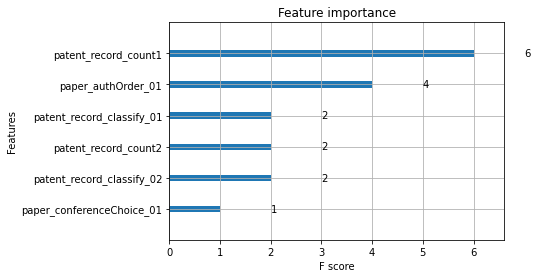

In [234]:
xgb.plot_importance(classifier)

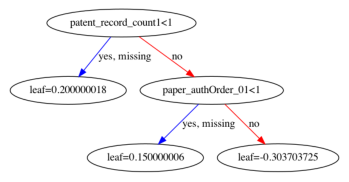

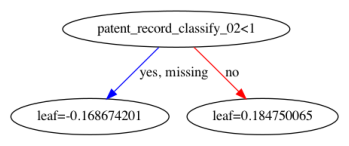

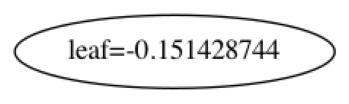

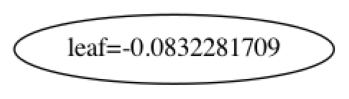

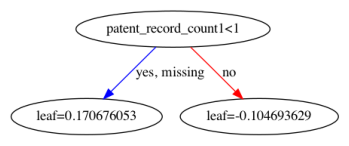

...

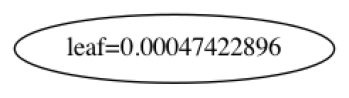

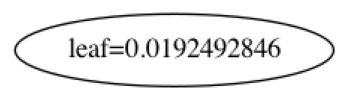

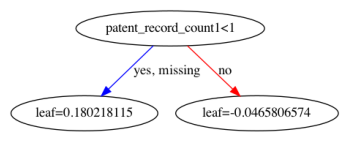

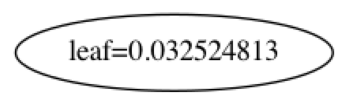

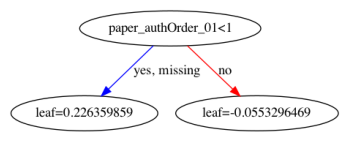

In [235]:
for i in range(0, 20):
    xgb.plot_tree(classifier, num_trees=i).figure.savefig("max_depth_9_" + str(i) + ".png")

In [237]:
from sklearn.feature_selection import SelectFromModel

In [240]:
list(zip(train_x.columns, classifier.feature_importances_))

[('paper_count1', 0.0),
 ('paper_count2', 0.0),
 ('paper_count3', 0.0),
 ('paper_authOrder_01', 0.21853079),
 ('paper_authOrder_02', 0.0),
 ('paper_authOrder_03', 0.0),
 ('paper_conferenceChoice_01', 0.11749105),
 ('paper_conferenceChoice_02', 0.0),
 ('paper_conferenceChoice_03', 0.0),
 ('paper_labels_01', 0.0),
 ('paper_labels_02', 0.0),
 ('paper_labels_03', 0.0),
 ('paper_labels_04', 0.0),
 ('paper_labels_05', 0.0),
 ('paper_authOrder_11', 0.0),
 ('paper_authOrder_12', 0.0),
 ('paper_conferenceChoice_11', 0.0),
 ('paper_conferenceChoice_12', 0.0),
 ('paper_conferenceChoice_13', 0.0),
 ('paper_labels_11', 0.0),
 ('paper_labels_12', 0.0),
 ('paper_labels_13', 0.0),
 ('paper_authOrder_21', 0.0),
 ('paper_authOrder_22', 0.0),
 ('paper_conferenceChoice_21', 0.0),
 ('paper_conferenceChoice_22', 0.0),
 ('paper_labels_21', 0.0),
 ('paper_labels_22', 0.0),
 ('patent_record_count1', 0.19919136),
 ('patent_record_count2', 0.1747788),
 ('patent_record_classify_01', 0.11174062),
 ('patent_record_

In [238]:
classifier.feature_importances_

array([0.        , 0.        , 0.        , 0.21853079, 0.        ,
       0.        , 0.11749105, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.19919136, 0.1747788 ,
       0.11174062, 0.17826736, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

In [ ]:

for thresh in thresholds:
    # 遍历所有的特征重要性得分，把每个得分作为阈值进行特征选择
    selection = SelectFromModel(model,threshold=thresh,prefit=True )
    # 构建新的训练集
    select_X_train = selection.transform(train_x)
    # 使用选择出的特征作为训练集，重新训练一个模型出来
    selection_model = XGBClassifier()
    selection_model.fit(select_X_train, y_train)
    # 对测试集进行transform()操作
    select_X_test = selection.transform(X_test)
    # 预测，评估
    y_pred = selection_model.predict(select_X_test)
    predictions = [round(value) for value in y_pred]
    accuracy = accuracy_score(y_test,predictions)
    print("Thresh=%.3f, n=%d, Accuracy: %.2f%%" % (thresh, select_X_train.shape[1], accuracy * 100.0))